In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

from IPython.display import Audio
import librosa

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn import preprocessing
from sklearn import tree
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression


from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import classification_report


$precision = \frac{TP}{TP \ + \ FP}$

$recall = \frac{TP}{TP \ + \ FN}$

$F_{1} = \frac{2 \ \times \ precision \ \times \ recall}{precision \ + \ recall}$

In [2]:
data_dir = '/Users/joshwinnes/Library/Mobile Documents/com~apple~CloudDocs/Wheaton College/fall 2024/topics in data science/data/voice_clip_selected/'
voice_feature = pd.read_csv(data_dir+"voice_feature_20241022.csv")

In [3]:
col_list_mfcc = ['mfcc_00', 'mfcc_01', 'mfcc_02', 'mfcc_03', 'mfcc_04', 'mfcc_05',
       'mfcc_06', 'mfcc_07', 'mfcc_08', 'mfcc_09', 'mfcc_10', 'mfcc_11',
       'mfcc_12', 'mfcc_13', 'mfcc_14', 'mfcc_15', 'mfcc_16', 'mfcc_17',
       'mfcc_18', 'mfcc_19', 'mfcc_20', 'mfcc_21', 'mfcc_22', 'mfcc_23',
       'mfcc_24']
col_list_f0 = ['f0_mean', 'f0_std','f0_var','f0_min','f0_max','f0_skew', 'f0_kurtosis']
col_list_zcr = ['zcr_mean','zcr_std','zcr_var','zcr_min','zcr_max','zcr_skew','zcr_kurtosis']

In [4]:
age_name = ['teens', 'twenties','thirties', 'fourties', 'fifties', 'sixties', 'seventies', 'eighties','nineties']
age_value = range(1,10)
age_dict = dict(zip(age_name, age_value))
gender_name = ["male_masculine","female_feminine"]
gender_value = [0,1]
gender_dict = dict(zip(gender_name, gender_value))
voice_feature['age'] = voice_feature['age'].map(age_dict)
voice_feature['gender'] = voice_feature['gender'].map(gender_dict)
voice_feature.dropna(inplace=True)

There are 16 clips with NA's in f0, for which we could impute the NA's by "mean" or more suitable imputation strategies. However, we knew f0 features are very important for voice analytics, imputing f0 related features may not be best for building voice models. Hence, we just drop those rows in our model building. Thus trained ML models may not handle NA in prediction, whereas in real life, we need to make our models accept NA input and not fail or exit gracefully.

## Build a speaker recognizer by classification

we will build a classifier for a speaker who has more clips in our selection (so that we can have more training data)

* client_id: '81516963704c4bbecc85d974b769a0ed4871707afd30d387fb5e4de72f9bfe97b9e5f3b3e3277d1ac2e51156907a781030de02a2eb45fa52c30e825aa1d1ebcb'
  * demo: seventies,male_masculine, Scottish English 
  * the speaker does have somewhat distinct voice but still the class imbalance is too strong


* client_id: '27c2bcb5074395819c7360c4a8711977e6258352ab80dc99bd9708f9eda0de82064daa9dad6a28ac8e543c3d6702adc2c7ad9f4ff7b4e86d399955f3b7021318'
  *  demo: thirties, male_masculine, United States English
  * We will use this one to build a speaker recognizer


* client_id: 'a33afddc9bfab2d5710efcb0a162d6e8e2ed092be3a59e2e2d4a04989829a5719b5214ed0071a65d8c597122232ff21706fdbd7ee855fb529d1cc9cba1b85d1f'
  * demo: thirties, male_masculine, United States English

In [5]:
voice_feature.groupby("client_id")[["path"]].count().sort_values(by="path", ascending=False).head(5)

,path
client_id,
81516963704c4bbecc85d974b769a0ed4871707afd30d387fb5e4de72f9bfe97b9e5f3b3e3277d1ac2e51156907a781030de02a2eb45fa52c30e825aa1d1ebcb,167
27c2bcb5074395819c7360c4a8711977e6258352ab80dc99bd9708f9eda0de82064daa9dad6a28ac8e543c3d6702adc2c7ad9f4ff7b4e86d399955f3b7021318,136
a33afddc9bfab2d5710efcb0a162d6e8e2ed092be3a59e2e2d4a04989829a5719b5214ed0071a65d8c597122232ff21706fdbd7ee855fb529d1cc9cba1b85d1f,128
b398dbe61e96ad337be48fb6c492f59722416ddc8a4e49ebcb554c24fc41eeaab6712720e243fc8a1fd792eee7266cefb0503fad3bf3261bcb593a583425106d,110
3f8c120d55b1e8fd45b4588a8e981e61040eda6923828a5f483f704ba201e745359478b3ea8d80b5c0d1798ba948d7de3a80d65f5e1a7f53ebf1a8143ab0d0eb,104


In [6]:
speaker_selected = '27c2bcb5074395819c7360c4a8711977e6258352ab80dc99bd9708f9eda0de82064daa9dad6a28ac8e543c3d6702adc2c7ad9f4ff7b4e86d399955f3b7021318'
voice_feature.query("client_id == @speaker_selected").head(1)

,f0_mean,f0_std,f0_var,f0_min,f0_max,f0_skew,f0_kurtosis,zcr_mean,zcr_std,zcr_var,...,sentence_id,sentence,up_votes,down_votes,age,gender,accents,len_in_second,sampling_rate,array_size
16099,99.409738,20.129965,405.215471,55.478474,128.194408,-0.963852,-0.063576,0.070033,0.07244,0.005248,...,dcc99eae8541d133aa05d09413149e5ce67a9f44917600...,He threw more pitches per inning than any star...,2,0,3,0,United States English,4.14,32000,132480


In [7]:
temp_clip = voice_feature.query("client_id == @speaker_selected")["path"].tolist()[0]
x, sr = librosa.load(data_dir+temp_clip,sr=None) 
#common_voice_en_33402102.mp3
Audio(data=x, rate=sr)

Adding a target column to our feature table, let's call it "speaker"

In [8]:
voice_feature['speaker'] = 1 * (voice_feature["client_id"] == speaker_selected)

In [9]:
voice_feature.speaker.value_counts()[1]/voice_feature.speaker.value_counts()[0]

0.010292114424095656

In [10]:
voice_feature.groupby("speaker").nunique().client_id[1]/voice_feature.groupby("speaker").nunique().client_id[0]

0.0011074197120708748

* this speaker accounts for 1% of the total speakers, and 0.11% or the clips.
* we need to down sample the rest of the speakers or clips

In [11]:
df1 = voice_feature.query("speaker == 1").copy().reset_index()
df2 = voice_feature.query("speaker == 0").copy().reset_index()
df2 = df2.sample(n=167*5, weights='age', replace=False, random_state=7)
voice_feature_speaker = pd.concat([df2,df1],axis=0)
voice_feature_speaker.shape

(971, 53)

In [12]:
X = voice_feature_speaker[col_list_f0 + col_list_mfcc + col_list_zcr]
#X = voice_feature_speaker[col_list_f0 + col_list_zcr]
scaler = preprocessing.MinMaxScaler().fit(X) # she is fitting the scaler to the whole X, not just the training which isn't quite as robust but is a shortcut
X = scaler.transform(X)
y = voice_feature_speaker.speaker
X_feature_name = scaler.feature_names_in_

X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.33, random_state=7)

In [13]:
tree_clf = DecisionTreeClassifier(criterion= "entropy", random_state=7,max_depth=4).fit(X_train, y_train)
mlp_clf = MLPClassifier(random_state=7, max_iter=1000, hidden_layer_sizes=(500)).fit(X_train, y_train)
nb_clf = MultinomialNB().fit(X_train,y_train)
rf_clf = RandomForestClassifier(random_state=7).fit(X_train, y_train)
lg_clf = LogisticRegression(max_iter=300,random_state=7).fit(X_train, y_train)

In [14]:
thresh = 0.5
model = rf_clf
y_pred = model.predict(X_test) #This uses the default threshhold (is it always 0.5? or does it optimize it?)
y_pred_thresh = np.array((model.predict_proba(X_test)[:, 1] > thresh).astype(int)) #this lets you give a custom threshhold
confusion_matrix(y_test,y_pred), confusion_matrix(y_test,y_pred_thresh)

(array([[270,   0],
        [ 10,  41]]),
 array([[270,   0],
        [ 10,  41]]))

In [15]:
y_test.value_counts(0)

speaker
0    270
1     51
Name: count, dtype: int64

In [16]:
thresh = 0.3
y_pred_thresh = np.array((model.predict_proba(X_test)[:, 1] > thresh).astype(int))
confusion_matrix(y_test,y_pred), confusion_matrix(y_test,y_pred_thresh)

(array([[270,   0],
        [ 10,  41]]),
 array([[268,   2],
        [  4,  47]]))

In [17]:
model = rf_clf
y_pred = model.predict(X_test)
acc_pred = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
print('Accuracy: ' + str(acc_pred))
print('ROC Score: ' + str(roc_auc))

cfm_df = pd.DataFrame()
for i, thresh in enumerate(np.arange(0.,0.5,0.01)): # enumerate(np.arrage(min, max, increment))
    y_pred_thresh = np.array((model.predict_proba(X_test)[:, 1] > thresh).astype(int)) #run the predictions with a given threshhold i
    cfm = confusion_matrix(y_test,y_pred_thresh)
    cfm_df.loc[i,"Threshold"]=thresh
    cfm_df.loc[i,"True Negative"]=cfm[0,0]
    cfm_df.loc[i,"False Positive"]=cfm[0,1]
    cfm_df.loc[i,"False Negative"]=cfm[1,0]
    cfm_df.loc[i,"True Positive"]=cfm[1,1]
cfm_df['FPR'] = cfm_df['False Positive']/(cfm_df['False Positive']+cfm_df['True Negative'])
cfm_df['TPR'] = cfm_df['True Positive']/(cfm_df['False Negative']+cfm_df['True Positive'])


Accuracy: 0.9688473520249221
ROC Score: 0.998874364560639


In [18]:
cfm_df

,Threshold,True Negative,False Positive,False Negative,True Positive,FPR,TPR
0,0.00,76.0,194.0,0.0,51.0,0.718519,1.000000
1,0.01,127.0,143.0,0.0,51.0,0.529630,1.000000
2,0.02,160.0,110.0,0.0,51.0,0.407407,1.000000
3,0.03,179.0,91.0,0.0,51.0,0.337037,1.000000
4,0.04,198.0,72.0,0.0,51.0,0.266667,1.000000
5,0.05,213.0,57.0,0.0,51.0,0.211111,1.000000
6,0.06,223.0,47.0,0.0,51.0,0.174074,1.000000
7,0.07,229.0,41.0,0.0,51.0,0.151852,1.000000
8,0.08,235.0,35.0,0.0,51.0,0.129630,1.000000
9,0.09,244.0,26.0,0.0,51.0,0.096296,1.000000


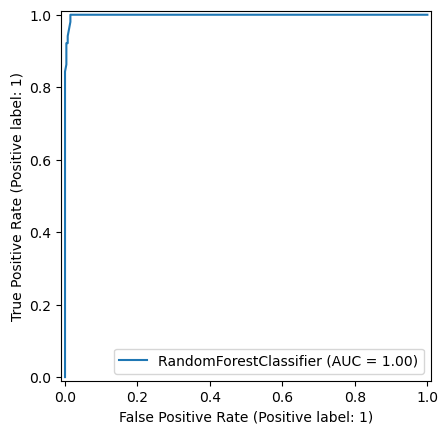

In [19]:
metrics.RocCurveDisplay.from_estimator(model, X_test, y_test)

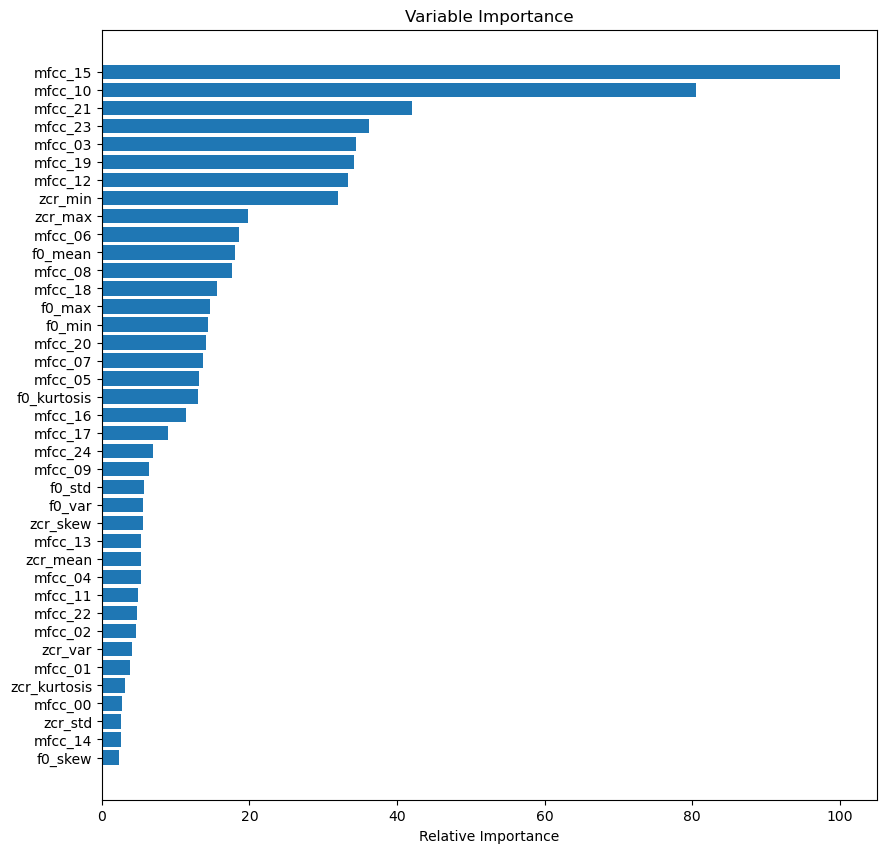

In [20]:
# Plot feature importance
model = rf_clf
feature_importance = model.feature_importances_

# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 10))
pos = np.arange(sorted_idx.shape[0]) + .8
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_feature_name[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()
plt.close()

## Recursive Feature Elimination (RFE)

In [21]:
# This basically removes the least important features recursively
from sklearn.feature_selection import RFE
rf_clf = RandomForestClassifier(random_state=7)
rf_rfe = RFE(estimator=rf_clf, n_features_to_select= 10, step=1)
rf_rfe.fit(X_train, y_train)
rf_rfe.ranking_

array([ 6, 29, 18, 13,  1, 30,  3, 24, 27, 23,  1, 11,  8,  4, 10,  5, 20,
        1, 25,  1, 19, 26,  1, 12,  9,  1,  1,  7,  1, 15,  1, 16, 28, 17,
       22,  1,  2, 14, 21])

In [22]:
# This takes the top n (from n_features_to_select above) features and makes them rank 1, everything else is ranked by importance after that
rank = []
feature = []
for x, y in sorted(zip(rf_rfe.ranking_, X_feature_name)):
    rank.append(x)
    feature.append(y)
rfe_feature_rank = pd.DataFrame({'rank':rank, 'feature':feature})
rfe_feature_rank

,rank,feature
0,1,f0_max
1,1,mfcc_03
2,1,mfcc_10
3,1,mfcc_12
4,1,mfcc_15
5,1,mfcc_18
6,1,mfcc_19
7,1,mfcc_21
8,1,mfcc_23
9,1,zcr_min


## Grid Search 

To find best parameters for a given algorithm to fit the data

In [23]:
rf_select = RandomForestClassifier(
    bootstrap=True,
    criterion='entropy',
    max_depth=15,
    max_features=5,
    min_samples_leaf=1,
    min_samples_split=6,
    n_estimators=875
)
rf_select.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=15, max_features=5,
                       min_samples_split=6, n_estimators=875)

In [24]:
tn,fp,fn,tp  = metrics.confusion_matrix(y_test, rf_select.predict(X_test)).ravel()/(len(y_test))
tn,fp,fn,tp 

(0.8411214953271028, 0.0, 0.024922118380062305, 0.13395638629283488)

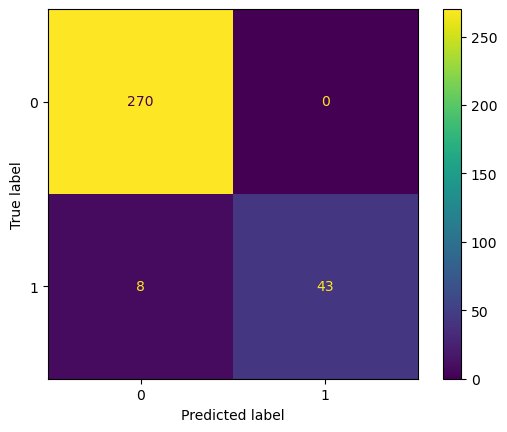

In [25]:
y_pred = rf_select.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

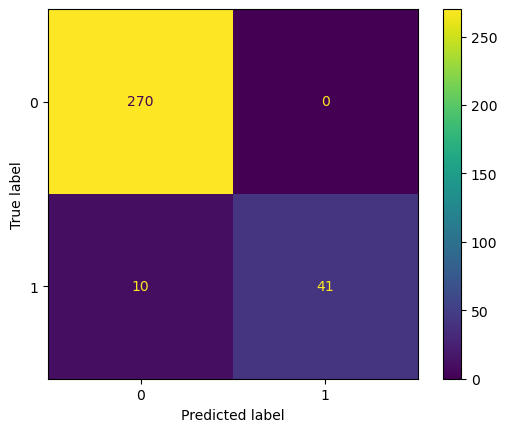

In [26]:
rf_vanila = RandomForestClassifier(random_state=7)
rf_vanila = rf_vanila.fit(X_train, y_train)
y_pred = rf_vanila.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

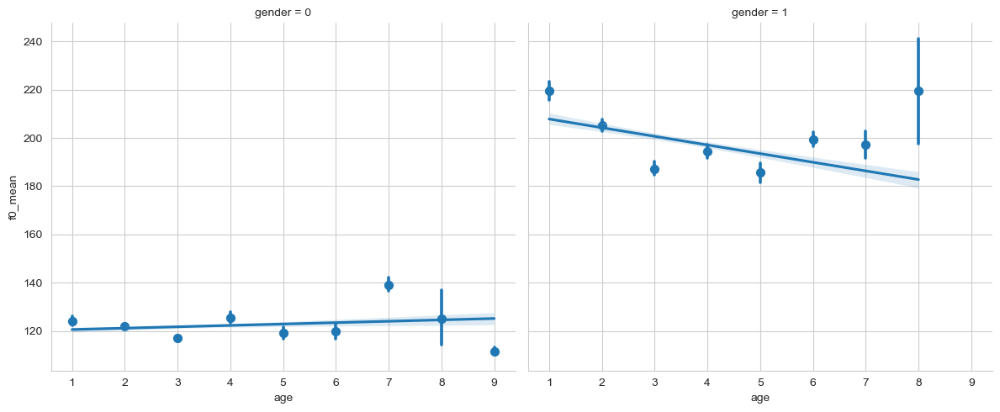

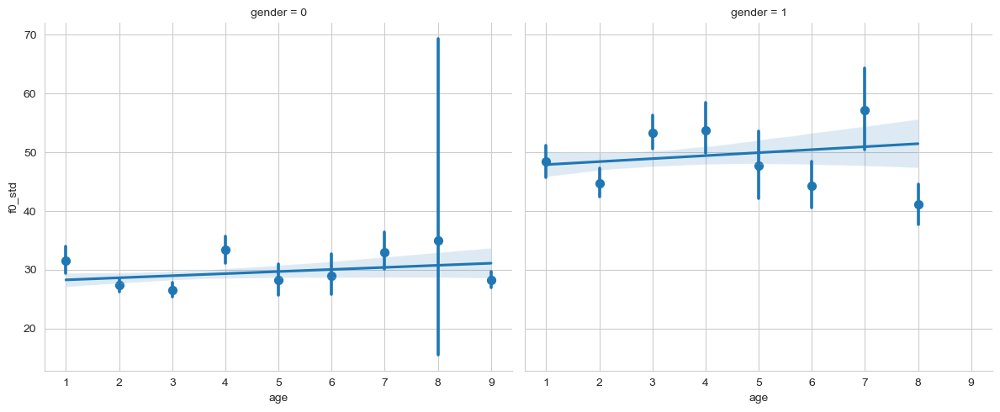

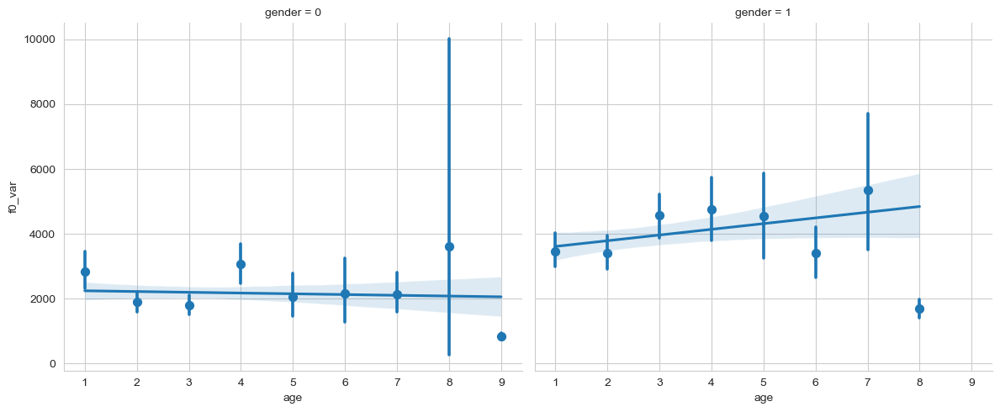

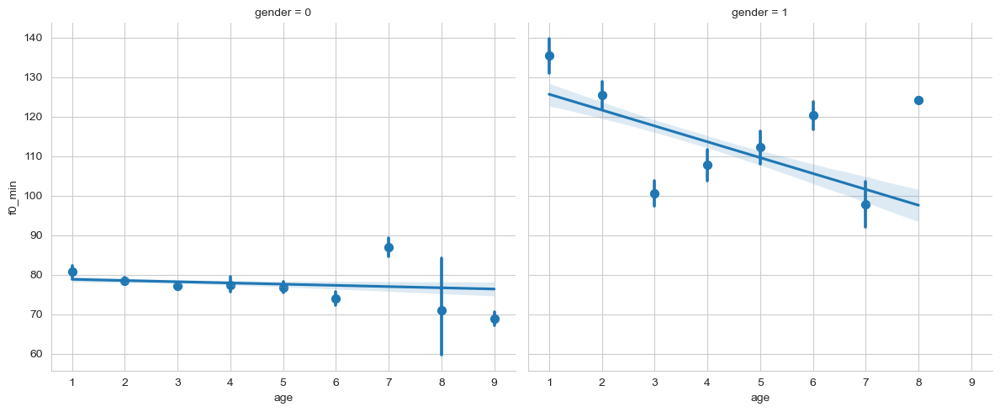

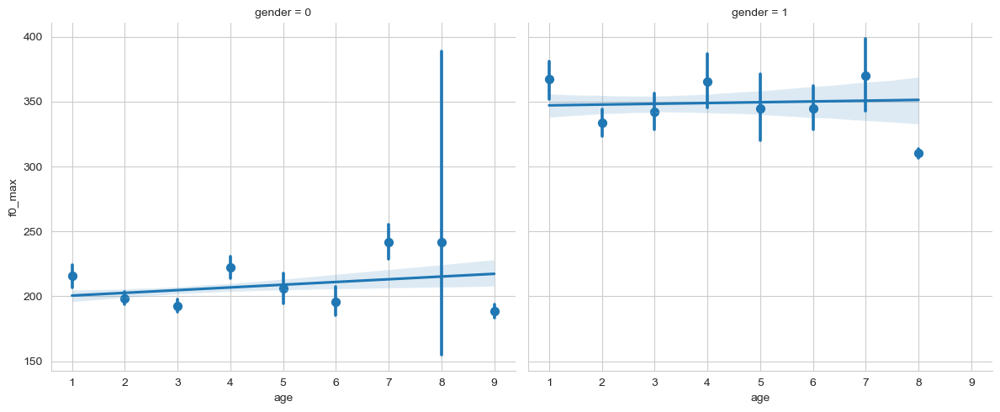

...

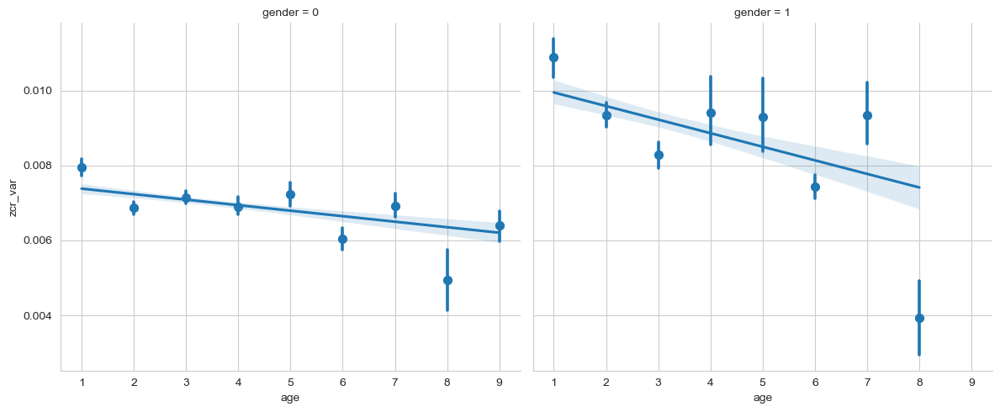

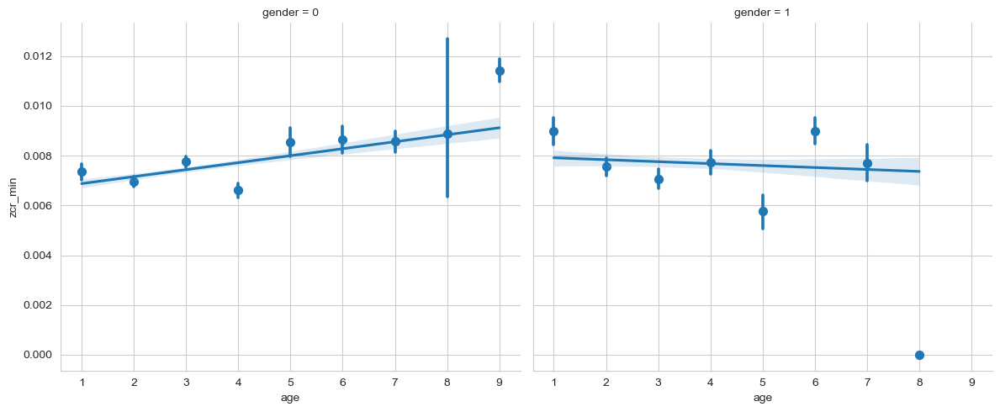

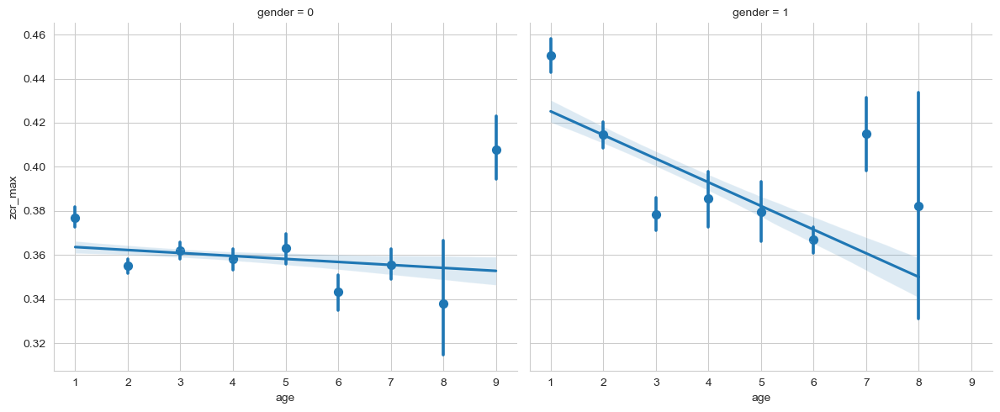

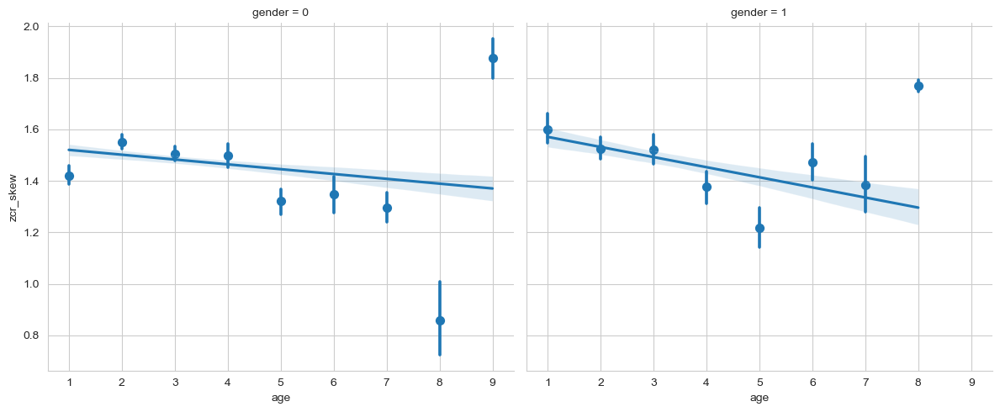

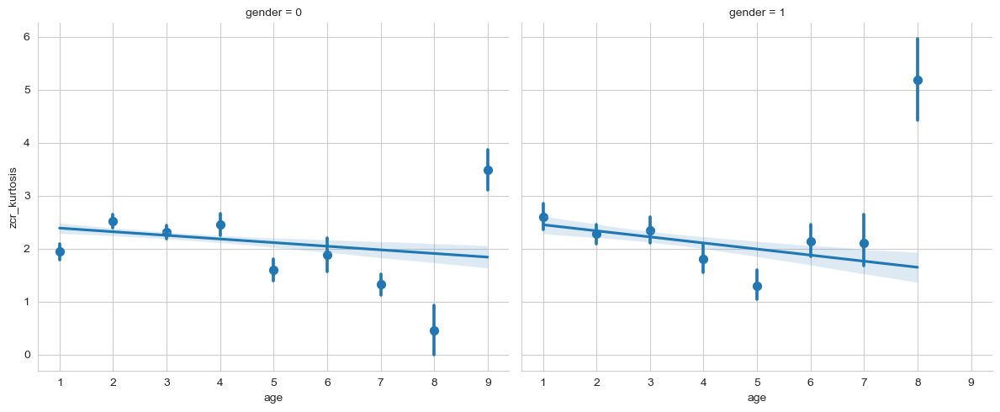

In [27]:
sns.set_style("whitegrid")
feature_col = col_list_f0 + col_list_zcr
for col in feature_col:
    sns.FacetGrid(voice_feature, col="gender", height=5, aspect=1.2).map(sns.regplot, "age", col, x_estimator=np.mean)
    plt.show()
    plt.close() 

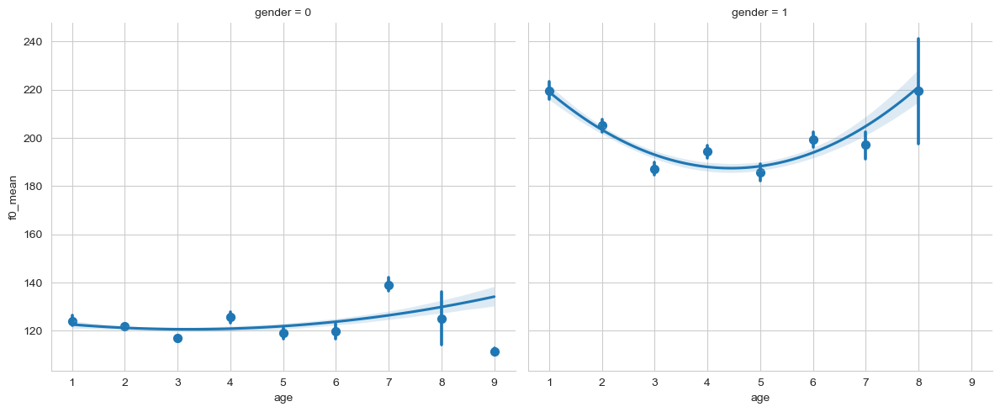

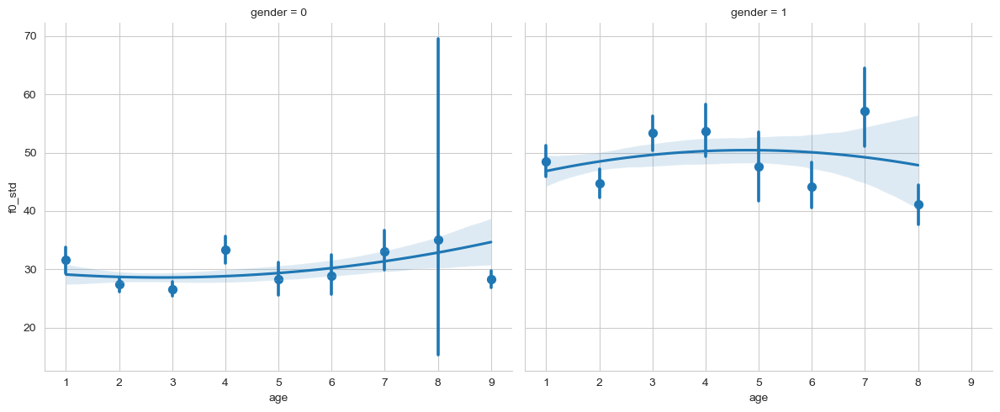

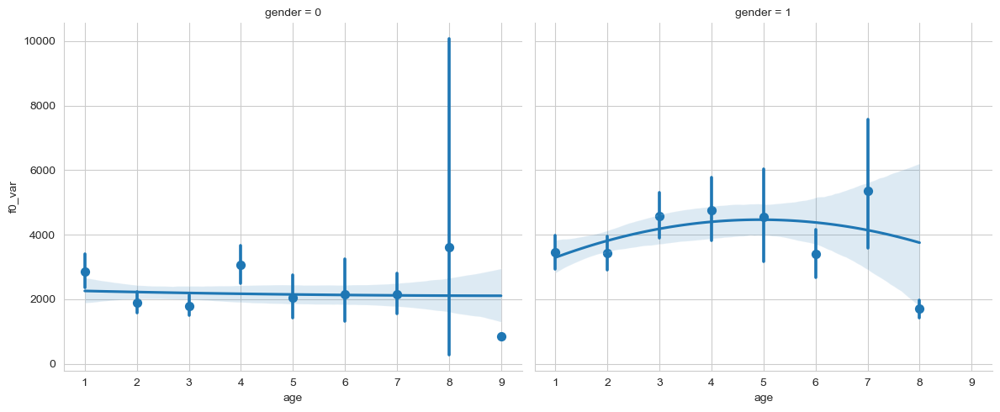

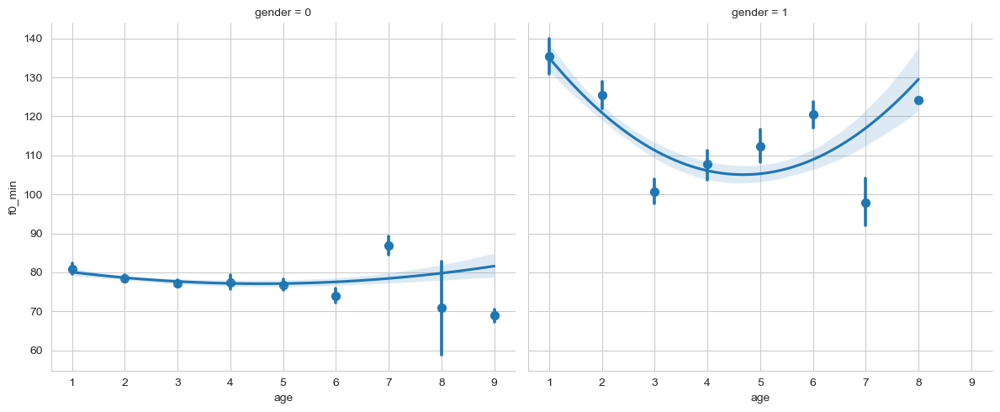

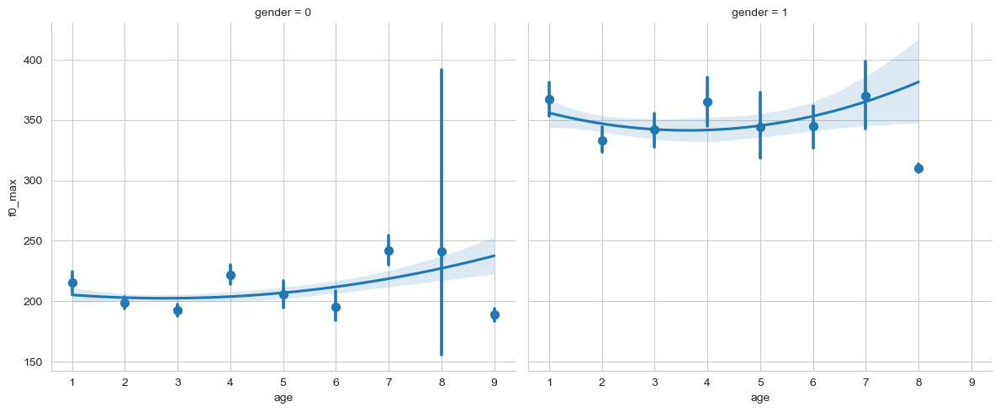

...

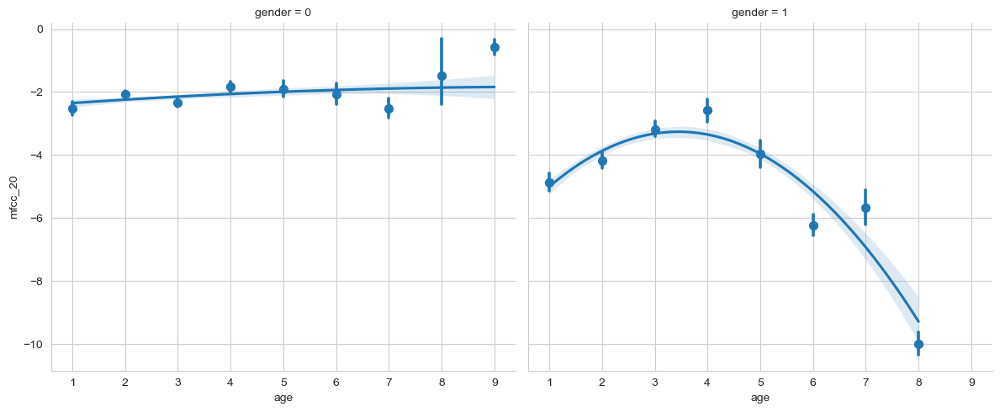

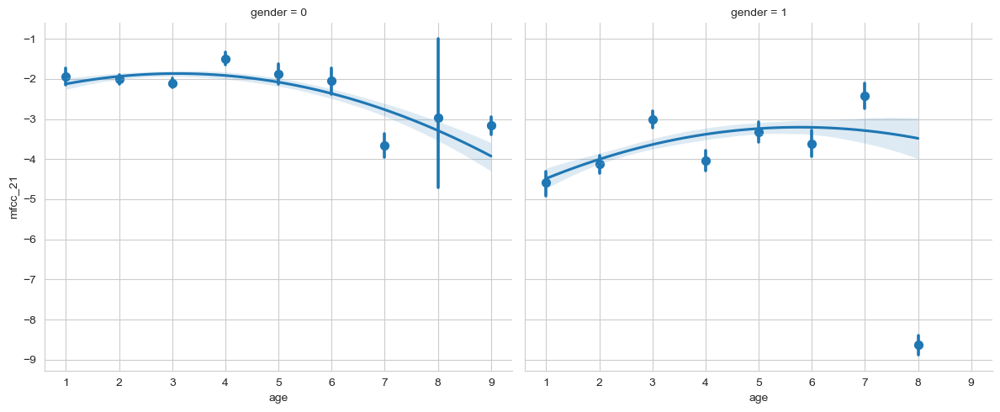

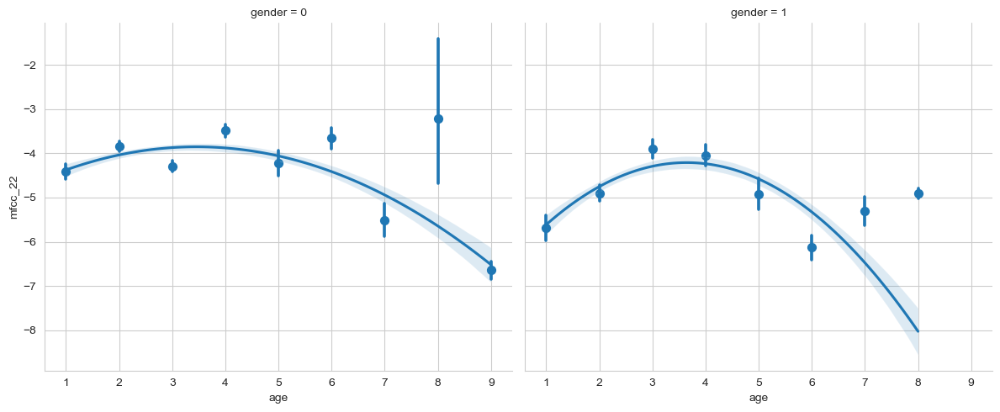

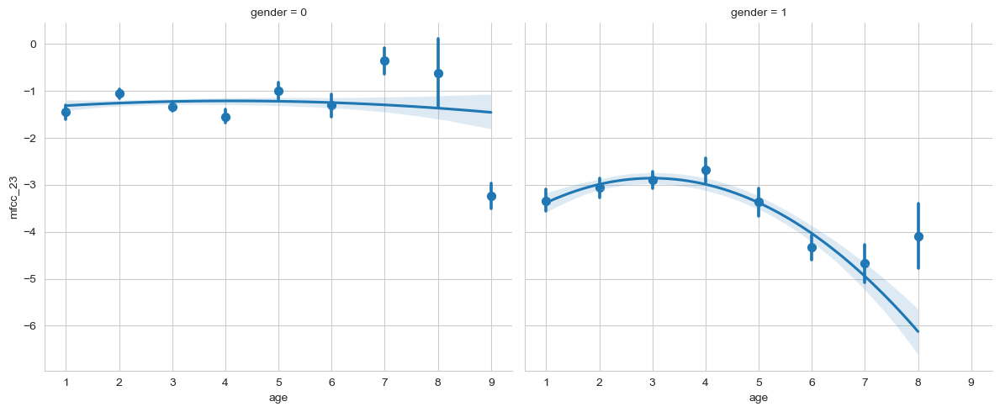

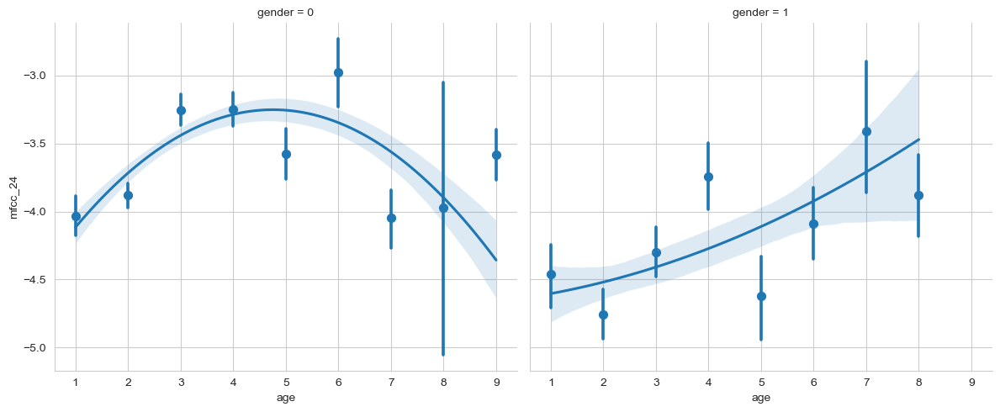

In [28]:
feature_col = col_list_f0 + col_list_zcr + col_list_mfcc
for col in feature_col:
    sns.FacetGrid(voice_feature, col="gender", height=5, aspect=1.2)\
        .map(sns.regplot, "age", col, x_estimator=np.mean, order =2)
    plt.show()
    plt.close() 

## ***SVM***

In [30]:
from sklearn.svm import SVC
svm = SVC()

In [31]:
param_grid = {
    'C' : [1,2,3],
    'kernel':['linear', 'poly', 'sigmoid'],
    'degree':[3, 4, 5, 6],
    'gamma':['scale', 'auto'],
    'coef0':[1.0],
    'shrinking':[True, False],
    'probability':[True, False],
    'cache_size':[100,250,500],
    'class_weight':[None, 'balanced'],
    'verbose':[True, False],
    'max_iter':[250, 500, 1000, 1500],
}

In [32]:
svm_select = GridSearchCV(svm, param_grid=param_grid, cv=3, verbose=1, scoring='roc_auc', n_jobs=-1)
svm_select.fit(X_train, y_train)

Fitting 3 folds for each of 13824 candidates, totalling 41472 fits
[LibSVM][LibSVM]*
optimization finished, #iter = 77
obj = -25.532219, rho = 4.159611
nSV = 46, nBSV = 32
Total nSV = 46
*
optimization finished, #iter = 155
obj = -28.243889, rho = 5.055534
nSV = 53, nBSV = 36
Total nSV = 53
*
optimization finished, #iter = 178
obj = -22.278396, rho = 4.052808
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 119
obj = -23.811053, rho = 5.311605
nSV = 48, nBSV = 32
Total nSV = 48
[LibSVM]*
optimization finished, #iter = 121
obj = -26.075959, rho = 4.169351
nSV = 46, nBSV = 31
Total nSV = 46
*
optimization finished, #iter = 49
obj = -25.846538, rho = 4.599728
nSV = 46, nBSV = 35
Total nSV = 46
*
optimization finished, #iter = 89
obj = -27.112213, rho = 4.937382
nSV = 50, nBSV = 35
Total nSV = 50
*
optimization finished, #iter = 72
obj = -21.702097, rho = 3.939541
nSV = 41, nBSV = 28
Total nSV = 41
*
optimization finished, #iter = 115
obj = -27.152128, rho = 5.220398
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM]*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM][LibSVM]*
optimization finished, #iter = 155
obj = -27.322445, rho = 5.646235
nSV = 51, nBSV = 34
Total nSV = 51
[LibSVM]*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 78
obj = -25.548730, rho = 5.322623
nSV = 46, nBSV = 33
Total nSV = 46
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 171
obj = -26.092442, rho = 5.297425
nSV = 49, nBSV = 32
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 115
obj = -26.849649, rho = 5.380121
nSV = 51, nBSV = 33
Total nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 75
obj = -96.345292, rho = 1.020234
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 58
obj = -114.572711, rho = -1.026713
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 73
obj = -94.447854, rho = 1.024836
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 65
obj = -84.330651, rho = 1.022114
nSV = 84, nBSV = 84
Total nSV = 84
[LibSVM][LibSVM]*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 72
obj = -94.402967, rho = 1.023576
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM][LibSVM]*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 227
obj = -26.372933, rho = 4.750032
nSV = 54, nBSV = 34
Total nSV = 54
*
optimization finished, #iter = 146
obj = -28.219307, rho = 4.715298
nSV = 55, nBSV = 36
Total nSV = 55
*
optimization finished, #iter = 160
obj = -27.948923, rho = 3.880003
nSV = 52, nBSV = 34
Total nSV = 52
*
optimization finished, #iter = 166
obj = -27.389981, rho = 3.825895
nSV = 48, nBSV = 34
Total nSV = 48
*
optimization finished, #iter = 121
obj = -24.333336, rho = 3.762297
nSV = 45, nBSV = 30
Total nSV = 45
*
optimization finished, #iter = 91
obj = -25.249047, rho = 5.225722
nSV = 49, nBSV = 33
Total nSV = 49
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 129
obj = -24.800973, rho = 4.158185
nSV = 49, nBSV = 30
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 112
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 289
obj = -24.656461, rho = 3.908550
nSV = 50, nBSV = 29
Total nSV = 50
*
optimization finished, #iter = 164
obj = -27.454313, rho = 4.784720
nSV = 49, nBSV = 34
Total nSV = 49
*
optimization finished, #iter = 190
obj = -27.582621, rho = 3.848968
nSV = 53, nBSV = 33
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 67
obj = -111.907579, rho = -1.107281
nSV = 117, nBSV = 111
Total nSV = 117
*
optimization finished, #iter = 232
obj = -27.921105, rho = 4.511128
nSV = 55, nBSV = 36
Total nSV = 55
*
optimization finished, #iter = 85
obj = -100.099776, rho = 1.094616
nSV = 107, nBSV = 98
Total nSV = 107
*
optimization finished, #iter = 135
obj = -25.190743, rho = 3.184243
nSV = 47, nBSV = 29
Total nSV = 47
*
optimization finished, #iter = 67
obj = -111.907579, rho = -1.107281
nSV = 117, nBSV = 111
Total nSV = 117
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM]*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM][LibSVM]*
optimization finished, #iter = 67
obj = -90.373292, rho = 1.022216
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 73
obj = -96.471465, rho = 1.025439
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 67
obj = -92.456819, rho = 1.025195
nSV = 92, nBSV = 92
Total nSV = 92
[LibSVM].*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM][LibSVM]*
optimization finished, #iter = 71
obj = -92.404173, rho = 1.022918
nSV = 92, nBSV = 92
Total nSV = 92
*
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 58
obj = -114.572711, rho = -1.026713
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 71
obj = -96.381017, rho = 1.021358
nSV = 96, nBSV = 96
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 176
obj = -24.316955, rho = 3.486243
nSV = 47, nBSV = 32
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 282
obj = -27.288619, rho = 4.694533
nSV = 53, nBSV = 34
Total nSV = 53
*
optimization finished, #iter = 193
obj = -29.055871, rho = 4.347057
nSV = 55, nBSV = 35
Total nSV = 55
*
optimization finished, #iter = 75
obj = -96.385256, rho = 1.021891
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 125
obj = -25.363842, rho = 4.195077
nSV = 48, nBSV = 33
Total nSV = 48
*
optimization finished, #iter = 243
obj = -24.135564, rho = 3.708226
nSV = 50, nBSV = 29
Total nSV = 50
*
optimization finished, #iter = 66


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 62
obj = -78.943197, rho = 1.074881
nSV = 83, nBSV = 77
Total nSV = 83
*
optimization finished, #iter = 67
obj = -23.823305, rho = 3.768117
nSV = 44, nBSV = 30
Total nSV = 44
*
optimization finished, #iter = 94
obj = -23.602315, rho = 3.614327
nSV = 46, nBSV = 30
Total nSV = 46
*
optimization finished, #iter = 91
obj = -25.552053, rho = 4.407890
nSV = 48, nBSV = 34
Total nSV = 48
*
optimization finished, #iter = 147
obj = -22.056135, rho = 4.189642
nSV = 42, nBSV = 25
Total nSV = 42
*
optimization finished, #iter = 91
obj = -22.467439, rho = 4.006490
nSV = 42, nBSV = 26
Total nSV = 42
*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 131
obj = -25.810970, rho = 4.758700
nSV = 48, nBSV = 33
Total nSV = 48
*
optimization finished, #iter = 217
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 70
obj = -88.379302, rho = 1.021790
nSV = 88, nBSV = 88
Total nSV = 88
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 71
obj = -94.362422, rho = 1.020416
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 58
obj = -114.572711, rho = -1.026713
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]**
optimization finished, #iter = 73

optimization finished, #iter = 160
obj = -94.319373, rho = 1.018713
obj = -23.761536, rho = 4.021479
nSV = 94, nBSV = 94
nSV = 46, nBSV = 30
Total nSV = 94
Total nSV = 46
*
optimization finished, #iter = 146
obj = -22.214937, rho = 4.099619
[LibSVM]nSV = 46, nBSV = 28
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 58
obj = -114.572711, rho = -1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 147
obj = -25.733963, rho = 4.885335
nSV = 53, nBSV = 36
Total nSV = 53
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 106
obj = -27.001631, rho = 3.809853
nSV = 50, nBSV = 34
Total nSV = 50
*
optimization finished, #iter = 63
obj = -80.255188, rho = 1.018436
nSV = 80, nBSV = 80
Total nSV = 80
*
optimization finished, #iter = 150
obj = -28.083679, rho = 4.238939
nSV = 51, nBSV = 35
Total nSV = 51
*
optimization finished, #iter = 125
obj = -27.666039, rho = 4.042641
nSV = 50, nBSV = 35
Total nSV = 50
[LibSVM][LibSVM]*
optimization finished, #iter = 149
obj = -23.014727, rho = 3.083890
nSV = 44, nBSV = 27
Total nSV = 44
*
optimization finished, #iter = 125
obj = -22.969793, rho = 4.266146
nSV = 44, nBSV = 30
Total nSV = 44
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 267
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 71
obj = -84.797952, rho = 1.073294
nSV = 90, nBSV = 83
Total nSV = 90
*
optimization finished, #iter = 75
obj = -94.436316, rho = 1.091066
nSV = 100, nBSV = 91
Total nSV = 100
*
optimization finished, #iter = 65
obj = -84.789747, rho = 1.077819
nSV = 90, nBSV = 83
Total nSV = 90
*
optimization finished, #iter = 68
obj = -82.599993, rho = 1.075081
nSV = 88, nBSV = 81
Total nSV = 88
*
optimization finished, #iter = 68
obj = -84.881317, rho = 1.077536
nSV = 91, nBSV = 84
Total nSV = 91
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 80
obj = -94.412294, rho = 1.088935
nSV = 103, nBSV = 90
Total nSV = 103
*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 70
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 67
obj = -111.907579, rho = -1.107281
nSV = 117, nBSV = 111
Total nSV = 117
*
optimization finished, #iter = 81
obj = -90.475036, rho = 1.080186
nSV = 96, nBSV = 88
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117
*
optimization finished, #iter = 73
obj = -94.443982, rho = 1.101918
nSV = 100, nBSV = 91
Total nSV = 100
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 72
obj = -88.636874, rho = 1.079660
nSV = 94, nBSV = 88
Total nSV = 94
*
optimization finished, #iter = 69
obj = -84.818765, rho = 1.079553
nSV = 90, nBSV = 83
Total nSV = 90
*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117
*
optimization finished, #iter = 70
obj = -78.929338, rho = 1.079946
nSV = 84, nBSV = 75
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 264
obj = -0.003063, rho = 1.971857
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM][LibSVM]*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 153
obj = -25.849668, rho = 3.858410
nSV = 48, nBSV = 30
Total nSV = 48
*
optimization finished, #iter = 125
obj = -21.230437, rho = 3.186614
nSV = 43, nBSV = 27
Total nSV = 43
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 138
obj = -23.991412, rho = 3.491168
nSV = 47, nBSV = 28
Total nSV = 47
*
optimization finished, #iter = 142
obj = -23.162769, rho = 3.868308
nSV = 45, nBSV = 28
Total nSV = 45
*
optimization finished, #iter = 78
obj = -23.653067, rho = 4.651579
nSV = 41, nBSV = 27
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 21

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 58
obj = -114.572711, rho = -1.026713
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM]*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 76
obj = -94.413080, rho = 1.024389
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM]*
optimization finished, #iter = 217
obj = -0.003038, rho = 2.069467
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

**
optimization finished, #iter = 60
obj = -82.393996, rho = 1.023904
nSV = 82, nBSV = 82
Total nSV = 82

optimization finished, #iter = 69
obj = -90.388066, rho = 1.022779
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 70
obj = -92.440381, rho = 1.024808
nSV = 92, nBSV = 92
Total nSV = 92
*[LibSVM]
optimization finished, #iter = 66
obj = -82.320856, rho = 1.021067
nSV = 82, nBSV = 82
Total nSV = 82
*
optimization finished, #iter = 124
obj = -28.357250, rho = 5.433603
nSV = 52, nBSV = 32
Total nSV = 52
*
optimization finished, #iter = 84
obj = -27.410902, rho = 5.066804
nSV = 51, nBSV = 37
Total nSV = 51
*
optimization finished, #iter = 144
obj = -25.566369, rho = 5.534043
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 66
obj = -90.424663, rho = 1.023773
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 58
obj = -114.57

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 67
obj = -92.400592, rho = 1.022744
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 65
obj = -92.444201, rho = 1.024396
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 78
obj = -96.349707, rho = 1.019869
nSV = 96, nBSV = 96
Total nSV = 96
[LibSVM][LibSVM]*
optimization finished, #iter = 72
obj = -94.384933, rho = 1.021370
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 66
obj = -90.425831, rho = 1.024324
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM][LibSVM]*
optimization finished, #iter = 103
obj = -25.963825, rho = 3.702517
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #iter = 169
obj = -26.974627, rho = 3.643599
nSV = 50, nBSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117

optimization finished, #iter = 72
obj = -88.710936, rho = 1.091740
nSV = 95, nBSV = 87
Total nSV = 95
[LibSVM]*
optimization finished, #iter = 210
obj = -30.888461, rho = 5.122889
nSV = 62, nBSV = 42
Total nSV = 62
*
optimization finished, #iter = 74
obj = -86.621286, rho = 1.072130
nSV = 94, nBSV = 83
Total nSV = 94
*
optimization finished, #iter = 189
obj = -29.144771, rho = 5.190889
nSV = 58, nBSV = 37
Total nSV = 58
*
optimization finished, #iter = 253
obj = -30.584176, rho = 4.941069
nSV = 61, nBSV = 41
Total nSV = 61
**
optimization finished, #iter = 150
obj = -29.405226, rho = 5.179213
nSV = 56, nBSV = 39
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 136
obj = -27.339496, rho = 5.426543
nSV = 54, nBSV = 40
Total nSV = 54
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66

optimization finished, #iter = 131


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 66
obj = -84.661511, rho = 1.074781
nSV = 89, nBSV = 82
Total nSV = 89
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 229
obj = -28.490211, rho = 4.370632
nSV = 58, nBSV = 37
Total nSV = 58
*
optimization finished, #iter = 83
obj = -95.888125, rho = 1.087042
nSV = 102, nBSV = 94
Total nSV = 102
*
optimization finished, #iter = 153
obj = -28.291144, rho = 4.926574
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 224
obj = -28.555971, rho = 4.346063
nSV = 58, nBSV = 40
Total nSV = 58
*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 214
obj = -28.937605, rho = 4.649342
nSV = 59, nBSV = 38
Total nSV = 59
*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.753986, rho = 3.631544
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 215
obj = -26.976399, rho = 4.221212
nSV = 58, nBSV = 37
Total nSV = 58
*
optimization finished, #iter = 110
obj = -29.811747, rho = 5.539240
nSV = 57, nBSV = 41
Total nSV = 57
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.855448, rho = 3.722942
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.013486, rho = 3.015484
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.040903, rho = 3.414820
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization fin

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 343
obj = -0.964614, rho = 3.146536
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 334
obj = -1.130689, rho = 3.971573
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 485
obj = -0.864210, rho = 3.581482
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.989620, rho = 2.554712
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.970855, rho = 2.704267
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 392
obj = -0.984879, rho = 2.452959
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.953487, rho = 2.591382
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*.*
optimization finished, #iter = 415
obj = -0.940912, rho = 3.233697
nSV = 30, nBSV = 0
Total nSV = 30
.*
optimization finished, #iter = 353
obj = -342.351855, rho = 1.002457
*.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 295
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
obj = -0.831279, rho = 3.390812
nSV = 24, nBSV = 0
Total nSV = 24
*.
*
optimization finished, #iter = 352
obj = -341.756206, rho = 1.003147
nSV = 342, nBSV = 297
Total nSV = 342

optimization finished, #iter = 321
obj = -0.998057, rho = 3.070753
nSV = 26, nBSV = 0
Total nSV = 26
*.*
optimization finished, #iter = 399
obj = -0.933891, rho = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
.*
optimization finished, #iter = 348
obj = -346.174156, rho = -0.979136
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.252901, rho = 1.008841
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 339
obj = -338.811254, rho = -0.981019
nSV = 339, nBSV = 338
Total nSV = 339
[LibSVM]*
optimization finished, #iter = 341
obj = -341.777839, rho = -0.979971
nSV = 342, nBSV = 341
Total nSV = 342
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.312213, rho = 1.008612
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*.*
optimization finished, #iter = 347
obj = -341.704541, rho = 1.003367
nSV = 342, nBSV = 341
Total nSV = 342
.
*
optimization finished, #iter = 357
obj = -332.425221, rho = 1.003935
nSV = 333, nBSV = 289
Total nSV = 333
WARN: libsvm Solver reached max_iter


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 340
obj = -341.813321, rho = -0.980448
nSV = 342, nBSV = 340
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 345
obj = -345.567816, rho = -0.979151
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 346
obj = -346.398735, rho = -0.978514
nSV = 347, nBSV = 346
Total nSV = 347
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 344
obj = -344.467213, rho = -0.978986
nSV = 345, nBSV = 344
Total nSV = 345
.
*
optimization finished, #iter = 355
obj = -332.400937, rho = 1.004066
nSV = 333, nBSV = 289
Total nSV = 333
[LibSVM]*
optimization finished, #iter = 216
obj = -30.218508, rho = 5.391667
nSV = 59, nBSV = 42
Total nSV = 59
*
optimization finished, #iter = 119
obj = -29.924440, rho = 5.420888
nSV = 56, nBSV = 40
Total nSV = 56
*
optimization finished, #iter = 150
obj = -31.564050, rho = 6.002291
nSV = 62, nBSV = 43
Total nSV = 62

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.
*
optimization finished, #iter = 348
obj = -340.034524, rho = 1.002541
nSV = 341, nBSV = 305
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 230
obj = -27.875643, rho = 4.765683
nSV = 54, nBSV = 37
Total nSV = 54
*
optimization finished, #iter = 173
obj = -29.539862, rho = 5.438529
nSV = 59, nBSV = 41
Total nSV = 59
*
optimization finished, #iter = 165
obj = -28.952931, rho = 4.359388
nSV = 55, nBSV = 39
Total nSV = 55
*
optimization finished, #iter = 298
obj = -31.978583, rho = 5.103572
nSV = 63, nBSV = 42
Total nSV = 63
*
optimization finished, #iter = 133
obj = -29.536623, rho = 5.109741
nSV = 57, nBSV = 41
Total nSV = 57
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.
*
optimization finished, #iter = 353
obj = -332.422080, rho = 1.003998
nSV = 333, nBSV = 292
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -248.961659, rho = 0.343835
nSV = 250, nBSV = 247
Total nSV = 250
WARN: libsvm Solver reached max_iter*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434

optimization finished, #iter = 250
obj = -248.927930, rho = 0.510794
nSV = 250, nBSV = 246
Total nSV = 250
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -253.100926, rho = 0.612490
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 171
obj = -98.233687, rho = 2.993795
nSV = 155, nBSV = 146
Total nSV = 155
[LibSVM]*
optimization finished, #iter = 344
obj = -343.291393, rho = -0.979421
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 184
obj = -103.728593, rho = 2.701919
nSV = 159, nBSV = 149
Total nSV = 159
.*
optimization finished, #iter = 434
[LibSVM]obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 174
obj = -101.185094, rho = 2.421514
nSV = 158, nBSV = 148
Total nSV = 158
.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 43
Total nSV = 66
*
optimization finished, #iter = 162
obj = -92.046211, rho = 2.487180
nSV = 144, nBSV = 133
Total nSV = 144
*
optimization finished, #iter = 208
obj = -110.930511, rho = -2.811998
nSV = 173, nBSV = 162
Total nSV = 173
[LibSVM

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 171
obj = -104.837586, rho = 2.206971
nSV = 160, nBSV = 153
Total nSV = 160
*
optimization finished, #iter = 164
obj = -94.918301, rho = 2.045629
nSV = 149, nBSV = 138
Total nSV = 149
*
optimization finished, #iter = 343
obj = -343.261091, rho = -0.981475
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 180
obj = -103.071345, rho = 2.511516
nSV = 160, nBSV = 151
Total nSV = 160
.*
optimization finished, #iter = 353
obj = -334.778074, rho = 1.003425
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 165
obj = -97.627865, rho = 2.655507
nSV = 153, nBSV = 143
Total nSV = 153
[LibSVM]*
optimization finished, #iter = 177
obj = -99.487917, rho = 2.692185
nSV = 156, nBSV = 144
Total nSV = 156
*
optimization finished, #iter = 173
obj = -99.155156, rho = 2.452851
nSV = 153, nBSV = 144
Total nSV = 153
*
optimization finished, #iter = 344
obj = -344.416197, rho = -0.978195
nSV = 345, nBSV = 344
Total nSV = 345
.*
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 342
obj = -293.394395, rho = 0.945177
nSV = 343, nBSV = 341
Total nSV = 343
*
optimization finished, #iter = 345
obj = -289.720133, rho = 0.115696
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 345
obj = -289.803647, rho = 0.228511
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 330
obj = -281.916534, rho = 1.038061
nSV = 327, nBSV = 326
Total nSV = 327
*
optimization finished, #iter = 339
obj = -293.102545, rho = 0.071076
nSV = 340, nBSV = 339
Total nSV = 340
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.605821, rho = -0.064507
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM]*
optimization finished, #iter = 330
obj = -283.300370, rho = 1.046629
nSV = 327, nBSV = 326
Total nSV = 327
*
optimization finished, #iter = 342
obj = -290.199651, rho = 0.098050
nSV = 345, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 216
obj = -115.756674, rho = -2.426927
nSV = 180, nBSV = 169
Total nSV = 180
[LibSVM]*
optimization finished, #iter = 340
obj = -288.526022, rho = 0.111455
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 337
obj = -279.931581, rho = 1.021342
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 332
[LibSVM]obj = -276.861436, rho = 1.072724
nSV = 320, nBSV = 319
Total nSV = 320
*
optimization finished, #iter = 213
obj = -29.876863, rho = 5.677232
nSV = 59, nBSV = 40
Total nSV = 59
*
optimization finished, #iter = 346
obj = -288.634757, rho = 0.193918
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 229
obj = -27.367870, rho = 4.579156
nSV = 57, nBSV = 35
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 344
obj = -286.060929, rho = 0.899010
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 116
obj = -29.472737, rho = 5.823073
nSV = 56, nBSV = 42
Total nSV = 56
*
optimization finished, #iter = 226
obj = -29.164445, rho = 5.116164
nSV = 57, nBSV = 36
Total nSV = 57
*
optimization finished, #iter = 341
obj = -289.268951, rho = 1.077447
nSV = 335, nBSV = 333
Total nSV = 335
*
optimization finished, #iter = 312
obj = -258.453941, rho = 1.188750
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 344
obj = -290.472355, rho = 0.938144
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 342
obj = -287.938373, rho = 0.845218
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -28.540470, rho = 4.631712
nSV = 58, nBSV = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 344
obj = -291.515737, rho = 0.086504
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -240.912998, rho = 0.500343
nSV = 257, nBSV = 250
Total nSV = 257
[LibSVM][LibSVM]*
optimization finished, #iter = 159
obj = -31.167648, rho = 5.689471
nSV = 61, nBSV = 43
Total nSV = 61
*
optimization finished, #iter = 132
obj = -29.747375, rho = 5.815537
nSV = 55, nBSV = 41
Total nSV = 55
*
optimization finished, #iter = 124
obj = -28.852899, rho = 4.962574
nSV = 55, nBSV = 39
Total nSV = 55
*
optimization finished, #iter = 204
obj = -29.212162, rho = 5.217921
nSV = 55, nBSV = 37
Total nSV = 55
*
optimization finished, #iter = 153
obj = -29.033724, rho = 5.648238
nSV = 58, nBSV = 39
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*[LibSVM]
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 168
obj = -29.050698, rho = 4.931721
nSV = 56, nBSV = 39
Total nSV = 56
*
optimization finished, #iter = 148
obj = -27.911392, rho = 5.295572
nSV = 54, nBSV = 38
Total nSV = 54
[LibSVM]*
optimization finished, #iter = 219
obj = -32.597063, rho = 5.239026
nSV = 64, nBSV = 44
Total nSV = 64
*
optimization finished, #iter = 146
obj = -30.426541, rho = 5.251943
nSV = 58, nBSV = 43
Total nSV = 58
*
optimization finished, #iter = 129
obj = -29.306615, rho = 4.889061
nSV = 54, nBSV = 41
Total nSV = 54
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 105
obj = -28.043745, rho = 5.500580
nSV = 54, nBSV = 38
Total nSV = 54
*
optimization finished, #iter = 119
obj = -30.822423, rho = 5.934051
nSV = 58, nBSV = 40
Total nSV = 58
*
optimization finish

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.136540, rho = 2.258682
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 276
obj = -0.134319, rho = 2.783798
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 238
obj = -0.119647, rho = 2.056606
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 258
obj = -0.121755, rho = 2.441245
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 221
obj = -0.095367, rho = 3.055392
nSV = 26, nBSV = 0
Total nSV = 26
.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.134492, rho = 2.371490
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.925771, rho = 0.510166
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.951516, rho = 0.511229
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 345
obj = -291.738084, rho = 0.131064
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM].*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 340
obj = -0.148029, rho = 3.056622
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM][LibSVM]*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
*


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -248.264188, rho = 0.012523
nSV = 251, nBSV = 247
Total nSV = 251
*
optimization finished, #iter = 345
obj = -345.511897, rho = -0.980276
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 345
obj = -343.308653, rho = -0.980283
nSV = 344, nBSV = 343
Total nSV = 344
*.
*
optimization finished, #iter = 356
obj = -309.275820, rho = 1.005495
nSV = 310, nBSV = 269
Total nSV = 310
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.771544, rho = 0.010349
nSV = 252, nBSV = 248
Total nSV = 252
*
optimization finished, #iter = 343
obj = -342.152462, rho = -0.980577
nSV = 343, nBSV = 342
Total nSV = 343
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.
*
optimization finished, #iter = 347
obj = -333.992424, rho = 1.002522
nSV = 335, nBSV = 291
Total nSV = 335
.*
optimization finished, #iter = 353
obj = -342.376791, rho = 1.002761
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 345
obj = -345.322193, rho = -0.979761
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimization finished, #iter = 347
obj = -346.203587, rho = -0.978171
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 345
obj = -345.112444, rho = -0.980365
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
**.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433

optimization finished, #iter = 342
obj = -343.016850, rho = -0.979857
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 346
obj = -345.058244, rho = -0.979792
nSV = 346, nBSV = 345
Total nSV = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -248.127309, rho = 0.514995
nSV = 250, nBSV = 246
Total nSV = 250
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 346
obj = -346.444291, rho = -0.977134
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.321775, rho = -0.319592
nSV = 252, nBSV = 249
Total nSV = 252
[LibSVM]*.
*
optimization finished, #iter = 349
obj = -334.164262, rho = 1.003460
nSV = 335, nBSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 345
obj = -345.630934, rho = -0.978675
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 365
obj = -309.314209, rho = 1.005570
nSV = 310, nBSV = 309
Total nSV = 310
*
optimization finished, #iter = 342
obj = -342.123368, rho = -0.979650
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM].*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 205
obj = -31.609802, rho = 5.328643
nSV = 63, nBSV = 40
Total nSV = 63
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 181
obj = -30.939820, rho = 5.679839
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 307
obj = -28.806124, rho = 4.993813
nSV = 59, nBSV = 39
Total nSV = 59
[LibSVM]*
optimization finished, #iter = 257
obj = -29.740132, rho = 5.317442
nSV = 63, nBSV = 40
Total nSV = 63
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -27.582518, rho = 4.887826
nSV = 55, nBSV = 35
Total nSV = 55
*
optimization finished, #iter = 258
obj = -29.575885, rho = 4.894981
nSV = 59, nBSV = 39
Total nSV = 59
*.*
optimization finished, #iter = 362
obj = -30.641633, rho = 4.582216
nSV = 65, nBSV = 42
Total nSV = 65
*
optimization finished, #iter = 207
obj = -26.615699, rho = 4.711713
nSV = 57, nBSV = 37
Total nSV = 57
[LibSVM][LibSVM]*
optimization finished, #iter = 220
obj = -29.983841, rho = 4.503901
nSV = 59, nBSV = 4

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 184
obj = -78.680913, rho = 2.277137
nSV = 129, nBSV = 114
Total nSV = 129
*
optimization finished, #iter = 141
obj = -74.324591, rho = 2.388603
nSV = 119, nBSV = 107
Total nSV = 119
[LibSVM]*
optimization finished, #iter = 156
obj = -78.621883, rho = 2.185807
nSV = 126, nBSV = 115
Total nSV = 126
*
optimization finished, #iter = 168
obj = -76.362873, rho = 2.206637
nSV = 124, nBSV = 112
Total nSV = 124
*
optimization finished, #iter = 177
obj = -85.441562, rho = -3.159868
nSV = 139, nBSV = 128
Total nSV = 139
*
optimization finished, #iter = 155
obj = -82.398450, rho = 2.803170
nSV = 130, nBSV = 122
Total nSV = 130
*
optimization finished, #iter = 173
obj = -80.229782, rho = 2.020056
nSV = 127, nBSV = 113
Total nSV = 127
[LibSVM]*
optimization finished, #iter = 174
obj = -75.962154, rho = 2.303833
nSV = 125, nBSV = 110
Total nSV = 125
[LibSVM]*
optimization finished, #iter = 176
obj = -90.384613, rho = -2.554328
nSV = 143, nBSV = 132
Total nSV = 143
[L

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 177
obj = -85.441562, rho = -3.159868
nSV = 139, nBSV = 128
Total nSV = 139
*
optimization finished, #iter = 148
obj = -80.600509, rho = 2.542112
nSV = 130, nBSV = 118
Total nSV = 130
*
optimization finished, #iter = 173
obj = -81.723229, rho = 2.572622
nSV = 133, nBSV = 119
Total nSV = 133
[LibSVM]*
optimization finished, #iter = 147
obj = -82.976533, rho = 2.206859
nSV = 132, nBSV = 123
Total nSV = 132
*
optimization finished, #iter = 176
obj = -90.384613, rho = -2.554328
nSV = 143, nBSV = 132
Total nSV = 143
[LibSVM]*
optimization finished, #iter = 177
obj = -85.441562, rho = -3.159868
nSV = 139, nBSV = 128
Total nSV = 139
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -236.529058, rho = 0.642897
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 160
obj = -71.554676, rho = 2.435511
nSV = 121, nBSV = 103
Total nSV = 121
[LibSVM]*
optimization finished, #iter = 153
obj = -82.988161, rho = 2.441085
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 155
obj = -83.052908, rho = 2.342066
nSV = 131, nBSV = 118
Total nSV = 131
*
optimization finished, #iter = 342
obj = -290.718655, rho = 0.962243
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 176
obj = -90.384613, rho = -2.554328
nSV = 143, nBSV = 132
Total nSV = 143
*
optimization finished, #iter = 342
obj = -289.815241, rho = 0.924665
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 341
obj = -290.644720, rho = 0.990540
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 338
obj = -293.382119, rho = 0.004009
nSV = 339, nBSV = 338
Total nSV = 339
*
optimization finished, #iter = 344
obj = -292.040672, rho = 0.100008
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 342
obj = -286.747269, rho = 0.938615
nSV = 341, nBSV = 340
Total nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 340
obj = -287.590275, rho = 0.072143
nSV = 342, nBSV = 340
Total nSV = 342
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 339
obj = -286.934541, rho = 1.026248
nSV = 335, nBSV = 334
Total nSV = 335
[LibSVM]*
optimization finished, #iter = 343
obj = -289.335088, rho = 0.925870
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 343
obj = -295.021724, rho = 0.074645
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 346
obj = -286.857328, rho = 0.176835
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
**
optimization finished, #iter = 340
obj = -283.348594, rho = 1.048767
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM]*
optimization finished, #iter = 333
obj = -284.430698, rho = 1.123100
nSV = 327, nBSV = 326
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 139
obj = -26.638978, rho = 4.501288
nSV = 53, nBSV = 38
Total nSV = 53
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
*
optimization finished, #iter = 198
obj = -30.634678, rho = 5.162054
nSV = 57, nBSV = 38
Total nSV = 57
*
optimization finished, #iter = 184
obj = -30.607891, rho = 6.138629
nSV = 61, nBSV = 40
Total nSV = 61
*
optimization finished, #iter = 118
obj = -29.734203, rho = 5.525820
nSV = 56, nBSV = 40
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 231
obj = -29.871466, rho = 5.739941
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 326
obj = -275.113556, rho = 1.086199
nSV = 319, nBSV = 316
Total nSV = 319
[LibSVM].*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 43
Total nSV = 66
[LibSVM][LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 130
obj = -24.966257, rho = 5.041758
nSV = 51, nBSV = 32
Total nSV = 51
*
optimization finished, #iter = 138
obj = -31.706777, rho = 6.003166
nSV = 58, nBSV = 43
Total nSV = 58
[LibSVM]*
optimization finished, #iter = 126
obj = -30.758631, rho = 4.512795
nSV = 56, nBSV = 41
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 208
obj = -0.019269, rho = 2.731233
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019855, rho = 2.833788
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 312
obj = -0.015768, rho = 2.423951
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 141
obj = -0.017926, rho = 2.386308
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 237
obj = -0.019443, rho = 2.311590
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 244
obj = -0.017823, rho = 2.002743
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 252
obj = -0.017896, rho = 2.704436
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM][LibSVM]*
optimizati

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 346
obj = -326.501875, rho = 1.003873
nSV = 327, nBSV = 326
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.870388, rho = 0.344806
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM].
*
optimization finished, #iter = 353
obj = -326.623579, rho = 1.004147
nSV = 327, nBSV = 285
Total nSV = 327
*
optimization finished, #iter = 343
obj = -342.818237, rho = -0.981124
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.186265, rho = 0.343506
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 346
obj = -346.322754, rho = -0.977412
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.831409, rho = 0.979611
nSV = 258, nBSV = 250
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.711224, rho = 0.342116
nSV = 253, nBSV = 25

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 347
obj = -345.135103, rho = -0.978080
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM].*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 347
obj = -347.402615, rho = -0.978736
nSV = 348, nBSV = 347
Total nSV = 348
*.*
optimization finished, #iter = 347
obj = -345.108257, rho = -0.978902
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 343
obj = -339.516690, rho = -0.982045
nSV = 340, nBSV = 339
Total nSV = 340
[LibSVM]*.
*
optimization finished, #iter = 349
obj = -319.623064, rho = 1.004058
nSV = 320, nBSV = 279
Total nSV = 320
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 342
obj = -342.922933, rho = -0.979263
nSV = 344, nBSV = 342
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter*.
*
optimization finished, #iter = 352
obj = -309.280150, rho = 1.005098
nSV = 310, nBSV = 270
Total nSV = 310
[LibSVM]
optimization finished, #iter = 250
obj = -251.932858, rho = 0.509345
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 343
obj = -342.937543, rho = -0.979580
nSV = 344, nBSV = 343
Total nSV = 344
*.
*
optimization finished, #iter = 349
obj = -340.131497, rho = 1.003513
nSV = 341, nBSV = 297
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.940666, rho = 0.614376
nSV = 255, nBSV = 250
Total nSV = 255
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 347
obj = -345.189115, rho = -0.980090
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.681930, rho = 0.514383
nSV = 254, nBSV = 250
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 170
obj = -30.573569, rho = 5.971562
nSV = 62, nBSV = 41
Total nSV = 62
*
optimization finished, #iter = 212
obj = -30.943281, rho = 4.404813
nSV = 60, nBSV = 41
Total nSV = 60
*
optimization finished, #iter = 162
obj = -30.113911, rho = 4.929209
nSV = 58, nBSV = 42
Total nSV = 58
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 228
obj = -26.640982, rho = 4.855976
nSV = 52, nBSV = 34
Total nSV = 52
*
optimization finished, #iter = 217
obj = -31.075951, rho = 5.653168
nSV = 60, nBSV = 41
Total nSV = 60
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -234.605814, rho = 0.044347
nSV = 254, nBSV = 250
[LibSVM]Total nSV = 254
[LibSVM]*
optimization finished, #iter = 153
obj = -71.960307, rho = -2.613859
nSV = 122, nBSV = 107
Total nSV = 122
*
optimization finished, #iter = 153
obj = -71.960307, rho = -2.613859
nSV = 122, nBSV = 107
Total nSV = 122
*
optimization finished, #iter = 142
obj = -56.656083, rho = 3.211537
nSV = 96, nBSV = 85
Total nSV = 96
*
optimization finished, #iter = 320
obj = -266.235814, rho = 1.164519
nSV = 304, nBSV = 303
Total nSV = 304
*
optimization finished, #iter = 346
obj = -287.869815, rho = 0.160701
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 171
obj = -67.454816, rho = -3.280545
nSV = 112, nBSV = 98
Total nSV = 112
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 345
obj = -292.765191, rho = 0.169031
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 327
obj = -272.491735, rho = 1.021278
nSV = 320, nBSV = 319
Total nSV = 320
*
optimization finished, #iter = 339
obj = -283.743107, rho = 1.009977
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 337
obj = -284.357313, rho = 1.004563
*nSV = 333, nBSV = 332

optimization finished, #iter = 432
Total nSV = 333
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 335
obj = -282.175863, rho = 1.039593
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 339
obj = -291.568546, rho = 0.058480
nSV = 340, nBSV = 338
Total nSV = 340
[LibSVM]WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 344
obj = -292.578137, rho = 0.095006
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.63

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.922596, rho = 0.044691
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 343
obj = -290.793072, rho = 0.024503
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.162633, rho = 0.825780
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 346
obj = -293.689829, rho = 0.181251
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.942011, rho = 1.232834
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 338
obj = -286.063292, rho = 1.005049
nSV = 333, nBSV = 332
Total nSV = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 157
obj = -29.391309, rho = 4.312147
nSV = 61, nBSV = 42
Total nSV = 61
*
optimization finished, #iter = 154
obj = -28.369885, rho = 4.553648
nSV = 57, nBSV = 37
Total nSV = 57
*
optimization finished, #iter = 340
obj = -292.382179, rho = 0.088855
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 202
obj = -28.613487, rho = 4.059778
nSV = 59, nBSV = 39
Total nSV = 59
*
optimization finished, #iter = 166
obj = -29.414426, rho = 4.670400
nSV = 60, nBSV = 42
Total nSV = 60
*
optimization finished, #iter = 190
obj = -28.791786, rho = 4.885378
nSV = 56, nBSV = 35
Total nSV = 56
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 342
obj = -292.251731, rho = 0.882228
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 309
obj = -0.002540, rho = 2.051903
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 257
obj = -0.002322, rho = 2.078960
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 197
obj = -0.003066, rho = 1.996325
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 325
obj = -0.003139, rho = 2.247034
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 170
obj = -0.002647, rho = 2.166927
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 223
obj = -0.002701, rho = 2.145930
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 237
obj = -0.003034, rho = 1.993727
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 214
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.946694, rho = 0.511946
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.444986, rho = 0.509310
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM].*
optimization finished, #iter = 348
obj = -342.345935, rho = 1.002679
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 288
obj = -0.003035, rho = 2.252737
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 198
obj = -0.002723, rho = 2.369290
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 329
obj = -0.003211, rho = 2.133797
nSV = 36, nBSV = 0
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.609458, rho = -0.322224
nSV = 252, nBSV = 249
Total nSV = 252
*
optimization finished, #iter = 339
obj = -0.002871, rho = 2.033665
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.
*
optimization finished, #iter = 348
obj = -334.785311, rho = 1.002955
nSV = 336, nBSV = 291
Total nSV = 336
[LibSVM]*
optimization finished, #iter = 346
obj = -346.419226, rho = -0.979947
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 345
obj = -345.392119, rho = -0.977293
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 341
obj = -341.705937, rho = -0.980574
nSV = 342, nBSV = 341
Total nSV = 342
.*
optimization finished, #iter = 353
obj = -334.659067, rho = 1.002176
nSV = 336, nBSV = 335
Total nSV = 336
.
*
optimization finished, #iter = 349
obj = -345.333668, rho = -0.976781
nSV = 346, nBSV = 300
Total nSV = 346
.*
optimization finished, #iter = 347
obj = -345.176113, rho = -0.977636
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]**
optimization finished, #iter = 346
obj = -345.168147, rho = -0.979914
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.273601, rho = 0.009058
nSV = 252, nBSV = 250
Total nSV = 252
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.424592, rho = 0.341695
nSV = 253, nBSV = 250
Total nSV = 253
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.973681, rho = 0.509340
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 246
obj = -28.793331, rho = 5.611902
nSV = 57, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 161
obj = -27.496185, rho = 5.095232
nSV = 54, nBSV = 37
Total nSV = 54
*
optimization finished, #iter = 288
obj = -28.864565, rho = 4.779741
nSV = 59, nBSV = 38
Total nSV = 59
[LibSVM]*
optimization finished, #iter = 119
obj = -31.906574, rho = 5.697090
nSV = 60, nBSV = 44
Total nSV = 60
*
optimization finished, #iter = 224
obj = -27.754075, rho = 4.620101
nSV = 58, nBSV = 39
Total nSV = 58
*
optimization finished, #iter = 121
obj = -28.617305, rho = 5.613652
nSV = 56, nBSV = 39
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 128
obj = -29.658568, rho = 4.862577
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 325
obj = -29.730265, rho = 4.191719
nSV = 62, nBSV = 39
Total nSV = 62
*
optimization finished, #iter = 129
obj = -29.780273, rho = 5.744062
nSV = 57, nBSV = 40
Total nSV = 57
*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 140
obj = -52.119189, rho = 2.700978
nSV = 89, nBSV = 74
Total nSV = 89
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 156
obj = -57.682514, rho = -2.834826
nSV = 99, nBSV = 84
Total nSV = 99
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.683515, rho = 0.549157
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 327
obj = -277.409690, rho = 1.115419
nSV = 320, nBSV = 319
Total nSV = 320
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.572023, rho = 0.382668
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM][LibSVM]*
optimization finished, #iter = 129
obj = -54.504738, rho = -3.221618
nSV = 93, nBSV = 78
Total nSV = 93
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.884956, rho = -0.005218
nSV = 255, nBSV = 250
Total nSV = 255
WARN: 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*[LibSVM]
optimization finished, #iter = 339
obj = -278.445013, rho = 1.067996
nSV = 329, nBSV = 327
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 332
obj = -276.154416, rho = 1.094194
nSV = 318, nBSV = 316
Total nSV = 318
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.827601, rho = 0.816229
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 346
obj = -290.875713, rho = 0.135260
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.575573, rho = 0.170427
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 344
obj = -292.074855, rho = 0.188370
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 336
obj = -277.809872, rho = 0.981568
nSV = 328, nBSV = 327
Total nSV = 328
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.765096, rho = 0.806386
nSV = 254, nBSV = 250
Total nSV = 254

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 134
obj = -25.010982, rho = 3.130282
nSV = 46, nBSV = 29
Total nSV = 46
*
optimization finished, #iter = 120
obj = -28.182140, rho = 4.158683
nSV = 53, nBSV = 36
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 89
obj = -21.211991, rho = 3.480492
nSV = 43, nBSV = 27
Total nSV = 43
*
optimization finished, #iter = 209
obj = -28.280600, rho = 4.234970
nSV = 52, nBSV = 34
Total nSV = 52
*
optimization finished, #iter = 144
obj = -24.721794, rho = 3.679309
nSV = 45, nBSV = 29
Total nSV = 45
*
optimization finished, #iter = 159
obj = -23.032957, rho = 5.057425
nSV = 44, nBSV = 27
Total nSV = 44
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 132
obj = -25.297059, rho = 4.073825
n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 199
obj = -28.987860, rho = 5.597561
nSV = 55, nBSV = 37
Total nSV = 55
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 193
obj = -26.232799, rho = 3.797532
nSV = 48, nBSV = 32
Total nSV = 48
*
optimization finished, #iter = 123
obj = -22.903350, rho = 3.213561
nSV = 43, nBSV = 30
Total nSV = 43
*
optimization finished, #iter = 345
obj = -292.310289, rho = 0.150445
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 242
obj = -27.484986, rho = 4.378539
nSV = 54, nBSV = 33
Total nSV = 54
*
optimization finished, #iter = 142
obj = -27.101001, rho = 4.677362
nSV = 50, nBSV = 33
Total nSV = 50
*
optimization finished, #iter = 263
obj = -28.177525, rho = 4.461828
nSV = 53, nBSV = 36
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 345
obj = -294.034744, rho = 0.177193
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM][LibSVM]*
optimization finished, #iter = 163
obj = -28.728205, rho = 5.544188
nSV = 53, nBSV = 36
Total nSV = 53
*
optimization finished, #iter = 143
obj = -27.217325, rho = 5.479701
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 104
obj = -24.637290, rho = 5.501131
nSV = 46, nBSV = 32
Total nSV = 46
*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.057252, rho = -2.670672
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*.*
optimization finished, #iter = 424
obj = -0.966824, rho = 2.830830
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM][LibSVM]*.*
optimization finished, #iter = 359
obj = -1.053307, rho = 3.486232
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 220
obj = -0.935289, rho = 3.927640
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*
optimization finished, #iter = 74
*
optimization finished, #iter = 66
obj = -84.332974, rho = 1.020969
nSV = 84, nBSV = 84
Total nSV = 84
obj = -96.462331, rho = 1.024976
nSV = 96, nBSV = 96
Total nSV = 96
*.*
optimization finished, #iter = 414
obj = -0.980925, rho = 3.194287
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 214
obj = -0.743498, rho = 2.761210
nSV = 23, nBSV = 0


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 117
obj = -29.072567, rho = 5.497526
nSV = 52, nBSV = 35
Total nSV = 52
[LibSVM]*
optimization finished, #iter = 192
obj = -25.161316, rho = 4.150230
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #iter = 74
obj = -90.353016, rho = 1.021780
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 77
obj = -94.371635, rho = 1.021768
nSV = 94, nBSV = 94
Total nSV = 94
**
optimization finished, #iter = 74
obj = -94.427302, rho = 1.024171
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM][LibSVM]*
optimization finished, #iter = 118
obj = -26.780235, rho = 5.874369
nSV = 53, nBSV = 35
Total nSV = 53

optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
T

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 79
obj = -21.226379, rho = 4.246942
nSV = 42, nBSV = 26
Total nSV = 42
*
optimization finished, #iter = 107
obj = -24.298687, rho = 4.547322
nSV = 45, nBSV = 31
Total nSV = 45
[LibSVM]*
optimization finished, #iter = 74
obj = -84.773234, rho = 1.074668
nSV = 90, nBSV = 82
Total nSV = 90
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 73
obj = -82.716870, rho = 1.076746
nSV = 88, nBSV = 78
Total nSV = 88
*
optimization finished, #iter = 81
obj = -88.739541, rho = 1.079276
nSV = 95, nBSV = 85
Total nSV = 95
*
optimization finished, #iter = 75
obj = -92.668998, rho = 1.085508
nSV = 98, nBSV = 89
Total nSV = 98
[LibSVM]*
optimization finished, #iter = 73
obj = -88.860954, rho = 1.088304
nSV = 94, nBSV = 85
Total nSV = 94
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 152
obj = -27.084985, rho = 4.406436
nSV = 50, nBSV = 34
Total nSV = 50
**
optimization finished, #iter = 92
obj = -26.631584, rho = 4.917620
nSV = 51, nBSV = 37
Total nSV = 51

optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 258
obj = -26.479607, rho = 4.369422
nSV = 51, nBSV = 32
Total nSV = 51
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM][LibSVM]*
optimization finished, #iter = 247
obj = -0.131792, rho = 2.079549
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 354
obj = -0.148641, rho = 2.788255
nSV = 30, nBSV = 0
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 140
obj = -26.274194, rho = 3.980789
nSV = 50, nBSV = 31
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM]*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 62
obj = -26.681956, rho = 4.707946
nSV = 47, nBSV = 35
Total nSV = 47
*
optimization finished, #iter = 150
obj = -25.234719, rho = 5.795381
nSV = 52, nBSV = 33
Total nSV = 52
*
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 77
obj = -86.730789, rho = 1.066371
nSV = 93, nBSV = 83
Total nSV = 93
[LibSVM]*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 72
obj = -90.554381, rho = 1.105053
nSV = 95, nBSV = 89
Total nSV = 95
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 200
obj = -22.506464, rho = 2.961896
nSV = 46, nBSV = 28
Total nSV = 46
*
optimization finished, #iter = 102
obj = -20.298410, rho = 4.480076
nSV = 40, nBSV = 24
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finish

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 75
obj = -90.663570, rho = 1.076964
nSV = 97, nBSV = 85
Total nSV = 97
*
optimization finished, #iter = 74
obj = -92.585900, rho = 1.102665
nSV = 98, nBSV = 91
Total nSV = 98
[LibSVM]**
optimization finished, #iter = 128
obj = -25.360019, rho = 4.125344
nSV = 48, nBSV = 31
Total nSV = 48

optimization finished, #iter = 72
obj = -82.947920, rho = 1.092292
nSV = 90, nBSV = 81
Total nSV = 90
*
optimization finished, #iter = 94
obj = -22.461779, rho = 4.358548
nSV = 46, nBSV = 30
Total nSV = 46
*
optimization finished, #iter = 132
obj = -22.522000, rho = 4.587904
nSV = 45, nBSV = 24
Total nSV = 45
*
optimization finished, #iter = 83
obj = -92.523855, rho = 1.092106
nSV = 101, nBSV = 90
Total nSV = 101
*
optimization finished, #iter = 112
obj = -23.236593, rho = 3.362196
nSV = 45, nBSV = 28
Total nSV = 45
*
optimization finished, #iter = 127
obj = -23.539960, rho = 4.132009
nSV = 45, nBSV = 31
Total nSV = 45
*
optimization finished, #iter = 74
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 304
obj = -0.019431, rho = 2.308667
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 274
obj = -0.017267, rho = 2.158132
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM].*
optimization finished, #iter = 355
[LibSVM]obj = -0.018269, rho = 2.099795
nSV = 33, nBSV = 0
Total nSV = 33
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 302

optimization finished, #iter = 250
obj = -0.020316, rho = -2.267421
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 245
obj = -0.014241, rho = 2.373225
nSV = 26, nBSV = 0
Total nSV = 26
obj = -0.016997, rho = 2.303532
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 184
obj = -0.016103, rho = 2.606439
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 319
obj = -0.018609, rho = 2.464035
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 281
obj = -0.016965, rho = 2.354206
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 183
obj = -26.623063, rho = 4.160245
nSV = 51, nBSV = 32
Total nSV = 51
*
optimization finished, #iter = 56
obj = -74.332502, rho = 1.023640
nSV = 74, nBSV = 74
Total nSV = 74
[LibSVM]*
optimization finished, #iter = 110
obj = -27.618763, rho = 4.014812
nSV = 51, nBSV = 34
Total nSV = 51
*
optimization finished, #iter = 176
obj = -24.785952, rho = 4.153972
nSV = 48, nBSV = 30
Total nSV = 48
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 75
obj = -94.344274, rho = 1.020378
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM][LibSVM]*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 96
obj = -25.864071, rho = 5.950191
nSV = 50, nBSV = 32
Total nSV = 50
*
optimization finished, #iter = 109
obj = -27.968280, rho = 5.133525
nSV = 52, nBSV = 36
Total nSV = 52
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 67
obj = -111.907579, rho = -1.107281
nSV = 117, nBSV = 111
Total nSV = 117
[LibSVM][LibSVM]*
optimization finished, #iter = 113
obj = -24.348726, rho = 3.973281
nSV = 45, nBSV = 27
Total nSV = 45
*
optimization finished, #iter = 175
obj = -27.398218, rho = 4.172745
nSV = 50, nBSV = 35
Total nSV = 50
*
optimization finished, #iter = 177
obj = -19.184053, rho = 3.992507
nSV = 40, nBSV = 23
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 146
obj = -25.017360, rho = 4.635616
nSV = 47, nBSV = 33
Total nSV = 47
*
optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002604, rho = 2.414012
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 219
obj = -0.002995, rho = 2.131152
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 215
obj = -0.003018, rho = 2.180286
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 188
obj = -0.002984, rho = 2.633685
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003289, rho = -2.187573
nSV = 39, nBSV = 0
Total nSV = 39
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31

optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 123
obj = -25.692523, rho = 3.779821
nSV = 50, nBSV = 33
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 136
obj = -26.916478, rho = 4.323764
nSV = 47, nBSV = 33
Total nSV = 47
*
optimization finished, #iter = 113
obj = -25.593441, rho = 4.127553
nSV = 50, nBSV = 33
Total nSV = 50
*
optimization finished, #iter = 76
obj = -98.443979, rho = 1.023535
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization finished, #iter = 108
obj = -26.625904, rho = 3.930671
nSV = 49, nBSV = 31
Total nSV = 49
*
optimization finished, #iter = 188
obj = -28.231627, rho = 3.898812
nSV = 50, nBSV = 34
Total nSV = 50
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 157
obj = -32.129939, rho = 5.537550
nSV = 62, nBSV = 44
Total nSV = 62
*
optimization finished, #iter = 149
obj = -28.740156, rho = 4.941931
nSV = 53, nBSV = 37
Total nSV = 53
*
optimization finished, #iter = 204
obj = -26.336356, rho = 5.577201
nSV = 55, nBSV = 36
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 162
obj = -31.279733, rho = 5.133770
nSV = 63, nBSV = 43
Total nSV = 63
**
optimization finished, #iter = 162
obj = -30.604348, rho = 5.326508
*
optimization finished, #iter = 74
nSV = 56, nBSV = 40
Total nSV = 56
obj = -80.914717, rho = 1.072626
nSV = 88, nBSV = 75
Total nSV = 88

optimization finished, #iter = 81
obj = -86.801038, rho = 1.077782
nSV = 94, nBSV = 82
Total nSV = 94
*
optimization finished, #iter = 97
obj = -28.088578, rho = 4.604421
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 202
obj = -33.48

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM][LibSVM][LibSVM]Total nSV = 25
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 178
obj = -29.540085, rho = 4.280321
nSV = 58, nBSV = 40
Total nSV = 58
*
optimization finished, #iter = 195
obj = -0.926369, rho = 3.595062
nSV = 23, nBSV = 0
Total nSV = 23
.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 291
obj = -29.159172, rho = 4.884266
nSV = 64, nBSV = 40
Total nSV = 64
[LibSVM]*
optimization finished, #iter = 210
obj = -28.205572, rho = 4.746579
nSV = 57, nBSV = 39
Total nSV = 57
[LibSVM]*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
*
optimization finished, #iter = 156
obj = -28.623717, rho = 4.513579
nSV = 56, nBSV = 40
Total nSV = 56


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.509740, rho = 0.613281
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM]*
optimization finished, #iter = 310
obj = -0.866312, rho = 3.617591
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 521
obj = -0.750602, rho = 2.638740
nSV = 32, nBSV = 0
Total nSV = 32
.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.795773, rho = 1.007846
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 346
obj = -341.949991, rho = -0.980312
nSV = 343, nBSV = 341
Total nSV = 343
WARN: libsvm Solver reached max_iter[LibSVM]*
optimization finished, #iter = 343
obj = -342.926588, rho = -0.980166
nSV = 344, nBSV = 343
Total nSV = 344

optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 347
obj = -346.121364, rho = -0.978246
nSV = 347, nBSV = 346
Total nSV = 347

*
optimization finished, #iter = 366
obj = -309.452992, rho = 1.007367
nSV = 310, nBSV = 270
Total nSV = 310
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.312944, rho = 1.009858
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 344
obj = -344.406354, rho = -0.980134
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.263870, rho = 1.007280
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 344
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 346
obj = -345.186741, rho = -0.979230
nSV = 346, nBSV = 345
Total nSV = 346

optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM][LibSVM].
*
optimization finished, #iter = 356
obj = -312.147903, rho = 1.004756
nSV = 313, nBSV = 274
Total nSV = 313
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM][LibSVM]*.*
optimization finished, #iter = 347
obj = -342.360685, rho = 1.002616
nSV = 343, nBSV = 342
Total nSV = 343
*.
*
optimization finished, #iter = 349
obj = -319.153857, rho = 1.005259
nSV = 320, nBSV = 279
Total nSV = 320
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.831409, rho = 0.979611
nSV = 258, nBSV = 25

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.602613, rho = 5.250918
nSV = 56, nBSV = 37
Total nSV = 56
*
optimization finished, #iter = 145
obj = -28.814055, rho = 5.297489
nSV = 54, nBSV = 38
Total nSV = 54
*
optimization finished, #iter = 137
obj = -31.138570, rho = 5.492361
nSV = 59, nBSV = 42
Total nSV = 59
*
optimization finished, #iter = 147
obj = -28.132763, rho = 5.651816
nSV = 54, nBSV = 37
Total nSV = 54
*
optimization finished, #iter = 127
obj = -29.396112, rho = 5.858503
nSV = 56, nBSV = 39
Total nSV = 56
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 202
obj = -28.748101, rho = 4.607029
nSV = 59, nBSV = 39
Total nSV = 59
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.771514, rho = 4.9212

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 43
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
.**
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66

optimization finished, #iter = 343
*
optimization finished, #iter = 433
obj = -343.014361, rho = -0.979922
nSV = 344, nBSV = 343
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
Total nSV = 344
[LibSVM][LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 181
obj = -30.328850, rho = 4.596845
nSV = 60, nBSV = 42
Total nSV = 60
*
optimization finished, #iter = 222
obj = -27.680882, rho = 4.461496
nSV = 58, nBSV = 37
Total nSV = 58
*[LibSVM]
optimization finished, #iter = 151
obj = -27.767681, rho = 5.181510
nSV = 58, nBSV = 40
Total nSV = 58
*.*
opti

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]*
optimization finished, #iter = 345
obj = -292.877489, rho = 0.130790
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 175
obj = -104.303323, rho = 2.340073
nSV = 162, nBSV = 153
Total nSV = 162
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -231.254674, rho = 0.476322
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 172
obj = -101.576357, rho = 2.442432
nSV = 159, nBSV = 151
Total nSV = 159

optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 189
obj = -105.305595, rho = 2.208375
nSV = 164, nBSV = 153
Total nSV = 164
**
optimization finished, #iter = 187
obj = -106.211350, rho = 2.273361
nSV = 164, nBSV = 155
Total nSV = 164

optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -230.616669, rho = 0.259669
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 342
obj = -288.799235, rho = 0.935454
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.510532, rho = 0.929319
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 177
*
optimization finished, #iter = 341
obj = -290.281820, rho = 0.993075
nSV = 341, nBSV = 340
Total nSV = 341
obj = -103.646860, rho = 2.310755
nSV = 162, nBSV = 153
Total nSV = 162
[LibSVM]*
optimization finished, #iter = 344
obj = -292.605349, rho = 0.186799
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 170
obj = -103.139074, rho = 2.427569
nSV = 162, nBSV = 152
Total nSV = 162
*
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -240.912998, rho = 0.500343
nSV = 257, nBSV = 250
Total nSV = 257
[LibSVM][LibSVM]*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 344
obj = -291.233161, rho = 0.928913
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 345
obj = -286.724118, rho = 0.181387
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 344
obj = -286.790798, rho = 0.876402
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 345
obj = -294.585069, rho = 0.102876
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*[LibSVM]
optimization finished, #iter = 347
obj = -293.381187, rho = 0.139794
nSV = 348, nBSV = 347
Total nSV = 348
[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 345
obj = -290.391117, rho = 0.144151
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 346
obj = -290.791636, rho = 0.183859
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, r

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Total nSV = 341
[LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM][LibSVM]*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 343
obj = -291.688257, rho = 0.043892
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 203
obj = -24.673888, rho = 4.258909
nSV = 52, nBSV = 35
Total nSV = 52
*
optimization finished, #iter = 180
*
optimization finished, #iter = 161
obj = -26.669451, rho = 4.680867
nSV = 51, nBSV = 34
Total nSV = 51
[LibSVM]*
optimization finished, #iter = 205
*
optimization finished, #iter = 176
obj = -32.508816, rho = 5.585182
nSV = 61, nBSV = 44
Total nSV = 61
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 129
obj = -28.820056, rho = 4.978376
nSV = 55, nBSV = 39
Total nSV = 55
*
optimization finished, #iter = 152
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 333
obj = -285.530139, rho = 1.067680
nSV = 325, nBSV = 324
Total nSV = 325
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.142558, rho = 2.195899
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.135337, rho = 2.700304
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.124707, rho = 2.117896
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 219
obj = -0.121349, rho = 2.704879
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 213
obj = -0.112436, rho = 2.836773
nSV = 24, nBSV = 0
Total nSV = 24
WARN: libsvm S

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 340
obj = -291.986814, rho = 0.106760
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 342
obj = -289.990047, rho = 0.796188
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 280
obj = -0.139041, rho = 3.087377
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 262
obj = -0.127589, rho = 2.746587
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.074952, rho = 0.343322
nSV = 253, nBSV = 247
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 297
obj = -0.122929, rho = 3.099335
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 243
obj = -0.130107, rho = 3.668307
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 345
obj = -345.318382, rho = -0.978439
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
.*
optimization finished, #iter = 433
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM].*
optimization finished, #iter = 348
obj = -347.419226, rho = -0.977951
nSV = 348, nBSV = 347
Total nSV = 348
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.258841, rho = 1.008141
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 345
obj = -344.126405, rho = -0.979233
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 346
obj = -346.282225, rho = -0.978918
nSV = 347, nBSV = 346
Total nSV = 347
*.
*
optimization finished, #iter = 351
obj = -334.832717, rho = 1.003233
nSV = 336, nBSV = 292
Total nSV = 336
[LibSVM]*
optimization finished, #iter = 343
obj = -342.833297, rho = -0.979407
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*.
*
optimization finished, #iter = 353
obj = -334.813490, rho = 1.003327
nSV = 336, nBSV = 292
Total nSV = 336
*
optimization finished, #iter = 346
obj = -346.271220, rho = -0.977855
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 346
obj = -341.761460, rho = 1.003239
nSV = 342, nBSV = 341
Total nSV = 342
*.
*
optimization finished, #iter = 353
obj = -342.339708, rho = 1.002109
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 350
obj = -342.435318, rho = 1.002746
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 343
obj = -344.393883, rho = -0.979844
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 346
obj = -342.902846, rho = -0.979799
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 346
obj = -346.626997, rho = -0.977773
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 351
obj = -342.314289, rho = 1.002613
nSV = 343, nBSV = 342
Total nSV = 343
*.
*
optimization finished, #iter = 348
obj = -309.364815, rho = 1.005645
nSV = 310, nBSV = 291
Total nSV = 310
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.280018, rho = 0.344992
nSV = 251, nBSV = 248
Total nSV = 251
[LibSVM].*
optimization finished, #iter = 351
obj = -334.868436, rho = 1.003458
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 344
obj = -344.393856, rho = -0.979

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM]*
optimization finished, #iter = 156
obj = -30.856922, rho = 5.570957
nSV = 56, nBSV = 42
Total nSV = 56
*
optimization finished, #iter = 98
obj = -27.009716, rho = 4.840102
nSV = 49, nBSV = 37
Total nSV = 49
*
optimization finished, #iter = 145
obj = -28.578602, rho = 5.373697
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 185
obj = -30.279382, rho = 5.657554
nSV = 58, nBSV = 38
Total nSV = 58
[LibSVM]*
optimization finished, #iter = 183
obj = -30.468276, rho = 5.317709
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 199
obj = -30.010400, rho = 5.949283
nSV = 58, nBSV = 41
Total nSV = 58
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 84
obj = -29.026471, rho = 5.539340
nSV = 52, nBSV = 36
Total nSV = 52
*
optimization finished, #iter = 167
obj = -32.255112, rho = 5.420533
nSV = 60, nBSV = 44
Total nSV = 60
[LibSVM]**
optimization finished, #iter = 173
obj = -30.516438, rho = 5.706322
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 345
obj = -345.335497, rho = -0.979683
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 339
obj = -339.712117, rho = -0.980016
nSV = 340, nBSV = 339
Total nSV = 340
.*
optimization finished, #iter = 346
obj = -341.639365, rho = 1.002215
nSV = 342, nBSV = 341
Total nSV = 342

optimization finished, #iter = 144
obj = -29.324270, rho = 5.275949
nSV = 55, nBSV = 38
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 163
obj = -30.439086, rho = 5.158711
nSV = 61, nBSV = 39
Total nSV = 61
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 152
obj = -79.649438, rho = 2.709015
nSV = 128, nBSV = 119
Total nSV = 128
*
optimization finished, #iter = 341
obj = -283.837569, rho = 1.000595
*
optimization finished, #iter = 162
obj = -79.585731, rho = 2.130532
nSV = 126, nBSV = 111
Total nSV = 126
nSV = 336, nBSV = 333
Total nSV = 336
[LibSVM][LibSVM]*
optimization finished, #iter = 176
obj = -90.384613, rho = -2.554328
nSV = 143, nBSV = 132
Total nSV = 143
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 339
obj = -287.470140, rho = 1.082477
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 344
obj = -294.662606, rho = 0.041244
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.483967, rho = 0.851746
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 344
obj = -291.485946, rho = 1.002221
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 346
obj = -291.924629,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 346
obj = -290.227015, rho = 0.141507
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 345
obj = -291.124165, rho = 0.156537
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 433
*
optimization finished, #iter = 343
obj = -293.362496, rho = 0.169923
nSV = 344, nBSV = 343
Total nSV = 344
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM]*
optimization finished, #iter = 346
obj = -292.1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.782602, rho = 0.156101
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 337
obj = -286.076757, rho = 1.018631
nSV = 333, nBSV = 332
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.572794, rho = 0.186714
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.641809, rho = 0.017693
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 326
obj = -276.473530, rho = 1.070047
nSV = 318, nBSV = 317
Total nSV = 318
*
optimization finished, #iter = 339
obj = -293.953536, rho = 0.056338
nSV = 340, nBSV = 339
Total nSV = 340
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.818522, rho = 0.900484
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM][LibSVM]*
optimization finished, #iter = 338
obj = -289.341867, rho = 1.074399
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 202
obj = -29.455170, rho = 5.787344
nSV = 58, nBSV = 39
Total nSV = 58
[LibSVM][LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
**
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66

optimization finished, #iter = 344
obj = -293.800211, rho = 0.093411
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 211
obj = -27.829653, rho = 4.935503
nSV = 54, nBSV = 36
Total nSV = 54
[LibSVM]*
optimization finished, #iter = 154
obj = -30.372125, rho = 5.409520
nSV = 57, nBSV = 39
Total nSV = 57
*
optimization finished, #iter = 238
obj = -30.454122, rho = 5.606266
nSV = 57, nBSV = 39
Total nSV = 57
*
optimization finished, #iter = 166
obj = -30.232489, rho = 6.111993
*
optimization finished, #iter = 147
obj = -27.909675, rho = 5.092627
nSV = 53, nBSV = 37
Total nSV = 53
*
optimization finished, #iter = 168
obj = -27.209257, rho =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 159
obj = -29.124449, rho = 4.822437
nSV = 54, nBSV = 40
Total nSV = 54
*
optimization finished, #iter = 211
obj = -28.584747, rho = 5.839575
nSV = 58, nBSV = 35
Total nSV = 58
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 322
obj = -271.558270, rho = 1.053190
nSV = 310, nBSV = 308
Total nSV = 310
[LibSVM]*
optimization finished, #iter = 202
obj = -28.172636, rho = 4.598655
nSV = 55, nBSV = 38
Total nSV = 55
*
optimization finished, #iter = 222
obj = -30.195084, rho = 4.716297
nSV = 62, nBSV = 40
Total nSV = 62
*
optimization finished, #iter = 162
obj = -29.872240, rho = 4.348614
nSV = 61, nBSV = 42
Total nSV = 61
[LibSVM]*
optimization finished, #iter = 246
obj = -0.018296, rho = 2.475849
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.018954, rho = 2.175062
nSV = 28, nBSV = 0
Total nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019609, rho = 1.908662
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 309
obj = -0.018942, rho = 2.324912
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 220
obj = -0.016257, rho = 2.022351
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.020189, rho = 1.907965
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 289
obj = -0.018178, rho = 2.143844
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019816, rho = 2.092830
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 281
obj = -0.019490, rho = 1.901722
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 219
obj = -0.018455, rho = 2.250825
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 332
obj = -280.506975, rho = 1.089759


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 341
obj = -341.821486, rho = -0.980294
nSV = 342, nBSV = 341
Total nSV = 342
.*
optimization finished, #iter = 349
obj = -342.413021, rho = 1.002657
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 349
obj = -345.301322, rho = -0.977510
nSV = 346, nBSV = 300
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.073697, rho = 0.346669
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.473880, rho = 0.011010
nSV = 252, nBSV = 250
Total nSV = 252
.*
optimization finished, #iter = 357
obj = -327.216467, rho = 1.004031
nSV = 328, nBSV = 326
Total nSV = 328
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.242740, rho = 0.508563
nSV = 254, nBSV = 250
Total nSV = 254
*.
*
optimization finished, #iter = 348
obj = -319.088794, rho = 1.005177
nSV = 320, nBSV = 302
Total nSV = 320
[LibSVM]*.*
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 344
obj = -342.236800, rho = -0.979482
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 353
obj = -340.075371, rho = 1.003244
nSV = 341, nBSV = 296
Total nSV = 341
*
optimization finished, #iter = 346
obj = -345.548470, rho = -0.979637
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.
*
optimization finished, #iter = 352
obj = -324.688489, rho = 1.004195
nSV = 325, nBSV = 284
Total nSV = 325
[LibSVM].*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*.
*
optimization finished, #iter = 349
obj = -324.731807, rho = 1.004533
nSV = 325, nBSV = 282
Total nSV = 325
*
optimization finished, #iter = 346
obj = -345.168363, rho = -0.980196
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*.
*
optimization finished, #iter = 348
obj = -342.343167, rho = 1.002447
nSV = 343, nBSV = 298
Total nSV = 343
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -28.550516, rho = 5.466654
nSV = 57, nBSV = 40
Total nSV = 57
*
optimization finished, #iter = 184
obj = -29.547048, rho = 5.171370
nSV = 56, nBSV = 36
Total nSV = 56
*
optimization finished, #iter = 115
obj = -29.076981, rho = 5.504165
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 120
obj = -29.186860, rho = 6.022262
nSV = 57, nBSV = 41
Total nSV = 57
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 187
obj = -32.123590, rho = 5.156817
nSV = 61, nBSV = 43
Total nSV = 61
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 43

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
*
optimization finished, #iter = 346
obj = -334.151702, rho = 1.003851
nSV = 335, nBSV = 334
Total nSV = 335
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.052360, rho = 0.347966
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 141
obj = -27.326501, rho = 4.372617
nSV = 56, nBSV = 36
Total nSV = 56
*
optimization finished, #iter = 154
obj = -31.266290, rho = 4.891801
nSV = 62, nBSV = 42
Total nSV = 62
.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 171
obj = -29.079947, rho = 5.425954
nSV = 55, nBSV = 41
Total nSV = 55
.*
optimization finished, #iter = 352
obj = -334.202243, rho = 1.003749
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 247
obj = -32.139420, rho = 6.043560
nSV = 63, nBSV = 43
Total 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
.*
optimization finished, #iter = 370
obj = -303.832777, rho = 1.004941
nSV = 304, nBSV = 303
Total nSV = 304
[LibSVM]*
optimization finished, #iter = 147
obj = -63.027019, rho = 3.214274
nSV = 105, nBSV = 93
Total nSV = 105
[LibSVM]*
optimization finished, #iter = 178
obj = -60.783723, rho = 2.622519
nSV = 101, nBSV = 86
Total nSV = 101
*
optimization finished, #iter = 134
obj = -58.977566, rho = 2.962716
nSV = 102, nBSV = 88
Total nSV = 102
*
optimization finished, #iter = 200
obj = -66.598606, rho = 2.300216
nSV = 107, nBSV = 90
Total nSV = 107
*
optimization finished, #iter = 159
obj = -57.452748, rho = 2.971422
nSV = 101, nBSV = 86
Total nSV = 101
[LibSVM]

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 143
obj = -64.556131, rho = 2.322052
nSV = 106, nBSV = 92
Total nSV = 106
*
optimization finished, #iter = 150
obj = -63.161348, rho = 2.618195
nSV = 106, nBSV = 92
Total nSV = 106
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -234.309838, rho = -0.013836
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 317
obj = -266.955075, rho = 1.105873
nSV = 302, nBSV = 301
Total nSV = 302
*
optimization finished, #iter = 121
obj = -59.424824, rho = 2.220330
nSV = 97, nBSV = 87
Total nSV = 97
*
optimization finished, #iter = 344
obj = -294.014670, rho = 0.152086
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 153
obj = -71.960307, rho = -2.613859
nSV = 122, nBSV = 107
Total nSV = 122
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.575837, rho = 0.366662
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 344
obj = -291.113358, rho = 0.0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 345
obj = -291.507649, rho = 0.096001
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]
optimization finished, #iter = 250
obj = -240.912998, rho = 0.500343
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 340
obj = -288.590454, rho = 0.128914
nSV = 342, nBSV = 340
Total nSV = 342
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 343
obj = -288.754693, rho = 0.895293
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 346
[LibSVM]obj = -288.970658, rho = 0.173838
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 341
obj = -294.190238, rho = 0.043696
nSV = 342, nBSV = 340
Total nSV = 342
[LibSVM][LibSVM]*
optimization finished, #iter = 331
obj = -281.748550, rho = 1.092606
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -236.090498, rho = 0.410355
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 344
obj = -292.193700, rho = 1.007813
nSV = 341, nBSV = 339
Total nSV = 341
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.927786, rho = 0.254104
nSV = 253, nBSV = 250
Total nSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 144
obj = -26.732460, rho = 4.977967
nSV = 54, nBSV = 36
Total nSV = 54
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 186
obj = -27.608031, rho = 4.975754
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 329
obj = -271.021304, rho = 1.052207
nSV = 313, nBSV = 312
Total nSV = 313
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.419567, rho = 4.523896
nSV = 61, nBSV = 38
Total nSV = 61
*
optimization finished, #iter = 160
obj = -29.782678, rho = 4.730736
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 343
obj = -291.098337, rho = 0.188746
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 139
obj = -27.981375, rho = 4.7

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


obj = -26.946082, rho = 4.442448
nSV = 53, nBSV = 38
Total nSV = 53
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 177
obj = -28.576629, rho = 4.389249
nSV = 59, nBSV = 39
Total nSV = 59
*
optimization finished, #iter = 231
obj = -30.161452, rho = 3.912693
nSV = 61, nBSV = 39
Total nSV = 61
[LibSVM]*
optimization finished, #iter = 133
obj = -30.200477, rho = 4.746332
nSV = 58, nBSV = 44
Total nSV = 58
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 104
obj = -28.122986, rho = 4.803434
nSV = 57, nBSV = 38
Total nSV = 57
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 135
obj = -30.025568, rho = 4.979490
nSV = 59, nBSV = 42
Total nSV = 59
*
optimization finished, #iter = 232
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 345
obj = -292.231492, rho = 0.189193
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]
optimization finished, #iter = 216
obj = -0.002511, rho = 2.155938
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002992, rho = 1.765599
nSV = 31, nBSV = 0
Total nSV = 31
*.*
optimization finished, #iter = 399
obj = -0.003024, rho = 1.916759
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 263
obj = -0.002467, rho = 1.818943
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002847, rho = 1.713377
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 272
obj = -0.003198, rho = 1.874725
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 181
obj = -0.002551, rho = 1.808724
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 227
obj = -0.003048, rho = 1.961521
nSV = 28, nBSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 287
obj = -0.002536, rho = 1.955736
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.423774, rho = 0.350306
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 252
obj = -0.002666, rho = 2.231452
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 240
obj = -0.003160, rho = 2.093607
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 238
obj = -0.002888, rho = 2.299802
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 288
obj = -0.002536, rho = 2.054636
nSV = 31, nBSV = 0
Total nSV = 31

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].
**.
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 370

optimization finished, #iter = 250
obj = -252.831409, rho = 0.979611
obj = -309.257855, rho = 1.005279
nSV = 258, nBSV = 250
nSV = 310, nBSV = 269
Total nSV = 258
Total nSV = 310
*
optimization finished, #iter = 345
obj = -345.634819, rho = -0.978989
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 337
obj = -337.714538, rho = -0.980568
nSV = 338, nBSV = 337
Total nSV = 338
*
optimization finished, #iter = 344
obj = -332.310879, rho = 1.003357
nSV = 333, nBSV = 332
Total nSV = 333
*.*
optimization finished, #iter = 347
obj = -332.442994, rho = 1.003784
nSV = 333, nBSV = 332
Total nSV = 333
*
optimization finished, #iter = 344
obj = -344.458436, rho = -0.978825
nSV = 345, nBSV = 344
Total nSV = 345
*.
*
optimization finished, #iter = 348
obj = -332.434242, rho = 1.004147
nSV = 333, nBSV = 301
Total nSV = 333
*.
*
optimization finished, #iter = 354
obj = -332.423055, rho = 1.0036

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 347
[LibSVM]obj = -345.115127, rho = -0.979143
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
.
*
optimization finished, #iter = 348
obj = -346.357104, rho = -0.977812
nSV = 347, nBSV = 301
Total nSV = 347
[LibSVM]*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.831409, rho = 0.979611
nSV = 258, nBSV = 250
Total nSV = 258
*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 345
obj = -345.351643, rho = -0.977947
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 343
obj = -343.040557, rho = -0.980163
[LibSVM]nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm S

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.911249, rho = 0.511575
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 345
obj = -345.050394, rho = -0.978711
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.927432, rho = 0.509762
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 346
obj = -346.315536, rho = -0.978609
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 355
obj = -327.205754, rho = 1.003565
nSV = 328, nBSV = 327
Total nSV = 328
[LibSVM]

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.797507, rho = 5.234890
nSV = 61, nBSV = 39
Total nSV = 61
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 347
obj = -347.434232, rho = -0.977325
nSV = 348, nBSV = 347
Total nSV = 348
[LibSVM]*
optimization finished, #iter = 340
obj = -340.707989, rho = -0.980301
nSV = 342, nBSV = 340
Total nSV = 342
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.
*
optimization finished, #iter = 351
obj = -319.647214, rho = 1.004431
nSV = 320, nBSV = 278
Total nSV = 320
[LibSVM].*
optimization finished, #iter = 352
obj = -319.048481, rho = 1.004812
nSV = 320, nBSV = 319
Total nSV = 320
*.
*
optimization finished, #iter = 350
obj = -327.257255, rho = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 345
obj = -344.356234, rho = -0.980677
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM].*
optimization finished, #iter = 356
obj = -334.319075, rho = 1.004153
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 297
obj = -27.684426, rho = 5.232846
nSV = 54, nBSV = 36
Total nSV = 54
*
optimization finished, #iter = 145
obj = -29.041973, rho = 5.787525
nSV = 56, nBSV = 40
Total nSV = 56
*
optimization finished, #iter = 157
obj = -30.442999, rho = 5.414866
nSV = 57, nBSV = 39
Total nSV = 57
*
optimization finished, #iter = 142
obj = -31.224687, rho = 5.943500
nSV = 57, nBSV = 41
Total nSV = 57
*
optimization finished, #iter = 155
obj = -29.044091, rho = 5.605153
nSV = 57, nBSV = 40
Total nSV = 57
.*
optimization finished, #iter = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 146
obj = -50.898644, rho = 2.875440
nSV = 91, nBSV = 74
Total nSV = 91
*
optimization finished, #iter = 150
obj = -50.942234, rho = 2.849259
nSV = 90, nBSV = 72
Total nSV = 90
*
optimization finished, #iter = 148
obj = -52.687015, rho = 2.886490
nSV = 92, nBSV = 76
Total nSV = 92
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -240.912998, rho = 0.500343
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 327
obj = -278.834119, rho = 1.173105
nSV = 320, nBSV = 319
Total nSV = 320
*
optimization finished, #iter = 128
obj = -53.820518, rho = 2.495841
nSV = 92, nBSV = 81
Total nSV = 92
*
optimization finished, #iter = 346
obj = -289.069237, rho = 0.096105
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 156
obj = -57.682514, rho = -2.834826
nSV = 99, nBSV = 84
Total nSV = 99
[L

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.770331, rho = 1.077613
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 342
obj = -283.712314, rho = 1.022469
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 344
obj = -293.898556, rho = 0.122081
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 343
obj = -295.694061, rho = 0.072701
nSV = 345, nBSV = 343
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.455541, rho = 1.123287
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 342
obj = -294.614115, rho = 0.072475
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 344
obj = -290.667770, rho = 0.104096
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.575847, rho 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 331
obj = -274.425287, rho = 1.048225
nSV = 320, nBSV = 319
Total nSV = 320
[LibSVM]*
optimization finished, #iter = 341
obj = -284.760009, rho = 0.971237
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 341
obj = -281.518077, rho = 0.963309
nSV = 336, nBSV = 335
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 341
obj = -290.360150, rho = 0.084998
nSV = 342, nBSV = 341
Total nSV = 342
*[LibSVM]
optimization finished, #iter = 346
obj = -291.147753, rho = 0.178910
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 346
obj = -285.182359, rho = 0.203

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.648721, rho = 0.464395
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 344
obj = -291.644169, rho = 0.074324
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 340
obj = -283.783530, rho = 1.033000
nSV = 336, nBSV = 335
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -234.166600, rho = 0.855202
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 331
obj = -278.306270, rho = 1.061028
nSV = 321, nBSV = 319
Total nSV = 321
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.044201, rho = 0.705319
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 163
obj = -26.394286, rho = 3.776663
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 197
obj = -27.506153, rho = 3.873544
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 344
obj = -291.643759, rho = 0.082021
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 152
obj = -25.876334, rho = 3.916093
nSV = 49, nBSV = 31
Total nSV = 49
*
optimization finished, #iter = 134
obj = -25.660881, rho = 4.831080
nSV = 52, nBSV = 33
Total nSV = 52
*
optimization finished, #iter = 124
obj = -27.310831, rho = 4.330287
nSV = 51, nBSV = 35
Total nSV = 51
*
optimization finished, #iter = 334
obj = -284.022435, rho = 1.067826
nSV = 328, nBSV = 326
Total nSV = 328
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.153068, rho = -4.724879
nSV = 60, nBSV = 39
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 84
obj = -23.468695, rho = 4.083307
nSV = 43, nBSV = 30
Total nSV = 43
**
optimization finished, #iter = 119
obj = -22.250004, rho = 3.831978
nSV = 43, nBSV = 30
Total nSV = 43

optimization finished, #iter = 103
obj = -26.733033, rho = 5.512062
nSV = 49, nBSV = 36
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 218
obj = -26.034172, rho = 5.950279
nSV = 53, nBSV = 33
Total nSV = 53
*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 92
obj = -26.779404, rho = 5.489021
nSV = 50, nBSV = 35
Total nSV = 50
*
optimization finished, #iter = 106
obj = -25.158234, rho = 4.218798
nSV = 46, nBSV = 32
Total nSV = 46
*
optimization finished, #iter = 140
obj = -28.061986, rho = 5.584349
nSV = 53, nBSV = 36
Total nSV = 53
*
optimization finished, #iter = 138
[LibSVM]obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 138
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 297
obj = -0.953645, rho = 3.881453
nSV = 25, nBSV = 0
Total nSV = 25
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.166145, rho = -3.714541
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 361
obj = -1.133086, rho = 3.811410
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 300
obj = -1.073785, rho = 3.863380
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 333
obj = -1.047047, rho = 3.471681
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*
optimization finished, #iter = 248
obj = -0.846846, rho = 3.584870
nSV = 28, nBSV = 0
Total nSV = 28
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.057252, rho = -2.670672
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finishe

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 68
obj = -90.341433, rho = 1.020776
nSV = 90, nBSV = 90
Total nSV = 90
[LibSVM]*
optimization finished, #iter = 65
.obj = -88.374032, rho = 1.022111
nSV = 88, nBSV = 88
Total nSV = 88
[LibSVM]*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 74
obj = -94.357089, rho = 1.020582
*
optimization finished, #iter = 72
obj = -96.340158, rho = 1.019741
nSV = 96, nBSV = 96
Total nSV = 96
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM]*
optimization finished, #iter = 343
obj = -291.641316, rho = 1.044013
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 68
obj = -84.311100, rho = 1.019935
nSV = 84, nBSV = 84
Total nSV = 84
*
optimization finished, #iter = 76
obj = -98.420728, rho = 1.022031
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

1.030346
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 71
obj = -94.345735, rho = 1.019800
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 160
obj = -24.889762, rho = 4.082784
nSV = 46, nBSV = 29
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 56
*
optimization finished, #iter = 60
obj = -80.347889, rho = 1.022549
nSV = 80, nBSV = 80
[LibSVM]Total nSV = 80
*
optimization finished, #iter = 162
obj = -22.479761, rho = 3.873900
nSV = 44, nBSV = 25
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 90
obj = -22.364414, rho = 4.152891
nSV = 45, nBSV = 28
Total nSV = 45
*
optimization finished, #iter = 93
obj = -25.530250, rho = 3.783813
nSV = 50, nBSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
*
optimization finished, #iter = 110
obj = -27.896230, rho = 4.966768
nSV = 53, nBSV = 35
Total nSV = 53
*
optimization finished, #iter = 195
obj = -27.591255, rho = 3.870429
nSV = 52, nBSV = 33
Total nSV = 52
*
optimization finished, #iter = 128
obj = -23.787567, rho = 4.017879
nSV = 47, nBSV = 31
Total nSV = 47
*
optimization finished, #iter = 147
obj = -27.606332, rho = 3.709200
nSV = 53, nBSV = 34
Total nSV = 53
*
optimization finished, #iter = 172
obj = -26.524190, rho = 3.876447
nSV = 51, nBSV = 31
Total nSV = 51
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
[LibSVM]*
optimization finished, #iter = 107
obj = -21.968201, rho = 4.045535
nSV = 42, nBSV = 27
Total nSV = 42
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 324
obj = -2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 185
obj = -26.008102, rho = 4.470261
nSV = 52, nBSV = 32
Total nSV = 52
*
optimization finished, #iter = 178
obj = -25.872349, rho = 4.240031
nSV = 48, nBSV = 32
Total nSV = 48
[LibSVM]*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.106766, rho = 2.562936
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.130797, rho = 2.965298
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.132477, rho = 2.293891
nSV = 24, nBSV = 0
Total nSV = 24
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.123771, rho = 3.028240
nSV = 24, nBSV = 0
Total nSV = 24
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.127376, rho = 2.917577
nSV = 28, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 68
obj = -92.485503, rho = 1.026357
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 70
obj = -92.401542, rho = 1.022819
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 72
obj = -90.408556, rho = 1.023942
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 65
obj = -88.400099, rho = 1.023406
nSV = 88, nBSV = 88
Total nSV = 88
[LibSVM]*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 65
obj = -90.450381, rho = 1.025480
nSV = 90, nBSV = 90
Total nSV = 90
[LibSVM]*
optimization finished, #iter = 176
obj = -27.432226, rho = 6.107909
nSV = 55, nBSV = 35
Total nSV = 55
*
optimization finished, #iter = 73
obj = -98.423179, rho = 1.022346
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 83
obj = -98.360332, rho = 1.100263
nSV = 107, nBSV = 93
Total nSV = 107
*
optimization finished, #iter = 75
obj = -88.851850, rho = 1.090224
nSV = 95, nBSV = 88
Total nSV = 95
*
optimization finished, #iter = 79
obj = -92.404732, rho = 1.101217
nSV = 100, nBSV = 89
Total nSV = 100
[LibSVM]*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 69
obj = -84.892195, rho = 1.075132
nSV = 89, nBSV = 83
Total nSV = 89
*
optimization finished, #iter = 147
obj = -24.230936, rho = 4.048189
nSV = 44, nBSV = 27
Total nSV = 44
*
optimization finished, #iter = 92
obj = -24.404596, rho = 3.983430
nSV = 43, nBSV = 28
Total nSV = 43
*
optimization finished, #iter = 70
obj = -84.662709, rho = 1.089644
nSV = 89, nBSV = 82
Total nSV = 89
WARN: libsvm Solver reached max_iter
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 76
obj = -90.532563, rho = 1.075496
nSV = 96, nBSV = 88
Total nSV = 96
**
optimization finished, #iter = 72
obj = -86.653718, rho = 1.086049
nSV = 92, nBSV = 84
Total nSV = 92
[LibSVM]*
optimization finished, #iter = 111
obj = -26.006771, rho = 5.130915
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 151
obj = -25.161549, rho = 5.155257
nSV = 51, nBSV = 31
Total nSV = 51
*
optimization finished, #iter = 124
obj = -27.810405, rho = 5.301450
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 96
obj = -28.041356, rho = 5.839235
nSV = 52, nBSV = 36
Total nSV = 52
[LibSVM]*
optimization finished, #iter = 78
obj = -26.249388, rho = 5.121988
nSV = 47, nBSV = 33
Total nSV = 47
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 317
obj = -0.017631, rho = 2.113711
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 266
obj = -0.019309, rho = 2.618498
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 321
obj = -0.020110, rho = 2.769966
nSV = 33, nBSV = 0
Total nSV = 33

optimization finished, #iter = 229
obj = -27.380850, rho = 4.224777
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]**
optimization finished, #iter = 242
obj = -0.019460, rho = 2.549919
nSV = 25, nBSV = 0
Total nSV = 25
[LibSVM]
optimization finished, #iter = 301
obj = -0.019066, rho = 2.834104
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 130
obj = -27.873474, rho = 4.909100
nSV = 52, nBSV = 35
Total nSV = 52
*
optimization finished, #iter = 267
obj = -30.153080, rho = -4.725516
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 324
obj = -26.797837, rho = -4.067517
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 108
obj = -26.038407, rho = 3.932423
nSV = 48, nBSV = 35
Total nSV = 48
*
optimization finished, #iter = 109
obj = -22.176191, rho = 3.478096
nSV = 45, nBSV = 28
Total nSV = 45
**
optimization finished, #iter = 159
obj = -25.534903, rho = 3.660331
nSV = 50, nBSV = 31
Total nSV = 50

optimization finished, #iter = 227
obj = -21.932237, rho = 4.756258
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 145
obj = -25.199634, rho = 3.770837
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 138
obj = -30.267990, rho = -5.873675
nSV = 55, nBSV = 40
Total nSV = 55
*
optimization finished, #iter = 69
obj = -111.420055, rho = -1.105675
nSV = 119, nBSV = 111
Total nSV = 119
[LibSVM]*
optimization finished, #iter = 123
obj = -27.370152, rho = 3.881765
nSV = 49, nBSV = 34
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 152
obj = -26.421633, rho = 4.019329
nSV = 51, nBSV = 32
Total nSV = 51
*
optimization finished, #iter = 116
obj = -22.517780, rho = 3.891283
nSV = 45, nBSV = 29
Total nSV = 45
*
optimization finished, #iter = 116
obj = -28.780134, rho = 5.735065
nSV = 53, nBSV = 40
Total nSV = 53
*
optimization finished, #iter = 230
obj = -25.594968, rho = 5.538539
nSV = 50, nBSV = 30
Total nSV = 50
*
optimization finished, #iter = 231
[LibSVM]*
optimization finished, #iter = 94
obj = -26.203492, rho = 5.464515
nSV = 48, nBSV = 32
Total nSV = 48
*
optimization finished, #iter = 119
obj = -24.055309, rho = 5.212884
nSV = 49, nBSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 245
obj = -0.002899, rho = 1.974954
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 253
obj = -0.002613, rho = 2.004571
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 287
obj = -0.003175, rho = 2.334013
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 246
obj = -0.002990, rho = 1.867040
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM]*
optimization finished, #iter = 215
obj = -0.002974, rho = 1.898564
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 192
obj = -0.002844, rho = 2.212813
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 249
obj = -0.002315, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -26.797674, rho = -4.068105
nSV = 53, nBSV = 32
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 57
obj = -114.672762, rho = -1.030346
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 113
obj = -22.784072, rho = 3.891707
nSV = 45, nBSV = 30
Total nSV = 45
*
optimization finished, #iter = 128
obj = -22.903761, rho = 4.329829
nSV = 46, nBSV = 28
Total nSV = 46
*
optimization finished, #iter = 68
obj = -92.484348, rho = 1.026554
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 118
obj = -25.696968, rho = 4.403980
nSV = 46, nBSV = 31
Total nSV = 46
*
optimization finished, #iter = 56
obj = -112.586976, rho = -1.028497
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 97
obj = -22.859226, rho = 4.108826
nSV = 44, nBSV = 29
Total nSV = 44
*
optimization finished, #iter = 98
obj = -23.613321, rho = 3.018915
*
optimization finished, #iter = 57
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 77
obj = -92.515796, rho = 1.088038
nSV = 96, nBSV = 92
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 198
obj = -30.144642, rho = 5.587324
nSV = 58, nBSV = 38
Total nSV = 58
*
optimization finished, #iter = 68
obj = -90.690088, rho = 1.068763
nSV = 97, nBSV = 89
Total nSV = 97
*
optimization finished, #iter = 101
obj = -29.185837, rho = 5.175331
nSV = 54, nBSV = 38
Total nSV = 54
*
optimization finished, #iter = 132
obj = -31.217792, rho = 4.932165
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 70
obj = -109.895928, rho = -1.101301
nSV = 117, nBSV = 107
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 143
obj = -29.165289, rho = 5.925115
nSV = 55, nBSV = 40
Total nSV = 55
.*
optimization finished, #iter = 154
obj = -27.787386, rho = 6.320265
nSV = 55, nBSV = 39
Total nSV = 55
**
optimization finished, #iter = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.999058, rho = 2.748465
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.968337, rho = 3.244862
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.589929, rho = 3.395651
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.860503, rho = 3.253311
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.023

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 140
obj = -30.736600, rho = 5.581396
*.*
optimization finished, #iter = 398
obj = -0.930808, rho = 2.696793
nSV = 30, nBSV = 0
Total nSV = 30
nSV = 58, nBSV = 42
[LibSVM]Total nSV = 58
**
optimization finished, #iter = 146
obj = -30.692815, rho = 5.569937
nSV = 57, nBSV = 42
Total nSV = 57
*
optimization finished, #iter = 200
obj = -28.406466, rho = 6.166127
nSV = 58, nBSV = 36
Total nSV = 58
*
optimization finished, #iter = 219
obj = -31.002736, rho = 5.900772
nSV = 58, nBSV = 40
Total nSV = 58
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
..**
optimization finished, #iter = 408
obj = -1.059495, rho = 3.329374
nSV = 30, nBSV = 0
Total nSV = 30

optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 297
obj = -0.968045, rho = 3.820524
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.920501, rho = 0.211398
nSV = 254, nBSV = 249
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 278
obj = -1.110887, rho = 3.700231
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 269
obj = -0.805773, rho = 4.264080
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM].*
optimization finished, #iter = 458
obj = -0.950410, rho = 3.400220
nSV = 29, nBSV = 0
Total nSV = 29
.*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250

*
optimization finished, #iter = 351
obj = -251.327102, rho = 1.008129
nSV = 253, nBSV = 249
Total nSV = 253
*obj = -341.637019, rho = 1.002333
nSV = 342, nBSV = 298

optimization finished, #iter = 575
Total nSV = 342
obj = -1.036835, rho = 4.156661
nSV = 32, nBSV = 0
Total nSV = 32
.*
optimization finished, #iter = 427
obj = -1.080381, rho = 3.792714
nSV = 30, nBSV = 0
Total nSV = 30
.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.71

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 348
obj = -346.719735, rho = -0.978639
nSV = 347, nBSV = 345
Total nSV = 347
*
optimization finished, #iter = 345
[LibSVM]obj = -343.251886, rho = -0.980167
nSV = 344, nBSV = 343
Total nSV = 344
.
*
optimization finished, #iter = 358
obj = -324.667563, rho = 1.005234
nSV = 325, nBSV = 283
Total nSV = 325
*
optimization finished, #iter = 345
obj = -344.397095, rho = -0.979545
nSV = 345, nBSV = 344
Total nSV = 345
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*.*
optimization finished, #iter = 346
obj = -344.399442, rho = -0.979188
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.
*
optimization finished, #iter = 349
obj = -342.424645, rho = 1.002730
nSV = 343, nBSV = 297
Total nSV = 343
.
*
optimization finished, #iter = 360
obj = -319.734337, rho = 1.004847
nSV = 320, nBSV = 279
Total nSV = 320
*.
*
optimization finished, #iter = 351
obj = -334.769699, rho = 1.003282
nSV = 336, nBSV = 291
Total nSV = 336
[LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 344
obj = -344.077932, rho = -0.978739
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 344
obj = -344.035060, rho = -0.980509
nSV = 345, nBSV = 344
Total nSV = 345
.
*
optimization finished, #iter = 361
obj = -326.618006, rho = 1.004282
nSV = 327, nBSV = 284
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM][LibSVM]*.*
optimization finished, #iter = 434
obj = -4

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]*
optimization finished, #iter = 343
obj = -343.142834, rho = -0.980140
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 346
obj = -346.209648, rho = -0.977697
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.084367, rho = 0.512238
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM].
*
optimization finished, #iter = 348
obj = -340.208435, rho = 1.003387
nSV = 341, nBSV = 297
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.010845, rho = 0.341572
nSV = 253, nBSV = 250
Total nSV = 253
.*
optimization finished, #iter = 356
obj = -334.894768, rho = 1.003819
nSV = 336, nBSV = 335
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.124998, rho = 0.345129
nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 344
obj = -342.854548, rho = -0.980830
nSV = 344, nBSV = 343
Total nSV = 344
Total nSV = 56
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 174
obj = -28.642257, rho = 4.836401
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 134
obj = -27.789171, rho = 5.710247
nSV = 52, nBSV = 37
Total nSV = 52
[LibSVM]*
optimization finished, #iter = 205
obj = -31.280339, rho = 5.090859
nSV = 60, nBSV = 40
Total nSV = 60
*
optimization finished, #iter = 190
obj = -28.562137, rho = 5.110788
nSV = 57, nBSV = 39
Total nSV = 57
*
optimization finished, #iter = 149
obj = -29.991035, rho = 5.199788
nSV = 58, nBSV = 39
Total nSV = 58
*
optimization finished, #iter = 164
obj = -29.040108, rho = 5.536487
nSV = 59, nBSV = 39
Total nSV = 59
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 158
obj = -31.615350, rho = 5.229062
nSV = 60, nBSV = 43
Total nSV = 60
[LibSVM]*
optimization finished, #iter = 133
obj = -30.159681, rho = 5.455454
nSV = 59, nBSV = 41
Total nSV = 59
*
optimization finished, #iter = 344
obj = -343.114386, rho = -0.980544
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 167
obj = -30.351678, rho = 5.007138
nSV = 57, nBSV = 40
Total nSV = 57
[LibSVM]*
optimization finished, #iter = 117
obj = -27.923453, rho = 5.491094
nSV = 55, nBSV = 39
Total nSV = 55
*
optimization finished, #iter = 141
obj = -30.864818, rho = 5.956917
nSV = 57, nBSV = 42
Total nSV = 57
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 104
obj = -26.758846, rho = 4.876156
nSV = 51, nBSV = 37
Total nSV = 51
[LibSVM]*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -234.275541, rho = 0.422421
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 173
obj = -103.720973, rho = 2.440452
nSV = 161, nBSV = 153
Total nSV = 161
[LibSVM]*
optimization finished, #iter = 170
obj = -96.631272, rho = 2.009938
nSV = 153, nBSV = 143
Total nSV = 153
[LibSVM]*
optimization finished, #iter = 221
obj = -108.329188, rho = 2.494389
nSV = 170, nBSV = 157
Total nSV = 170
*
optimization finished, #iter = 202
obj = -104.925252, rho = 2.330677
nSV = 166, nBSV = 152
Total nSV = 166
*
optimization finished, #iter = 170
obj = -98.657934, rho = 2.491269
nSV = 156, nBSV = 146
Total nSV = 156
*
optimization finished, #iter = 192
obj = -110.370249, rho = -2.072341
nSV = 173, nBSV = 161
Total nSV = 173
*
optimization finished, #iter = 177
obj = -104.270141, rho = 2.323728
nSV = 162, nBSV = 152
Total nSV = 162
WARN: libsvm Solver reached max_iter[LibSVM]*
optimization finished, #iter = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 345
obj = -292.637351, rho = 0.217462
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 344
obj = -293.995668, rho = 0.033859
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 345
obj = -296.364522, rho = 0.100755
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 316
obj = -268.518570, rho = 1.159006
nSV = 305, nBSV = 302
Total nSV = 305
*
optimization finished, #iter = 338
obj = -284.031381, rho = 1.042023
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 346
obj = -289.655385, rho = 0.188091
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 343
obj = -291.854925, rho = 0.099314
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 340
obj = -288.898541, rho = 0.078131
nSV = 342, nBSV = 339
Total nSV = 342
*


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 345
obj = -291.760874, rho = 0.208601
nSV = 346, nBSV = 345
Total nSV = 346
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 342
obj = -294.845297, rho = 0.066584
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -231.181682, rho = -0.332232
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 342
obj = -293.426341, rho = 0.106468
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 320
obj = -271.694034, rho = 1.149451
nSV = 310, nBSV = 309
Total nSV = 310
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.433858, rho = 0.3784

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM]*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 344
obj = -296.135289, rho = 0.076052
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.942118
nSV = 65, nBSV = 43
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 339
[LibSVM]obj = -285.429343, rho = 1.057117
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 159
obj = -28.075026, rho = 5.229528
nSV = 56, nBSV = 39
Total nSV = 56
*
optimization finished, #iter = 205
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
[LibSVM][LibSVM]*
optimization finished, #iter = 233
obj = -24.578878, rho = 5.366431
nSV = 54, nBSV = 35
Total nSV = 54
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 220
obj = -31.971062, rho = 5.232670
nSV = 61, nBSV = 45
Total nSV = 61
[LibSVM]*.*
optimization finished, #iter = 396
obj = -30.211693, rho = 5.245263
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 159
obj = -28.558511, rho = 5.037879
nSV = 55, nBSV = 38
Total nSV = 55
*
optimization finished, #iter = 240
obj = -31.895846, rho = 5.367246
nSV = 60, nBSV = 40
Total nSV = 60
[LibSVM]*
optimization finished, #iter = 163
obj = -28.434350, rho = 6.237907
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66

optimization finished, #iter = 253
obj = -0.098169, rho = 2.708109
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 242
obj = -26.936284, rho = 4.912122
nSV = 58, nBSV = 36
Total nSV = 58
[LibSVM]*
optimization finished, #iter = 314
obj = -0.129884, rho = 1.936100
nSV = 28, nBSV = 0
Total nSV = 28
nSV = 31, nBSV = 0
Total nSV = 31
*.*
optimization finished, #iter = 358
obj = -0.126052, rho = 2.280161
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 230
obj = -28.455374, rho = 4.514700
nSV = 61, nBSV = 37
Total nSV = 61
[LibSVM]*
optimization finished, #iter = 202
obj = -29.963991, rho = 4.346676
nSV = 58, nBSV = 41
Total nSV = 58
*
optimization finished, #iter = 302
obj = -0.143020, rho = 2.206901
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.131912, rho = 2.717555
nSV = 30, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 341
obj = -341.852997, rho = -0.979811
nSV = 343, nBSV = 341
Total nSV = 343
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
.
*
optimization finished, #iter = 348
obj = -252.443904, rho = 0.610859
nSV = 255, nBSV = 250
Total nSV = 255
obj = -334.084335, rho = 1.003152
nSV = 335, nBSV = 307
Total nSV = 335
[LibSVM].*
optimization finished, #iter = 351
obj = -342.482779, rho = 1.003038
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.254605, rho = 1.008986
nSV = 252, nBSV = 250
Total nSV = 252
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -251.293446, rho = 1.006791
nSV = 253, nBSV = 250
Total nSV = 253
*.
*
optimization finished, #iter = 371
obj = -273.639048, rho = 1.007989
nSV = 274, nBSV = 241
Total nSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*.
*
optimization finished, #iter = 355
obj = -334.868399, rho = 1.004578
nSV = 336, nBSV = 291
Total nSV = 336
*
optimization finished, #iter = 344
obj = -344.028994, rho = -0.980424
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 350
obj = -342.519021, rho = 1.003198
nSV = 343, nBSV = 297
Total nSV = 343
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]*
optimization finished, #iter = 344
obj = -341.683619, rho = -0.981794
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*.*
optimization finished, #iter = 347
.
*
optimization finished, #iter = 349
obj = -334.829074, rho = 1.003645
nSV = 336, nBSV = 335
obj = -341.694966, rho = 1.002526
nSV = 342, nBSV = 296
Total nSV = 342
Total nSV = 336
*.
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 345
obj = -341.727884, rho = -0.980357
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -247.846487, rho = -0.321981
nSV = 250, nBSV = 247
Total nSV = 250
*
optimization finished, #iter = 343
obj = -343.286393, rho = -0.979823
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 345
obj = -342.897435, rho = -0.980130
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -249.005495, rho = 0.210900
nSV = 251, nBSV = 246
Total nSV = 251
.*
optimization finished, #iter = 366
obj = -319.725377, rho = 1.004635
nSV = 320, nBSV = 319
Total nSV = 320
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -248.872540, rho = 0.212847
nSV = 252, nBSV = 247
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 115
obj = -28.269945, rho = 5.076814
nSV = 53, nBSV = 39
Total nSV = 53
.
*
optimization finished, #iter = 358
obj = -312.191255, rho = 1.005650
nSV = 313, nBSV = 272
Total nSV = 313
*
optimization finished, #iter = 169
obj = -28.661897, rho = 5.770822
nSV = 59, nBSV = 39
Total nSV = 59
*
optimization finished, #iter = 116
obj = -29.801228, rho = 4.974352
nSV = 54, nBSV = 37
Total nSV = 54
*
optimization finished, #iter = 230
obj = -29.343462, rho = 5.520223
nSV = 61, nBSV = 40
Total nSV = 61
*
optimization finished, #iter = 170
obj = -31.039559, rho = 5.640249
nSV = 60, nBSV = 41
Total nSV = 60
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 207
obj = -31.003335, rho = 4.699477
nSV = 64, nBSV = 43
Total nSV = 64
[LibSVM]*
optimization finished, #iter = 116
obj = -30.638754, rho = 4.862445
nSV = 55, nBSV = 42
Total nSV = 55
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]**
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 339
obj = -339.961820, rho = -0.981139
nSV = 341, nBSV = 339
Total nSV = 341
[LibSVM]*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
.*
optimization finished, #iter = 361
obj = -317.072513, rho = 1.005334
nSV = 318, nBSV = 317
Total nSV = 318
[LibSVM]
optimization finished, #iter = 346
obj = -346.704632, rho = -0.979408
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*
optimization finished, #iter = 150
obj = -31.037022, rho = 5.585606
nSV = 58, nBSV = 42
Total nSV = 58
*
optimization finished, #iter = 101
obj = -29.696196, rho = 5.187258
nSV = 55, nBSV = 41
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 108
obj = -29.464376, rho = 5.268500
nSV = 55, nBSV = 37
Total nSV = 55
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 4

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 346
obj = -290.138207, rho = 0.206674
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 146
obj = -79.829168, rho = 2.655151
nSV = 129, nBSV = 118
Total nSV = 129
*
optimization finished, #iter = 343
obj = -283.666725, rho = 0.997369
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 153
obj = -81.545213, rho = 2.412531
nSV = 129, nBSV = 118
Total nSV = 129
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.205400, rho = 0.536425
nSV = 255, nBSV = 250
Total nSV = 255
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.421611, rho = 0.505449
nSV = 252, nBSV = 25

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 345
obj = -291.394663, rho = 0.048600
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM][LibSVM]*
optimization finished, #iter = 342
obj = -284.065073, rho = 1.041223
nSV = 336, nBSV = 334
Total nSV = 336
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 345
[LibSVM]obj = -294.366342, rho = 0.085855
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 344
obj = -291.765130, rho = 0.109817
nSV = 345, nBSV = 34

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 345
obj = -287.582903, rho = 0.186150
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 343
obj = -292.797542, rho = 0.178193
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*
optimization finished, #iter = 345
obj = -293.448436, rho = 0.055110
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 334
obj = -279.281582, rho = 1.001042
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 341
obj = -291.224404, rho = 0.070656
nSV = 343, nBSV = 341
Total nSV = 343
*
optimization finished, #iter = 345
obj = -290.771465, rho = 0.156736
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 336
obj = -285.014062, rho = 1.103899
nSV = 327, nBSV = 326
Total nSV = 327
*
optimization finished, #iter = 325
obj = -272.318754, rho = 1.042942
nSV = 313, nBSV = 312
Total nSV = 313
*
optimization finished, #iter = 342
obj = -280.669330, rho = 1.066577
nSV = 328, nBSV = 326
Total nSV = 328
*
optimizat

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.033524, rho = 4.730215
nSV = 60, nBSV = 40
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.565217, rho = 4.479663
nSV = 61, nBSV = 39
Total nSV = 61
*
optimization finished, #iter = 170
obj = -26.660574, rho = 6.665023
nSV = 53, nBSV = 37
Total nSV = 53
*
optimization finished, #iter = 201
obj = -31.089758, rho = 5.637700
nSV = 61, nBSV = 44
Total nSV = 61
[LibSVM]*
optimization finished, #iter = 170
obj = -30.196187, rho = 4.799980
nSV = 62, nBSV = 41
Total nSV = 62
*
optimization finished, #iter = 212
obj = -29.117335, rho = 5.660374
nSV = 58, nBSV = 38
Total nSV = 58
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
*
optimization finished, #iter = 236
obj = -25.758766, rho = 5.61511

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 175
obj = -29.429689, rho = 4.477202
nSV = 61, nBSV = 42
Total nSV = 61
*
optimization finished, #iter = 266
obj = -27.157634, rho = 4.445917
nSV = 56, nBSV = 36
Total nSV = 56
*
optimization finished, #iter = 342
obj = -295.272279, rho = 0.080745
nSV = 343, nBSV = 341
Total nSV = 343
*
optimization finished, #iter = 344
obj = -29.182786, rho = 4.741511
nSV = 61, nBSV = 34
Total nSV = 61
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 177
obj = -30.005725, rho = 4.399857
nSV = 58, nBSV = 41
Total nSV = 58
[LibSVM]*
optimization finished, #iter = 270
obj = -28.795548, rho = 4.813353
nSV = 60, nBSV = 37
Total nSV = 60
*.*
optimization finished, #iter = 452
obj = -32.162899, rho = -4.939493
nSV = 66, nBSV = 52
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 323
obj = -278.983086, rho = 1.038120
nSV = 320, nBSV = 319
Total nSV = 320
[LibSVM]*.*
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 182
obj = -0.019003, rho = 2.108663
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 196
obj = -0.017358, rho = 2.600494
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.018495, rho = 2.611347
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 216
obj = -0.018838, rho = 2.169469
nSV = 26, nBSV = 0
Total nSV = 26
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.016007, rho = 2.111543
nSV = 26, nBSV = 0
Total nSV = 26
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.020316, rho = -2.267421
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 344
obj = -293.268527, rho = 0.151301
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 346
obj = -346.471804, rho = -0.979338
nSV = 347, nBSV = 346
Total nSV = 347
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.101716, rho = 0.508340
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 351
obj = -334.093664, rho = 1.003455
nSV = 335, nBSV = 290
Total nSV = 335
*
optimization finished, #iter = 344
obj = -342.922933, rho = -0.979290
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
**
optimization finished, #iter = 341
obj = -290.077327, rho = 0.947984
nSV = 341, nBSV = 340
Total nSV = 341
.
*
optimization finished, #iter = 350
obj = -334.084502, rho = 1.003223
nSV = 335, nBSV = 294
Total nSV = 335
WARN: libsvm Solver reached max_iter
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 348
obj = -340.123104, rho = 1.002794
nSV = 341, nBSV = 296
Total nSV = 341
*.
*
optimization finished, #iter = 358
obj = -334.727167, rho = 1.002949
nSV = 336, nBSV = 293
Total nSV = 336
.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 362
obj = -319.696209, rho = 1.004998
nSV = 320, nBSV = 278
Total nSV = 320
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 350
obj = -346.262202, rho = -0.977574
nSV = 347, nBSV = 301
Total nSV = 347
[LibSVM][LibSVM].*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -342.882378, rho = -0.980686
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.3864

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 362
obj = -311.410237, rho = 1.004612
nSV = 312, nBSV = 271
Total nSV = 312
.*
optimization finished, #iter = 348
obj = -342.321804, rho = 1.002233
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 342
obj = -341.888552, rho = -0.979506
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 345
obj = -344.034508, rho = -0.978490
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 343
obj = -343.104216, rho = -0.978978
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 360
obj = -319.711384, rho = 1.004852
nSV = 320, nBSV = 319
Total nSV = 320
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 342
obj = -340.624568, rho = -0.981809
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM][LibSVM][LibSVM].*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 228
obj = -29.201329, rho = 4.865355
nSV = 59, nBSV = 40
Total nSV = 59
*
optimization finished, #iter = 162
obj = -28.014246, rho = 4.758234
nSV = 56, nBSV = 40
Total nSV = 56
*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.834690, rho = 5.018709
nSV = 62, nBSV = 44
Total nSV = 62
[LibSVM]*
optimization finished, #iter = 232
obj = -30.953154, rho = 5.307514
nSV = 61, nBSV = 41
Total nSV = 61
*
optimization finished, #iter = 102
obj = -27.384505, rho = 5.331033
nSV = 51, nBSV = 37
Total nSV = 51
*
optimization finished, #iter = 132
obj = -30.814847, rho = 6.160191
nSV = 58, nBSV = 42
Total nSV = 58
*
optimization finished, #iter = 110
obj = -28.951918, rho = 5.207779
nSV = 55, nBSV = 41
Total nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


obj = -432.712220, rho = -0.998253
*
optimization finished, #iter = 205
obj = -33.548959, rho = -5.302654
nSV = 66, nBSV = 45
Total nSV = 66
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 227
obj = -29.795823, rho = 4.323953
nSV = 60, nBSV = 40
Total nSV = 60
*
optimization finished, #iter = 200
obj = -30.424533, rho = 4.531187
nSV = 62, nBSV = 42
Total nSV = 62
*.*
optimization finished, #iter = 347
obj = -341.753343, rho = 1.003053
nSV = 342, nBSV = 341
Total nSV = 342

optimization finished, #iter = 184
obj = -26.895379, rho = 4.909518
nSV = 56, nBSV = 39
Total nSV = 56
*
optimization finished, #iter = 103
obj = -28.851055, rho = 4.786907
nSV = 55, nBSV = 41
Total nSV = 55
*
optimization finished, #iter = 204
obj = -28.861715, rho = 4.407

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 302
obj = -251.982910, rho = 1.219898
nSV = 283, nBSV = 280
Total nSV = 283
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 342
obj = -292.817499, rho = 0.144391
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 344
obj = -289.551242, rho = 0.096885
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.433087, rho = 0.441036
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 338
obj = -292.768227, rho = 0.049054
nSV = 339, nBSV = 337
Total nSV = 339
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.665943, rho = 0.791059
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 343
obj = -293.521545, rho = 0.105450
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -241.683902, rho = 0.133828
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 337
obj = -288.605142, rho = 1.029162
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 337
obj = -281.966335, rho = 1.035301
nSV = 329, nBSV = 325
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -240.912998, rho = 0.500343
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 342
obj = -286.687906, rho = 1.051694
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 338
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -232.402950, rho = 0.181055
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.845842, rho = 0.948917
nSV = 255, nBSV = 250
Total nSV = 255
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.050601, rho = 0.687029
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM][LibSVM]*
optimization finished, #iter = 331
obj = -275.966033, rho = 1.068538
nSV = 320, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 167
obj = -32.103586, rho = 5.984927
nSV = 62, nBSV = 43
Total nSV = 62
*
optimization finished, #iter = 139
obj = -29.643823, rho = 5.101562
nSV = 57, nBSV = 38
Total nSV = 57
*
optimization finished, #iter = 333
obj = -284.216419, rho = 1.056102
nSV = 327, nBSV = 326
Total nSV = 327
*
optimization finished, #iter = 200
obj = -29.695740, rho = 4.689552
nSV = 58, nBSV = 39
Total nSV = 58
*
optimization finished, #iter = 127
obj = -25.828371, rho = 5.998782
nSV = 53, nBSV = 34
Total nSV = 53
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.591645, rho = 5.752464
nSV = 58, nBSV = 36
Total nSV = 58
*
optimization finished, #iter = 202
obj = -33.484420, rho = -5.696747
nSV = 66, nBSV = 45
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 216
obj = -29.979946, rho = 4.717795
nSV = 62, nBSV = 42
Total nSV = 62
*
optimization finished, #iter = 122
obj = -30.201445, rho = 4.773

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 307
obj = -0.003045, rho = 1.903720
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 340
obj = -293.481523, rho = 1.000393
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 274
obj = -0.002623, rho = 1.912651
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 285
obj = -0.003113, rho = 2.117522
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 249
obj = -0.002760, rho = 1.878891
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 283
obj = -0.002875, rho = 2.081558
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 312
obj = -0.003183, rho = 2.140337
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 204
obj = -0.002

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.831409, rho = 0.979611
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -250.203668, rho = 0.511606
nSV = 252, nBSV = 248
Total nSV = 252
*.*
optimization finished, #iter = 346
obj = -344.262885, rho = -0.979153
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 347
obj = -347.380022, rho = -0.977577
nSV = 348, nBSV = 347
Total nSV = 348
WARN: libsvm Solver reached max_iter.
*
optimization finished, #iter = 348
obj = -343.035740, rho = -0.979531
nSV = 344, nBSV = 342
Total nSV = 344
.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434

optimization finished, #iter = 250
obj = -248.656741, rho = 0.612017
nSV = 252, nBSV = 247
Total nSV = 252
[LibSVM]*
optimization finished, #iter = 345
obj = -345.113074, rho = -0.979895
nSV = 346, nBSV = 345
Total nSV = 34

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].
*
optimization finished, #iter = 357
.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 343
obj = -342.860168, rho = -0.980829
nSV = 344, nBSV = 343
Total nSV = 344
obj = -332.471593, rho = 1.004306
nSV = 333, nBSV = 291
Total nSV = 333
[LibSVM]*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 344
obj = -344.057670, rho = -0.978897
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 357
obj = -319.714170, rho = 1.004958
nSV = 320, nBSV = 278
Total nSV = 320
[LibSVM].
*
optimization finished, #iter = 355
obj = -319.675596, rho = 1.004618
nSV = 320, nBSV = 279
Total nSV = 320
[LibSVM].
*
optimization finished, #iter = 363
obj = -319.696708, rho = 1.004566
n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 434
obj = -433.577808, rho = 0.972416
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter[LibSVM]
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
*
optimization finished, #iter = 345
obj = -344.414932, rho = -0.979655
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.768406, rho = 0.979892
nSV = 262, nBSV = 250
Total nSV = 262
*.
*
optimization finished, #iter = 347
obj = -347.334635, rho = -0.978846
nSV = 348, nBSV = 347
Total nSV = 348
*
optimization finished, #iter = 353
obj = -317.090584, rho = 1.005622
nSV = 318, nBSV = 277
Total nSV = 318
.*
optimization finished, #iter = 348
obj = -342.440622, rho = 1.002519
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]WARN: li

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].*
optimization finished, #iter = 433
obj = -432.716101, rho = 0.971986
nSV = 433, nBSV = 432
Total nSV = 433
*.
*
optimization finished, #iter = 356
obj = -334.908736, rho = 1.004004
nSV = 336, nBSV = 292
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -255.386498, rho = 0.979108
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM][LibSVM]*.*
optimization finished, #iter = 347
obj = -346.318387, rho = -0.976260
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 151
obj = -29.415807, rho = 4.482072
nSV = 56, nBSV = 39
Total nSV = 56
*
optimization finished, #iter = 141
obj = -26.633790, rho = 5.527321
nSV = 56, nBSV = 38
Total nSV = 56
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -252.652837, rho = 0.013204
nSV = 255, nBSV = 249
Total nSV = 255
WARN: libsvm Solver reac

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 344
obj = -344.222011, rho = -0.978602
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 230
obj = -29.453139, rho = 4.049076
nSV = 56, nBSV = 38
Total nSV = 56
*
optimization finished, #iter = 209
obj = -28.549280, rho = 4.953053
nSV = 59, nBSV = 37
Total nSV = 59
*
optimization finished, #iter = 115
obj = -28.505629, rho = 4.235920
nSV = 56, nBSV = 40
Total nSV = 56
*
optimization finished, #iter = 346
obj = -346.472971, rho = -0.978084
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -29.175404, rho = 5.216828
nSV = 62, nBSV = 39
Total nSV = 62
*
optimization finished, #iter = 345
obj = -319.095581, rho = 1.004914
nSV = 320, nBSV = 319
Total nSV = 320
*
optimization finished, #iter = 191
obj = -29.326101, rho = 4.708191
nSV = 62, nBSV = 40
Total nSV = 62
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.162440, rho = -4.9421

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


nSV = 92, nBSV = 75
Total nSV = 92

optimization finished, #iter = 129
obj = -54.504738, rho = -3.221618
nSV = 93, nBSV = 78
Total nSV = 93
*
optimization finished, #iter = 151
obj = -51.116789, rho = 2.511418
nSV = 89, nBSV = 74
Total nSV = 89
Total nSV = 97
*
optimization finished, #iter = 158
obj = -52.646280, rho = 3.121837
nSV = 95, nBSV = 78
Total nSV = 95
[LibSVM]*
optimization finished, #iter = 156
obj = -57.682514, rho = -2.834826
nSV = 99, nBSV = 84
Total nSV = 99
.*
optimization finished, #iter = 433
obj = -432.712220, rho = -0.998253
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 150
obj = -51.446914, rho = 2.679768
nSV = 91, nBSV = 75
Total nSV = 91
[LibSVM]*
optimization finished, #iter = 147
obj = -45.622930, rho = 2.716466
nSV = 79, nBSV = 65
Total nSV = 79
*
optimization finished, #iter = 127
obj = -49.780384, rho = 2.884394
nSV = 85, nBSV = 70
Total nSV = 85
*
optimization finished, #iter = 123
obj = -53.845962, rho = 2.615861
nSV = 93, nBSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 119
obj = -46.430309, rho = 3.269893
nSV = 82, nBSV = 68
Total nSV = 82
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -239.907262, rho = 0.458638
nSV = 261, nBSV = 250
Total nSV = 261
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.989819, rho = 0.664522
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 143
obj = -48.348306, rho = 3.145189
nSV = 84, nBSV = 67
Total nSV = 84
*
optimization finished, #iter = 133
obj = -48.439546, rho = 3.009060
nSV = 86, nBSV = 69
Total nSV = 86
*
optimization finished, #iter = 116
[LibSVM]obj = -48.092056, rho = 2.785760
nSV = 82, nBSV = 70
Total nSV = 82
*
optimization finished, #iter = 337
obj = -288.385073, rho = 1.056319
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 129
obj = -54.504738, rho = -3.221618
nSV = 93, nBSV = 78
Total nSV = 93
*
optimization finished, #iter = 335
obj = -282.353274, rho = 0.96168

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 344
obj = -288.281824, rho = 0.092233
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 325
obj = -273.704605, rho = 1.147654
nSV = 310, nBSV = 308
Total nSV = 310
*
optimization finished, #iter = 346
obj = -287.115545, rho = 0.052584
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*
optimization finished, #iter = 433
obj = -345.376899, rho = -0.461846
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 341
obj = -289.089307, rho = 0.913818
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 345
obj = -291.642037, rho = 0.157106
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 344
obj = -293.910838, rho = 0.159032
nSV = 345, nBSV = 344


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*[LibSVM]
optimization finished, #iter = 341
obj = -287.363127, rho = 0.866575
nSV = 342, nBSV = 341
Total nSV = 342
**
optimization finished, #iter = 337
obj = -280.233829, rho = 1.050981
nSV = 328, nBSV = 326
Total nSV = 328

optimization finished, #iter = 341
obj = -286.033116, rho = 1.054313
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 432
obj = -349.520434, rho = -0.500917
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 343
obj = -291.475764, rho = 0.082156
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 342
obj = -289.484337, rho = 0.127234
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 345
obj = -289.463865, rho = 0.117826
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 342
obj = -285.204621, rho = 0.912522
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 318
obj = -272.303207, rho = 1.114711
nSV = 310, nBSV = 309
Total nSV = 310
*


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



optimization finished, #iter = 343
obj = -289.484299, rho = 0.076099
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.003315, rho = 0.658297
nSV = 256, nBSV = 250
Total nSV = 256
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -233.537938, rho = 0.404551
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 342
obj = -290.215734, rho = 0.962416
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 346
obj = -289.589678, rho = 0.153599
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.426509, rho = 0.651847
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -235.384683, rho = 0.844133
nSV = 254,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 113
obj = -34.819971, rho = 5.316779
nSV = 39, nBSV = 22
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.276103, rho = 5.342589
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 203
obj = -37.147410, rho = 5.828737
nSV = 38, nBSV = 21
Total nSV = 38
[LibSVM]*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 138
obj = -31.535823, rho = 5.518109
nSV = 36, nBSV = 19
Total nSV = 36
*
optimization finished, #iter = 303
obj = -35.723336, rho = 5.610347
nSV = 41, nBSV = 21
Total nSV = 41
*
optimization finished, #iter = 162
obj = -28.083426, rho = 4.261107
nSV = 32, nBSV = 13
Total nSV = 32
*
optimization finished, #iter = 99
obj = -32.557782, rho = 5.668145
nSV = 34, nBSV = 18
Total nSV = 34
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 89
obj = -38.019651, rho = 6.292375
nSV = 38, nBSV = 24
Total nSV = 38
*
optimization finished, #iter = 112
obj = -37.908233, rho = 6.498963
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #iter = 193
obj = -36.260578, rho = 7.348428
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 90
obj = -31.158031, rho = 5.919509
nSV = 34, nBSV = 19
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 217
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 188
obj = -38.595706, rho = 4.759752
nSV = 41, nBSV = 23
Total nSV = 41
*
optimization finished, #iter = 432
obj = -348.840577, rho = -0.635307
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 275
obj = -31.323740, rho = 4.803051
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 277
obj = -34.023846, rho = 4.722232
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 223
obj = -37.069928, rho = 5.175336
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 235
obj = -33.695548, rho = 4.675261
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 240
obj = -34.700580, rho = 5.055089
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.165845, rho = -3.694572
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 345
obj = -293.041758, rho = 0.289722
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 249
obj = -32.084512, rho = 7.567381
nSV = 37, nBSV = 15
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 195
obj = -39.490624, rho = 6.808134
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 174
obj = -35.105965, rho = 5.579813
nSV = 42, nBSV = 22
Total nSV = 42
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 220
obj = -0.894195, rho = 3.845871
nSV = 28, nBSV = 0
Total nSV = 28
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 398
obj = -0.942609, rho = 3.831335
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 214
obj = -0.920460, rho = 3.512701
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 276
obj = -0.981835, rho = 2.672089
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 272
obj = -0.720673, rho = 3.082001
nSV = 25, nBSV = 0
Total nSV = 25
*.*
optimization finished, #iter = 412
obj = -0.987914, rho = 2.749633
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM][LibSVM]*
optimization finished, #iter = 221
obj = -1.069387, rho = 3.788518
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 339
obj = -1.086123, rho = 3.955531
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 387
obj = -0.973178, rho = 3.906260
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 232
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 54
obj = -149.223167, rho = 1.041364
nSV = 74, nBSV = 74
Total nSV = 74
*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 73
obj = -197.648981, rho = 1.043960
nSV = 98, nBSV = 98
Total nSV = 98
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.826144, rho = 5.388849
nSV = 43, nBSV = 22
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 128
obj = -31.205827, rho = 5.386830
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 212
obj = -31.594367, rho = 6.354699

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]*
optimization finished, #iter = 114
obj = -34.222870, rho = 5.864414
nSV = 36, nBSV = 21
Total nSV = 36
**
optimization finished, #iter = 125
obj = -36.180963, rho = 4.588611
nSV = 39, nBSV = 23
Total nSV = 39

optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 134
obj = -34.082769, rho = 5.061097
nSV = 39, nBSV = 21
Total nSV = 39
*
optimization finished, #iter = 289
obj = -33.433946, rho = 4.914059
nSV = 37, nBSV = 18
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 255
obj = -37.574184, rho = 4.556622
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 171
obj = -33.958200, rho = 5.974295
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 78
*
optimization finished, #iter = 86
obj = -167.835588, rho = 1.147622
nSV = 91, nBSV = 79
Total nSV = 91
obj = -170.570606, rho = 1.182909
nSV = 93, nBSV = 83
Total nSV = 93
*
optimization finished, #iter = 76
obj = -166.569674, rho = 1.181685
nSV = 93, nBSV = 81
Total nSV = 93
*
optimization finished, #iter = 66
obj = -159.033802, rho = 1.151663
nSV = 85, nBSV = 78
Total nSV = 85
*
optimization finished, #iter = 76
obj = -181.265197, rho = 1.153323
nSV = 99, nBSV = 91
Total nSV = 99
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 178
obj = -34.367179, rho = 6.128495
nSV = 38, nBSV = 22
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 84
obj = -185.917156, rho = 1.186109
nSV = 102, nBSV = 90
Total nSV = 102
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 166
obj = -32.785928, rho = 5.224969
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM][LibSVM]*
optimization finished, #iter = 215
obj = -37.370590, rho = 6.521665
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 250
obj = -32.899725, rho = 5.813008
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 180
obj = -31.165866, rho = 5.838446
nSV = 36, nBSV = 21
Total nSV = 36
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 223
obj = -0.131637, rho = 2.857213
nSV = 23, nBSV = 0
Total nSV = 23
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.140312, rho = -2.646875
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.140312, rho = -2.646875
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 166
obj = -30.714125, rho = 6.214914
nSV = 33, nBSV = 17
Total nSV = 33
[LibSVM][LibSVM].*
optimization finished, #iter = 352
*obj = -0.118013, rho = 3.287030

optimization finished, #iter = 345
nSV = 30, nBSV = 0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.121932, rho = 2.485161
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.133781, rho = 2.454421
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.111155, rho = 1.931688
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 325
obj = -0.136575, rho = 3.240277
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.133309, rho = 1.935119
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 417
obj = -0.112086, rho = 2.650452
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.142852, rho = 2.210579
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.25781

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 99
obj = -34.021915, rho = 5.285430
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 73
obj = -197.849523, rho = 1.049471
nSV = 98, nBSV = 98
Total nSV = 98
[LibSVM][LibSVM]**
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 143
obj = -35.242256, rho = 6.313059
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 110
obj = -37.432075, rho = 6.653064
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 135
obj = -37.027726, rho = 6.839521
nSV = 42, nBSV = 24
Total nSV = 42
[LibSVM]*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 153
obj = -34.006905, rho = 4.965568
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 151
obj = -33.468811, rho = 4.644979
nSV = 37, nBSV = 20
Total nSV = 37
*
optimization finished, #iter = 124
obj = -88.986798, rho = -2.516116
nSV = 75, nBSV = 57
Total nSV = 75
*
optimization finished, #iter = 174
obj = -38.136479, rho = 5.444531
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 175
obj = -36.363906, rho = 5.037981
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #iter = 192
obj = -35.821028, rho = 4.850357
nSV = 41, nBSV = 21
Total nSV = 41
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM][LibSVM].*
optimization finished, #iter = 356
obj = -36.415555, rho = 6.539730
*
optimization finished, #iter = 86
obj = -86.674097, rho = 2.501528
nSV = 71, nBSV = 57
Total nSV = 71
*
optimization finished, #iter = 112
obj = -79.662660, rho = 2.3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 64
obj = -156.032003, rho = 1.133204
nSV = 84, nBSV = 75
Total nSV = 84
*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM][LibSVM]*
optimization finished, #iter = 145
obj = -38.006428, rho = 6.190525
nSV = 40, nBSV = 23
Total nSV = 40
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 223
obj = -35.998665, rho = 6.203330
nSV = 39, nBSV = 18
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 162
obj = -32.999759, rho = 6.538097
nSV = 40, nBSV = 20
Total nSV = 40
*
optimization finished, #iter = 135
obj = -31.399717, rho = 5.193567
nSV = 34, nBSV = 18
Total nSV = 34
**
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 233
obj = -0.019778, rho = 2.244975
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM][LibSVM]*
optimization finished, #iter = 229
obj = -0.019266, rho = 2.285188
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.015742, rho = 2.358454
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.018569, rho = 1.884358
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 241
obj = -0.014887, rho = 2.519439
nSV = 26, nBSV = 0
Total nSV = 26
WARN: libsvm Solver reached max_iter
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 74
obj = -193.568844, rho = 1.045837
nSV = 97, nBSV = 95
Total nSV = 97
*[LibSVM]
optimization finished, #iter = 70
obj = -189.681917, rho = 1.046089
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 206
obj = -0.017122, rho = 2.814450
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 344
obj = -0.021100, rho = 2.328912
nSV = 35, nBSV = 0
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 72
obj = -185.516751, rho = 1.042965
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 290
obj = -0.020104, rho = 2.544155
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 211
obj = -0.017737, rho = 2.816419
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 235
obj = -0.018352, rho = 2.744581
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 353


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM][LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 166
obj = -29.415063, rho = 5.763363
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 184
obj = -33.773288, rho = 4.638608
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 154
obj = -33.123623, rho = 5.685137
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 190
obj = -31.867831, rho = 4.261969
nSV = 37, nBSV = 19
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 198
obj = -31.627104, rho = 5.745581
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 87
obj = -81.256538, rho = -3.566446
nSV = 69, nBSV = 56
Total nSV = 69
*
optimization finished, #iter = 108
obj = -81.750666, rho = -2.849560
*
optimization finished, #iter = 79
obj = -201.753139, rho = 1.046467
nSV = 100, nBSV = 100
nSV = 68, nBSV = 51
Total nSV = 68
Total nSV = 100
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 71
obj = -185.443914, rho = 1.043006
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 72
obj = -61.802164, rho = 2.853683
nSV = 53, nBSV = 40
Total nSV = 53
*
optimization finished, #iter = 66
obj = -66.230969, rho = 2.586791
nSV = 56, nBSV = 41
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 108
obj = -67.030720, rho = 2.682237
nSV = 59, nBSV = 44
Total nSV = 59
*
optimization finished, #iter = 86
obj = -76.120420, rho = 3.156571
nSV = 64, nBSV = 50
Total nSV = 64
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 74
obj = -219.630445, rho = -1.215412
nSV = 120, nBSV = 111
Total nSV = 120
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
[LibSVM][LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 87
obj = -181.576751, rho = 1.158635
nSV = 98, nBSV = 89
Total nSV = 98
[LibSVM]*
optimization finished, #iter = 161
obj = -36.675666, rho = 5.863272
nSV = 39, nBSV = 23
Total nSV = 39
*
optimization finished, #iter = 229
obj = -34.525072, rho = 6.641559
nSV = 39, nBSV = 21
Total nSV = 39
*
optimization finished, #iter = 182
obj = -30.345

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 255
obj = -0.002997, rho = 1.616944
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 321
obj = -0.002877, rho = 2.333923
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003088, rho = 1.633839
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003049, rho = 1.819534
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 164
obj = -0.002570, rho = 1.826020
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 217
obj = -0.003014, rho = 1.944660
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 293
obj = -0.003134, rho = 1.857286
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 68
obj = -185.587356, rho = 1.043492
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 73
obj = -197.866033, rho = 1.049900
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization finished, #iter = 67
obj = -177.601205, rho = 1.046357
nSV = 89, nBSV = 87
Total nSV = 89
*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 65
obj = -173.574671, rho = 1.047018
nSV = 86, nBSV = 86
Total nSV = 86
[LibSVM]*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 76
obj = -189.566663, rho = 1.045612
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 59
obj = -161.340716, rho = 1.044079
nSV = 80, nBSV = 80
Total nSV = 80
*
optimization fini

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 104
obj = -36.814622, rho = 6.193381
nSV = 37, nBSV = 22
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 240
obj = -35.641462, rho = 6.656873
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 164
obj = -37.097677, rho = 6.526770
nSV = 39, nBSV = 22
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 225
obj = -32.236856, rho = 5.813837
nSV = 38, nBSV = 18
Total nSV = 38
*
optimization finished, #iter = 75
obj = -193.681633, rho = 1.047133
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
nSV = 96, nBSV = 96
*
optimization finished, #iter = 202
obj = -36.631910, rho = 6.188327
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]WARN: libsvm Solver reached max_iter
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 107
obj = -34.932730, rho = 4.626885
nSV = 36, nBSV = 21
Total nSV = 36
*
optimization finished, #iter = 166
obj = -27.685578, rho = 4.369678
nSV = 30, nBSV = 13
Total nSV = 30
[LibSVM][LibSVM]*
optimization finished, #iter = 152
obj = -33.299515, rho = 4.610881
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 140
obj = -36.470032, rho = 6.561229
nSV = 39, nBSV = 21
Total nSV = 39
*
optimization finished, #iter = 73
obj = -60.134953, rho = 3.469845
nSV = 54, nBSV = 39
Total nSV = 54
*
optimization finished, #iter = 139
obj = -34.961537, rho = 6.076850
nSV = 38, nBSV = 21
Total nSV = 38
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 185
obj = -34.160180, rho = 6.633333
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 177
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 76
obj = -184.152399, rho = 1.220827
nSV = 100, nBSV = 91
Total nSV = 100
[LibSVM]*
optimization finished, #iter = 80
obj = -196.938317, rho = 1.232625
nSV = 104, nBSV = 97
Total nSV = 104
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.308383, rho = 5.428263
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 76
obj = -165.746139, rho = 1.133237
nSV = 92, nBSV = 82
Total nSV = 92
*
optimization finished, #iter = 174
obj = -34.102528, rho = 4.747791
nSV = 40, nBSV = 20
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.191266, rho = 5.071466
nSV = 49, nBSV = 23
Total nSV = 49
*
optimization finished, #iter = 74
obj = -219.630445, rho = -1.215412
nSV = 120, nBSV = 111
Total nSV = 120
*
optimization finished, #iter = 215
obj = -35.345357, rho = 4.798473
nSV = 42, nBSV = 22
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 85
obj = -180.864109, rho

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*.*
optimization finished, #iter = 642
obj = -36.350625, rho = 4.953691
nSV = 45, nBSV = 20
Total nSV = 45
[LibSVM]*
optimization finished, #iter = 247
obj = -34.262555, rho = 4.569280
nSV = 41, nBSV = 23
Total nSV = 41
*
optimization finished, #iter = 83
obj = -178.626551, rho = 1.145510
nSV = 95, nBSV = 88
Total nSV = 95
*
optimization finished, #iter = 277
obj = -35.974277, rho = 4.884033
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 306
obj = -38.182674, rho = 6.546559
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 206
obj = -37.428348, rho = 7.442593
nSV = 41, nBSV = 20
Total nSV = 41
*.*
optimization finished, #iter = 565
obj = -40.538438, rho = 6.025105
nSV = 49, nBSV = 21
Total nSV = 49
.*
optimization finished, #iter = 382
obj = -39.975389, rho = 6.340571
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, #iter = 320
obj = -33.889672, rho = 6.344065
nSV = 41, nBSV = 18
Total nSV = 41
*
optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 297
obj = -34.342398, rho = 6.435802
nSV = 41, nBSV = 17
Total nSV = 41
*[LibSVM]
optimization finished, #iter = 239
[LibSVM]obj = -39.825344, rho = 5.940724
nSV = 47, nBSV = 23
Total nSV = 47
*.*
optimization finished, #iter = 398
obj = -1.153211, rho = 3.752373
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 431
obj = -38.941647, rho = 7.228200
nSV = 45, nBSV = 23
Total nSV = 45
*.*
optimization finished, #iter = 394
obj = -0.987918, rho = 4.056401
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 415
obj = -0.916213, rho = 4.799765
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 424
obj = -0.945107, rho = 3.101368
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 154
obj = -37.999405, rho = 7.133057
nSV = 40, nBSV = 25
Total nSV = 40
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 297


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -505.486367, rho = 0.692453
nSV = 256, nBSV = 250
Total nSV = 256
*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 215
obj = -0.882800, rho = 3.938005
nSV = 23, nBSV = 0
Total nSV = 23
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.963052, rho = 1.032406
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 334
obj = -0.844892, rho = 3.282796
nSV = 26, nBSV = 0
Total nSV = 26
*.*
optimization finished, #iter = 372
obj = -0.946219, rho = 2.996613
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 515
obj = -1.145596, rho = 4.039368
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 342
obj = -685.884286, rho = -0.957993
nSV = 344, nBSV = 342
Total nSV = 344
.*
optimization finished, #iter = 353
obj = -684.017060, rho = 1.003527
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 342
obj = -683.509475, rho = -0.958730
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.880233, rho = 0.023259
nSV = 253, nBSV = 249
Total nSV = 253
.*
optimization finished, #iter = 348
obj = -684.439489, rho = 1.006240
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 345
obj = -687.624467, rho = -0.959002
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.953022, rho = 0.701309
nSV = 256, nBSV = 250
Total nSV = 256
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 359
obj

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 348
obj = -684.451142, rho = 1.005292
nSV = 343, nBSV = 297
Total nSV = 343
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM].*
optimization finished, #iter = 350
obj = -684.119818, rho = 1.005017
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 346
obj = -692.432549, rho = -0.955464
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 343
obj = -685.402691, rho = -0.961647
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 345
obj = -668.471793, rho = 1.007787
nSV = 335, nBSV = 334
Total nSV = 335
.*
optimization finished, #iter = 349
obj = -684.271545, rho = 1.004702
nSV = 343, nBSV = 342
Total nSV = 343
*.*
optimization finished, #iter = 347
obj = -683.071744, rho = 1.006116
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM].*
optimization finished, #iter = 351
obj = -669.412070, rho = 1.007468
nSV = 336, nBSV = 335


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM][LibSVM]*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.928161, rho = 0.355879
nSV = 252, nBSV = 249
Total nSV = 252
*
optimization finished, #iter = 344
obj = -688.579240, rho = -0.959556
nSV = 346, nBSV = 344
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -499.690676, rho = 0.022854
nSV = 251, nBSV = 249
Total nSV = 251
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -500.345808, rho = 0.028896
nSV = 251, nBSV = 249
Total nSV = 251
*
optimization finished, #iter = 342
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.419796, rho = 4.711966
nSV = 43, nBSV = 22
Total nSV = 43
.
*
optimization finished, #iter = 353
obj = -664.309936, rho = 1.006524
nSV = 333, nBSV = 289
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.437830, rho = 5.117975
nSV = 45, nBSV = 25
Total nSV = 45
*
optimization finished, #iter = 234
obj = -37.108479, rho = 4.903234
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 178
obj = -36.668299, rho = 4.994899
nSV = 41, nBSV = 24
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.961385, rho = 5.386319
nSV = 40, nBSV = 19
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM].
*
optimization finished, #iter = 351
obj = -669.243634, rho = 1.007084
nSV = 336, nBSV = 291
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*.*
optimization finished, #iter = 347
obj = -669.049889, rho = 1.006070
nSV = 336, nBSV = 335
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.381954, rho = 6.573536
nSV = 46, nBSV = 24
Total nSV = 46
*
optimization finished, #iter = 236
obj = -36.696980, rho = 6.043829
nSV = 43, nBSV = 21
Total nSV = 43
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.383638, rho = 6.947595
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 344
WARN: libsvm Solver reached max_iterobj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 354
obj = -39.106835, rho = 5.225798
nSV = 49, nBSV = 25
Total nSV = 49
*.*
optimization finished, #iter = 466
obj = -33.704811, rho = 4.100068
nSV = 43, nBSV = 19
Total nSV = 43
*.*
optimization finished, #iter = 479
obj = -33.556026, rho = 5.218111
nSV = 46, nBSV = 19
Total nSV = 46
*
optimization finished, #iter = 346
obj = -653.664846, rho = 1.010074
nSV = 327, nBSV = 326
Total nSV = 327
*.*
optimization finished, #iter = 450
obj = -37.000741, rho = 5.568677
nSV = 46, nBSV = 21
Total nSV = 46
*
optimization finished, #iter = 204
obj = -33.352083, rho = 5.452410
nSV = 40, nBSV = 20
Total nSV = 40
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 162
obj = -135.804199, rho = 2.571980
nSV = 112, nBSV = 97
Total nSV = 112
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -430.477576, rho = 1.406306
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]*
optimization finished, #iter = 162
obj = -161.171033, rho = -2.721234
nSV = 133, nBSV = 119
Total nSV = 133
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.293755, rho = 0.946519
nSV = 253, nBSV = 250
Total nSV = 253
*.
optimization finished, #iter = 201
obj = -154.427444, rho = -2.903083
nSV = 125, nBSV = 108
Total nSV = 125
*
optimization finished, #iter = 354
obj = -664.591635, rho = 1.007669
nSV = 333, nBSV = 332
Total nSV = 333
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -420.509279, rho = 1.047071
nSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 325
obj = -477.483180, rho = 0.970859
nSV = 326, nBSV = 325
Total nSV = 326
*
optimization finished, #iter = 328
obj = -475.557659, rho = 1.035153
nSV = 329, nBSV = 328
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 332
obj = -472.862507, rho = 1.051942
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 325
obj = -476.091383, rho = 1.106920
nSV = 325, nBSV = 322
Total nSV = 325
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM]*
optimization finished, #iter = 320
obj = -465.002000, rho = 1.139990
nSV = 320, nBSV = 319
Total nSV = 320
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 330
obj = -479.120829, rho = 1.135398
nSV = 331, nBSV = 330
Total nSV = 331
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 332
obj = -493.593873, rho = 1.090454
nSV = 333, nBSV = 332
Total nSV = 333
[LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM][LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 332
obj = -494.890220, rho = 0.983030
nSV = 333, nBSV = 331
Total nSV = 333
*
optimization finished, #iter = 333
obj = -490.479641, rho = 1.023219
nSV = 334, nBSV = 333
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 330
obj = -480.184484, rho = 0.994006
nSV = 331, nBSV = 329

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 329
obj = -472.481616, rho = 1.141309
nSV = 328, nBSV = 325
Total nSV = 328
*
optimization finished, #iter = 327
obj = -480.018011, rho = 0.966075
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 330
obj = -487.054910, rho = 1.214508
nSV = 331, nBSV = 329
*
optimization finished, #iter = 319
obj = -451.486316, rho = 1.126227
nSV = 320, nBSV = 319
Total nSV = 320
Total nSV = 331
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -430.031498, rho = 0.847517
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 318
obj = -468.688934, rho = 1.125554
nSV = 319, nBSV = 318
Total nSV = 319
*
optimization finished, #iter = 325
obj = -462.928347, rho = 1.074412
nSV = 326, nBSV = 323
Total nSV = 326
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.713702, rho = 1.468435
nSV = 252, nBSV = 250
Total nSV = 252
WARN: libsvm Solver reached max_iter
optimization finished

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter[LibSVM]
optimization finished, #iter = 250
obj = -456.049752, rho = -0.202166
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 330
obj = -476.136136, rho = 0.965145
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 330
obj = -475.476647, rho = 1.138768
nSV = 331, nBSV = 330
Total nSV = 331
[LibSVM][LibSVM]*
optimization finished, #iter = 327
obj = -473.391513, rho = 1.127177
nSV = 328, nBSV = 327
Total nSV = 328
[LibSVM]*
optimization finished, #iter = 156
obj = -40.393807, rho = 6.020814
nSV = 42, nBSV = 27
Total nSV = 42
*
optimization finished, #iter = 189
obj = -38.081098, rho = 5.735259
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 181
obj = -39.089560, rho = 5.270

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 329
obj = -487.091280, rho = 1.053207
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 326
obj = -488.097134, rho = 1.233026
nSV = 327, nBSV = 326
Total nSV = 327
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 232
obj = -36.492034, rho = 5.707816
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 187
obj = -41.580412, rho = 7.072321
nSV = 45, nBSV = 26
Total nSV = 45
*
optimization finished, #iter = 294
obj = -28.158979, rho = 7.486400
nSV = 35, nBSV = 14
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 206
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.137112, rho = 3.296057
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.113702, rho = 2.532434
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.128732, rho = 2.943863
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.120678, rho = 2.564002
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.101376, rho = 2.509397
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 230
obj = -0.111427, rho = 2.194996
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.140275, rho = 2.660957
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]WARN: libsvm Solver reached max_iter
optimiza

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 152
obj = -0.095503, rho = 3.028336
nSV = 23, nBSV = 0
Total nSV = 23
*
optimization finished, #iter = 283
obj = -0.139858, rho = 2.689170
nSV = 26, nBSV = 0
Total nSV = 26
.*
optimization finished, #iter = 415
obj = -0.129803, rho = 2.777785
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 263
obj = -0.131832, rho = 2.623389
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 281
obj = -0.133370, rho = 2.329734
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 294
obj = -0.133560, rho = 2.387818
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.127865, rho = 2.898285
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM].*
optimization finished, #iter = 351
obj = -0.140686, rho = 2.967165
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 380
obj = -0.123419, rho = 3.305896
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 328
obj = -482.649628, rho = 1.050451
nSV = 329, nBSV = 327
Total nSV = 329
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.813863, rho = 0.618761
nSV = 255, nBSV = 250
Total nSV = 255
.*
optimization finished, #iter = 363
obj = -654.240350, rho = 1.008249
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 343
obj = -682.705166, rho = 1.003737
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 206
obj = -0.142006, rho = 3.214628
nSV = 25, nBSV = 0
Total nSV = 25
.*
optimization finished, #iter = 383
obj = -0.141924, rho = 3.115706
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 348
obj = -690.356553, rho = -0.960051
nSV = 346, nBSV = 345
Total nSV = 346
.
*
optimization finished, #iter = 361
obj = -649.078530, rho = 1.008169
nSV = 325, nBSV = 284
Total nSV = 325
*
optimization finished, #iter = 345
obj = -686.526894, rho = -0.957663
nSV = 344, nBSV = 343
Total nSV = 344
.
*
optimization finished, #iter = 349
obj = -664.662444, rho = 1.007519
nSV = 333, nBSV = 289
Total nSV = 333
*
optimization finished, #iter = 345
obj = -691.258265, rho = -0.955740
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 347
obj = -689.911015, rho = -0.956773
nSV = 346, nBSV = 345
Total nSV = 346
.
*
optimization finished, #iter = 349
obj = -679.896220, rho = 1.006287
nSV = 341, nBSV = 296
Total nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
*.*
optimization finished, #iter = 348
obj = -694.602697, rho = -0.954140
nSV = 348, nBSV = 347
Total nSV = 348
.
*
optimization finished, #iter = 352
obj = -669.470954, rho = 1.007619
nSV = 336, nBSV = 291
Total nSV = 336
[LibSVM].
*
optimization finished, #iter = 348
obj = -684.265637, rho = 1.004931
nSV = 343, nBSV = 298
Total nSV = 343
.
*
optimization finished, #iter = 357
obj = -623.814369, rho = 1.010182
nSV = 313, nBSV = 273
Total nSV = 313
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 339
obj = -678.603697, rho = -0.964007
nSV = 340, nBSV = 339
Total nSV = 340
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]*.*
optimization finished, #iter = 434
obj = -86

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.076216, rho = 0.348483
nSV = 252, nBSV = 249
Total nSV = 252
[LibSVM][LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -499.793545, rho = 0.018507
nSV = 253, nBSV = 249
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.272716, rho = 5.260450
nSV = 44, nBSV = 19
Total nSV = 44
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.827839, rho = 5.064922
nSV = 42, nBSV = 19
Total nSV = 42
*
optimization finished, #iter = 226
obj = -38.059519, rho = 5.434689
nSV = 45, nBSV = 23
Total nSV = 45
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.293612, rho = 5.206752
nSV = 44, nBSV = 21
Total nSV = 44
WARN: libsvm Solver reached max_iterWARN: libsvm So

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM][LibSVM]*
optimization finished, #iter = 283
obj = -35.938981, rho = 5.016353
nSV = 43, nBSV = 20
Total nSV = 43
*
optimization finished, #iter = 236
obj = -35.917979, rho = 5.120649
nSV = 47, nBSV = 21
Total nSV = 47
*.*
optimization finished, #iter = 388
obj = -32.961388, rho = 3.888662
nSV = 42, nBSV = 19
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 221
obj = -37.742926, rho = 5.046245
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 262
obj = -34.570652, rho = 5.087342
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 346
obj = -692.660947, rho = -0.955135
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
.*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 352
obj = -649.120607, rho = 1.008458
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM]*
optimization finished, #iter = 172
obj = -36.422523, rho = 6.557507
nSV = 41, nBSV = 23
Total nSV = 41
*
optimization finished, #iter = 180
obj = -39.099539, rho = 6.051615
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 197
obj = -41.103067, rho = 7.524176
nSV = 45, nBSV = 25
Total nSV = 45
*
optimization finished, #iter = 171
obj = -39.359563, rho = 6.571202
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 299
obj = -35.921893, rho = 7.123783
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 321
obj = -473.882587, rho = 1.145412
nSV = 320, nBSV = 318
Total nSV = 320
*
optimization finished, #iter = 329
obj = -484.840113, rho = 1.078531
nSV = 330, nBSV = 329
Total nSV = 330
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.667008, rho = 0.614376
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 328
obj = -486.236683, rho = 1.126950
nSV = 330, nBSV = 327
Total nSV = 330
[LibSVM]*
optimization finished, #iter = 332
obj = -486.701561, rho = 1.131422
*
optimization finished, #iter = 327
nSV = 333, nBSV = 332
obj = -470.983689, rho = 1.060797
nSV = 329, nBSV = 326
Total nSV = 329
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.889936, rho = 0.270740
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 328
obj = -480.723077, rho = 1.109818
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 388
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM][LibSVM]**
optimization finished, #iter = 312
obj = -454.963143, rho = 1.057376
nSV = 313, nBSV = 312
Total nSV = 313

optimization finished, #iter = 329
obj = -482.021160, rho = 1.054440
nSV = 329, nBSV = 325
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 329
obj = -470.648666, rho = 1.164971
nSV = 329, nBSV = 325
Total nSV = 329
*
optimization finished, #iter = 330
obj = -484.266953, rho = 1.071981
nSV = 331, nBSV = 329
Total nSV = 331
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, r

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM][LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM][LibSVM]*
optimization finished, #iter = 328
obj = -479.201331, rho = 1.166209
nSV = 330, nBSV = 326
Total nSV = 330
*
optimization finished, #iter = 325
obj = -466.862985, rho = 0.997559
nSV = 327, nBSV = 323
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.437309, rho = 1.113562
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -433.624190, rho = 1.001875
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 324
obj = -484.317499, rho = 1.131106
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM]*
optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

**
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385

optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -436.439246, rho = 0.679558
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 330
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -435.447393, rho = 0.499088
nSV = 254, nBSV = 250
Total nSV = 254
obj = -475.946339, rho = 1.043458
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -435.326401, rho = 0.875942
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 308
obj = -466.876674, rho = 1.311553
nSV = 305, nBSV = 303
Total nSV = 305
[LibSVM]*
optimization finished, #iter = 331
obj = -488.803986, rho = 1.103472
nSV = 332, nBSV = 330
Total nSV = 332
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 248
obj = -38.521519, rho = 6.571383
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 176
obj = -38.325563, rho = 7.005498
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 308
obj = -470.855065, rho = 1.352342
nSV = 304, nBSV = 303
Total nSV = 304
[LibSVM][LibSVM]*
optimization finished, #iter = 234
obj = -0.017811, rho = 2.403012
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 389
obj = -0.016340, rho = 2.432033
nSV = 33, nBSV = 0
Total nSV = 33
*.*
optimization finished, #iter = 389
obj = -0.019929, rho = 2.470301
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 221
obj = -0.018114, rho = 2.785112
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 390
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 253
obj = -0.019764, rho = 2.140271
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 295
obj = -0.018454, rho = 2.180697
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 263
obj = -0.018411, rho = 2.646224
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 371
obj = -0.018587, rho = 2.409364
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 233
obj = -0.018351, rho = 1.903118
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 215
obj = -0.020339, rho = 2.686537
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 190
obj = -0.013851, rho = 2.219093
*.*
optimization finished, #iter = 369
obj = -0.019032, rho = 2.633343
nSV = 35, nBSV = 0
Total nSV = 35
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*
optimization finished, #iter = 235
obj = -0.017672, rho = 2.212097
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 369
obj = -0.019729

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].*
optimization finished, #iter = 342
*
optimization finished, #iter = 352
obj = -685.938850, rho = -0.958975
nSV = 344, nBSV = 342
Total nSV = 344
obj = -654.469175, rho = 1.009100
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 282
obj = -0.019138, rho = 2.012618
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 308
obj = -0.020675, rho = 2.169108
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 333
obj = -0.016022, rho = 1.835569
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 324
obj = -0.017772, rho = 2.374506
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 345
obj = -0.019473, rho = 1.601643
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 343
obj = -685.971501, rho = -0.958342
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
.
*
optimization finished, #iter = 351
obj = -680.209048, rho = 1.006950
nSV = 341, nBSV = 297
Total nSV = 341
*
optimization finished, #iter = 343
obj = -681.922376, rho = -0.960216
nSV = 342, nBSV = 341
*
optimization finished, #iter = 344
obj = -686.343188, rho = -0.959039
nSV = 344, nBSV = 343
Total nSV = 344
Total nSV = 342
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 355
obj = -653.999233, rho = 1.007065
nSV = 328, nBSV = 287
Total nSV = 328
[LibSVM]*
optimization finished, #iter = 346
obj = -691.475873, rho = -0.957256
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 349
obj = -693.917782, rho = -0.955787
nSV = 348, nBSV = 302
Total nSV = 348
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.159385, rho = 0.524913
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM].WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM][LibSVM]
*
optimization finished, #iter = 351
obj = -684.516724, rho = 1.005199
nSV = 343, nBSV = 297
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.368701, rho = 0.354958
nSV = 253, nBSV = 250
Total nSV = 253
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 340
obj = -681.194613, rho = -0.961023
nSV = 341, nBSV = 339
Total nSV = 341
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
*nSV = 434, nBSV = 433
Total nSV = 434
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 188
obj = -38.189565, rho = 7.065961
nSV = 43, nBSV = 25
Total nSV = 43
*
optimization finished, #iter = 173
obj = -38.718251, rho = 6.843973
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 182
obj = -35.261023, rho = 6.147418
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 225
obj = -36.615341, rho = 6.032987
nSV = 44, nBSV = 22
Total nSV = 44
*
optimization finished, #iter = 242
obj = -40.238224, rho = 7.219755
nSV = 46, nBSV = 25
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.772817, rho = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.079133, rho = 3.625761
nSV = 45, nBSV = 23
[LibSVM]*
optimization finished, #iter = 232
obj = -36.879784, rho = 5.171316
nSV = 45, nBSV = 24
Total nSV = 45
*
optimization finished, #iter = 190
obj = -33.524250, rho = 4.294331
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 210
obj = -36.572759, rho = 4.863885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 197
obj = -33.542135, rho = 5.548830
nSV = 38, nBSV = 21
Total nSV = 38
*.*
optimization finished, #iter = 493
obj = -37.700037, rho = 5.310055
nSV = 49, nBSV = 22
Total nSV = 49
Total nSV = 45
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 25

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 260
obj = -37.177057, rho = 7.052728
nSV = 45, nBSV = 24
Total nSV = 45
*
optimization finished, #iter = 154
obj = -82.674346, rho = 2.971022
nSV = 79, nBSV = 59
Total nSV = 79
*
optimization finished, #iter = 232
obj = -37.627450, rho = 6.568912
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 149
obj = -95.072391, rho = -3.532415
nSV = 85, nBSV = 69
Total nSV = 85
*
optimization finished, #iter = 212
obj = -87.839105, rho = 3.004398
nSV = 82, nBSV = 60
Total nSV = 82
[LibSVM]*
optimization finished, #iter = 159
obj = -91.433818, rho = -3.570581
nSV = 81, nBSV = 64
Total nSV = 81
.*
optimization finished, #iter = 348
obj = -679.812845, rho = 1.005940
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 187
obj = -94.205490, rho = -3.262863
nSV = 86, nBSV = 63
Total nSV = 86
[LibSVM][LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*
optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.206216, rho = 0.232082
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 187
obj = -94.205490, rho = -3.262863
nSV = 86, nBSV = 63
Total nSV = 86
WARN: libsvm Solver reached max_iter[LibSVM]
optimization finished, #iter = 250
obj = -429.487927, rho = 1.036357
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 159
obj = -91.433818, rho = -3.570581
nSV = 81, nBSV = 64
Total nSV = 81
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -433.722497, rho = 0.782319
nSV = 256, nBSV = 250
Total nSV = 256
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.819193, rho = 1.173060
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM][LibSVM]*
optimization finished, #iter = 187
obj = -94.205490, rho = -3.262863
nSV = 86, nBSV = 63
Total nSV = 86
WARN: libsvm Solver reached max_iter
optimization finished, #iter 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 312
obj = -473.315332, rho = 1.189943
nSV = 311, nBSV = 309
Total nSV = 311
[LibSVM]*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.974115, rho = 0.803804
nSV = 255, nBSV = 250
Total nSV = 255

optimization finished, #iter = 313
obj = -474.154017, rho = 1.278329
nSV = 310, nBSV = 308
Total nSV = 310
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.282781, rho = 0.763186
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 334
obj = -491.931957, rho = 0.989629
nSV = 335, nBSV = 333
Total nSV = 335
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -421.771460, rho = 0.299672
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]*
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 327
obj = -478.810670, rho = 1.048957
nSV = 328, nBSV = 327
Total nSV = 328
[LibSVM][LibSVM]*
optimization finished, #iter = 326
obj = -460.629365, rho = 1.013108
nSV = 326, nBSV = 322
Total nSV = 326
*
optimization finished, #iter = 324
obj = -465.688823, rho = 1.228316
nSV = 325, nBSV = 324
Total nSV = 325
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 323
obj = -465.130479, rho = 1.140458
nSV = 324, nBSV = 321
Total nSV = 324
*
optimization finished, #iter = 329
obj = -473.190464, rho = 1.025864
nSV = 330, nBSV = 326
Total nSV = 330
[LibSVM]*
optimization finished, #iter = 330
obj = -483.198454, rho = 0.979371
nSV = 331, nBSV = 327
Total nSV = 331
*
optimization finished, #iter = 333
obj = -476.449256, rho = 1.081147
nSV = 332, nBSV = 329
Total nSV = 332
*
optimization finished, #iter = 325
obj = -471.568060, rho = 1.036268
nSV = 326, nBSV = 325
Total nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 330
obj = -482.066054, rho = 1.187542
nSV = 331, nBSV = 329
Total nSV = 331
*
optimization finished, #iter = 325
obj = -470.767755, rho = 0.992258
nSV = 327, nBSV = 325
Total nSV = 327
*
optimization finished, #iter = 325
obj = -481.626731, rho = 1.222630
nSV = 326, nBSV = 325
Total nSV = 326
[LibSVM]*
optimization finished, #iter = 331
obj = -499.104779, rho = 1.154694
nSV = 331, nBSV = 328
Total nSV = 331
[LibSVM]*
optimization finished, #iter = 317
obj = -450.008214, rho = 0.916437
nSV = 318, nBSV = 316
Total nSV = 318
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.935227, rho = 1.154394
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 329
obj = -478.215633, rho = 1.163

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*.*
optimization finished, #iter = 357
obj = -34.630599, rho = 6.476975
nSV = 43, nBSV = 17
Total nSV = 43
*
optimization finished, #iter = 286
obj = -39.451977, rho = 6.446086
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 238
obj = -40.593320, rho = 6.693552
nSV = 47, nBSV = 24
Total nSV = 47
*
optimization finished, #iter = 200
obj = -35.161945, rho = 7.223441
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 224
obj = -39.704984, rho = 7.625304
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 322
obj = -478.341400, rho = 1.140974
nSV = 323, nBSV = 321
Total nSV = 323
[LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 331
obj = -491.581136, rho = 1.135279
nSV = 333, nBSV = 330


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 437
obj = -34.475815, rho = 6.097521
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 164
obj = -39.355146, rho = 6.750871
nSV = 42, nBSV = 25
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 238
obj = -38.739133, rho = 6.030265
nSV = 45, nBSV = 24
Total nSV = 45
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 220
obj = -35.442877, rho = 5.118621
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 245
obj = -38.448891, rho = 5.404293
nSV = 46, nBSV = 23
Total nSV = 46
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 260
obj = -36.887272, rho = 6.299332
nSV = 42, nBSV = 21
Total nSV = 42
*.*
optimization finished, #iter = 349
obj = -39.902053, rho = 6.176085
nSV = 46, nBSV = 25
Total nSV = 46
*
optimization finished, #iter = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 211
obj = -33.487725, rho = 4.428911
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 332
obj = -490.950515, rho = 1.061597
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*.[LibSVM]*
optimization finished, #iter = 514
obj = -36.805443, rho = 5.377596
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, #iter = 330
obj = -494.626460, rho = 1.107014
nSV = 332, nBSV = 329
Total nSV = 332
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM][LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*.*
optimization finished, #iter = 346
obj = -36.683716, rho = 5.290627
nSV = 48, nBSV = 20
Total nSV = 48
*
optimization finished, #iter = 280
obj = -41.848834, rho = 7.621487
nSV = 49, nBSV = 25
Total nSV = 49
[LibSVM]*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 141
obj = -37.079447, rho = 5.723698
nSV = 41, nBSV = 24
Total nSV = 41
*
optimization finished, #iter = 270
obj = -0.002679, rho = 1.733324
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 220
obj = -37.143342, rho = 6.762735
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 235
obj = -0.002944, rho = 1.910005
nSV = 26, nBSV = 0
Total nSV = 26
.*
optimization finished, #iter = 346
obj = -37.086408, rho = 6.638109
nSV = 44, nBSV = 22
Total nSV = 44
*
optimization finished, #iter = 319
obj = -0.002902, rho = 2.017282
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 261
obj = -0.002572, rho = 2.083379
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 227
obj = -0.002502, rho = 2.363751
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 268
obj = -0.00312

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.530234, rho = -0.976325
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 229
obj = -0.002715, rho = 1.693645
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM][LibSVM]*
optimization finished, #iter = 183
obj = -0.002366, rho = 2.065404
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.131107, rho = 0.517743
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 303
obj = -0.002700, rho = 1.910763
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 230
obj = -0.003086, rho = 2.067509
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 404
obj = -0.003289,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 341
obj = -683.450596, rho = -0.958427
nSV = 342, nBSV = 341
Total nSV = 342
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
[LibSVM]*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262
obj = -498.822283, rho = -0.978778
nSV = 250, nBSV = 248
Total nSV = 250
[LibSVM].*
optimization finished, #iter = 348
obj = -684.187530, rho = 1.004792
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 345
obj = -691.267897, rho = -0.956598
nSV = 346, nBSV = 345
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 343
obj = -685.809833, rho = -0.961541
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.935918, rho = 1.017608
nSV = 252, nBSV = 250
Total nSV = 252
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.933140, rho = 0.617659
nSV = 255, nBSV = 250
Total nSV = 255
.
*
optimization finished, #iter = 352
obj = -679.567553, rho = 1.005849
nSV = 341, nBSV = 296
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.506057, rho = 1.013235
nSV = 253, nBSV = 250
Total nSV = 253
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -690.688574, rho = -0.958239
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: l

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 345
obj = -687.413246, rho = -0.959452
nSV = 345, nBSV = 344
Total nSV = 345
.
*
optimization finished, #iter = 359
obj = -639.211191, rho = 1.009674
nSV = 320, nBSV = 277
Total nSV = 320
*
optimization finished, #iter = 342
obj = -685.292168, rho = -0.960186
nSV = 344, nBSV = 342
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
.
*
optimization finished, #iter = 365
obj = -563.004765, rho = 1.016465
nSV = 282, nBSV = 250
Total nSV = 282
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 353
obj = -684.148228, rho = 1.004802
nSV = 343, nBSV = 299
Total nSV = 343
[LibSVM]*.*
optimization finished, #iter = 346
obj = -690.964586, rho = -0.951295
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 344
obj = -688.427935, rho = -0.963044
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 341
obj = -683.112765, rho = -0.962549
nSV = 343, nBSV = 340
Total nSV = 343
*
optimization finished, #iter = 345
obj = -690.643479, rho = -0.957596
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 345
obj = -691.073639, rho = -0.955026
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*.
*
optimization finished, #iter = 347
obj = -679.942005, rho = 1.006053
nSV = 341, nBSV = 297
Total nSV = 341
.*
optimization finished, #iter = 362
obj = -654.163618, rho = 1.009187
nSV = 328, nBSV = 327
Total nSV = 328
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 356
obj = -639.550407, rho = 1.009971
nSV = 320, nBSV = 319
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.016269, rho = 4.751823
nSV = 44, nBSV = 23
Total nSV = 44

optimization finished, #iter = 250
obj = -502.523922, rho = 0.022734
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 136
obj = -36.146910, rho = 5.137113
nSV = 40, nBSV = 22
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.350138, rho = 4.767844
nSV = 45, nBSV = 22
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.269195, rho = 4.479450
nSV = 46, nBSV = 19
Total nSV = 46
*
optimization finished, #iter = 198
obj = -34.160970, rho = 4.957017
nSV = 41, nBSV = 22
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 428
obj = -37.357841, rho = 4.824622
nSV = 46, nBSV = 23
Total nSV = 46
*
optimization finished, #iter = 208
obj = -32.690691, rho = 5.059008
nSV = 41, nBSV = 20
Total nSV = 41
.*
optimization finished, #iter = 346
obj = -683.335609, rho = 1.005651
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 225
obj = -36.670909, rho = 5.355347
nSV = 46, nBSV = 22
Total nSV = 46
*
optimization finished, #iter = 210
obj = -34.244223, rho = 4.987294
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 346
obj = -682.831619, rho = 1.004971
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM][LibSVM]*
optimization finished, #iter = 148
obj = -39.748175, rho = 5.924478
nSV = 43, nBSV = 28
Total nSV = 43
*
optimization fin

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.553475, rho = 0.810415
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 147
obj = -66.075068, rho = 3.865004
nSV = 62, nBSV = 45
Total nSV = 62
*
optimization finished, #iter = 123
obj = -63.865362, rho = 3.800915
nSV = 58, nBSV = 43
Total nSV = 58
*
optimization finished, #iter = 147
obj = -60.721364, rho = 3.448304
nSV = 59, nBSV = 41
Total nSV = 59
nSV = 335, nBSV = 331
Total nSV = 335
*
optimization finished, #iter = 173
obj = -73.281086, rho = -3.772228
nSV = 68, nBSV = 49
Total nSV = 68
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -456.049752, rho = -0.202166
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 331
obj = -485.902625, rho = 1.124469
nSV = 332, nBSV = 331
Total nSV = 332
*
optimization finished, #iter = 330
obj = -483.490180, rho = 1.078809
nSV = 332, nBSV = 329
Total nSV = 332
[LibSVM]*
optimization fin

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 325
obj = -468.093340, rho = 0.958524
nSV = 325, nBSV = 321
Total nSV = 325
[LibSVM]*
optimization finished, #iter = 313
obj = -488.198159, rho = 1.268876
nSV = 311, nBSV = 308
Total nSV = 311
*
optimization finished, #iter = 328
obj = -475.074861, rho = 1.048400
*
optimization finished, #iter = 328
obj = -492.548325, rho = 1.099828
nSV = 329, nBSV = 328
Total nSV = 329
nSV = 329, nBSV = 328
Total nSV = 329
*
optimization finished, #iter = 327
obj = -475.360247, rho = 1.052601
nSV = 329, nBSV = 326
Total nSV = 329
*
optimization finished, #iter = 386
[LibSVM]*
optimization finished, #iter = 330
obj = -475.079853, rho = 1.040426
nSV = 328, nBSV = 326
Total nSV = 328
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 388
[LibSVM]obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 328
obj = -466.848410, rho = 1.148232
nSV = 329, nBSV = 327
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -429.517313, rho = 0.657675
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 325
obj = -466.383265, rho = 1.073988
nSV = 324, nBSV = 321
Total nSV = 324
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 307
obj = -466.397004, rho = 1.256964
nSV = 305, nBSV = 303
Total nSV = 305
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -433.495777, rho = 0.720781
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -432.349125, rho = 1.489262
nSV = 253,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -456.049752, rho = -0.202166
nSV = 257, nBSV = 250
Total nSV = 257
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -31.994478, rho = 4.589157
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -30.999263, rho = 6.330473
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 161
obj = -32.862120, rho = 5.540818
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 194
obj = -35.112161, rho = 4.581955
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 154
obj = -33.763952, rho = 5.687486
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 328
obj = -488.546587, rho = 0.947381
nSV = 329, nBSV = 327
Total nSV = 329
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM][LibSVM]*
optimization finished, #iter = 122
obj = -35.557779, rho = 5.915384
nSV = 37, nBSV = 19
Total nSV = 37
*
optimization finished, #iter = 242
obj = -35.056300, rho = 6.864496
nSV = 43, nBSV = 20
Total nSV = 43
*
optimization finished, #iter = 297
obj = -36.050810, rho = 6.692515
nSV = 44, nBSV = 20
Total nSV = 44

optimization finished, #iter = 328
obj = -481.515326, rho = 0.996903
nSV = 329, nBSV = 327
Total nSV = 329
*
optimization finished, #iter = 338
obj = -38.092014, rho = 6.125278
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 268
obj = -33.689709, rho = 7.236191
nSV = 41, nBSV = 18
Total nSV = 41
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 319
obj = -481.683834, rho = 1.135328
nSV = 318, nBSV = 316
Total nSV = 318
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.959447, rho = 2.442251
nSV = 26, nBSV = 0
Total nSV = 26
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.876990, rho = 3.497504
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.981366, rho = 2.698830
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.961798, rho = 2.690129
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 305
obj = -459.827123, rho = 1.343983
nSV = 298, nBSV = 293
Total nSV = 298
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 329
obj = -491.693111, rho = 0.951631

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 255
obj = -0.866986, rho = 3.924487
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 317
obj = -0.997479, rho = 3.416049
nSV = 26, nBSV = 0
Total nSV = 26
*.*
optimization finished, #iter = 391
obj = -1.159628, rho = 3.691725
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 318
obj = -0.894424, rho = 3.833554
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 298
obj = -1.146376, rho = 3.957634
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM].*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 329
obj = -490.678756, rho = 1.114463
nSV = 331, nBSV = 328
Total nSV = 331
*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*.*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 68
obj = -181.468791, rho = 1.044921
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 318
obj = -33.583028, rho = 5.506110
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 251
obj = -36.385537, rho = 6.639897
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #iter = 130
obj = -36.252561, rho = 7.005732
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 66
obj = -177.441373, rho = 1.044304
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 177
obj = -37.649647, rho = 7.030203
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #iter = 135
obj = -34.492864, rho = 6.706404
nSV = 37, nBSV = 20
Total nSV = 37
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 76
obj = -193.568916, rho = 1.045434
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 61
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 188
obj = -27.872555, rho = 4.444867
nSV = 34, nBSV = 16
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 102
obj = -31.938515, rho = 5.105090
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 187
obj = -33.036944, rho = 4.999364
nSV = 38, nBSV = 18
Total nSV = 38
*
optimization finished, #iter = 184
obj = -33.137044, rho = 5.455314
*nSV = 37, nBSV = 19

optimization finished, #iter = 183
obj = -33.891355, rho = 5.120609
nSV = 38, nBSV = 19
Total nSV = 38
Total nSV = 37
*
optimization finished, #iter = 125
obj = -29.666272, rho = 5.372533
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.066328, rho = 4.910873
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 125
obj = -33.123980, rho = 3.517483
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 119
obj = -30.022992, rho = 5.851760
nSV = 36, nBSV = 17
Total nSV = 36
WARN: libsvm

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

nSV = 43, nBSV = 22
Total nSV = 43
*.*
optimization finished, #iter = 438
obj = -0.129347, rho = 2.219800
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 283
obj = -0.118224, rho = 3.038315
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 264
obj = -0.108209, rho = 2.779721
nSV = 25, nBSV = 0
Total nSV = 25
[LibSVM]*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 362
obj = -0.131814, rho = 2.481295
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
[LibSVM]Total nSV = 43
*
optimization finished, #iter = 293
obj = -0.126889, rho = 3.475268
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 284
obj = -0.139869, rho = 3.205368
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 346
obj = -0.125962, rho = 2.602555
nSV = 30, nBSV = 0
Total nSV = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 69
obj = -185.665266, rho = 1.046563
nSV = 93, nBSV = 91
Total nSV = 93
*
optimization finished, #iter = 64
obj = -169.461359, rho = 1.045621
nSV = 84, nBSV = 84
Total nSV = 84
[LibSVM]*
optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 254
obj = -0.096595, rho = 3.236590
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM].*
optimization finished, #iter = 449
obj = -0.151027, rho = 2.945959
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 282
obj = -0.128921, rho = 2.855254
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 441
obj = -0.147913, rho = 2.880948
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 283
obj = -0.136221, rho = 2.945242
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 4

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43

optimization finished, #iter = 68
obj = -181.554262, rho = 1.045440
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 68
obj = -181.532522, rho = 1.046172
nSV = 90, nBSV = 90
Total nSV = 90
[LibSVM]*
optimization finished, #iter = 69
obj = -177.450156, rho = 1.045590
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 67
obj = -181.902705, rho = 1.052178
nSV = 90, nBSV = 90
Total nSV = 90
[LibSVM]*
optimization finished, #iter = 155
obj = -36.311050, rho = 5.783459
nSV = 40, nBSV = 23
Total nSV = 40
*
optimization finished, #iter = 165
obj = -39.313876, rho = 6.487462
nSV = 44, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 78
obj = -181.116314, rho = 1.182095
nSV = 98, nBSV = 90
Total nSV = 98
*
optimization finished, #iter = 75
obj = -178.845941, rho = 1.213898
nSV = 98, nBSV = 87
Total nSV = 98
[LibSVM][LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 272
obj = -33.338577, rho = 5.348672
nSV = 38, nBSV = 18
Total nSV = 38
*
optimization finished, #iter = 74
obj = -219.630445, rho = -1.215412
nSV = 120, nBSV = 111
Total nSV = 120
[LibSVM][LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 72
obj = -217.680517, rho = -1.212226
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 199
obj = -36.177070, rho = 5.643808
nSV = 41, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 162
obj = -35.639986, rho = 6.978454
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 187
obj = -37.580323, rho = 6.734164
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 301
obj = -34.537175, rho = 6.139104
nSV = 42, nBSV = 19
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 275
obj = -0.019714, rho = 2.965283
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 284
obj = -0.017390, rho = 2.578477
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 138
obj = -32.695532, rho = 5.145416
nSV = 37, nBSV = 20
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019633, rho = 2.577937
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 261
obj = -0.018979, rho = 2.407263
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 191
obj = -36.846435, rho = 5.912399
nSV = 40, nBSV = 21
Total nSV = 40
WARN

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 73
obj = -181.357383, rho = 1.041530
nSV = 90, nBSV = 90
Total nSV = 90
obj = -0.018543, rho = 2.259246
*nSV = 30, nBSV = 0
Total nSV = 30

optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 68
obj = -181.569978, rho = 1.045324
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 69
obj = -169.322540, rho = 1.041812
nSV = 84, nBSV = 84
Total nSV = 84
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 66
obj = -177.399363, rho = 1.041816
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 255
obj = -0.019130, rho = 1.934153
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 71
obj = -193.758826, rho = 1.04

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 74
obj = -185.754175, rho = 1.049886
nSV = 93, nBSV = 91
Total nSV = 93
*
optimization finished, #iter = 69
obj = -181.764300, rho = 1.052137
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 76
obj = -201.706760, rho = 1.045594
nSV = 100, nBSV = 100
Total nSV = 100
*
optimization finished, #iter = 74
obj = -185.428917, rho = 1.041745
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 69
obj = -181.748861, rho = 1.049565
nSV = 91, nBSV = 89
Total nSV = 91
*
optimization finished, #iter = 68
obj = -173.174368, rho = 1.037652
nSV = 86, nBSV = 86
Total nSV = 86
*
optimization finished, #iter = 67
obj = -177.433697, rho = 1.043824
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 73
obj = -197.881452, rho = 1.048769
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization finished, #iter = 66
obj = -169.69150

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 196
obj = -36.239369, rho = 6.578328
nSV = 40, nBSV = 20
Total nSV = 40
*
optimization finished, #iter = 194
obj = -33.645013, rho = 6.343217
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 177
obj = -38.420823, rho = 6.219951
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 152
obj = -35.180060, rho = 5.480168
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 87
obj = -174.773043, rho = 1.185257
nSV = 96, nBSV = 84
Total nSV = 96
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 72
obj = -217.680517, rho = -1.212226
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 73
obj = -167.223024, rho = 1.182987
nSV = 90, nBSV = 84
Total nSV = 9

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 197
obj = -35.095744, rho = 3.938336
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 217
obj = -32.717323, rho = 5.749940
nSV = 40, nBSV = 20
Total nSV = 40
*
optimization finished, #iter = 91
obj = -200.261986, rho = 1.179948
nSV = 107, nBSV = 98
Total nSV = 107
*
optimization finished, #iter = 186
obj = -35.791702, rho = 6.168092
nSV = 37, nBSV = 20
Total nSV = 37
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 73
obj = -171.000008, rho = 1.143679
nSV = 93, nBSV = 82
Total nSV = 93
*
optimization finished, #iter = 69
obj = -148.512018, rho = 1.151170
nSV = 80, nBSV = 73
Total nSV = 80
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002921, rho = 2.141882
nSV = 31, nBSV = 0
Total nSV = 31
*
optimiza

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003011, rho = 2.192849
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003108, rho = 2.263612
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 233
obj = -0.002985, rho = 2.400234
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002718, rho = 2.083430
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002663, rho = 2.289039
nSV = 35, nBSV = 0
Total nSV = 35
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 236
obj = -0.002903, rho = 2.060891
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 204
obj = -0.002494, rho = 2.003604
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization fini

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 72
obj = -193.708753, rho = 1.047197
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 58
*
optimization finished, #iter = 60
obj = -153.161041, rho = 1.041908
nSV = 76, nBSV = 76
Total nSV = 76
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 63
obj = -169.503375, rho = 1.047819
nSV = 84, nBSV = 84
Total nSV = 84
*
optimization finished, #iter = 171
obj = -34.605330, rho = 5.655311
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 218
obj = -26.424611, rho = 4.016246
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 150
obj = -34.747941, rho = 5.181890
nSV = 38, nBSV = 20
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 128
obj = -30.829088, rho = 5.485527
nSV = 37, nBSV = 18
Total nSV = 37
WARN: libsvm Solver reached max

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 115
obj = -60.554825, rho = 2.797745
nSV = 54, nBSV = 39
Total nSV = 54
*
optimization finished, #iter = 83
obj = -58.888990, rho = 2.724005
nSV = 53, nBSV = 39
Total nSV = 53
*
optimization finished, #iter = 94
obj = -61.872954, rho = 2.812133
nSV = 56, nBSV = 41
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 172
obj = -52.179494, rho = 2.920339
nSV = 53, nBSV = 31
Total nSV = 53
*
optimization finished, #iter = 202
obj = -30.442225, rho = 6.097519
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 129
obj = -54.841360, rho = 2.774060
nSV = 54, nBSV = 35
Total nSV = 54
*
optimization finished, #iter = 101
obj = -37.926964, rho = 6.840865
nSV = 40, nBSV = 23
Total nSV = 40
*
optimization finished, #iter = 102
obj = -61.130698, rho = 3.342706
nSV = 55, nBSV = 41
Total nSV = 55
*
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 72
obj = -173.971553, rho = 1.176761
nSV = 95, nBSV = 84
Total nSV = 95
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.301856, rho = 5.081195
nSV = 42, nBSV = 16
Total nSV = 42
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.131202, rho = 5.047358
nSV = 44, nBSV = 20
Total nSV = 44

optimization finished, #iter = 74
obj = -219.630445, rho = -1.215412
nSV = 120, nBSV = 111
Total nSV = 120
*
optimization finished, #iter = 74
obj = -165.952193, rho = 1.128361
nSV = 90, nBSV = 81
Total nSV = 90
*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.890737, rho = 5.080545
nSV = 44, nBSV = 24
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 213
obj = -36.262544, rho = 5.148296
nSV = 43, nBSV = 23
Total nSV = 43
WARN: libsvm Solver reached max

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 232
obj = -40.850217, rho = 5.862312
nSV = 47, nBSV = 24
Total nSV = 47
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.817001, rho = 5.014230
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 152
obj = -37.059833, rho = 4.777903
nSV = 42, nBSV = 25
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.743814, rho = 5.308139
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 204
obj = -36.246145, rho = 4.822008
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished, #iter = 191
obj = -35.744882, rho = 5.074270
nSV = 42, nBSV = 23
Total nSV = 42
WARN: libsvm Solver reached max_iter
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.165845, rho = -3.694572
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 392
obj = -41.828563, rho = 6.350758
nSV = 47, nBSV = 24
Total nSV = 47
[LibSVM]*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 138

optimization finished, #iter = 250
obj = -36.465181, rho = 5.199659
obj = -1.023454, rho = 3.157828
nSV = 23, nBSV = 0
Total nSV = 23
nSV = 41, nBSV = 24
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 185
obj = -33.251104, rho = 6.033552
nSV = 38, nBSV = 20
Total nSV = 38
[LibSVM]

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]nSV = 25, nBSV = 0
Total nSV = 25
.*
optimization finished, #iter = 250
*obj = -1.050271, rho = 3.795921

optimization finished, #iter = 567
nSV = 28, nBSV = 0
Total nSV = 28
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM][LibSVM]*
optimization finished, #iter = 142
obj = -0.825671, rho = 3.139703
nSV = 22, nBSV = 0
Total nSV = 22
*.*
optimization finished, #iter = 356
obj = -1.057149, rho = 3.503819
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 242
obj = -0.849987, rho = 2.805266
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 262
obj = -0.921597, rho = 3.202605
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 222
obj = -0.810278, rho = 3.510683
nSV = 23, nBSV = 0
Total nSV = 23
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.013164, rho = 2.970906
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 340
obj = -1.088343, rho = 3.965732
nSV = 29

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

..
*
optimization finished, #iter = 353
obj = -664.527526, rho = 1.007424
nSV = 333, nBSV = 290
Total nSV = 333

*
optimization finished, #iter = 348
obj = -690.593598, rho = -0.956165
nSV = 346, nBSV = 301
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -505.001618, rho = 0.619004
nSV = 255, nBSV = 250
Total nSV = 255
.
*
optimization finished, #iter = 348
obj = -679.818406, rho = 1.005260
nSV = 341, nBSV = 297
Total nSV = 341
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -500.515518, rho = 0.351199
nSV = 251, nBSV = 248
Total nSV = 251
*
optimization finished, #iter = 344
obj = -688.515964, rho = -0.960016
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
*.*
optimizati

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 434
.
*
optimization finished, #iter = 356
obj = -654.082844, rho = 1.008461
nSV = 328, nBSV = 284
Total nSV = 328
.
*
optimization finished, #iter = 350
obj = -668.006675, rho = 1.007814
nSV = 335, nBSV = 290
Total nSV = 335
*
optimization finished, #iter = 345
obj = -690.703375, rho = -0.958527
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 340
obj = -681.438234, rho = -0.959661
nSV = 341, nBSV = 340
Total nSV = 341
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 345
obj = -690.045367, rho = -0.956203
nSV = 346, nBSV = 345
Total nSV = 346
.
*
optimization finished, #iter = 348
obj = -684.156416, rho = 1.004322
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 359
obj = -664.573588, rho = 1.007957
nSV = 333, nBSV = 289
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.485854, rho = 1.014550
nSV = 251, nBSV = 249
Total nSV = 251
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.289495, rho = 0.740078
nSV = 256, nBSV = 249
Total nSV = 256
.*
optimization finished, #iter = 349
obj = -684.510425, rho = 1.005188
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 344
obj = -688.540974, rho = -0.960079
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.877860, rho = 0.518107
nSV = 253, nBSV = 249
Total nSV = 253
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.396422, rho = 1.019525
nSV = 252, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
*
optimization finished, #iter = 344
obj = -687.765547, rho = -0.960304
nSV = 345, nBSV = 344
Total nSV = 345
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 342
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
obj = -686.204268, rho = -0.956618
nSV = 344, nBSV = 342
Total nSV = 344
[LibSVM]*
optimization finished, #iter = 309
obj = -38.775546, rho = 6.787342
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 221
obj = -36.590859, rho = 6.290386
n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 359
obj = -649.405873, rho = 1.009253
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM][LibSVM]*
optimization finished, #iter = 317
obj = -33.547831, rho = 4.605432
nSV = 43, nBSV = 20
Total nSV = 43
*
optimization finished, #iter = 275
obj = -37.209571, rho = 5.479588
nSV = 46, nBSV = 24
Total nSV = 46
*
optimization finished, #iter = 271
obj = -35.949609, rho = 4.679471
nSV = 42, nBSV = 21
Total nSV = 42
**
optimization finished, #iter = 254
obj = -32.483274, rho = 4.739337
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 307
obj = -37.282205, rho = 5.243057
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47

optimization finished, #iter = 344
obj = -688.681969, rho = -0.959386
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 338
obj = -41.461123, rho = 6.998530
nSV = 45, nBSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 333
obj = -491.747498, rho = 1.092713
nSV = 333, nBSV = 329
Total nSV = 333
[LibSVM]**
optimization finished, #iter = 333
obj = -477.351183, rho = 1.059369
nSV = 331, nBSV = 327
Total nSV = 331
*
optimization finished, #iter = 325
*
optimization finished, #iter = 386
obj = -481.362914, rho = 1.105764
nSV = 326, nBSV = 325
obj = -557.100659, rho = -1.274343
Total nSV = 326
nSV = 385, nBSV = 382
Total nSV = 385

optimization finished, #iter = 303
obj = -449.324934, rho = 1.227019
nSV = 298, nBSV = 296
Total nSV = 298
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -425.876234, rho = 0.938405
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -430.573025, rho = 0.815043
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 330
obj = -492.960046, rho = 1.019718
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 328
obj = -485.723174, rho = 1.137400
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 330
obj = -479.489459, rho = 1.068364
nSV = 331, nBSV = 329
Total nSV = 331
*
optimization finished, #iter = 324
obj = -472.588532, rho = 1.152639
nSV = 325, nBSV = 324
Total nSV = 325
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 319
obj = -464.160344, rho = 1.061950
nSV = 319, nBSV = 317
Total nSV = 319
*
optimization finished, #iter = 332
obj = -490.219568, rho = 1.041568
nSV = 331, nBSV = 329
Total nSV = 331
*
optimization finished, #iter = 318
obj = -481.107050, rho = 1.082980
nSV = 318, nBSV = 317
Total nSV = 318
*
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 332
obj = -484.249621, rho = 0.991666
nSV = 333, nBSV = 331
Total nSV = 333
*
optimization finished, #iter = 320
obj = -458.786237, rho = 1.071199
nSV = 320, nBSV = 318
Total nSV = 320
*
optimization finished, #iter = 329
obj = -477.231742, rho = 0.993219
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 326
obj = -461.447791, rho = 1.150759
nSV = 327, nBSV = 324
Total nSV = 327
*
optimization finished, #iter = 302
obj = -447.635292, rho = 1.201529
nSV = 297, nBSV = 296
Total nSV = 297
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -432.706857, rho = 0.681752
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 309
obj = -467.876082, rho = 1.244887
nSV = 306, nBSV = 304
Total nSV = 306
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.352722, rho = 7.213665
nSV = 44, nBSV = 25
Total nSV = 44
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.095151, rho = 7.141859
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, #iter = 149
obj = -36.939449, rho = 6.476576
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 199
obj = -38.717959, rho = 7.474946
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 219
obj = -36.756910, rho = 6.704062
nSV = 41, nBSV = 23
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.851622, rho = 5.383996
nSV = 48, nBSV = 24
Total nSV = 48
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -444.748936, rho = 0.544325
nSV = 254,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 124
obj = -38.912661, rho = 6.562921
nSV = 42, nBSV = 25
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 183
obj = -40.367885, rho = 7.388268
nSV = 45, nBSV = 26
Total nSV = 45
*
optimization finished, #iter = 222
obj = -35.235765, rho = 6.196456
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 319
obj = -37.737702, rho = 6.500608
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 311
obj = -38.070988, rho = 6.314309
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 173
*
optimization finished, #iter = 321
obj = -474.152000, rho = 1.262986
nSV = 320, nBSV = 319
Total nSV = 320
obj = -41.167188, rho = 5.750600
nSV = 46, nBSV = 28
Total nSV = 46
*
optimization finished, #iter = 260
obj = -36.309739, rho = 6.217401
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM][LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM][LibSVM].*
optimization finished, #iter = 348
obj = -38.817637, rho = 7.119042
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 331
obj = -483.344444, rho = 1.160424
nSV = 331, nBSV = 328
Total nSV = 331
*
optimization finished, #iter = 182
obj = -39.290848, rho = 6.765842
nSV = 43, nBSV = 25
Total nSV = 43
[LibSVM

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 192
obj = -30.516561, rho = 5.264626
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finished, #iter = 175
obj = -35.961898, rho = 4.696149
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
*
optimization finished, #iter = 182
obj = -37.382473, rho = 4.887888
nSV = 46, nBSV = 23
Total nSV = 46
[LibSVM]Total nSV = 385
*
optimization finished, #iter = 253
obj = -0.120672, rho = 2.582712
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 255
obj = -0.122171, rho = 2.559753
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 328
obj = -0.127045, rho = 2.320579
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 375
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 344
obj = -688.278995, rho = -0.960634
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.220422, rho = 0.029917
nSV = 254, nBSV = 248
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 346
obj = -689.539563, rho = -0.959594
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 343
obj = -685.754898, rho = -0.959406
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 350
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 368
obj = -634.444529, rho = 1.011463
nSV = 318, nBSV = 279
Total nSV = 318
.
*
optimization finished, #iter = 347
obj = -690.664607, rho = -0.957687
nSV = 346, nBSV = 301
Total nSV = 346
*
optimization finished, #iter = 342
obj = -681.663614, rho = -0.960150
nSV = 342, nBSV = 341
Total nSV = 342
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 344
obj = -688.365970, rho = -0.961406
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM][LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 368
obj = -638.996275, rho = 1.008855
nSV = 320, nBSV = 278
Total nSV = 320
*
optimization finished, #iter = 343
obj = -683.261434, rho = -0.961405
nSV = 342, nBSV = 341
Total nSV = 342
.
*
optimization finished, #iter = 348
obj = -692.137854, rho = -0.954443
nSV = 347, nBSV = 301


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 361
obj = -624.733776, rho = 1.013017
nSV = 313, nBSV = 272
Total nSV = 313
*
optimization finished, #iter = 343
obj = -685.934145, rho = -0.959309
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 340
obj = -680.718158, rho = -0.963968
nSV = 341, nBSV = 339
Total nSV = 341
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 346
obj = -683.354784, rho = 1.006211
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 345
obj = -690.073529, rho = -0.959222
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
.
*
optimization finished, #iter = 349
obj = -691.757309, rho = -0.955365
nSV = 347, nBSV = 301
Total nSV = 347
*
optimization finished, #iter = 346
obj = -683.019282, rho = 1.0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



optimization finished, #iter = 250
obj = -501.407659, rho = 1.008377
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.723030, rho = 1.020455
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 345
obj = -689.576734, rho = -0.959444
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 346
obj = -688.303955, rho = -0.960996
nSV = 345, nBSV = 344
Total nSV = 345
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 346
obj = -692.047980, rho = -0.956667
nSV = 347, nBSV = 346
Total nSV = 347
.
*
optimization finished, #iter = 361
obj = -649.394812, rho = 1.009386
nSV = 325, nBSV = 283
Total nSV = 325
*.*
optimization finished, #iter = 346
obj = -690.841893, rho = -0.954918
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -495.163314, rho = 1.013160
nSV = 248, nBSV = 247
Total nSV = 248
[LibSVM].
*
optimization finished, #iter = 353
obj = -669.331151, rho = 1.006793
nSV = 336, nBSV = 294
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -497.312508, rho = -0.312619
nSV = 250, nBSV = 247
Total nSV = 250
[LibSVM]*
optimization finished, #iter = 198
obj = -35.439414, rho = 6.042728
nSV = 42, nBSV = 24
Total nSV = 42
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.036110, rho = 6.799239
nSV = 41, nBSV = 16
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.507090, rho = 6.483154
nSV = 44, nBSV = 20
Total nSV = 44
*
optimization finished, #iter = 152
obj = -41.348104, rho = 6.510400
nSV = 45, nBSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 234
obj = -37.139616, rho = 6.475844
nSV = 41, nBSV = 22
Total nSV = 41
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 218
obj = -39.333866, rho = 4.834216
nSV = 48, nBSV = 26
Total nSV = 48
[LibSVM]*
optimization finished, #iter = 184
obj = -41.902028, rho = 6.891848
nSV = 44, nBSV = 24
Total nSV = 44
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -35.212112, rho = 6.432458
nSV = 45, nBSV = 20
Total nSV = 45
*.*
optimization finished, #iter = 379
obj = -39.664739, rho = 7.033682
nSV = 45, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 185
obj = -36.747324, rho = 6.853452
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 249
obj = -38.993447, rho = 7.242406
nSV = 45, nBSV = 24
Total nSV = 45
*
optimization finished, #iter = 195
obj = -41.564549, rho = 7.006601
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 201
obj = -41.600773, rho = 6.520950
nSV = 45, nBSV = 25
Total nSV = 45
*.*
optimization finished, #iter = 352
obj = -30.858747, rho = 6.249711
nSV = 40, nBSV = 17
Total nSV = 40
*
optimization finished, #iter = 371
*
optimization finished, #iter = 341
obj = -681.766568, rho = -0.959945
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 231
obj = -41.018442, rho = 5.906433
nSV = 45, nBSV = 24


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 330
obj = -492.529225, rho = 0.960209
nSV = 332, nBSV = 329
Total nSV = 332
*
optimization finished, #iter = 152
obj = -122.257112, rho = -3.100951
nSV = 102, nBSV = 90
Total nSV = 102
*
optimization finished, #iter = 172
obj = -106.483555, rho = 3.752973
nSV = 93, nBSV = 74
Total nSV = 93
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -456.049752, rho = -0.202166
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 161
obj = -99.094480, rho = 3.161811
nSV = 86, nBSV = 69
Total nSV = 86
*
optimization finished, #iter = 152
obj = -122.257112, rho = -3.100951
nSV = 102, nBSV = 90
Total nSV = 102
*
optimization finished, #iter = 331
*
optimization finished, #iter = 329
obj = -460.954271, rho = 0.984996
nSV = 326, nBSV = 323
Total nSV = 326
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -435.545454, rho = 0.717144
*
optimization finished, #iter = 197
obj = -115.715882, r

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -425.190852, rho = 1.310161
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 327
obj = -472.172653, rho = 1.058241
nSV = 327, nBSV = 323
Total nSV = 327
*
optimization finished, #iter = 330
obj = -489.355384, rho = 1.005618
nSV = 332, nBSV = 329
Total nSV = 332
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 383
[LibSVM]obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 332
obj = -489.950861, rho = 1.017826
nSV = 332, nBSV = 331
Total nSV = 332
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 330
obj = -48

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -466.161670, rho = 1.160880
nSV = 317, nBSV = 313
Total nSV = 317
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 331
obj = -496.613290, rho = 1.025550
nSV = 332, nBSV = 330
Total nSV = 332
[LibSVM]*
optimization finished, #iter = 386
*
optimization finished, #iter = 327
obj = -470.064115, rho = 1.182959
nSV = 328, nBSV = 327
Total nSV = 328
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 327
obj = -474.604854, rho = 1.088586
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 326
obj = -468.150148, rho = 0.914799
nSV = 327, nBSV = 325
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 329
obj = -467.242758, rho = 1.085585
nSV = 328, nBSV = 323
Total nSV = 328
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 334


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 300
*
optimization finished, #iter = 325
obj = -471.169366, rho = 1.027227
nSV = 327, nBSV = 324
Total nSV = 327
obj = -458.143311, rho = 1.307141
nSV = 298, nBSV = 296
*Total nSV = 298
[LibSVM]
optimization finished, #iter = 324
obj = -477.411511, rho = 1.057943
nSV = 325, nBSV = 323
Total nSV = 325
[LibSVM][LibSVM]*
optimization finished, #iter = 323
obj = -459.488056, rho = 1.072784
nSV = 324, nBSV = 322
Total nSV = 324
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.320204, rho = 0.895178
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 329
obj = -471.047822, rho = 1.199832
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 320
obj = -475.879214, rho = 1.142

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
*
optimization finished, #iter = 324
obj = -480.224271, rho = 1.139662
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM][LibSVM]*
optimization finished, #iter = 156
obj = -33.213303, rho = 3.852304
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 230
obj = -36.678761, rho = 7.660094
nSV = 43, nBSV = 22
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.104898, rho = 5.038169
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 209
obj = -39.089694, rho = 6.848919
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 301
obj = -36.134255, rho = 7.006463
nSV = 42, nBSV = 21
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.981472, rho = 4.582279
nSV = 43, nBSV = 19
Total nSV = 43
*
optimization finished, #iter = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 451
obj = -40.037454, rho = 5.454627
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 325
obj = -477.075933, rho = 1.230145
nSV = 326, nBSV = 325
Total nSV = 326
*
optimization finished, #iter = 305
obj = -469.795349, rho = 1.363341
nSV = 297, nBSV = 293
Total nSV = 297
[LibSVM]*
optimization finished, #iter = 258
obj = -36.145545, rho = 5.564544
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 241
obj = -38.754625, rho = 6.243335
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 328
obj = -478.791526, rho = 0.994963
nSV = 329, nBSV = 327
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 128
obj = -33.406003, rho = 6.399373
nSV = 37, nBSV = 21
Total nSV = 37
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 221
obj = -40.251750, rho = 6.821983
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 288
obj = -39.947715, rho = 5.996181
nSV = 42, nBSV = 24
Total nSV = 42
*
optimization finished, #iter = 266
obj = -39.612174, rho = 6.973740
nSV = 46, nBSV = 24
Total nSV = 46
*
optimization finished, #iter = 330
obj = -37.335971, rho = 6.852631
nSV = 45, nBSV = 21
Total nSV = 45
*
optimization finished, #iter = 293
obj = -33.228480, rho = 6.511478
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 327
obj = -485.115556, rho = 1.130401
nSV = 328, nBSV = 326
Total nSV = 328
[LibSVM].*
optimization finished, #iter = 241
obj = -0.020153, rho = 2.230053
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 370
obj = -35.108889, rho = 4.560646
nSV = 45, nBSV = 20
Total nSV = 45
*
optimization finished, #iter = 34

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM]*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM][LibSVM]*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.987546, rho = 0.523568
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 322
obj = -467.860273, rho = 1.124247
nSV = 322, nBSV = 320
Total nSV = 322
[LibSVM][LibSVM]*
optimization finished, #iter = 321
obj = -0.020316, rho =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 301
obj = -0.019862, rho = 2.183390
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 247
obj = -0.018892, rho = 1.800340
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 264
obj = -0.018782, rho = 1.801373
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.052406, rho = -0.310668
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]WARN: libsvm Solver reached max_iter[LibSVM]
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
[LibSVM]*
optimization finished, #iter = 343
obj = -685.519830, rho = -0.960434
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 349
obj = -664.268903, rho = 1.007209
nSV = 333, nBSV = 290
Total nSV = 333

optimization finished, #iter = 250
obj = -502.598603, rho = 1.017019
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
nSV = 252, nBSV = 250
Total nSV = 252
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 353
obj = -634.236755, rho = 1.010117
nSV = 318, nBSV = 278
Total nSV = 318
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.075078, rho = 0.020178
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 347
obj = -679.831067, rho = 1.005547
nSV = 341, nBSV = 296
Total nSV = 341
[LibSVM]WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 346
obj = -692.072411, rho = -0.958353
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 343
obj = -684.222318, rho = -0.961096
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 341
obj = -682.816353, rho = -0.965162
nSV = 342, nBSV = 341
Total nSV = 342
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -690.161168, rho = -0.958796
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 353
obj = -669.460127, rho = 1.007249
nSV = 336, nBSV = 292
Total nSV = 336
[LibSVM][LibSVM].
*
optimization finished, #iter = 356
obj = -669.167737, rho = 1.006725
nSV = 336, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 339
obj = -679.522228, rho = -0.961523
nSV = 340, nBSV = 339
Total nSV = 340
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM].*
optimization finished, #iter = 348
obj = -691.938827, rho = -0.956372
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 358
obj = -639.227505, rho = 1.009341
nSV = 320, nBSV = 319
Total nSV = 320
.
*
optimization finished, #iter = 349
obj = -649.578664, rho = 1.009731
nSV = 325, nBSV = 282
Total nSV = 325
[LibSVM].
*
optimization finished, #iter = 363
obj = -634.047914, rho = 1.009846
nSV = 318, nBSV = 280
Total nSV = 318
.*
optimization finished, #iter = 347
obj = -689.720702,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 226
obj = -29.751588, rho = 5.717146
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 190
obj = -39.850997, rho = 5.509261
nSV = 42, nBSV = 25
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
*
optimization finished, #iter = 194
obj = -38.700751, rho = 5.989375
nSV = 42, nBSV = 26
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.131675, rho = 5.916647
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 233
obj = -36.354956, rho = 5.287300
nSV = 46, nBSV = 22
Total nSV = 46
WARN: libsvm Solver reached max_iter
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.429096, rho = 5.005485
nSV = 45, nBSV = 22
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.602660, rho = 4.742887
nSV = 46, nBSV = 22
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM].*
optimization finished, #iter = 365
obj = -607.555766, rho = 1.010019
nSV = 304, nBSV = 303
Total nSV = 304
*.*
optimization finished, #iter = 374
obj = -36.351975, rho = 6.959017
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 217
obj = -39.804631, rho = 6.446424
nSV = 45, nBSV = 25
Total nSV = 45
*
optimization finished, #iter = 306
obj = -40.069691, rho = 6.715575
nSV = 45, nBSV = 23
Total nSV = 45
.*
optimization finished, #iter = 348


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -428.583168, rho = 0.218802
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 159
obj = -91.433818, rho = -3.570581
nSV = 81, nBSV = 64
Total nSV = 81
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.285037, rho = 0.259473
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 303
obj = -465.844297, rho = 1.286520
nSV = 291, nBSV = 288
Total nSV = 291
*
optimization finished, #iter = 187
obj = -94.205490, rho = -3.262863
nSV = 86, nBSV = 63
Total nSV = 86
**
optimization finished, #iter = 136
obj = -83.138860, rho = 3.314507
nSV = 74, nBSV = 57
Total nSV = 74
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 323
obj = -466.121402, rho = 1.050536
nSV = 324, nBSV = 322
Total nSV = 324
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -435.624872, rho = 0.631495
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -429.042341, rho = 0.434544
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 329
obj = -482.060655, rho = 1.069947
nSV = 328, nBSV = 325
Total nSV = 328
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -418.651578, rho = 0.340811
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 333
obj = -485.662143, rho = 1.124287
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 303
obj = -456.044445, rho = 1.136226
nSV = 298, nBSV = 296
Total nSV = 298
*
optimization finished, #iter = 322
obj = -459.061403, rho = 1.023071
nSV = 323, nBSV = 321
Total nSV = 323
[LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
*
optimization finished, #iter = 328
obj = -479.029420, rho = 0.985659
nSV = 329, nBSV = 327
Total nSV = 329
*
optimization finished, #iter = 332
obj = -482.382216, rho = 1.192605
nSV = 333, nBSV = 332
Total nSV = 333
*
optimization finished, #iter = 328
obj = -476.676854, rho = 1.039590
nSV = 329, nBSV = 327
Total nSV = 329
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]*
optimization finished, #iter = 327
obj = -479.581909, rho = 1.076039
nSV = 328, nBSV = 327
Total nSV = 328
*[LibSVM]*
optimization finished, #iter = 327
obj = -479.345496, rho = 1.099016
nSV = 328, nBSV = 326
Total nSV = 328

optimization finished, #iter = 324
obj = -478.994421, rho = 1.221736
nSV = 322, nBSV = 318
Total nSV = 322
*
optimization finished, #iter = 328
obj = -476.675425, rho = 1.012424
nSV = 329, nBSV = 328
Total nSV = 329
*
optimization finished, #iter = 334
obj = -494.217465, rho = 1.107077
nSV = 335, nBSV = 332
Total nSV = 335
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 323
obj = -470.217814, rho = 1.146775
nSV = 322, nBSV = 318


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -428.091525, rho = 0.285481
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -436.096316, rho = 0.635544
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 331
obj = -478.753768, rho = 1.105679
nSV = 332, nBSV = 330
Total nSV = 332
obj = -431.621234, rho = 0.642366
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.883917, rho = 0.438540
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 330
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -456.049752, rho = -0.202166
nSV = 257, nBSV = 250
Total nSV = 257
[LibSVM]*
optimization finished, #iter = 138
obj = -33.988612, rho = 5.996158
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 153
obj = -38.358933, rho = 5.705102
nSV = 41, nBSV = 25
Total nSV = 41
*
optimization finished, #iter = 206
obj = -40.932229, rho = 5.839562
nSV = 45, nBSV = 27
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.423198, rho = 5.892092
nSV = 46, nBSV = 24
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.181433, rho = 5.315436
nSV = 44, nBSV = 22
Total nSV = 44
WARN: libsvm Solver reached max_

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 332
obj = -487.253165, rho = 1.074418
nSV = 333, nBSV = 332
Total nSV = 333
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 209
obj = -32.053260, rho = 6.683501
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM][LibSVM]*
optimization finished, #iter = 205
obj = -32.704566, rho = 5.108726
nSV = 37, nBSV = 17
Total nSV = 37
.*
optimization finished, #iter = 385
obj = -37.775302, rho = 5.565361
nSV = 46, nBSV = 23
Total nSV = 46
[LibSVM]*
optimization finished, #iter = 275
obj = -35.333217, rho = 4.941334
nSV = 44, nBSV = 20
Total nSV = 44
*
optimization finished, #iter = 239
obj = -34.802299, rho = 5.983356
nSV = 43, nBSV = 21
Total nSV = 43
*.*
optimization finished, #iter = 417
obj = -37.158754, rh

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM]
optimization finished, #iter = 248
obj = -0.002847, rho = 1.960554
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 332
obj = -0.003060, rho = 1.882931
nSV = 35, nBSV = 0
Total nSV = 35
*
optimization finished, #iter = 301
obj = -0.003202, rho = 1.692917
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 275
obj = -0.002812, rho = 1.571692
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 206
obj = -0.002779, rho = 1.949971
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 330
obj = -483.042729, rho = 1.018372
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.836914, rho = 0.445940
nSV = 255, nBSV = 248
Total nSV = 255
*
optimization finished, #iter = 345
obj = -689.939055, rho = -0.955874
nSV = 346, nBSV = 345
Total nSV = 346
*.*
optimization finished, #iter = 346
obj = -667.873776, rho = 1.006396
nSV = 335, nBSV = 334
Total nSV = 335
.*
optimization finished, #iter = 356
obj = -669.258787, rho = 1.007130
nSV = 336, nBSV = 335
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.636503, rho = 0.031834
nSV = 253, nBSV = 249
Total nSV = 253
.
*
optimization finished, #iter = 358
obj = -653.103481, rho = 1.008630
nSV = 327, nBSV = 284
Total nSV = 327
.*
optimization finished, #iter = 352
obj = -669.118576, rho = 1.006256
nSV = 336, nBSV = 335
Total nSV = 336
[LibSVM].*
optimization finished, #iter = 350
obj = -684.579747, rho = 1.005888
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 344
obj = -687.943330, rho = -0.959612
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 345
obj = -689.943522, rho = -0.958120
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 346
obj = -691.715407, rho = -0.955393
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 364
obj = -639.123795, rho = 1.009254
nSV = 320, nBSV = 280
Total nSV = 320
.
*
optimization finished, #iter = 361
obj = -654.671305, rho = 1.008840
nSV = 328, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 349
obj = -667.872414, rho = 1.006806
nSV = 335, nBSV = 291
Total nSV = 335
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
.
*
optimization finished, #iter = 348
obj = -690.336315, rho = -0.958684
nSV = 346, nBSV = 342
Total nSV = 346
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.*
optimization finished, #iter = 347
obj = -690.048467, rho = -0.954191
nSV = 346, nBSV = 344
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 344
obj = -688.398633, rho = -0.960480
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 344
obj = -687.919344, rho = -0.959929
nSV = 345, nBSV = 344
Total nSV = 345
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.94397

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.040883, rho = 0.358367
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 344
obj = -688.810366, rho = -0.958905
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM].*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.081766, rho = 0.350661
nSV = 253, nBSV = 250
Total nSV = 253
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.577482, rho = 1.016753
nSV = 251, nBSV = 250
Total nSV = 251
.
*
optimization finished, #iter = 362
obj = -634.030957, rho = 1.010002
nSV = 318, nBSV = 277
Total nSV = 318
[LibSVM][LibSVM].*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.488299, rho = 0.524947
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.335038, rho = 0.021464
nSV = 252, nBSV = 250
Total nSV = 252
.*
optimization finished, #iter = 434
[LibSVM]obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 345
obj = -687.476962, rho = -0.960628
nSV = 345, nBSV = 344
Total nSV = 345
.
*
optimization finished, #iter = 366
obj = -593.633461, rho = 1.012080
nSV = 297, nBSV = 260
Total nSV = 297
**
optimization finished, #iter = 345
obj = -687.726054, rho = -0.958181
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 182
obj = -37.166194, rho = 5.352357
nSV = 43, nBSV = 21
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.512531, rho = 5.825364
nSV = 48, nBSV = 26
Total nSV = 48
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.204435, rho = 6.002585
nSV = 45, nBSV = 26
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.428424, rho = 5.732702
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 126
obj = -37.277954, rho = 5.830013
nSV = 41, nBSV = 24
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]WARN: libsvm Solver reached max_iter
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM][LibSVM]*
optimization finished, #iter = 239
obj = -38.718146, rho = 5.790015
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 345
obj = -690.374268, rho = -0.953108
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 342
obj = -683.725199, rho = -0.959478
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 343
obj = -685.794181, rho = -0.959455
nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 150
obj = -37.667362, rho = 7.097831
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 133
obj = -59.786828, rho = 3.016994
nSV = 57, nBSV = 39
Total nSV = 57
.*
optimization finished, #iter = 347
obj = -37.950002, rho = 6.806427
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 142
obj = -71.118879, rho = 3.378946
nSV = 68, nBSV = 50
Total nSV = 68
*
optimization finished, #iter = 311
obj = -40.585451, rho = 7.131810
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 246
obj = -74.222252, rho = -3.641354
nSV = 72, nBSV = 49
Total nSV = 72
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 201
obj = -35.727203, rho = 4.681356
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 329
obj = -31.079105, rho = 5.040397
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 306
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 180
obj = -69.231093, rho = 3.021316
nSV = 67, nBSV = 46
Total nSV = 67
*
optimization finished, #iter = 189
obj = -64.129485, rho = 3.148533
nSV = 64, nBSV = 43
Total nSV = 64
*
optimization finished, #iter = 221
obj = -56.868151, rho = 2.776592
nSV = 60, nBSV = 36
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
*
optimization finished, #iter = 230
obj = -73.793789, rho = -3.319253
nSV = 74, nBSV = 50
Total nSV = 74
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 335
obj = -472.353286, rho = 1.072280
nSV = 331, nBSV = 326
Total nSV = 331
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
[LibSVM]*
optimization finished, #iter = 230
obj = -73.793789, rho = -3.319253
nSV = 74, nBSV = 50
Total nSV = 74
.*
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -428.550375, rho = 0.528271
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 331
obj = -484.476123, rho = 1.035502
nSV = 332, nBSV = 330
Total nSV = 332
[LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 327
obj = -460.801092, rho = 1.022208
nSV = 327, nBSV = 323
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -423.513630, rho = 0.707977
nSV = 255, nBSV = 250
Total nSV = 255
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 325
obj = -481.906207, rho = 1.171479
nSV = 325, nBSV = 324
Total nSV = 325
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 315
obj = -448.169083, rho = 0.987413
nSV = 314, nBSV = 311
Total nSV = 314
[LibSVM]
optimization finished, #iter = 333
obj = -490.345977, rho = 1.091817
nSV = 334, nBSV = 332
Total nSV = 334
*
optimization finished, #iter = 331
obj = -482.126335, rho = 1.023889
nSV = 331, nBSV = 328
Total nSV = 331
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 330
obj = -484.320359, rho = 1.122528
nSV = 331, nBSV = 329
Total nSV = 331
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM][LibSVM]*
optimization finished, #iter = 299
obj = -454.376514, rho = 1.152936
nSV = 298, nBSV = 296
Total nSV = 298
*
optimization finished, #iter = 331
obj = -486.781567, rho = 0.969218
nSV = 332, nBSV = 330
Total nSV = 332
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
*
optimization finished, #iter = 323
obj = -475.116495, rho = 1.171921
nSV = 324, nBSV = 323
Total nSV = 324
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.832875, rho = 1.027189
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 326
obj = -483.527149, rho = 1.012297
nSV = 327, nBSV = 326
Total nSV = 327
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM][LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver r

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*[LibSVM]*
optimization finished, #iter = 130
obj = -36.041199, rho = 5.789170
nSV = 39, nBSV = 23
Total nSV = 39
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.374790, rho = 4.461367
nSV = 38, nBSV = 17
Total nSV = 38

optimization finished, #iter = 329
obj = -477.361885, rho = 0.920637
nSV = 330, nBSV = 328
Total nSV = 330
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -32.849497, rho = 5.607796
nSV = 37, nBSV = 18
Total nSV = 37
*
optimization finished, #iter = 173
obj = -34.108370, rho = 4.579830
nSV = 39, nBSV = 21
Total nSV = 39
*
optimization finished, #iter = 162
obj = -33.640760, rho = 4.933201
nSV = 37, nBSV = 19
Total nSV = 37
*
optimization finished, #iter = 221
obj = -35.715788, rho = 5.242979
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished, #iter = 103
obj = -28.437882, rho = 5.31

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 334
obj = -504.627379, rho = 1.015362
nSV = 336, nBSV = 334
Total nSV = 336
[LibSVM]*
optimization finished, #iter = 327
obj = -492.263513, rho = 1.123224
nSV = 327, nBSV = 325
Total nSV = 327
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 249
obj = -34.378556, rho = 4.953988
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 197
obj = -36.931328, rho = 5.698002
nSV = 45, nBSV = 23
Total nSV = 45
*
optimization finished, #iter = 183
obj = -30.059479, rho = 3.155743
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 463
obj = -1.049719, rho = 3.969436
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*.*
optimization finished, #iter = 472
obj = -1.090005, rho = 3.935551
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 240
obj = -0.923142, rho = 3.543952
nSV = 23, nBSV = 0
Total nSV = 23
[LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*obj = -1.165845, rho = -3.694572
nSV = 29, nBSV = 0
.Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.166145, rho = -3.714541
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
opti

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM]*
optimization finished, #iter = 331
obj = -1.038189, rho = 3.182299
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 325
obj = -477.413766, rho = 1.183646
nSV = 325, nBSV = 322
Total nSV = 325

optimization finished, #iter = 325
obj = -0.954984, rho = 2.925164
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 254
obj = -0.954787, rho = 4.271001
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 253
obj = -0.814614, rho = 2.380649
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 339
obj = -1.161174, rho = 3.592223
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 318
obj = -0.948073, rho = 2.902408
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 226
obj = -0.947866, rho = 4.571413
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 285
obj = -0.844142, rho = 3.579096
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 305
obj = -1.042881, rho =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 78
obj = -205.990260, rho = 1.049247
nSV = 102, nBSV = 102
Total nSV = 102
*
optimization finished, #iter = 61
obj = -169.450728, rho = 1.043198
nSV = 84, nBSV = 84
Total nSV = 84
[LibSVM]*
optimization finished, #iter = 186
*obj = -37.003321, rho = 6.645628
nSV = 39, nBSV = 19
Total nSV = 39

optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 75
obj = -201.965638, rho = 1.050049
nSV = 100, nBSV = 100
Total nSV = 100
*
optimization finished, #iter = 191
obj = -34.973450, rho = 6.317727
nSV = 39, nBSV = 21
Total nSV = 39
*
optimization finished, #iter = 277
obj = -33.567267, rho = 7.051707
nSV = 43, nBSV = 20
Total nSV = 43
*
optimization finished, #iter = 143
obj = -33.469413, rho = 6.127084
nSV = 36, nBSV = 19
Total nSV = 36
*
optimization finished, #iter = 221
obj = -38.721610, rho = 6.002679
nSV = 41, nBSV = 24
Total nSV = 41
*
optimization finished, #iter = 57
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 79
obj = -163.221322, rho = 1.124091
nSV = 88, nBSV = 80
Total nSV = 88
WARN: libsvm Solver reached max_iter[LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 75
obj = -182.159256, rho = 1.201074
nSV = 98, nBSV = 90
Total nSV = 98
*
optimization finished, #iter = 72
[LibSVM]obj = -178.339604, rho = 1.150306
nSV = 96, nBSV = 86
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 244
obj = -36.999929, rho = 5.855774
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished, #iter = 182
obj = -32.364768, rho = 6.374963
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 138
obj = -35.380151, rho = 6.222860
nSV = 41, nBSV = 23
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.137815, rho = 2.408564
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.107008, rho = 2.251564
nSV = 33, nBSV = 0
Total nSV = 33
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.115396, rho = 2.984207
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.131090, rho = 1.800776
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 194
obj = -35.639067, rho = 6.629218
nSV = 40, nBSV = 20
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.129761, rho = 2.194898
nSV = 35, nBSV = 0
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 346
obj = -0.132437, rho = 2.846768
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.151061, rho = 2.874495
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.117102, rho = 2.341812
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM].*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.152117, rho = -2.959464
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*.*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 262
obj = -35.880175, rho = 4.970438
nSV = 44, nBSV = 21
Total nSV = 44
*
optimization finished, #iter = 279
obj = -32.846188, rho = 4.877754
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 181
obj = -29.184414, rho = 4.816125
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 241
obj = -39.382943, rho = 4.989413
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM][LibSVM]*
optimization finished, #iter = 104
obj = -33.303308, rho = 3.862917
nSV = 35, nBSV = 21
Total nSV = 35
*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -186.215773, rho = 1.180054
nSV = 102, nBSV = 89
Total nSV = 102
[LibSVM]*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 74
obj = -219.630445, rho = -1.215412
nSV = 120, nBSV = 111
Total nSV = 120
[LibSVM][LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM][LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 78
obj = -178.532762, rho = 1.148901
nSV = 98, nBSV = 89
Total nSV = 98
[LibSVM]*
optimization finished, #iter = 80
obj = -181.700242, rho = 1.160205
nSV = 98, nBSV = 91
Total nSV = 98
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 178
obj = -36.748296, rho = 5.630754
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 235
obj = -0.019144, rho = 2.242113
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 269
obj = -33.219537, rho = 6.205022
nSV = 37, nBSV = 18
Total nSV = 37
*
optimization finished, #iter = 188
obj = -0.017173, rho = 2.239043
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 110
obj = -35.065450, rho = 6.025790
nSV = 35, nBSV = 20
Total nSV = 35
*
optimization finished, #iter = 184
obj = -38.389506, rho = 6.874522
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM][

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 69
obj = -181.398543, rho = 1.040824
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 77
obj = -193.607977, rho = 1.044373
nSV = 96, nBSV = 96
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 72
obj = -193.539770, rho = 1.042427
nSV = 96, nBSV = 96
Total nSV = 96
[LibSVM][LibSVM]*
optimization finished, #iter = 58
obj = -230.290845, rho = -1.053425
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.571378, rho = 4.533148
nSV = 42, nBSV = 19
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.013121, rho = 5.201449
nSV = 39, nBSV = 20
Total nSV = 39
*
optimization finished, #iter = 294
obj = -40.055772, rho = -5.346736
nSV = 43, nBSV = 22
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBSV = 23
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 127
obj = -34.852697, rho = 5.400910
nSV = 36, nBSV = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 234
obj = -33.743915, rho = 5.598369
nSV = 38, nBSV = 20
Total nSV = 38
*
optimization finished, #iter = 219
obj = -36.584800, rho = 5.740528
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 236
obj = -35.596985, rho = 6.891447
nSV = 38, nBSV = 20
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 135
obj = -34.120283, rho = 6.571696
nSV = 38, nBSV = 19
Total nSV = 38
*
optimization finished, #iter = 225
obj = -36.174294, rho = 6.395290
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 108
obj = -81.750666, rho = -2.849560
nSV = 68, nBSV = 51
Total nSV = 68
*
optimization finished, #iter = 91
obj = -74.795394, rho = 3.120233
nSV = 64, nBSV = 51
Total nSV = 64
*
optimization finished, #iter = 87
obj = -81.256538, rho = -3.566446
nSV = 69, nBSV = 56
Total nSV = 69
[LibSVM][LibSVM]*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 87
obj = -200.658937, rho = 1.213856
nSV = 110, nBSV = 98
Total nSV = 110
*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 84
obj = -185.878376, rho = 1.181046
nSV = 99, nBSV = 90
Total nSV = 99
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 77
obj = -166.105076, rho = 1.169825
nSV = 93, nBSV = 81
Total nSV = 93
*
optimization finished, #iter = 75
obj = -175.136355, rho = 1.186962
nSV = 93, nBSV = 84
Total nSV = 93
[LibSVM]*
optimization finished, #iter = 217
obj = -40.685728, rho = -6.691260
nSV = 43, nBSV = 24
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 201
obj = -36.593762, rho = -5.338885
nSV = 43, nBS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38

optimization finished, #iter = 214
obj = -0.002637, rho = 2.483226
nSV = 26, nBSV = 0
Total nSV = 26
*[LibSVM]
optimization finished, #iter = 266
obj = -0.002712, rho = 1.796231
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
WARN: libsvm Solver reached max_iter[LibSVM]*
optimization finished, #iter = 224
obj = -0.002620, rho = 1.996517
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 276
obj = -0.003082, rho = 2.061959
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 220
obj = -0.002917, rho = 1.965181
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 257
obj = -0.002949, rho = 1.724712
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 227
obj = -0.002791, rho = 1.949779
nSV = 31, nBSV = 0
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 276
obj = -0.003275, rho = 2.170175
nSV = 36, nBSV = 0
Total nSV = 36
*
optimization finished, #iter = 73
obj = -181.431498, rho = 1.041593
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 64
obj = -161.436342, rho = 1.045356
nSV = 80, nBSV = 80
Total nSV = 80
[LibSVM]*
optimization finished, #iter = 70
obj = -181.462192, rho = 1.043796
nSV = 91, nBSV = 89
Total nSV = 91
*
optimization finished, #iter = 78
obj = -205.328494, rho = 1.036375
nSV = 102, nBSV = 102
Total nSV = 102
[LibSVM]*
optimization finished, #iter = 66
obj = -181.756517, rho = 1.049709
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 66
obj = -177.580064, rho = 1.045667
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 58

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*[LibSVM]*
optimization finished, #iter = 57
obj = -230.691049, rho = -1.060693
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 245
obj = -35.587152, rho = 5.877967
nSV = 44, nBSV = 22
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 165
obj = -36.983485, rho = 5.401673
nSV = 39, nBSV = 20
Total nSV = 39
*
optimization finished, #iter = 127
obj = -35.240807, rho = 4.534664
nSV = 39, nBSV = 22
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.055730, rho = -5.348250
nSV = 43, nBSV = 22
Total nSV = 43

optimization finished, #iter = 68
obj = -177.443889, rho = 1.043825
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 56
obj = -226.347902, rho = -1.056995
nSV = 112, nBSV = 112
Total nSV = 112
[LibSVM]*
optimization finished, #iter = 67
obj = -181.718155, rho = 1.048254
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 72
obj = -181.350276, rho = 1.041848
nSV = 90, nBSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 81
obj = -167.332234, rho = 1.153752
nSV = 92, nBSV = 81
Total nSV = 92
[LibSVM]*
optimization finished, #iter = 76
obj = -174.670994, rho = 1.183101
nSV = 96, nBSV = 85
Total nSV = 96
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 79
obj = -185.008283, rho = 1.189735
nSV = 101, nBSV = 91
Total nSV = 101
*
optimization finished, #iter = 226
obj = -37.827199, rho = 5.215864
nSV = 46, nBSV = 24
Total nSV = 46
*.*
optimization finished, #iter = 461
obj = -34.768397, rho = 4.827240
nSV = 43, nBSV = 20
Total nSV = 43
*
optimization finished, #iter = 276
obj = -32.433117, rho = 5.149724
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 77
obj = -215.584500, rho = -1.202092
nSV = 117, nBSV = 106
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 390
obj = -36.534811, rho = 5.887916
nSV = 44, nBSV = 22
Total nSV = 44
[LibSVM][LibSVM]*
optimization finished, #iter = 230
obj = -41.369797, rho = 6.204785
nSV = 44, nBSV = 26
Total nSV = 44
*
optimization finished, #iter = 164
obj = -38.290019, rho = 5.056710
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 197
obj = -37.616543, rho = 5.015484
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 157
obj = -34.022401, rho = 6.512999
nSV = 39, nBSV = 23
Total nSV = 39
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 264
obj = -34.393097, rho = 5.256287
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
**
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50

optimization finished, #iter = 250

optimization finished, #iter = 276
obj = -36.845198, rho = 5.39970

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 370
obj = -0.845472, rho = 3.874142
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 323
obj = -0.955745, rho = 2.865828
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 228
obj = -1.011779, rho = 3.028116
nSV = 23, nBSV = 0
Total nSV = 23
[LibSVM]*
optimization finished, #iter = 319
obj = -0.812425, rho = 3.523902
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 320
obj = -1.044819, rho = 3.096831
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 369
obj = -0.915041, rho = 3.474739
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 305
obj = -1.042436, rho = 3.079879
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 246
obj = -0.829730, rho = 2.462984
nSV = 25, nBSV = 0
Total nSV = 25
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 387
obj = -0.940476, rho

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -509.124522, rho = 0.582419
nSV = 259, nBSV = 250
Total nSV = 259
[LibSVM][LibSVM]*
optimization finished, #iter = 279
obj = -1.055502, rho = 4.092563
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 284
obj = -0.966315, rho = 4.375705
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 263
obj = -0.982329, rho = 4.019013
nSV = 24, nBSV = 0
Total nSV = 24
.*
optimization finished, #iter = 424
obj = -0.920632, rho = 4.143710
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 405
obj = -1.137270, rho = 3.511640
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.837169, rho = 1.026837
nSV = 253, nBSV = 249
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 346
obj = -686.016862, rho = -0.958085
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 344
obj = -685.162001, rho = -0.961590
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM].
*
optimization finished, #iter = 359
obj = -653.467470, rho = 1.009089
nSV = 327, nBSV = 285
Total nSV = 327
*
optimization finished, #iter = 344
obj = -687.807395, rho = -0.958345
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 340
obj = -682.095046, rho = -0.960822
nSV = 342, nBSV = 340
Total nSV = 342
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 353
obj = -664.731087, rho = 1.007732
nSV = 333, nBSV = 289
Total nSV = 333
*
optimization finished, #iter = 345
obj = -690.663922, rho = -0.959624
nSV = 346, nBSV = 345
Total nSV = 346
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*.*
optimization finished, #iter = 346
obj = -679.667297, rho = 1.005414
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 344
obj = -688.146350, rho = -0.957917
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 370
obj = -578.870288, rho = 1.013797
nSV = 290, nBSV = 257
Total nSV = 290
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 339
obj = -678.515268, rho = -0.964101
nSV = 340, nBSV = 339
Total nSV = 340
[LibSVM].*
optimization finished, #iter = 433
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 367
obj = -623.961725, rho = 1.010234
nSV = 313, nBSV = 272
Total nSV = 313
[LibSVM].
*
optimization finished, #iter = 361
obj = -608.292839, rho = 1.014495
nSV = 304, nBSV = 266
Total nSV = 304
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 347
obj = -685.932296, rho = -0.960225
nSV = 344, nBSV = 312
Total nSV = 344
[LibSVM]*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
.*
optimization finished, #iter = 361
obj = -654.460750, rho = 1.008731
nSV = 328, nBSV = 327
Total nSV = 328
[LibSVM]*
optimization finished, #iter = 346
obj = -691.570254, rho = -0.957085
nSV = 347, nBSV = 346
Total nSV = 347
.
*
optimization finished, #iter = 348
obj = -692.97179

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 345
obj = -689.934502, rho = -0.956560
nSV = 346, nBSV = 345
Total nSV = 346
.
*
optimization finished, #iter = 349
obj = -664.299224, rho = 1.006351
nSV = 333, nBSV = 290
Total nSV = 333
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.082898, rho = 0.522573
nSV = 254, nBSV = 250
Total nSV = 254
*.*
optimization finished, #iter = 347
obj = -693.197800, rho = -0.955624
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.698328, rho = -0.308368
nSV = 253, nBSV = 250
Total nSV = 253
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.339161, rho = -0.976356
nSV = 252, nBSV = 250
Total nSV = 252
.
*
optimization finished, #iter = 352
obj = -664.830646, rho = 1.007755
nSV = 333, nBSV = 290
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 291
obj = -34.337500, rho = 4.759292
nSV = 44, nBSV = 20
Total nSV = 44
*
optimization finished, #iter = 342
obj = -685.844913, rho = -0.959308
nSV = 345, nBSV = 342
Total nSV = 345
*
optimization finished, #iter = 276
obj = -36.066338, rho = 5.559507
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 292
obj = -35.318510, rho = 4.590924
nSV = 41, nBSV = 22
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 198
obj = -34.888036, rho = 5.322198
nSV = 42, nBSV = 22
Total nSV = 42
.*
optimization finished, #iter = 347
obj = -682.993300, rho = 1.005406
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 313
obj = -29.714484, rho = 5.800714
nSV = 40, nBSV = 19
Total nSV = 40
*.*
optimization finished, #iter = 467
obj = -36.558581, rho = 5.020409
nSV = 48, nBSV = 20
Total nSV = 48
*
optimization finished, #iter = 191
obj = -39.740928, rho = 5.088610
nSV = 46, nBSV = 26
Total nSV = 46
*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 346
obj = -679.673963, rho = 1.005570
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM][LibSVM].*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM][LibSVM]*..*
optimization finished, #iter = 823
obj = -35.316059, rho = 5.302746
nSV = 46, nBSV = 20
Total nSV = 46
[LibSVM]*
optimization finished, #iter = 327
obj = -35.366747, rho = 5.129171
nSV = 46, nBSV = 21
Total nSV = 46
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 148
obj = -137.336172, rho = 2.640826
nSV = 111, nBSV = 99
Total nSV = 111
*
optimization finished, #iter = 190
obj = -151.932046, rho = -3.642833
nSV = 129, nBSV = 112
Total nSV = 129
[LibSVM]*
optimization finished, #iter = 155
obj = -139.369141, rho = 2.593291
nSV = 112, nBSV = 99
Total nSV = 112
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -430.208183, rho = 0.687563
nSV = 254, nBSV = 250
Total nSV = 254

optimization finished, #iter = 139
obj = -138.830490, rho = 3.317466
nSV = 116, nBSV = 103
Total nSV = 116
[LibSVM]*
optimization finished, #iter = 162
obj = -161.171033, rho = -2.721234
nSV = 133, nBSV = 119
Total nSV = 133
*
optimization finished, #iter = 190
obj = -151.932046, rho = -3.642833
nSV = 129, nBSV = 112
Total nSV = 129
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -437.295849, rho = 0.750777
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 331
obj = -488.681711, rho = 1.111894
nSV = 332, nBSV = 330
Total nSV = 332
[LibSVM][LibSVM]*
optimization finished, #iter = 329
obj = -485.209324, rho = 1.051161
nSV = 330, nBSV = 327
Total nSV = 330
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 329
obj = -472.192419, rho = 1.049415
nSV = 328, nBSV = 325
Total nSV = 328
*
optimization finished, #iter = 330
obj = -475.464131, rho = 1.085890
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 318
obj = -477.249546, rho = 1.194042
nSV = 318, nBSV = 316
Total nSV = 318
[LibSVM]*
optimization finished, #iter = 328
obj = -481.764496, rho = 1.085982
nSV = 329, nBSV = 325


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 328
obj = -466.617662, rho = 1.031185
nSV = 327, nBSV = 323
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
[LibSVM]Total nSV = 256
*
optimization finished, #iter = 333
obj = -489.519333, rho = 1.199619
nSV = 334, nBSV = 330
Total nSV = 334
*
optimization finished, #iter = 329
obj = -484.770140, rho = 1.056723
nSV = 330, nBSV = 328
Total nSV = 330
[LibSVM]*
optimization finished, #iter = 329
obj = -478.236801, rho = 1.118341
nSV = 330, nBSV = 327
Total nSV = 330
*
optimization finished, #iter = 333
obj = -488.307610, rho = 1.065522
nSV = 333, nBSV = 330
Total nSV = 333
**
optimization finished, #iter = 327
obj = -473.244279, rho = 1.061780

optimization finished, #iter = 332
obj = -484.648851, rho = 1.090443
nSV = 333, nBSV = 331
Total nSV = 333
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390

optimization finished, #iter = 250
obj = -431.970707, rho = 0.694417
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 328
obj = -472.009125, rho = 1.056140
nSV = 329, nBSV = 327
Total nSV = 329
[LibSVM][LibSVM]*
optimization finished, #iter = 333
obj = -483.528713, rho = 1.076338
nSV = 333, nBSV = 330
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -437.006919, rho = 0.593077
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 325
obj = -484.034756, rho = 1.108611
nSV = 326, nBSV = 324
Total nSV = 326
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 319
obj = -471.822981, rho = 1.204389
nSV = 320, nBSV = 319
Total nSV = 320
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
*
optimization finished, #iter = 257
obj = -39.452574, rho = 7.473166
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 184
obj = -37.784167, rho = 6.865290
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #iter = 210
obj = -36.820553, rho = 6.375682
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 174
obj = -34.041058, rho = 6.878190
nSV = 39, nBSV = 20
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
*
optimization finished, #iter = 178
obj = -42.116645, rho = 6.650469
nSV = 44, nBSV = 25
Total nSV = 44
[LibSVM]WARN: libsvm Solver reached max_iter
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]**
optimization finished, #iter = 323
.*
optimization finished, #iter = 348
obj = -38.717593, rho = 6.599314
nSV = 45, nBSV = 23
Total nSV = 45
obj = -472.098260, rho = 1.086884
nSV = 324, nBSV = 322
Total nSV = 324
*
optimization finished, #iter = 316
obj = -38.335592, rho = 6.651716
nSV = 45, nBSV = 25
Total nSV = 45
[LibSVM]*
optimization finished, #iter = 224
obj = -40.098304, rho = 6.251692
nSV = 49, nBSV = 24
Total nSV = 49
*
optimization finished, #iter = 324
obj = -479.672794, rho = 1.192866
nSV = 325, nBSV = 323
Total nSV = 325
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 129
obj = -33.359028, rho = 6.806857
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 331
obj = -491.410853, rho = 1.000587
nSV = 332, nBSV = 330
Total nSV = 332
*
optimization finished, #iter = 223
obj = -38.236144, rho = 5.797784
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 151
obj = -37.032651, rho = 4.910630
nSV = 42, nBSV = 24
Total nSV = 42
*
optimization finished, #iter = 173
obj = -35.592455, rho = 5.434761
nSV = 43, nBSV = 22
Total nSV = 43
*
optimization finished, #iter = 272
obj = -34.016690, rho = 4.683135
nSV = 42, nBSV = 22
Total nSV = 42
*
optimization finished, #iter = 180
obj = -35.737491, rho = 4.299282
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 257
obj = -33.750795, rho = 6.058753
nSV = 44, nBSV = 22
Total nSV = 44
*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*.*
optimization finished, #iter = 404
obj = -0.147342, rho = 2.908250
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 301
obj = -0.129796, rho = 2.632756
nSV = 27, nBSV = 0
Total nSV = 27
*
opti

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.112969, rho = 0.529081
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 329
obj = -485.301649, rho = 1.141742
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.976160, rho = 0.355785
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.662991, rho = 0.020499
nSV = 251, nBSV = 249
Total nSV = 251
[LibSVM]WARN: libsvm S

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM].
*
optimization finished, #iter = 366
obj = -607.850674, rho = 1.010698
nSV = 304, nBSV = 266
Total nSV = 304
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.894623, rho = 0.020761
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -507.102823, rho = 0.959223
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.151250, rho = 0.354846
nSV = 253, nBSV = 250
Total nSV = 253
.
*
optimization finished, #iter = 352
obj = -668.235316, rho = 1.008183
nSV = 335, nBSV = 292
Total nSV = 335
.*
optimization finished, #iter = 358
obj = -654.257672, rho = 1.008543
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 345
obj = -690.146414, rho = -0.955644
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm S

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].
*
optimization finished, #iter = 350
obj = -684.428938, rho = 1.005507
*
optimization finished, #iter = 346
obj = -691.649554, rho = -0.958139
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]nSV = 343, nBSV = 297
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM].
*
optimization finished, #iter = 358
obj = -654.486489, rho = 1.008319
nSV = 328, nBSV = 285
Total nSV = 328
.
*
optimization finished, #iter = 356
obj = -654.280727, rho = 1.008223
nSV = 328, nBSV = 284
Total nSV = 328
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 343
obj = -686.225268, rho = -0.957431
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 343
obj = -685.459443, rho = -0.959091
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 355
obj = -649.172945, rho = 1.008396
nSV = 325, nBSV = 283
Total nSV = 325
*
optimization finished, #iter = 344
obj = -687.654624, rho = -0.960860
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 345
obj = -690.934416, rho = -0.961000
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM][LibSVM]*
optimization finished, #iter = 344
obj = -687.628137, rho = -0.958862
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 345
obj = -679.709040, rho = 1.005346
nSV = 341, nBSV = 340
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.472325, rho = 1.019134
nSV = 251, nBSV = 250
Total nSV = 251
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -866.311

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -495.839290, rho = 0.521615
nSV = 250, nBSV = 246
Total nSV = 250
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
[LibSVM]*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM]*.
*
optimization finished, #iter = 350
obj = -608.991352, rho = 1.011550
nSV = 305, nBSV = 270
Total nSV = 305
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -502.603618, rho = -0.578607
nSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.845664, rho = 5.775654
nSV = 42, nBSV = 23
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.798307, rho = 5.276937
nSV = 43, nBSV = 19
Total nSV = 43
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.792875, rho = 6.180377
nSV = 41, nBSV = 23
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.900466, rho = 6.480219
nSV = 48, nBSV = 23
Total nSV = 48
*
optimization finished, #iter = 228
obj = -34.343600, rho = 5.777581
nSV = 39, nBSV = 17
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
nSV = 47, nBSV = 27
Total nSV = 47
[LibSVM]WARN: libsvm Solver reached max_iter


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

**
optimization finished, #iter = 343

optimization finished, #iter = 147
obj = -38.548352, rho = 5.675143
nSV = 45, nBSV = 26
Total nSV = 45
obj = -685.956012, rho = -0.959476
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 127
obj = -38.174874, rho = 6.294698
nSV = 44, nBSV = 23
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 253
obj = -35.200468, rho = 6.731034
nSV = 40, nBSV = 20
Total nSV = 40
*
optimization finished, #iter = 208
obj = -41.587042, rho = 5.965141
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 341
obj = -683.916861, rho = -0.961898
nSV = 343, nBSV = 341
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 181
obj = -40.150694, rho = 5.749839
nSV = 44, nBSV = 26
Total nSV = 44
*
optimization finished, #iter = 188
obj = -32.873421, rho = 7.627402
nSV = 39, nBSV = 20
Total nSV = 39
*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -421.821408, rho = 1.262037
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -420.826372, rho = 1.240687
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 147
obj = -94.854126, rho = 3.573589
nSV = 86, nBSV = 68
Total nSV = 86
*
optimization finished, #iter = 328
obj = -472.674600, rho = 1.011556
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 320
obj = -467.525890, rho = 0.973889
nSV = 320, nBSV = 318
Total nSV = 320
[LibSVM]*
optimization finished, #iter = 197
obj = -115.715882, rho = -3.511734
nSV = 101, nBSV = 80
Total nSV = 101
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 315
obj = -443.124410, rho = 1.007188
nSV = 313, nBSV = 310
Total nSV = 313
[LibSVM][LibSVM]*
optimization finished, #iter = 333
obj = -481.042282, rho = 1.051668
nSV = 333, nBSV = 330
Total nSV = 333
*
optimization finished, #iter = 386
*obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382

optimization finished, #iter = 320
Total nSV = 385
obj = -482.214634, rho = 1.110168
nSV = 320, nBSV = 319
Total nSV = 320
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 323
obj = -465.781666, rho = 1.051013
nSV = 324, nBSV = 322
Total nSV = 324
*
optimization finished, #iter = 383
obj = -541.0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 325
obj = -481.236083, rho = 1.104769
nSV = 326, nBSV = 324
Total nSV = 326
*
optimization finished, #iter = 329
obj = -474.602842, rho = 1.032148
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 328
obj = -468.590640, rho = 0.973120
nSV = 327, nBSV = 323
Total nSV = 327
*
optimization finished, #iter = 328
obj = -474.103691, rho = 1.073629
nSV = 330, nBSV = 327
Total nSV = 330
[LibSVM]*
optimization finished, #iter = 327
obj = -470.559538, rho = 1.104085
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 324
obj = -484.203573, rho = 1.194755
nSV = 325, nBSV = 324
Total nSV = 325
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 334
obj = -495.807184, rho = 1.008667
nSV = 335, nBSV = 334
Total nSV = 335
[LibSVM][LibSVM]*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
T

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -455.752157, rho = -0.119422
nSV = 259, nBSV = 250
Total nSV = 259
[LibSVM]*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
[LibSVM][LibSVM]*
optimization finished, #iter = 327
obj = -467.908036, rho = 1.034441
nSV = 328, nBSV = 327
Total nSV = 328
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM]*
optimization finished, #iter = 310
obj = -465.476375, rho = 1.212811
nSV = 306, nBSV = 303
Total nSV = 306
WARN: libsvm Solver reached max

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 310
obj = -465.319681, rho = 1.370125
nSV = 305, nBSV = 302
Total nSV = 305
*
optimization finished, #iter = 317
obj = -34.726110, rho = 5.348830
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 326
*
optimization finished, #iter = 170
obj = -34.819487, rho = 5.120657
nSV = 42, nBSV = 23
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
obj = -476.530479, rho = 0.961876
Total nSV = 50
nSV = 327, nBSV = 325
Total nSV = 327
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -35.995621, rho = 5.358412
nSV = 45, nBSV = 21
Total nSV = 45
[LibSVM][LibSVM]*
optimization finished, #iter = 181
obj = -38.894710, rho = 5.926699
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 219
obj = -36.598008, rho = 5.087278
nSV = 41, nBSV = 24
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 321
obj = -39.663272, rho = -5.219977
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 165
obj = -29.904973, rho = 6.467551
nSV = 39, nBSV = 20
Total nSV = 39
*
optimization finished, #iter = 332
obj = -484.405611, rho = 1.026087
nSV = 331, nBSV = 327
Total nSV = 331
*
optimization finished, #iter = 234
obj = -40.178476, rho = 5.140714
nSV = 45, nBSV = 27
Total nSV = 45
*
optimization finished, #iter = 236
obj = -39.712532, rho = 6.014718
nSV = 41, nBSV = 25
Total nSV = 41
*
optimization finished, #iter = 253
obj = -40.662030, rho = 5.673668
nSV = 46, nBSV = 25
Total nSV = 46
*
optimization finished, #iter = 177
obj = -38.829791, rho = 5.892831
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 326
obj = -470.699036, rho = 1.123542
nSV = 327, nBSV = 325
Total nSV = 327
*
optimization finished, #iter = 388


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 247
obj = -31.040907, rho = 5.156190
nSV = 42, nBSV = 17
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 226
obj = -0.018162, rho = 2.152667
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 187
obj = -40.155340, rho = 6.298967
nSV = 46, nBSV = 27
Total nSV = 46
*
optimization finished, #iter = 226
obj = -0.019206, rho = 2.016830
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019353, rho = 2.053973
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
*
optimization finished, #iter = 242
obj = -0.019642, rho = 1.798181
nSV = 30, nBSV = 0
Total nSV = 382
Total nSV = 30
*
optimization finished, #iter = 247
obj = -40.860735, rho = 5.583311
nSV = 45, nBSV = 24
Total nSV = 45
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[L

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 162
obj = -35.915929, rho = 5.031097
nSV = 40, nBSV = 23
Total nSV = 40
*
optimization finished, #iter = 232
obj = -0.017841, rho = 2.659971
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 197
obj = -37.326298, rho = 4.726388
nSV = 45, nBSV = 23
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019563, rho = 2.024305
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 323
obj = -476.918910, rho = 1.186284
nSV = 324, nBSV = 323
Total nSV = 324
[LibSVM]*
optimization finished, #iter = 270
obj = -0.016748, rho = 2.840803
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 251
obj = -0.017528, rho = 2.374850
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 561
obj = -38.774984, rho = 5

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -506.367138, rho = 0.520645
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 318
obj = -465.636264, rho = 1.111570
nSV = 318, nBSV = 316
Total nSV = 318
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -506.260100, rho = 0.620682
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM][LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 328
obj = -485.527831, rho = 1.058428
nSV = 330, nBSV = 327
Total nSV = 330
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.281001, rho = 0.354852
nSV = 252, nBSV = 249
Total nSV = 252
[LibSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.250985, rho = 0.354373
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.500749, rho = 0.524034
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 345
obj = -690.414269, rho = -0.957943
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 343
obj = -681.224877, rho = -0.962920
nSV = 341, nBSV = 340
Total nSV = 341
.*
optimization finished, #iter = 360
obj = -639.092340, rho = 1.009232
nSV = 320, nBSV = 319
Total nSV = 320
.*
optimization finished, #iter = 351
obj = -683.944460, rho = 1.004924
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.203495, rho =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


*
optimization finished, #iter = 371
obj = -572.832326, rho = 1.016605
nSV = 287, nBSV = 254
Total nSV = 287
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433

optimization finished, #iter = 250
obj = -502.587224, rho = 1.021735
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]*
optimization finished, #iter = 339
obj = -679.569002, rho = -0.962287
nSV = 340, nBSV = 339
Total nSV = 340
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -504.486996, rho = 0.521854
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.641105, rho = -0.980029
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 345
obj = -690.732311, rho = -0.957264
nSV = 346, nBSV = 345
Total nSV = 346


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM].
*
optimization finished, #iter = 357
obj = -654.422690, rho = 1.008754
nSV = 328, nBSV = 285
Total nSV = 328
.
*
optimization finished, #iter = 350
obj = -684.253651, rho = 1.005813
nSV = 343, nBSV = 298
Total nSV = 343
[LibSVM][LibSVM][LibSVM].*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 345
obj = -689.392713, rho = -0.961700
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
.
*
optimization finished, #iter = 364
obj = -579.163418, rho = 1.014836
nSV = 290, nBSV = 255
Total nSV = 290
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 348
obj = -689.583978, rho = -0.959722
nSV = 346, nBSV = 300
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 345
obj

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.747038, rho = 1.020992
nSV = 252, nBSV = 249
Total nSV = 252
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
nSV = 261, nBSV = 250
Total nSV = 261
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.856135, rho = 0.353917
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM].*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 228
obj = -40.081920, rho = 6.378304
nSV = 46, nBSV = 25
Total nSV = 46
*
optimization finished, #iter = 224
obj = -40.101874, rho = 6.125384
nSV = 44, nBSV = 27
Total nSV = 44
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.835216, rho = 5.739224
nSV = 47, nBSV = 22
Total nSV = 47
*.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.663132, rho = -5.219924
nSV = 47, nBSV = 26
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 249
obj = -39.678944, rho = 5.293168
nSV = 45, nBSV = 24
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.692944, rho = -5.725526
WARN: libsvm Solver reached max_iternSV = 47, nBSV = 27

optimization finished, #iter = 250
Total nSV = 47
obj = -29.403610, rho = 5.240430
nSV = 38, nBSV = 16
Total nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 230
obj = -35.122765, rho = 5.331230
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 312
obj = -40.076184, rho = 5.535337
nSV = 45, nBSV = 26
Total nSV = 45
*
optimization finished, #iter = 199
obj = -36.876132, rho = 5.421528
nSV = 45, nBSV = 22
Total nSV = 45
*
optimization finished, #iter = 178
obj = -40.568873, rho = 5.489788
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 198
obj = -35.511928, rho = 4.939244
nSV = 40, nBSV = 22
Total nSV = 40
*
optimization finished, #iter = 170
obj = -30.986640, rho = 6.419074
nSV = 35, nBSV = 18
Total nSV = 35
*
optimization finished, #iter = 138
obj = -36.146378, rho = 5.230385
nSV = 41, nBSV = 23
Total nSV = 41
*[LibSVM]
optimization finished, #iter = 259
obj = -36.752998, rho = 5.963276
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 240
obj = -35.089815, rho = 4.940780
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM].*
optimization finished, #iter = 354
obj = -619.154410, rho = 1.012261
nSV = 310, nBSV = 309
Total nSV = 310

optimization finished, #iter = 275
obj = -39.629401, rho = 5.924513
nSV = 44, nBSV = 23
Total nSV = 44
*
optimization finished, #iter = 224
obj = -40.110885, rho = 6.901172
nSV = 44, nBSV = 25
Total nSV = 44
*
optimization finished, #iter = 196
obj = -32.760340, rho = 7.217205
nSV = 42, nBSV = 20
Total nSV = 42
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 313
obj = -34.036932, rho = 4.354298
nSV = 41, nBSV = 20
Total nSV = 41
*.*
optimization finished, #iter = 354
obj = -35.466766, rho = 5.091662
nSV = 44, nBSV = 22
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 346
obj = -692.490267, rho = -0.957675
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimiza

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

**
optimization finished, #iter = 335
obj = -486.004065, rho = 1.011507
nSV = 334, nBSV = 329
Total nSV = 334

optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -429.298053, rho = 1.269409
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 329
obj = -479.383025, rho = 1.094132
nSV = 330, nBSV = 329
Total nSV = 330
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -421.575951, rho = 1.300720
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 309
obj = -459.241269, rho = 1.204311
nSV = 303, nBSV = 299
Total nSV = 303
*
optimization finished, #iter = 332
obj = -494.560703, rho = 1.236286
nSV = 333, nBSV = 331
Total nSV = 333
*
optimization finished, #iter = 320
obj = -458.329365, rho = 1.149225
nSV = 321, nBSV = 319
Total nSV = 321
[LibSVM]*[LibSVM]
optimization finished, #iter = 323
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 331
obj = -483.449898, rho = 1.092402
nSV = 330, nBSV = 327
Total nSV = 330
[LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 325
obj = -463.302479, rho = 1.102962
nSV = 325, nBSV = 324
Total nSV = 325
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 330
obj = -490.305925, rho = 1.128173
nSV = 331, nBSV = 329
Total nSV = 331
[LibSVM][LibSVM]*
optimization finished, #iter = 329
obj = -474.498040, rho = 1.064508
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 331
obj = -483.728146, rho = 0.987830
nSV = 332, nBSV = 330
Total nSV = 332
*
optimization finished, #iter = 332
obj = -493.984273, rho = 1.05

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 327
obj = -468.232487, rho = 1.218775
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 326
obj = -465.634145, rho = 1.014912
nSV = 326, nBSV = 323
Total nSV = 326
[LibSVM]*
optimization finished, #iter = 329
obj = -490.626019, rho = 1.024670
nSV = 330, nBSV = 329
Total nSV = 330
*
optimization finished, #iter = 323
obj = -458.632992, rho = 1.105511
nSV = 324, nBSV = 322
Total nSV = 324
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 308
obj = -465.848424, rho = 1.228391
nSV = 305, nBSV = 304
Total nSV = 305
*
optimization finished, #iter = 327
obj = -485.855109, rho = 1.130359
nSV = 328, nBSV = 326
Total nSV = 328
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 301
obj = -454.201628, rho = 1.223795
nSV = 295, nBSV = 293
Total nSV = 295
[LibSVM]W

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 154
obj = -39.821800, rho = 6.380395
nSV = 41, nBSV = 24
Total nSV = 41
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 225
obj = -38.654461, rho = 7.231140
nSV = 44, nBSV = 25
Total nSV = 44
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.134437, rho = 5.695366
nSV = 41, nBSV = 21
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.432946, rho = -6.731592
nSV = 50, nBSV = 24
Total nSV = 50
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.584409, rho = 4.813127
nSV = 45, nBSV = 19
Total nSV = 45
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.934436, rho = 4.516195
nSV = 45, nBSV = 22
Total nSV = 45
*
optimization finished, #iter = 173
obj = -37.197942, rho = 5.535174
nSV = 43, nBSV = 22
Total nSV = 4

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 284
obj = -39.647062, rho = 5.799733
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 173
obj = -35.476928, rho = 5.154496
nSV = 43, nBSV = 23
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 214
obj = -37.477860, rho = 5.718089
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 330
obj = -480.508995, rho = 1.036394
nSV = 330, nBSV = 326
Total nSV = 330
*
optimization finished, #iter = 184
obj = -32.627481, rho = 6.014527
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 328
obj = -475.100067, rho = 1.126601
nSV = 328, nBSV = 325
Total nSV = 328
[LibSVM]*
optimization finished, #iter = 325
obj = -476.102048, rho = 1.091828
nSV = 325, nBSV = 323
Total nSV = 325
WARN: libsvm Solver r

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM][LibSVM].*
optimization finished, #iter = 429
obj = -39.292809, rho = 5.549046
nSV = 47, nBSV = 22
Total nSV = 47
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
*
optimization finished, #iter = 201
obj = -39.596285, rho = 5.518065
nSV = 44, nBSV = 25
Total nSV = 44
*
optimization finished, #iter = 224
obj = -34.082750, rho = 6.200325
nSV = 43, nBSV = 21
Total nSV = 43
*
optimization finished, #iter = 177
obj = -35.216287, rho = 6.050500
nSV = 40, nBSV = 22
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 184
obj = -36.585629, rho = 5.804824
nSV = 41, nBSV = 25
Total nSV = 41
*
optimization finished, #iter = 332
obj = -495.855099, rho = 1.176576
nSV = 333, nBSV = 331
Total nSV = 333
[LibSVM]*
optimization finished, #iter = 295
obj = -42.692998, rho = -5.720795
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 332
obj = -40.134669, rho = 6.482709
nSV = 48, nBSV = 24
Total nSV = 48
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM]
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 198
obj = -38.419394, rho = 7.632338
nSV = 40, nBSV = 24
Total nSV = 40
*
optimization finished, #iter = 309
obj = -38.359851, rho = 6.609064
nSV = 42, nBSV = 24
Total nSV = 42
*
optimization finished, #iter = 308
obj = -467.587008, rho = 1.364788
nSV = 305, nBSV = 303
Total nSV = 305
*
optimization finished, #iter = 235
obj = -37.729450, rho = 6.927342
nSV = 43, nBSV = 24
Total nSV = 43
*
optimization finished, #iter = 174
obj = -37.275892, rho = 6.967585
nSV = 41, nBSV = 24
Total nSV = 41
.*
optimization finished, #iter = 536
obj = -37.001981, rho = 6.480823
nSV = 43, nBSV = 19
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 210
obj = -0.002581, rho = 2.029467
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 316
obj = -0.002286, rho = 1.795149
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 404
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM][LibSVM]*
optimization finished, #iter = 277
obj = -0.002961, rho = 1.825280
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 180
obj = -0.002905, rho = 1.940802
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 189
obj = -0.002353, rho = 2.002043
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 213
obj = -0.002721, rho = 1.889558
nSV = 31, nBSV = 0
Total nSV = 31
**
optimization finished, #iter = 303
obj = -0.002859, rho = 1.852463
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 281
obj = -0.003011, rho = 1.757044
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 299
obj = -0.003280, rho = 1.701287
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 404
obj = -0.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -512.539543, rho = 0.958228
*nSV = 261, nBSV = 250

optimization finished, #iter = 370
Total nSV = 261
obj = -594.217579, rho = 1.014435
nSV = 297, nBSV = 296
Total nSV = 297
.*
optimization finished, #iter = 357
obj = -609.184111, rho = 1.012153
nSV = 305, nBSV = 304
Total nSV = 305
*
optimization finished, #iter = 342
obj = -683.389307, rho = -0.961051
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -499.702466, rho = 0.521326
nSV = 252, nBSV = 248
Total nSV = 252
[LibSVM].
*
optimization finished, #iter = 352
obj = -667.846730, rho = 1.006739
nSV = 335, nBSV = 291
Total nSV = 335
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -513.124707, rho = 0.959773
nSV = 262, nBSV = 250
Total nSV = 262

optimization finished, #iter = 338
obj = -676.722834, rho = -0.961342
nSV = 339, nBSV = 338
Total nSV = 339
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -501.174188, rho = 0.022136
nSV = 253, nBSV = 249
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -503.415442, rho = 0.019988
nSV = 255, nBSV = 249
Total nSV = 255
*
optimization finished, #iter = 341
obj = -683.991417, rho = -0.964077
nSV = 343, nBSV = 341
Total nSV = 343
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM][LibSVM]*.*
optimization finished, #iter = 347
obj = -679.852041, rho = 1.006031
nSV = 341, nBSV = 340
Total nSV = 341
*.*
optimization finished, #iter = 347
obj = -664.453900, rho = 1.006876
nSV = 333, nBSV = 332
Total nSV = 333
.*
optimization finished, #iter = 434
obj = -866.311233, rho = 0.944831
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.
*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 361
obj = -669.373616, rho = 1.006630
nSV = 336, nBSV = 335
Total nSV = 336
.
*
optimization finished, #iter = 354
obj = -664.442633, rho = 1.007150
nSV = 333, nBSV = 291
Total nSV = 333
.*
optimization finished, #iter = 357
obj = -639.002324, rho = 1.008211
nSV = 320, nBSV = 319
Total nSV = 320
.*
optimization finished, #iter = 349
obj = -684.385429, rho = 1.006086
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 347
obj = -690.514826, rho = -0.957455
nSV = 346, nBSV = 343
Total nSV = 346
[LibSVM].*
optimization finished, #iter = 349
obj = -684.443258, rho = 1.006335
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 359
obj = -665.043558, rho = 1.008381
nSV = 333, nBSV = 291
Total nSV = 333
*
optimization finished, #iter = 338
obj = -678.667189, rho = -0.963047
nSV = 341, nBSV = 338
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM].
*
optimization finished, #iter = 354
obj = -654.108168, rho = 1.008884
nSV = 328, nBSV = 286
Total nSV = 328
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -496.398211, rho = 0.020666
nSV = 249, nBSV = 247
Total nSV = 249
.*
optimization finished, #iter = 434
obj = -864.864405, rho = 0.943971
nSV = 433, nBSV = 432
Total nSV = 433
*.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 349
obj = -684.143454, rho = 1.004599
nSV = 343, nBSV = 297
Total nSV = 343
WARN: libsvm Solver reached max_iter[LibSVM]
optimization finished, #iter = 250
obj = -504.718857, rho = -0.178048
nSV = 254, nBSV = 249
Total nSV = 254
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*.*
optimization finished, #iter = 390
obj = -32.374046, rho = 7.413328
nSV = 42, nBSV = 19
Total nSV = 42
.*
optimization finished, #iter = 348
obj = -683.190054, rho = 1.006215
nSV = 342, nBSV = 341
Total nSV = 342
*.*
optimization finished, #iter = 418
obj = -36.917516, rho = 6.766565
nSV = 44, nBSV = 22
Total nSV = 44
*
optimization finished, #iter = 242
obj = -41.110427, rho = 6.919463
nSV = 47, nBSV = 23
Total nSV = 47
*
optimization finished, #iter = 160
obj = -39.283475, rho = 6.802951
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 303
obj = -39.428771, rho = 6.497132
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*.*
optimization finished, #iter = 375
obj = -35.935292, rho = 5.242590
nSV = 46, nBSV = 21
Total nSV = 46
*
optimization finished, #iter = 120
obj = -34.388646, rho = 5.000530
nSV = 41, nBSV = 22
Total nSV = 41
*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 151
obj = -36.453927, rho = 6.616213
nSV = 39, nBSV = 22
Total nSV = 39
*
optimization finished, #iter = 207
obj = -34.592749, rho = 7.234959
nSV = 39, nBSV = 21
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 186
obj = -39.613413, rho = 6.043509
nSV = 45, nBSV = 25
Total nSV = 45
*
optimization finished, #iter = 345
obj = -688.120588, rho = -0.959000
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 371
obj = -43.433924, rho = -6.734580
nSV = 50, nBSV = 25
Total nSV = 50
[LibSVM]*
optimization finished, #iter = 210
obj = -32.928083, rho = 5.747758
nSV = 40, nBSV = 21
Total nSV = 40
*
optimization finished, #iter = 228
obj = -34.426893, rho = 4.947768
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 196
obj = -34.789187, rho = 4.393796
nSV = 43, nBSV = 23
Total nSV = 43
*
optimization finished, #iter = 226
obj = -35.005410, rho = 5.158977
nSV = 42, nBSV = 21
Total nSV = 42
*
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 180
obj = -68.084950, rho = 3.018527
nSV = 68, nBSV = 48
Total nSV = 68
.*
optimization finished, #iter = 534
obj = -36.516528, rho = 5.388005
nSV = 45, nBSV = 22
Total nSV = 45
*
optimization finished, #iter = 156
obj = -67.208033, rho = 3.792965
nSV = 64, nBSV = 49
Total nSV = 64
*
optimization finished, #iter = 333
obj = -32.572372, rho = 5.100727
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 246
obj = -74.222252, rho = -3.641354
nSV = 72, nBSV = 49
Total nSV = 72
*
optimization finished, #iter = 175
obj = -34.817265, rho = 4.678489
nSV = 42, nBSV = 23
Total nSV = 42
*
optimization finished, #iter = 230
.obj = -73.793789, rho = -3.319253
nSV = 74, nBSV = 50
Total nSV = 74
*
optimization finished, #iter = 382
obj = -36.568535, rho = 5.393232
nSV = 48, nBSV = 22
Total nSV = 48
*
optimization finished, #iter = 230
obj = -73.793789, rho = -3.319253
nSV = 74, nBSV = 50
Total nSV = 74
*
optimization finished, #iter = 321
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 157
obj = -67.966686, rho = 3.184661
nSV = 66, nBSV = 46
Total nSV = 66
*
optimization finished, #iter = 114
obj = -66.255584, rho = 3.065176
nSV = 60, nBSV = 47
Total nSV = 60
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -424.761608, rho = 0.485323
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 230
obj = -73.793789, rho = -3.319253
nSV = 74, nBSV = 50
Total nSV = 74
*
optimization finished, #iter = 180
obj = -63.781566, rho = 3.055362
nSV = 62, nBSV = 45
Total nSV = 62
.*
optimization finished, #iter = 433
obj = -864.848880, rho = -0.996506
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 206
obj = -66.322663, rho = 3.366280
nSV = 66, nBSV = 46
Total nSV = 66
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -426.144401, rho = 0.232460
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 145
obj = -70.726686, rho = 3.0313

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 324
obj = -474.902881, rho = 1.175971
nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM]*
optimization finished, #iter = 326
obj = -466.743192, rho = 1.037090
nSV = 327, nBSV = 325
Total nSV = 327
*
optimization finished, #iter = 314
obj = -458.170226, rho = 1.084421
nSV = 313, nBSV = 311
Total nSV = 313
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM][LibSVM]*
optimization finished, #iter = 329
obj = -473.254211, rho = 1.090120
nSV = 330, nBSV = 327
Total nSV = 330
*
optimization finished, #iter = 329
obj = -478.330945, rho = 1.121103
nSV = 330, nBSV = 328
Total nSV = 330
*
optimization finished, #iter = 331
obj = -472.415309, rho = 1.029645
nSV = 331, nBSV = 326
Total nSV = 331
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 315
obj = -473.043506, rho = 1.222328
nSV = 313, nBSV = 311
Total nSV = 313
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -449.544887, rho = -0.270314
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 383
obj = -541.033634, rho = -1.206829
nSV = 382, nBSV = 379
Total nSV = 382
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM]*
optimization finished, #iter = 320
obj = -470.784692, rho = 1.137587
nSV = 319, nBSV = 317
Total nSV = 319
[LibSVM]*
optimization finished, #iter = 332
obj = -494.766908, rho = 0.961201
nSV = 333, nBSV = 330
Total nSV = 333
*
optimization finished, #iter = 314
obj = -451.196066, rho = 1.054691
nSV = 313, nBSV = 311
Total nSV = 313
*
optimization finished, #iter = 330
obj = -487.649612, rho = 0.981906
nSV = 331, nBSV = 329
Total nSV = 331
*
optimization finished, #iter = 329
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -433.435777, rho = 1.152283
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -438.044098, rho = 0.637544
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
*
optimization finished, #iter = 388
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
*
optimization finished, #iter = 331
obj = -474.681651, rho = 1.040833
nSV = 332, nBSV = 329
Total nSV = 332
*
optimization finished, #iter = 330
obj = -477.292899, rho = 1.111858
nSV = 331, nBSV = 328
Total nSV = 331
WARN: libsvm Solver reached ma

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



optimization finished, #iter = 331
obj = -477.795241, rho = 1.060127
nSV = 332, nBSV = 328
Total nSV = 332
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -433.656643, rho = 0.923998
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -431.453464, rho = 0.743796
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 292
obj = -441.632717, rho = 1.274327
nSV = 290, nBSV = 289
Total nSV = 290
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -435.164956, rho = 0.943496
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 386
obj = -557.100659, rho = -1.274343
nSV = 385, nBSV = 382
Total nSV = 385
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -434.955339, rho = 0.736170
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 287
obj = -37.068097, rho = 3.928822
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 312
obj = -39.807575, rho = 5.999226
nSV = 35, nBSV = 14
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 192
obj = -41.872266, rho = 5.604039
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 146
obj = -38.264487, rho = 3.302733
nSV = 35, nBSV = 14
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 155
obj = -42.964321, rho = 6.673773
nSV = 34, nBSV = 19
Total nSV = 34
*
optimization finished, #iter = 289
*
optimization finished, #iter = 334
obj = -497.754739, rho = 0.946749
nSV = 335, nBSV = 333
Total nSV = 335
WARN: libsvm Solver reached max_iter
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 388
obj = -38.167929, rho = 5.089409
nSV = 38, nBSV = 14
Total nSV = 38
*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 96
obj = -37.376433, rho = 5.889096
nSV = 27, nBSV = 13
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 274
obj = -32.887909, rho = 6.578586
nSV = 29, nBSV = 11
Total nSV = 29
*
optimization finished, #iter = 201
obj = -40.003217, rho = 7.167910
nSV = 33, nBSV = 13
Total nSV = 33
*
optimization finished, #iter = 251
obj = -37.350814, rho = 5.228202
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 268
obj = -37.515409, rho = 4.608663
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 331
obj = -489.253861, rho = 1.034697
nSV = 332, nBSV = 330
Total nSV = 332
*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(



optimization finished, #iter = 201
obj = -39.263683, rho = 7.548811
nSV = 35, nBSV = 14
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 126
obj = -42.517531, rho = 5.754140
nSV = 32, nBSV = 17
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 190
obj = -37.632599, rho = 6.575384
nSV = 31, nBSV = 12
Total nSV = 31
*
optimization finished, #iter = 277
obj = -27.890024, rho = 4.796143
nSV = 30, nBSV = 10
Total nSV = 30
*
optimization finished, #iter = 119
obj = -39.062391, rho = 5.358562
nSV = 29, nBSV = 14
Total nSV = 29
*
optimization finished, #iter = 187
obj = -35.858337, rho = 5.716978
nSV = 30, nBSV = 12
Total nSV = 30
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 323
obj = -488.525962, rho = 1.143288
nSV = 324, nBSV = 322
Total nSV = 324
*
optimization finished, #iter = 119
obj = -42.496044, rho = 6.605710
nSV = 33, nBSV = 18
Total nSV = 33
*
optimization finished, #iter = 19

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM]
optimization finished, #iter = 388
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
obj = -557.382964, rho = -1.296601
nSV = 390, nBSV = 388
Total nSV = 390
[LibSVM].*
optimization finished, #iter = 365
obj = -1.005368, rho = 3.048770
nSV = 30, nBSV = 0
Total nSV = 30
.*
optimization finished, #iter = 411
obj = -0.760437, rho = 3.544915
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 210
obj = -0.921615, rho = 2.795856
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 288
obj = -0.955481, rho = 3.591762
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.048996, rho = 3.867867
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.871887, rho = 3.499072
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached m

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 66
obj = -267.633222, rho = 1.071838
nSV = 88, nBSV = 88
Total nSV = 88
.*
optimization finished, #iter = 65
obj = -273.388189, rho = 1.064970
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 373
obj = -0.723673, rho = 3.377754
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 321
obj = -1.024484, rho = 3.452340
nSV = 26, nBSV = 0
Total nSV = 26
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]..*
optimization finished, #iter = 368
obj = -0.995945, rho = 2.473087
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 51

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 281
obj = -0.886895, rho = 3.006024
nSV = 25, nBSV = 0
*
optimization finished, #iter = 74
obj = -285.668429, rho = 1.067508
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM]Total nSV = 25
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 58
obj = -347.154402, rho = -1.080138
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 73
obj = -285.603408, rho = 1.070190
nSV = 95, nBSV = 93
Total nSV = 95
.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 72
obj = -279.073346, rho = 1.060617
nSV = 93, nBSV = 91
Total nSV = 93
*
optimization finished, #iter = 65
obj = -261.584545, rho = 1.072128
nSV = 87, nBSV = 85
Total nSV = 87
[LibSVM]*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
Total nSV = 112
[LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM].WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.249622, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 188
obj = -40.648998, rho = 5.486311
nSV = 33, nBSV = 16
Total nSV = 33
*
optimization finished, #iter = 179
[LibSVM]*
optimization finished, #iter = 204
obj = -40.391636, rho = 6.625240
nSV = 32, nBSV = 14
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 208
obj = -41.732278, rho = 6.515238
nSV = 36, nBSV = 15
Total nSV = 36
WARN: libsvm Solver reached 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 105
obj = -138.058149, rho = -2.589850
nSV = 77, nBSV = 60
Total nSV = 77
[LibSVM]*
optimization finished, #iter = 87
obj = -114.906947, rho = 2.671415
nSV = 64, nBSV = 51
Total nSV = 64
*
optimization finished, #iter = 114
obj = -133.276641, rho = 2.442595
nSV = 74, nBSV = 58
Total nSV = 74
*
optimization finished, #iter = 102
obj = -124.012830, rho = 2.370483
nSV = 67, nBSV = 53
Total nSV = 67
*
optimization finished, #iter = 76
obj = -112.877001, rho = 2.385729
nSV = 64, nBSV = 52
Total nSV = 64
[LibSVM]*
optimization finished, #iter = 98
obj = -119.883957, rho = 2.515508
nSV = 68, nBSV = 53
Total nSV = 68
*
optimization finished, #iter = 178
obj = -43.502582, rho = 6.325397
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 129
obj = -38.856249, rho = 5.750769
nSV = 31, nBSV = 13
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 307
obj = -44.827041, rho = 6.669302
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 181
obj = -38.823730, rho = 7.066815
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 195
obj = -34.400741, rho = 5.590521
nSV = 32, nBSV = 11
Total nSV = 32
*
optimization finished, #iter = 76
obj = -247.435614, rho = 1.265816
nSV = 91, nBSV = 81
Total nSV = 91
*
optimization finished, #iter = 119
obj = -37.403174, rho = 4.048980
nSV = 30, nBSV = 12
Total nSV = 30
*
optimization finished, #iter = 199
obj = -38.478883, rho = 5.655946
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 81
obj = -257.440984, rho = 1.286280
nSV = 99, nBSV = 85
Total nSV = 99
*
optimization finished, #iter = 169
obj = -36.555609, rho = 5.198307
nSV = 31, nBSV = 12
Total nSV = 31
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 88
obj = -263.280684, rho = 1.297326
nSV = 99, nBSV = 87
Total nSV = 99
*
optimization finished, #iter = 80
obj = -258

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.125864, rho = 3.136223
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.151179, rho = 2.997246
nSV = 34, nBSV = 0
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.152117, rho = -2.959464
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*.*
optimization finished, #iter = 459
obj = -0.139676, rho = 3.048277
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 336
obj = -0.131061, rho = 3.100621
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM][LibSVM]*.*
optimization finished, #iter = 349
obj = -0.142862, rho = 3.172007
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.135314, rho = 2.437852
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.152117, rho = -2.959464
nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 200
obj = -0.138446, rho = 2.031969
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.110412, rho = 2.020921
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.142926, rho = 2.144233
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 190
obj = -0.111838, rho = 2.941603
nSV = 23, nBSV = 0
Total nSV = 23
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
*.*
optimization finished, #iter = 354
obj = -0.138106, rho = 2.911942
nSV = 34, nBSV = 0
Total nSV = 34
*.*
optimization finished, #iter = 383
obj = -0.124131, rho = 3.723733
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 220
obj = -0.126898, rho = 2.387841
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 320
obj = -0.136368, rho 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 71
obj = -40.040679, rho = 6.014941
nSV = 30, nBSV = 16
Total nSV = 30
*
optimization finished, #iter = 245
obj = -27.777334, rho = 6.533077
nSV = 29, nBSV = 10
Total nSV = 29
*
optimization finished, #iter = 126
obj = -40.482123, rho = 4.828786
nSV = 31, nBSV = 15
Total nSV = 31
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 60
obj = -243.314125, rho = 1.068749
nSV = 80, nBSV = 80
Total nSV = 80
*
optimization finished, #iter = 74
obj = -298.011214, rho = 1.072088
nSV = 98, nBSV = 98
Total nSV = 98
[LibSVM]*
optimization finished, #iter = 71
obj = -280.159823, rho = 1.073686
nSV = 93, nBSV = 91
Total nSV = 93
*
optimization finished, #iter = 72
obj

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.225463, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 67
obj = -280.168966, rho = 1.076323
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
[LibSVM]nSV = 35, nBSV = 17
Total nSV = 35
.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 67
obj = -280.215477, rho = 1.076387
nSV = 92, nBSV = 92
Total nSV = 92
[LibSVM]*
optimization finished, #iter = 273
obj = -42.607515, rho = 6.813007
nSV = 36, nBSV = 14
Total nSV = 36
*
optimization finished, #iter = 216
obj = -42.383796, rho = 6.311996
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 66
obj = -273.260566, rho = 1.065356
*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*.*
optimization finished, #iter = 91
obj = -256.637706, rho = 1.217994
nSV = 96, nBSV = 85
Total nSV = 96
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.744045, rho = 5.955343
nSV = 36, nBSV = 15
Total nSV = 36
*
optimization finished, #iter = 170
obj = -40.032999, rho = 4.993560
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 74
obj = -318.781301, rho = -1.318728
nSV = 119, nBSV = 110
Total nSV = 119
*
optimization finished, #iter = 181
obj = -39.506384, rho = 7.092028
nSV = 36, nBSV = 13
Total nSV = 36
*
optimization finished, #iter = 194
obj = -42.933363, rho = 8.238893
nSV = 35, nBSV = 15
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 202
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 200
obj = -0.018578, rho = 2.223522
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.017621, rho = 2.278071
nSV = 27, nBSV = 0
Total nSV = 27
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.016412, rho = 2.100891
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 195
obj = -0.019413, rho = 2.601230
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]WARN

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 201
obj = -0.018538, rho = 2.226121
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 177
obj = -0.019352, rho = 2.521561
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM][LibSVM]*.*
optimization finished, #iter = 351
obj = -0.019166, rho = 1.995642
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 407
obj = -0.021593, rho = 2.438717
nSV = 35, nBSV = 0
Total nSV = 35
*
optimization finished, #iter = 182
obj = -0.017025, rho = 2.761655
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 230
obj = -0.017563, rho = 2.016090
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 319
obj = -0.018681, rho = 2.360287
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 262
obj = -0.019276

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 73
obj = -291.194759, rho = 1.059805
nSV = 96, nBSV = 96
Total nSV = 96
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.969224, rho = 5.963627
nSV = 32, nBSV = 12
Total nSV = 32
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 65
obj = -261.366231, rho = 1.067476
nSV = 87, nBSV = 85
Total nSV = 87
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.444671, rho = 5.581535
nSV = 35, nBSV = 14
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.118030, rho = 6.039101
nSV = 33, nBSV = 13
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 176
obj = -32.871088, rho = 5.037643
nSV = 29, nBSV = 11
Total nSV = 29
*
optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 485
obj = -40.454352, rho = 4.545838
nSV = 36, nBSV = 14
Total nSV = 36
*
optimization finished, #iter = 140
obj = -34.592937, rho = 5.480292
nSV = 29, nBSV = 11
Total nSV = 29
*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 230
obj = -40.849096, rho = 6.489019
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 159
obj = -39.498073, rho = 7.798544
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 276
obj = -35.508794, rho = 5.286844
nSV = 32, nBSV = 10
Total nSV = 32
*
optimization finished, #iter = 196
obj = -40.889605, rho = 5.477000
nSV = 33, nBSV = 12
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 245
obj = -35.558257, rho = 6.422681
nSV = 32, nBSV = 11
Total nSV = 32
*
optimization finished, #iter = 257
obj = -39.194954, rho = 5.932899
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 90
obj = -289.366114, rho = 1.280570
nSV = 110, nBSV = 96
Total nSV = 110
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 86
obj = -264.124012, rho = 1.270580
nSV = 96, nBSV = 87
Total nSV = 96
*
optimization finished, #iter = 68
obj = -246.401919, rho = 1.216516
nSV = 90, nBSV = 83
Total nSV = 90
*
optimization finished, #iter = 69
obj = -263.703809, rho = 1.298498
nSV = 94, nBSV = 88
Total nSV = 94
**
optimization finished, #iter = 192
obj = -40.443601, rho = 4.834193
nSV = 32, nBSV = 14
Total nSV = 32
*
optimization finished, #iter = 79
obj = -317.065238, rho = -1.303140
nSV = 117, nBSV = 106
Total nSV = 117
*
optimization finished, #iter = 111
obj = -37.655129, rho = 5.317943
nSV = 31, nBSV = 13
Total nSV = 31

optimization finished, #iter = 87
obj = -290.284203, rho = 1.230457
nSV = 109, nBSV = 99
Total nSV = 109
*
optimization finished, #iter = 179
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 366
obj = -36.674031, rho = 5.932631
nSV = 36, nBSV = 12
Total nSV = 36
[LibSVM]*
optimization finished, #iter = 186
[LibSVM]obj = -40.700914, rho = 5.550939
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 224
obj = -41.996132, rho = 4.566979
nSV = 37, nBSV = 19
Total nSV = 37
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.249622, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 274
obj = -36.191815, rho = 6.520644
nSV = 32, nBSV = 11
Total nSV = 32
*
optimization finished, #iter = 246
obj = -41.524358, rho = 7.537112
*nSV = 38, nBSV = 16
Total nSV = 38

optimization finished, #iter = 253
obj = -39.942369, rho = 4.660692
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 182
obj = -47.229184, rho = 6.315112
nSV = 37, nBSV = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 304
obj = -42.616406, rho = 5.729453
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 261
obj = -0.002913, rho = 2.106309
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 242
obj = -0.003033, rho = 1.956755
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 257
obj = -45.525112, rho = 7.226259
nSV = 38, nBSV = 17
Total nSV = 38
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 280
obj = -41.243774, rho = 6.785466
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 203
obj = -0.002744, rho = 2.169963
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
.*
optimization finished, #iter = 357
obj = -0.002019, rho = 1.874141
nSV = 39, nBSV = 0
Total nSV = 39
WARN: libsvm Solver reached max_iter
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 266
obj = -0.003112, rho = 1.845639
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 190
obj = -0.002558, rho = 2.466798
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 264
obj = -0.002534, rho = 2.112966
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 293
obj = -0.002669, rho = 1.707876
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 92
obj = -35.800496, rho = 5.908586
nSV = 32, nBSV = 14
Total nSV = 32
*
optimization finished, #iter = 248
obj = -36.511678, rho = 5.997499
nSV = 31, nBSV = 13
Total nSV = 31
*
optimization finished, #iter = 188
obj = -41.349108, rho = 6.269029
nSV = 33, nBSV = 16
Total nSV = 33
*
optimization finished, #iter = 194
obj = -37.599038, rho = 4.710440
nSV = 30, nBSV = 13
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 234
obj = -40.821570, rho = 5.161878
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 72
obj = -279.535290, rho = 1.068730
nSV = 93, nBSV = 91
Total nSV = 93
[LibSVM]*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 145
obj = -65.376571, rho = 3.402657
nSV = 44, nBSV = 24
Total nSV = 44
*
optimization finished, #iter = 124
obj = -78.720273, rho = -4.443605
nSV = 49, nBSV = 33
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 185
obj = -63.476463, rho = 3.152645
nSV = 46, nBSV = 25
Total nSV = 46
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -79.058459, rho = -3.586863
nSV = 56, nBSV = 31
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 149
obj = -60.592967, rho = 3.669105
nSV = 42, nBSV = 24
Total nSV = 42
*
optimization finished, #iter = 136
obj = -71.271191, rho = -3.550527
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #iter = 174
obj = -66.430099, rho = 3.103589
nSV = 44, nBSV = 25
Total nSV = 44
[LibSVM]*
optimization finished, #iter = 118
obj = -56.355557, rho = 3.218747
nSV = 41, nBSV = 23
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 160
obj = -60.719969, rho = 3.331481
nSV = 44, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 107
obj = -248.060071, rho = 1.245169
nSV = 91, nBSV = 79
Total nSV = 91
*
optimization finished, #iter = 103
obj = -71.081779, rho = 4.094802
nSV = 46, nBSV = 31
Total nSV = 46
*
optimization finished, #iter = 93
obj = -67.490180, rho = 4.563677
nSV = 46, nBSV = 30
Total nSV = 46
*
optimization finished, #iter = 75
obj = -244.581113, rho = 1.219166
nSV = 94, nBSV = 81
Total nSV = 94
[LibSVM]*
optimization finished, #iter = 77
obj = -230.300059, rho = 1.214205
nSV = 85, nBSV = 74
Total nSV = 85
*
optimization finished, #iter = 70
obj = -221.048087, rho = 1.186706
nSV = 83, nBSV = 71
Total nSV = 83
*
optimization finished, #iter = 136
obj = -71.271191, rho = -3.550527
nSV = 48, nBSV = 31
Total nSV = 48
*
optimization finished, #iter = 76
obj = -290.398695, rho = 1.311336
nSV = 106, nBSV = 100
Total nSV = 106
*
optimization finished, #iter = 304
obj = -79.058688, rho = -3.588284
nSV = 56, nBSV = 31
Total nSV = 56
*
optimization finished, #iter = 77
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 312
obj = -35.348799, rho = 5.983056
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 223
obj = -42.995722, rho = 6.165354
nSV = 39, nBSV = 16
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 306
obj = -47.558464, rho = 6.724061
nSV = 40, nBSV = 18
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.895141, rho = 4.531896
nSV = 35, nBSV = 12
Total nSV = 35
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 74
obj = -318.781301, rho = -1.318728
nSV = 119, nBSV = 110
Total nSV = 119
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 211
obj = -41.317695, rho = 6.724296
nSV = 33, nBSV = 15
Total nSV = 33
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.60139

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.817183, rho = 3.385649
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 309
obj = -45.928026, rho = 7.911986
nSV = 38, nBSV = 17
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.006511, rho = 2.878670
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 200
obj = -42.717188, rho = 6.296903
nSV = 34, nBSV = 16
Total nSV = 34
[LibSVM]*.*
optimization finished, #iter = 404
obj = -1.061987, rho = 4.011928
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 269
obj = -0.828275, rho = 4.304359
nSV = 23, nBSV = 0
Total nSV = 23
*.*
optimization finished, #iter = 438
obj = -0.926944, rho = 4.357038
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*.*
optimization finished, #iter = 346
obj = -1.102976, rho = 3.048383
nSV = 24

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 342
obj = -0.922296, rho = 2.968077
nSV = 25, nBSV = 0
Total nSV = 25
*.*
optimization finished, #iter = 349
obj = -1.007897, rho = 3.265304
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]*
optimization finished, #iter = 282
obj = -1.057924, rho = 3.324406
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 248
obj = -0.897428, rho = 3.974948
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 197
obj = -0.976761, rho = 3.067771
nSV = 21, nBSV = 0
Total nSV = 21
*
optimization finished, #iter = 274
obj = -0.751678, rho = 3.374779
nSV = 24, nBSV = 0
Total nSV = 24
.*
optimization finished, #iter = 385
obj = -0.968839, rho = 2.770245
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM][LibSVM]*
optimization finished, #iter = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 345
obj = -1025.297579, rho = -0.939879
nSV = 343, nBSV = 342
Total nSV = 343
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.040650, rho = 0.360507
nSV = 253, nBSV = 250
Total nSV = 253
.
*
optimization finished, #iter = 348
obj = -956.953114, rho = 1.014476
nSV = 320, nBSV = 306
Total nSV = 320
*
optimization finished, #iter = 345
obj = -1034.962947, rho = -0.934622
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -772.096690, rho = 0.939632
nSV = 262, nBSV = 250
Total nSV = 262
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.987144, rho = 0.027301
nSV = 252, nBSV = 250
Total nSV = 252
.
*
optimization finished, #iter = 350
obj = -1035.072947, rho = -0.936412
nSV = 346, nBSV = 300
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.346091, rho = 0.538845
nSV = 254, nBSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
.
*
optimization finished, #iter = 350
obj = -1019.993997, rho = 1.009763
nSV = 341, nBSV = 297
Total nSV = 341
.
*
optimization finished, #iter = 355
obj = -996.926493, rho = 1.012126
nSV = 333, nBSV = 290
Total nSV = 333
obj = -754.128420, rho = -0.292872
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -755.345336, rho = 0.029040
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 343
obj = -1031.646082, rho = -0.940288
nSV = 345, nBSV = 343
Total nSV = 345
.
*
optimization finished, #iter = 350
obj = -996.475816, rho = 1.010904
nSV = 333, nBSV = 289
Total nSV = 333
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 345
obj = -1033.441618, rho = -0.939299
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 343
obj = -1027.224573, rho = -0.940039
nSV = 344, nBSV = 343
Total nSV = 344
.
*
optimization finished, #iter = 350
obj = -1025.509448, rho = 1.008241
nSV = 343, nBSV = 297
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 344
obj = -1030.968618, rho = -0.936884
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 351
obj = -1025.604282, rho = 1.008288
nSV = 343, nBSV = 297
Total nSV = 343
[LibSVM].
*
optimization finished, #iter = 354
obj = -1003.241221, rho = 1.010324
nSV = 336, nBSV = 291
Total nSV = 336
[LibSVM][LibSVM]*.
*
optimization finished, #iter = 347
obj = -1024.728189, rho = 1.0

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 347
obj = -1040.091700, rho = -0.938664
nSV = 348, nBSV = 347
Total nSV = 348
.
*
optimization finished, #iter = 365
obj = -951.580880, rho = 1.016156
nSV = 318, nBSV = 281
Total nSV = 318
*
optimization finished, #iter = 345
obj = -1031.876477, rho = -0.941106
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 345
obj = -1034.070046, rho = -0.935989
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 342
obj = -1022.456106, rho = -0.940485
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM][LibSVM]*
optimization finished, #iter = 345
obj = -1034.298826, rho = -0.935011
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.318881, rho = 0.532431
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 434
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -751.528891, rho = 1.033276
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.352702, rho = 0.364935
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
.
*
optimization finished, #iter = 352
obj = -981.353866, rho = 1.013406
nSV = 328, nBSV = 284
Total nSV = 328
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 220
obj = -46.521433, rho = 7.899374
nSV = 38, nBSV = 17
Total nSV = 38
*
optimization finished, #iter = 140
obj = -39.170256, rho = 7.635230
nSV = 32, nBSV = 14
Total nSV = 32
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.290880, rho = 7.583369
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization finished, #iter = 215
obj = -46.203295, rho = 7.295714
nSV = 39, nBSV = 19
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 185
obj = -39.789232, rho = 4.645900
nSV = 36, nBSV = 18
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.256318, rho = 6.358155
nSV = 38, nBSV = 16
Total nSV = 38
WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 319
obj = -40.603514, rho = 6.955418
nSV = 35, nBSV = 14
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
.*
optimization finished, #iter = 348
obj = -1024.780330, rho = 1.009728
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 208
obj = -45.439459, rho = 6.356861
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finished, #iter = 182
obj = -38.922242, rho = 6.662767
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 309
obj = -45.425602, rho = 6.999747
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
.*
optimization finished, #iter = 348
obj = -32.154759, rho = 6.578020
nSV = 33, nBSV = 10
Total nSV = 33
*
optimization finished, #iter = 209
obj = -43.744808, rho = 5.519784
nSV = 37, nBSV = 17
Total nSV = 37
*
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 346
obj = -1035.876248, rho = -0.938098
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM].*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 272
obj = -44.220936, rho = 7.143178
nSV = 37, nBSV = 18
Total nSV = 37
*
optimization finished, #iter = 224
obj = -41.690011, rho = 6.100763
nSV = 38, nBSV = 17
Total nSV = 38
.*
optimization finished, #iter = 497
obj = -35.126538, rho = 5.865091
nSV = 33, nBSV = 11
Total nSV = 33
*
optimization finished, #iter = 148
obj = -43.694870, rho = 6.450788
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 141
obj = -45.131351, rho = 6.700568
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 291
obj = -615.469336, rho = 1.380359
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 288
*
optimization finished, #iter = 277
obj = -569.854281, rho = 1.425905
nSV = 274, nBSV = 267
Total nSV = 274
obj = -607.151339, rho = 1.312216
[LibSVM]nSV = 287, nBSV = 282
Total nSV = 287
*
optimization finished, #iter = 286
obj = -597.130647, rho = 1.245833
nSV = 285, nBSV = 280
Total nSV = 285
[LibSVM]*
optimization finished, #iter = 291
obj = -621.621462, rho = 1.351604
nSV = 292, nBSV = 289
Total nSV = 292
*
optimization finished, #iter = 297
obj = -622.970621, rho = 1.529163
nSV = 297, nBSV = 292
Total nSV = 297
*
optimization finished, #iter = 299
obj

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 281
obj = -568.679847, rho = 1.347727
nSV = 280, nBSV = 275
Total nSV = 280
*
optimization finished, #iter = 285
obj = -592.277100, rho = 1.340567
nSV = 286, nBSV = 282
Total nSV = 286
*
optimization finished, #iter = 288
obj = -603.864126, rho = 1.385739
nSV = 289, nBSV = 285
Total nSV = 289
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 295
obj = -625.403621, rho = 1.460338
nSV = 295, nBSV = 292
Total nSV = 295
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 298
obj = -629.624645, rho = 1.344250
nSV = 294, nBSV = 290
Total nSV = 294
*
optimization finished, #iter = 290
obj = -604.959619, rho = 1.244608
nSV = 289, nBSV = 284
Total nSV = 289
*
optimization finished, #iter = 279
obj = -583.533230, rho = 1.444547
nSV = 281, nBSV = 278
Total nSV = 281
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 294
obj = -594.538256, rho = 0.980700
nSV = 252, nBSV = 250
Total nSV = 252
obj = -633.206430, rho = 1.495030
nSV = 292, nBSV = 288
Total nSV = 292
*
optimization finished, #iter = 289
obj = -613.460449, rho = 1.301168
nSV = 291, nBSV = 284
Total nSV = 291
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -593.090337, rho = 0.894930
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 288
obj = -613.790458, rho = 1.367723
nSV = 286, nBSV = 284
Total nSV = 286
*
optimization finished, #iter = 285
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 293
obj = -623.285435, rho = 1.381062
nSV = 295, nBSV = 292
Total nSV = 295
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 305
obj = -635.426471, rho = 1.494071
nSV = 301, nBSV = 296
Total nSV = 301
[LibSVM]*
optimization finished, #iter = 290
obj = -601.297381, rho = 1.468680
nSV = 288, nBSV = 284
Total nSV = 288
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.677616, rho = 7.123498
nSV = 40, nBSV = 15
Total nSV = 40
*
optimization finished, #iter = 291
obj = -627.737432, rho = 1.389361
nSV = 292, nBSV = 288
Total nSV = 292
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.038697, rho = 7.043845
nSV = 36, nBSV = 12
Total nSV = 36
*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 292
obj = -624.814907, rho = 1.427820
nSV = 292, nBSV = 288
Total nSV = 292
*
optimization finished, #iter = 292
obj = -603.337102, rho = 1.397030
nSV = 284, nBSV = 276
Total nSV = 284
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 292
obj = -625.297155, rho = 1.334266
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 343
obj = -41.301305, rho = 6.775988
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 188
obj = -37.438913, rho = 6.117548
nSV = 35, nBSV = 14
Total nSV = 35
.*
optimization finished, #iter = 474
obj = -40.663258, rho = 5.843501
nSV = 41, nBSV = 15
Total nSV = 41
[LibSVM][LibSVM].*
optimization finished, #iter = 419
obj = -39.425425, rho = 6.565166
nSV = 33, nBSV = 13
Total nSV = 33
*
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 255
obj = -0.129141, rho = 2.994045
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 290
obj = -610.422715, rho = 1.494834
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 318
obj = -0.145884, rho = 2.983640
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 318
obj = -0.149704, rho = 2.995836
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 292
obj = -0.100918, rho = 3.157332
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 329
obj = -0.146417, rho = 3.191069
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 277
obj = -0.127018, rho = 2.651354
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*.*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 385
obj = -0.135845, rho = 2.888878
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 338
obj = -0.127407, rho = 2.941679
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 325
obj = -0.151104, rho = 3.001517
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 370
obj = -0.122950, rho = 2.593957
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 241
obj = -0.108521, rho = 2.784472
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 286
obj = -0.131675, rho = 2.266983
nSV = 22, nBSV = 0
Total nSV = 22
*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 293
obj = -0.131578, rho = 2.898873
nSV = 24, nBSV = 0
Total nSV = 24
[LibSVM]*
optimization finished, #iter = 407
obj = -0.140317, rho 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 191
obj = -0.119869, rho = 3.521423
nSV = 23, nBSV = 0
Total nSV = 23
*
optimization finished, #iter = 288
obj = -0.126817, rho = 2.561215
nSV = 27, nBSV = 0
Total nSV = 27
.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 280
obj = -0.123300, rho = 2.643565
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
*[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
.*
optimization finished, #iter = 366
obj = -0.124341, rho = 2.135172
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 335
obj = -0.140031, rho = 2.324441
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 345
obj = -979.549192, rho = 1.012956
nSV = 327, nBSV = 326
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.387258, rho = 0.231729
nSV = 254, nBSV = 249
Total nSV = 254
[LibSVM].
*
optimization finished, #iter = 348
obj = -1038.542045, rho = -0.936258
nSV = 347, nBSV = 343
Total nSV = 347
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -746.382782, rho = -0.966390
nSV = 250, nBSV = 247
Total nSV = 250
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -748.529229, rho = 0.533803
nSV = 251, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
.*
optimization finished, #iter = 348
obj = -1030.938254, rho = -0.939417
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM].*
optimization finished, #iter = 352
obj = -1026.084792, rho = 1.008159
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 344
obj = -1026.337809, rho = -0.941127
nSV = 343, nBSV = 342
Total nSV = 343
.*
optimization finished, #iter = 352
obj = -934.933713, rho = 1.013583
nSV = 313, nBSV = 312
Total nSV = 313
*.*
optimization finished, #iter = 346
obj = -995.994353, rho = 1.010625
nSV = 333, nBSV = 332
Total nSV = 333
*
optimization finished, #iter = 342
obj = -1028.244949, rho = -0.938984
nSV = 344, nBSV = 342
Total nSV = 344
*
optimization finished, #iter = 345
obj = -1032.759093, rho = -0.939736
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 343
obj = -1025.336469, rho = -0.939558
nSV = 343, nBSV = 342
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM].
*
optimization finished, #iter = 349
obj = -1002.255133, rho = 1.007598
nSV = 336, nBSV = 292
Total nSV = 336
.
*
optimization finished, #iter = 354
obj = -1004.623915, rho = 1.012525
nSV = 336, nBSV = 291
Total nSV = 336
*[LibSVM]*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -753.182410, rho = 0.374475
nSV = 252, nBSV = 249
Total nSV = 252
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434

optimization finished, #iter = 345
obj = -1034.257846, rho = -0.938749
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 349
obj = -1024.790356, rho = 1.009150
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 287
obj = -41.412895, rho = 7.387340
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 208
obj = -45.154453, rho = 7.218430
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 247
obj = -40.054837, rho = 7.234629
nSV = 36, nBSV = 14
Total nSV = 36
[LibSVM]*.*
optimization finished, #iter = 408
obj = -44.424920, rho = 6.319131
nSV = 42, nBSV = 16
Total nSV = 42
*
optimization finished, #iter = 280
obj = -45.540554, rho = 8.051217
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 343
obj = -1021.991634, rho = -0.940959
nSV = 341, nBSV = 340
Total nSV = 341
*
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 250
obj = -36.467448, rho = 6.678755
nSV = 32, nBSV = 14
Total nSV = 32
*
optimization finished, #iter = 345
obj = -1023.994812, rho = 1.007700
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 296
obj = -40.383768, rho = 6.038624
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 179
obj = -44.945759, rho = 6.806092
nSV = 36, nBSV = 16
Total nSV = 36
.*
optimization finished, #iter = 396
obj = -42.939319, rho = 5.675903
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 251
obj = -43.796921, rho = 6.472960
nSV = 39, nBSV = 16
Total nSV = 39
obj = -40.067241, rho = 4.016821
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]**
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 346
obj = -1038.906698, rho = -0.932420
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 294
obj = -647.954999, rho = 1.336362
nSV = 296, nBSV = 293
Total nSV = 296
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -587.667596, rho = 1.516632
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -591.220517, rho = 1.024268
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 293
obj = -629.907570, rho = 1.434676
nSV = 292, nBSV = 289
Total nSV = 292
*
optimization finished, #iter = 294
obj = -632.007110, rho = 1.487341
nSV = 293, nBSV = 288
Total nSV = 293
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256
*
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 291
obj = -613.510990, rho = 1.618054
nSV = 291, nBSV = 287
Total nSV = 291
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
**
optimization finished, #iter = 295
obj = -622.723429, rho = 1.530496
nSV = 295, nBSV = 291
Total nSV = 295
[LibSVM]
optimization finished, #iter = 292
obj = -614.434824, rho = 1.417661
nSV = 290, nBSV = 288
Total nSV = 290
*
optimization finished, #iter = 277
obj = -572.312516, rho = 1.367818
nSV = 276, nBSV = 275
Total nSV = 276
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 286
obj = -595.522634, rho = 1.258161
nSV = 286, nBSV = 282
Total nSV = 286
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 338
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 288
obj = -623.896936, rho = 1.367909
nSV = 288, nBSV = 286
Total nSV = 288
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 282
obj = -586.689747, rho = 1.420903
nSV = 281, nBSV = 278
Total nSV = 281
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -595.853759, rho = 1.618061
nSV = 251, nBSV = 250
Total nSV = 251
[LibSVM]*
optimization finished, #iter = 285
obj = -600.663385, rho = 1.273595
nSV = 284, nBSV = 282
Total nSV = 284
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 281
obj = -44.678183, rho = 7.366467
nSV = 39, nBSV = 18
Total nSV = 39
*
optimization finished, #iter = 288
obj = -600.634719, rho = 1.524460
nSV = 288, nBSV = 284
Total nSV = 288
*.*
optimization finished, #iter = 404
obj = -35.743277, rho = 8.110207
nSV = 37, nBSV = 14
Total nSV = 37
*
optimization finished, #iter = 190
obj = -43.900826, rho = 7.929598
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 153
obj = -46.831697, rho = 7.104723
nSV = 37, nBSV = 18
Total nSV = 37
*.*
optimization finished, #iter = 372
obj = -45.064642, rho = 6.602034
nSV = 37, nBSV = 16
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 292
obj = -621.759698, rho = 1.303112
nSV = 289, nBSV = 284
Total nSV = 289
*
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 240
obj = -44.617032, rho = 7.306337
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 323
obj = -41.122724, rho = 5.385778
nSV = 38, nBSV = 16
Total nSV = 38
*.*
optimization finished, #iter = 417
obj = -35.928720, rho = 8.248603
nSV = 35, nBSV = 11
Total nSV = 35
*
optimization finished, #iter = 175
obj = -40.466777, rho = 5.070996
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 196
obj = -42.010094, rho = 6.580648
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 289
obj = -41.383734, rho = 6.600906
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 267
obj = -44.368396, rho = 7.333995
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 184
obj = -46.313635, rho = 7.324555
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*.*
optimization finished, #iter = 378
obj = -46

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter[LibSVM]*
optimization finished, #iter = 327
obj = -43.273695, rho = 6.940686
nSV = 38, nBSV = 16
Total nSV = 38

optimization finished, #iter = 250
obj = -0.017899, rho = 1.688757
nSV = 32, nBSV = 0
Total nSV = 32
.*
optimization finished, #iter = 356
obj = -40.821911, rho = 4.446403
nSV = 38, nBSV = 17
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.018562, rho = 2.335126
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 210
obj = -0.018909, rho = 2.256643
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 523
obj = -40.974041, rho = 4.956519
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 199
obj = -43.484478, rho = 6.985558
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 323
obj = -37.288487, rho = 5.653408
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 250
obj = -0.019264, rho = 2.116665
nSV = 33, nBSV = 0
Total nSV = 33
WARN: libsvm Solver reached max_iter.*
optimization finished, #iter = 348
obj = -0.021059, rho = 2.651526
nSV = 30, nBSV = 0
Total nSV = 30
*[LibSVM]
optimization finished, #iter = 250
obj = -0.019087, rho = 2.075760
nSV = 35, nBSV = 0
Total nSV = 35
*
optimization finished, #iter = 161
obj = -0.016731, rho = 2.078349
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 397
obj = -0.019126, rho = 2.327959
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 235
obj = -0.018992, rho = 2.546158
nSV = 23

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 344
obj = -1021.149030, rho = -0.944355
nSV = 341, nBSV = 340
Total nSV = 341
.
*
optimization finished, #iter = 353
obj = -1002.500102, rho = 1.012703
nSV = 335, nBSV = 290
Total nSV = 335
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM]*
optimization finished, #iter = 268
obj = -0.017991, rho = 2.258656
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 293
obj = -0.020249, rho = 2.612521
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 325
obj = -0.018145, rho = 2.135344
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 289
obj = -0.018956, rho = 2.473832
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 207
obj = -0.019669, rho = 3.086762
nSV = 28, nBSV = 0
Total nSV = 28
.
*
optimization finished, #iter = 359
obj = -957.343821, rho = 1.014578
n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -749.186386, rho = 0.232610
nSV = 253, nBSV = 248
Total nSV = 253
*
optimization finished, #iter = 342
obj = -1026.557138, rho = -0.941877
nSV = 343, nBSV = 342
Total nSV = 343
.*
optimization finished, #iter = 367
obj = -958.310741, rho = 1.014285
nSV = 320, nBSV = 319
Total nSV = 320
.*
optimization finished, #iter = 352
obj = -981.026440, rho = 1.011530
nSV = 328, nBSV = 327
Total nSV = 328
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -749.274823, rho = -0.963364
nSV = 252, nBSV = 248
Total nSV = 252
*.*
optimization finished, #iter = 347
obj = -1019.924224, rho = 1.009904
nSV = 341, nBSV = 340
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -748.807512, rho = 0.033989
nSV = 251, nBSV = 247
Total nSV = 251
[Lib

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 342
obj = -1015.069516, rho = -0.941263
nSV = 339, nBSV = 338
Total nSV = 339
[LibSVM][LibSVM].
*
optimization finished, #iter = 353
obj = -914.064905, rho = 1.017674
nSV = 305, nBSV = 266
Total nSV = 305
*.*
optimization finished, #iter = 347
obj = -1024.305189, rho = 1.008830
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 362
obj = -935.123085, rho = 1.014050
nSV = 313, nBSV = 273
Total nSV = 313
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 345
obj = -1033.935179, rho = -0.934891
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM][LibSVM].
*
optimization finished, #iter = 364
obj = -912.315883, rho = 1.015687
nSV = 305, nBSV = 265
Total nSV = 305
*
optimization finished, #iter = 343
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 365
obj = -913.365491, rho = 1.017126
nSV = 305, nBSV = 304
Total nSV = 305
[LibSVM]*
optimization finished, #iter = 345
obj = -1034.203433, rho = -0.933785
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 341
obj = -1026.606566, rho = -0.944190
nSV = 343, nBSV = 341
Total nSV = 343
*
optimization finished, #iter = 343
obj = -1027.285925, rho = -0.939964
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 344
obj = -1031.586133, rho = -0.939318
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM].
*
optimization finished, #iter = 371
obj = -905.380201, rho = 1.019859
nSV = 302, nBSV = 264
Total nSV = 302
*
optimization finished, #iter = 344
obj = -1032.598856, rho = -0.939557
nSV = 346, nBSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 203
obj = -36.746596, rho = 5.703313
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 180
obj = -40.754821, rho = 5.028937
nSV = 35, nBSV = 16
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 193
obj = -37.607243, rho = 7.009198
nSV = 35, nBSV = 14
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.339333, rho = 6.134991
nSV = 36, nBSV = 16
Total nSV = 36
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.284036, rho = 5.743401
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 194
obj = -45.944715, rho = 6.688744
nSV = 35, nBSV = 16
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 458
obj = -41.446226, rho = 6.963610
nSV = 40, nBSV = 15
Total nSV = 40
[LibSVM]*.*
optimization finished, #iter = 374
obj = -39.948277, rho = 6.046630
nSV = 38, nBSV = 13
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 208
obj = -42.542701, rho = 6.642313
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 197
obj = -46.169370, rho = 8.658375
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 291
obj = -43.461217, rho = 6.045615
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 180
obj = -41.240766, rho = 6.249455
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 221
obj = -44.000514, rho = 6.263594
nSV = 36, nBSV = 16
Total nSV = 36
[LibSVM].*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 346
obj = -1019.468830, rho = 1.009431
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM].*
optimization finished, #iter = 391
obj = -36.480183, rho = 6.222247
nSV = 36, nBSV = 12
Total nSV = 36
*
optimization finished, #iter = 263
obj = -46.806799, rho = 6.944926
nSV = 40, nBSV = 17
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 308
obj = -41.529101, rho = 7.927223
nSV = 37, nBSV = 13
Total nSV = 37
*
optimization finished, #iter = 279
obj = -43.025814, rho = 7.034521
nSV = 34, nBSV = 17
Total nSV = 34
*
optimization finished, #iter = 249
obj = -40.236940, rho = 7.140122
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 262
obj = -46.703484, rho = 8.200497
nSV = 38, nBSV = 19
Total nSV = 38
.
*
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 186
obj = -96.848808, rho = 3.181261
nSV = 62, nBSV = 45
Total nSV = 62
[LibSVM]*
optimization finished, #iter = 194
obj = -98.253965, rho = 3.373717
nSV = 66, nBSV = 47
Total nSV = 66
*
optimization finished, #iter = 338
obj = -1016.147807, rho = -0.944700
nSV = 339, nBSV = 338
Total nSV = 339
*
optimization finished, #iter = 233
obj = -109.779972, rho = -3.887416
nSV = 69, nBSV = 48
Total nSV = 69
*
optimization finished, #iter = 224
obj = -108.461935, rho = -3.531535
nSV = 72, nBSV = 50
Total nSV = 72
[LibSVM]*
optimization finished, #iter = 159
obj = -87.320373, rho = 4.223215
nSV = 57, nBSV = 39
Total nSV = 57
*
optimization finished, #iter = 120
obj = -100.396574, rho = 3.774366
nSV = 61, nBSV = 45
Total nSV = 61
*
optimization finished, #iter = 108
obj = -96.574683, rho = 3.529254
nSV = 59, nBSV = 43
Total nSV = 59
*
optimization finished, #iter = 148
obj = -102.218787, rho = 3.881749
nSV = 63, nBSV = 45
Total nSV = 63
.*
optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -600.309247, rho = 1.060775
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.593180, rho = 1.308577
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 148
obj = -93.646221, rho = 3.708573
nSV = 60, nBSV = 39
Total nSV = 60
*
optimization finished, #iter = 208
obj = -99.035570, rho = 4.052454
nSV = 64, nBSV = 44
Total nSV = 64
*
optimization finished, #iter = 165
obj = -85.449131, rho = 3.587374
nSV = 56, nBSV = 37
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 129
obj = -102.326864, rho = 3.578006
nSV = 63, nBSV = 45
Total nSV = 63
*
optimization finished, #iter = 114
obj = -94.981886, rho = 3.807825
nSV = 61, nBSV = 44
Total nSV = 61
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -596.391149, rho = 0.747718
nSV = 252, nBSV = 250
Total nSV = 252
WARN: libsvm Solver reache

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -632.735877, rho = 1.510523
nSV = 298, nBSV = 294
Total nSV = 298
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 290
obj = -611.399702, rho = 1.214362
nSV = 291, nBSV = 286
Total nSV = 291
[LibSVM]*
optimization finished, #iter = 296
obj = -611.983831, rho = 1.542688
nSV = 295, nBSV = 291
Total nSV = 295
*
optimization finished, #iter = 293
obj = -624.455855, rho = 1.436449
nSV = 293, nBSV = 290
Total nSV = 293
*
optimization finished, #iter = 281
obj = -556.149358, rho = 1.423151
nSV = 276, nBSV = 269
Total nSV = 276
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 293
obj = -611.328544, rho = 1.601611
nSV = 291, nBSV = 288
Total nSV = 291
*
optimization finished, #iter = 285
obj = -602.892713, rho = 1.383825
nSV = 287, nBS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 285
obj = -600.252348, rho = 1.490378
nSV = 282, nBSV = 278
Total nSV = 282
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -605.691772, rho = 1.594709
nSV = 251, nBSV = 250
Total nSV = 251
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -594.025395, rho = 1.509088
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 333
[LibSVM]obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 285
obj = -587.180960, rho = 1.425795
nSV = 283, nBSV = 278
Total nSV = 283
WARN: libsvm Solver reached ma

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 139
obj = -35.983120, rho = 7.091475
nSV = 32, nBSV = 14
Total nSV = 32
WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -604.040504, rho = 1.195376
nSV = 252, nBSV = 250
Total nSV = 252
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -600.511928, rho = 1.023506
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327

optimization finished, #iter = 250
obj = -43.333257, rho = 6.610363
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
nSV = 40, nBSV = 18
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.7252

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 267
obj = -47.104095, rho = 7.799985
nSV = 38, nBSV = 17
Total nSV = 38
*
optimization finished, #iter = 244
obj = -41.576443, rho = 8.077388
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 176
obj = -40.264640, rho = 6.921636
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 184
obj = -47.136928, rho = 8.373309
nSV = 38, nBSV = 19
Total nSV = 38
*
optimization finished, #iter = 119
obj = -40.001795, rho = 7.277298
nSV = 32, nBSV = 15
Total nSV = 32
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 185
obj = -38.157593, rho = 5.444026
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 405
obj = -42.220774, rho = 5.165999
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 283
obj = -39.807353, rho = 5.144345
nSV = 37, nBSV = 12
Total nSV = 37
*
optimization finished, #iter = 287
obj = -33.306808, rho = 4.445471
nSV = 34, nBSV = 12
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 194
obj = -41.386727, rho = 5.959547
nSV = 35, nBSV = 16
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003125, rho = -2.026870
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 592
obj = -41.806329, rho = 5.303494
nSV = 41, nBSV = 14
Total nSV = 41
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -759.236493, rho = 0.631854
nSV = 255, nBSV = 250
Total nSV = 255
.*
optimization finished, #iter = 362
obj = -913.455448, rho = 1.018200
nSV = 305, nBSV = 304
Total nSV = 305
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -760.243721, rho = 0.626908
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 380
obj = -846.077168, rho = 1.022865
nSV = 282, nBSV = 281
Total nSV = 282
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
*
optimization finished, #iter = 343
obj = -1027.031301, rho = -0.940301
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm S

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 345
obj = -1034.229540, rho = -0.937281
nSV = 346, nBSV = 345
Total nSV = 346
.
*
optimization finished, #iter = 361
obj = -958.946599, rho = 1.013965
nSV = 320, nBSV = 278
Total nSV = 320
[LibSVM].
*
optimization finished, #iter = 351
obj = -957.736151, rho = 1.013321
nSV = 320, nBSV = 280
Total nSV = 320
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 343
obj = -1027.567388, rho = -0.938772
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 358
obj = -959.178384, rho = 1.015143
nSV = 320, nBSV = 278
Total nSV = 320
*
optimization finished, #iter = 346
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 343
obj = -1031.144028, rho = -0.941914
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 345
obj = -1035.280455, rho = -0.936067
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM].
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
*[LibSVM]
optimization finished, #iter = 346
obj = -1037.372803, rho = -0.934702
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 343
obj = -1029.150180, rho = -0.939254
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 349
obj = -1003.073701, rho = 1.009989
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 344
obj = -1031.390858, rho = -0.939629
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 348
obj = -1026.721967, rho = 1.008605
nSV = 343, nBSV = 342


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.039473, rho = 4.661929
nSV = 36, nBSV = 14
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 150
obj = -41.104350, rho = 6.067381
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.748732, rho = 6.081128
nSV = 34, nBSV = 12
Total nSV = 34
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
WARN: libsvm Solver

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM]*
optimization finished, #iter = 179
obj = -42.676151, rho = 7.227687
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 221
obj = -36.189056, rho = 6.714905
nSV = 34, nBSV = 12
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 247
obj = -49.384652, rho = 7.383236
nSV = 38, nBSV = 19
Total nSV = 38
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 234
obj = -39.967732, rho = 6.419275
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 307
obj = -43.988414, rho = 8.046933
nSV = 37, nBSV = 16
Total nSV = 37
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM][LibSVM]*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Total nSV = 40
*
optimization finished, #iter = 145
obj = -41.927626, rho = 5.846295
nSV = 35, nBSV = 17
Total nSV = 35
*.*
optimization finished, #iter = 352
obj = -46.984876, rho = 6.525579
nSV = 38, nBSV = 19
Total nSV = 38
*
optimization finished, #iter = 432
*
optimization finished, #iter = 341
obj = -40.399777, rho = 5.804444
nSV = 37, nBSV = 14
Total nSV = 37
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
*
optimization finished, #iter = 310
obj = -45.092024, rho = 7.812292
nSV = 38, nBSV = 17
Total nSV = 38
Total nSV = 433
.*
optimization finished, #iter = 462
obj = -39.270001, rho = 5.506700
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter = 154
obj = -42.671828, rho = 5.154248
nSV = 35, nBSV = 18
Total nSV = 35
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 315
obj = -40.121789, rho = 4.695404
nSV = 36, nBSV = 14
Total nSV = 36
.*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

Total nSV = 51
*
optimization finished, #iter = 155
obj = -80.478852, rho = 4.031468
nSV = 53, nBSV = 37
Total nSV = 53
*
optimization finished, #iter = 162
obj = -73.773825, rho = 3.870903
nSV = 50, nBSV = 28
Total nSV = 50
*
optimization finished, #iter = 291
obj = -40.283395, rho = 5.949757
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 261
obj = -79.896465, rho = 4.245438
nSV = 56, nBSV = 32
Total nSV = 56
*
optimization finished, #iter = 274
obj = -42.555811, rho = 4.775800
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 221
obj = -35.360175, rho = 6.154408
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 227
obj = -62.575428, rho = 4.091171
nSV = 47, nBSV = 27
Total nSV = 47
.*
optimization finished, #iter = 433
obj = -40.069884, rho = 4.783731
nSV = 40, nBSV = 15
Total nSV = 40
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM][LibSVM]*
optimization finishe

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 344
obj = -1032.978409, rho = -0.935875
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 121
obj = -76.875838, rho = 3.665136
nSV = 53, nBSV = 36
Total nSV = 53
[LibSVM]*
optimization finished, #iter = 167
obj = -75.611534, rho = 3.819102
nSV = 51, nBSV = 35
Total nSV = 51
*
optimization finished, #iter = 254
obj = -72.421878, rho = 3.767649
nSV = 53, nBSV = 29
Total nSV = 53
*
optimization finished, #iter = 202
obj = -85.589938, rho = -4.157392
nSV = 58, nBSV = 37
Total nSV = 58
[LibSVM]*
optimization finished, #iter = 150
obj = -76.163465, rho = 4.162307
nSV = 52, nBSV = 33
Total nSV = 52
*
optimization finished, #iter = 189
obj = -75.925364, rho = 4.144214
nSV = 52, nBSV = 31
Total nSV = 52
*
optimization finished, #iter = 266
obj = -74.822031, rho = 3.788630
nSV = 56, nBSV = 32
Total nSV = 56
*
optimization finished, #iter = 224
obj = -77.418414, rho = 3.442089
nSV = 53, nBSV = 30
Total nSV = 53
[LibSVM]*
optimization f

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 202
obj = -85.589938, rho = -4.157392
nSV = 58, nBSV = 37
Total nSV = 58
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -588.562239, rho = 1.191749
nSV = 255, nBSV = 250
Total nSV = 255
[LibSVM][LibSVM]*
optimization finished, #iter = 326
obj = -83.965389, rho = -3.536733
nSV = 65, nBSV = 38
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 197
obj = -85.592839, rho = -3.692548
nSV = 59, nBSV = 38
Total nSV = 59
*
optimization finished, #iter = 285
obj = -590.025799, rho = 1.303981
nSV = 286, nBSV = 281
Total nSV = 286
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -604.826681, rho = 0.979375
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 292
obj = -609.003885, rho = 1.338863
nSV = 291, nBSV = 285

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 293
obj = -599.603538, rho = 1.299203
nSV = 288, nBSV = 282
Total nSV = 288
[LibSVM]*
optimization finished, #iter = 284
obj = -590.032262, rho = 1.512376
nSV = 284, nBSV = 282
Total nSV = 284
*
optimization finished, #iter = 285
obj = -598.555198, rho = 1.469615
nSV = 284, nBSV = 281
Total nSV = 284
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 290
obj = -602.264468, rho = 1.372487
nSV = 288, nBSV = 285
Total nSV = 288
*
optimization finished, #iter = 297
obj = -630.850733, rho = 1.484772
nSV = 296, nBSV = 293
Total nSV = 296
[LibSVM][LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.9

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 277
obj = -583.317235, rho = 1.376175
nSV = 275, nBSV = 269
Total nSV = 275
[LibSVM]*
optimization finished, #iter = 292
obj = -614.128782, rho = 1.381883
nSV = 289, nBSV = 285
Total nSV = 289
*
optimization finished, #iter = 285
obj = -587.146475, rho = 1.372307
nSV = 285, nBSV = 280
Total nSV = 285
[LibSVM]*
optimization finished, #iter = 293
obj = -636.942408, rho = 1.412801
nSV = 292, nBSV = 289
Total nSV = 292
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 285
obj = -586.553662, rho = 1.396849
nSV = 281, nBSV = 277
Total nSV = 281
*
optimization finished, #iter = 298
obj = -637.261021, rho = 1.449507
nSV = 297, nBSV = 290
Total nSV = 297
[LibSVM]*
optimization finished, #iter = 291
obj = -620.048671, rho = 1.332029
nSV = 292, nBSV = 289
Total nSV = 292
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
T

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.781055, rho = 6.152605
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 218
obj = -38.016436, rho = 6.019042
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 159
obj = -40.296746, rho = 6.615088
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 176
obj = -41.322042, rho = 7.256411
nSV = 34, nBSV = 15
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -46.463219, rho = 6.431307
nSV = 40, nBSV = 17
Total nSV = 40
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 230
obj = -34.831515, rho = 5.072458
nSV = 32, nBSV = 11
Total nSV = 32
WARN: libsvm Solver reached max_iter[LibSVM]WARN: libsvm Sol

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 301
obj = -635.403720, rho = 1.593539
nSV = 299, nBSV = 295
Total nSV = 299
[LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 296
obj = -635.416693, rho = 1.462350
nSV = 297, nBSV = 293
Total nSV = 297
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -608.723054, rho = 1.135072
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 292
obj = -617.858189, rho = 1.566775
nSV = 292, nBSV = 288
Total nSV = 292
[LibSVM]*
optimization finished, #iter = 221
obj = -40.120128, rho = 5.505682
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 159
obj = -40.631244, rho = 6.479415
nSV = 34, nBSV = 13
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 160
obj = -39.646137, rho = 7.777068
nSV = 30, nBSV = 14
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.24

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 291
obj = -616.682953, rho = 1.374406
nSV = 289, nBSV = 284
Total nSV = 289
*
optimization finished, #iter = 291
obj = -623.513133, rho = 1.420559
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 195
obj = -41.633268, rho = 6.561160
nSV = 34, nBSV = 17
Total nSV = 34
*
optimization finished, #iter = 280
obj = -39.897871, rho = 5.689802
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 273
obj = -37.514002, rho = 6.241302
nSV = 34, nBSV = 11
Total nSV = 34
*
optimization finished, #iter = 284
obj = -609.730348, rho = 1.393481
nSV = 284, nBSV = 280
*
optimization finished, #iter = 120
obj = -26.953304, rho = 4.635475
nSV = 27, nBSV = 8
Total nSV = 27
*
optimization finished, #iter = 134
obj = -38.842

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.048530, rho = 3.260415
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.978580, rho = 2.953742
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.862734, rho = 2.819458
nSV = 24, nBSV = 0
Total nSV = 24
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.165845, rho = -3.6

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.983963, rho = 2.879936
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.905462, rho = 2.752533
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 288
obj = -613.419405, rho = 1.160979
nSV = 288, nBSV = 282
Total nSV = 288
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 230
obj = -1.009219, rho = 4.295916
nSV = 25, nBSV = 0
Total nSV = 25
*.*
optimization finished, #iter = 438
obj = -0.969373, rho = 3.919933
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 301
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 73
obj = -292.135931, rho = 1.074211
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 68
obj = -273.221567, rho = 1.062549
nSV = 90, nBSV = 90
Total nSV = 90
.*
optimization finished, #iter = 537
obj = -1.132155, rho = 3.812121
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 295
obj = -1.035159, rho = 3.736542
nSV = 22, nBSV = 0
Total nSV = 22
*
optimization finished, #iter = 303
obj = -1.010667, rho = 3.604860
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 63
obj = -255.406244, rho = 1.069989
nSV = 85, nBSV = 83
Total nSV = 85
.*
optimization finished, #iter = 567
obj = -1.166146, rho = -3.714140
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 75
obj = -285.2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 216
obj = -38.671841, rho = 6.200736
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 72
obj = -273.203413, rho = 1.064207
nSV = 90, nBSV = 90
Total nSV = 90
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.478052, rho = 6.443809
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter = 248
obj = -45.446516, rho = 6.714032
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 74
obj = -279.440295, rho = 1.069043
nSV = 92, nBSV = 92
Total nSV = 92
[LibSVM]*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM][LibSVM]*
optimization finished, #iter = 263
obj = -37.221970, rho = 4.310080
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 155
obj = -41.897406, rho = 5.458197
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 232
obj = -42.628148, rho = 5.233586
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 300
obj = -40.021834, rho = 4.145727
nSV = 36, nBSV = 13
Total nSV = 36
*
optimization finished, #iter = 183
obj = -38.398857, rho = 6.268669
nSV = 34, nBSV = 15
Total nSV = 34

optimization finished, #iter = 93
obj = -136.102300, rho = 2.325345
nSV = 72, nBSV = 58
Total nSV = 72
*
optimization finished, #iter = 82
obj = -141.300265, rho = 2.456469
nSV = 73, nBSV = 60
Total nSV = 73
*
optimization finished, #iter = 150
obj = -126.419264, rho = 2.612437
nSV = 68, nBSV = 54
Total nSV = 68
[LibSVM]*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 79
obj = -251.358665, rho = 1.249109
nSV = 94, nBSV = 83
Total nSV = 94
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
*
optimization finished, #iter = 74
obj = -318.781301, rho = -1.318728
nSV = 119, nBSV = 110
Total nSV = 119
[LibSVM]*
optimization finished, #iter = 194
obj = -39.289634, rho = 5.792044
nSV = 32, nBSV = 14
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.949291, rho = 5.357014
nSV = 36, nBSV = 14
Total nSV = 36
*
optimization finished, #iter = 236
obj = -42.089451, rho = 3.837957
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 78
obj = -268.150665, rho = 1.276559
nSV = 100, nBSV = 90
Total nSV = 100
*
optimization finished, #iter = 80
obj = -269.447350, rho = 1.244768
nSV = 97, nBSV = 89
Total nSV = 97
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.820365, rho = 5.815639
nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 221
obj = -41.328091, rho = 6.801588
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 323
obj = -40.802801, rho = 3.964704
nSV = 38, nBSV = 14
Total nSV = 38
*
optimization finished, #iter = 149
obj = -35.165059, rho = 6.657817
nSV = 31, nBSV = 12
[LibSVM]Total nSV = 31
**
optimization finished, #iter = 160
obj = -32.410345, rho = 5.616778
nSV = 30, nBSV = 9
Total nSV = 30
.*
optimization finished, #iter = 346
obj = -40.015701, rho = 5.782656
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 195
obj = -40.118154, rho = 5.704745
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 150
obj = -38.707374, rho = 4.820931
nSV = 32, nBSV = 12
Total nSV = 32
*
optimization finished, #iter = 305
obj = -39.855442, rho = 5.053805
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 240
obj = -0.135658, rho = 3.135661
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 264
obj = -0.112308, rho = 3.747423
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 216
obj = -0.142353, rho = 2.755893
nSV = 24, nBSV = 0
Total nSV = 24
[LibSVM]*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.131212, rho = 2.523876
nSV = 28, nBSV = 0
[LibSVM]*
optimization finished, #iter = 342
obj = -38.476415, rho = 5.449647
nSV = 36, nBSV = 13
Total nSV = 36
*
optimization finished, #iter = 289
obj = -0.137439, rho = 2.207172
nSV = 29, nBSV = 0
Total nSV = 29
**
optimization finished, #iter = 151
obj = -40.449009, rho = 5.385364
nSV = 33, nBSV = 14
*Total nSV = 33

optimization finished, #iter = 298
obj = -0.096027, rho = 2.391244
nSV = 27, nBSV = 0
Total nSV = 27

optimization finishe

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 59
obj = -249.894090, rho = 1.075783
nSV = 82, nBSV = 82
Total nSV = 82
[LibSVM][LibSVM]*
optimization finished, #iter = 78
obj = -297.428204, rho = 1.064404
nSV = 98, nBSV = 98
Total nSV = 98
[LibSVM]*
optimization finished, #iter = 73
obj = -285.928727, rho = 1.073037
nSV = 95, nBSV = 93
Total nSV = 95
.*
optimization finished, #iter = 394
obj = -0.151053, rho = 2.962240
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 303
obj = -0.140352, rho = 2.908286
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 281
obj = -0.133439, rho = 3.371664
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 233
obj = -0.120285, rho = 3.110593
nSV = 30, nBSV = 0
Total nSV = 30
.*
optimization finished, #iter = 351
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 69
obj = -280.046493, rho = 1.075343
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 60
obj = -237.296680, rho = 1.069949
nSV = 78, nBSV = 78
Total nSV = 78
*
optimization finished, #iter = 64
obj = -267.431561, rho = 1.067169
nSV = 88, nBSV = 88
Total nSV = 88
*[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 250
obj = -41.189220, rho = 5.814429
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
*nSV = 41, nBSV = 20
Total nSV = 41

optimization finished, #iter = 249
obj = -37.813784, rho = 5.530727
nSV = 31, nBSV = 11
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
.*
optimization finished, #iter = 354
obj = -36.021840, rho = 4.991485
nSV = 33, nBSV = 12
Total nSV = 33
*
optimization finished, #iter = 282
obj = -42.259922, rho = 5.042630
nSV = 40, nBSV = 15
Total nSV = 40
*
optimization finished, #iter = 290
obj = -41.718897, rho = 4.747734
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 76
obj = -98.426971, rho = 2.822823
nSV = 55, nBSV = 43
Total nSV = 55
[LibSVM].[LibSVM]*
optimization finished, #iter = 441
obj = -41.099607, rho = 4.505016
nSV = 37, nBSV = 14
Total nSV = 37
*
optimization finished, #iter = 89
obj = -93.101091, rho = 2.455018
nSV = 57, nBSV = 40
Total nSV = 57
*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimiza

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 82
obj = -280.934757, rho = 1.268739
nSV = 102, nBSV = 95
Total nSV = 102
[LibSVM]*
optimization finished, #iter = 141
obj = -43.389607, rho = 6.601884
nSV = 34, nBSV = 16
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 248
obj = -42.337629, rho = 6.175722
nSV = 32, nBSV = 16
Total nSV = 32
obj = -37.123851, rho = 6.547413
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 86
obj = -38.945067, rho = 6.236457
nSV = 29, nBSV = 15
Total nSV = 29
*
optimization finished, #iter = 129
obj = -43.231859, rho = 6.889385
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 149
obj = -45.795478, rho = 5.798604
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 172
obj = -42.225261, rho = 6.903050
nSV = 34, nBSV = 14
Total nSV = 34
*
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 149
obj = -37.190866, rho = 6.346518
nSV = 32, nBSV = 15
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 181
obj = -34.254873, rho = 6.812096
nSV = 31, nBSV = 12
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 132
obj = -37.287816, rho = 5.290987
nSV = 30, nBSV = 12
Total nSV = 30
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 84
obj = -269.444943, rho = 1.312542
nSV = 99, nBSV = 89
Total nSV = 99
[LibSVM]*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 74
obj = -258.072882, rho = 1.231678
nSV = 94, nBSV = 88
Total nSV = 94
*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.016995, rho = 2.045077
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 229
obj = -0.020401, rho = 1.850555
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.017537, rho = 2.127159
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021234, rho = -1.992846
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
[LibSVM][LibSVM]*
optimization finished, #iter = 275
obj = -37.428112, rho = 5.752528
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 137
obj = -43.697617, rho = 6.015642
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 220
obj = -47.546615, rho = 6.478773
nSV = 38, nBSV = 18
Total nSV = 38
[LibSVM].*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*.*
optimization finished, #iter = 383
obj = -0.019540, rho = 1.696958
nSV = 33, nBSV = 0
Total nSV = 33
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.016735, rho = 1.702563
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 281
obj = -0.020088, rho = 1.875775
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.020169, rho = 1.848596
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 275
obj = -0.020631, rho = 1.984414
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 312
obj = -0.021076, rho = 2.422560
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.014968, rho = 2.585420
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 225
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 71
obj = -292.268714, rho = 1.075049
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 70
obj = -261.033501, rho = 1.064863
nSV = 87, nBSV = 85
Total nSV = 87
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 142
obj = -43.678695, rho = 5.091294
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 70
obj = -285.664445, rho = 1.070323
nSV = 94, nBSV = 94
Total nSV = 94
*[LibSVM]
optimization finished, #iter = 193
obj = -39.369409, rho = 3.496556
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 149
obj = -37.746607, rho = 6.132190
nSV = 34, nBSV = 12
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 266
obj = -40.833901, rho = 4.037495
nSV = 36, nBSV = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 140
obj = -38.399563, rho = 4.527049
nSV = 30, nBSV = 14
Total nSV = 30
[LibSVM]*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 76
obj = -279.387532, rho = 1.068088
nSV = 93, nBSV = 91
Total nSV = 93
*
optimization finished, #iter = 133
obj = -81.891111, rho = 3.915592
nSV = 54, nBSV = 34
Total nSV = 54
*
optimization finished, #iter = 94
obj = -87.719622, rho = 3.237480
nSV = 52, nBSV = 39
Total nSV = 52
[LibSVM]*
optimization finished, #iter = 132
obj = -75.902697, rho = 3.978702
nSV = 48, nBSV = 32
Total nSV = 48
*
optimization finished, #iter = 146
obj = -79.748309, rho = 2.684160
nSV = 52, nBSV = 33
Total nSV = 52
*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
*Total nSV = 112

optimization finished, #iter = 77
obj = -95.549818, rho = 4.363606
nSV = 57, nBSV = 43
Total nSV = 57
*
optimization finished, #iter = 1

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 194
obj = -32.665803, rho = 3.639045
nSV = 31, nBSV = 11
Total nSV = 31
[LibSVM]*
optimization finished, #iter = 247
obj = -40.575126, rho = 5.911718
nSV = 36, nBSV = 15
Total nSV = 36
*
optimization finished, #iter = 192
obj = -33.064330, rho = 4.515314
nSV = 31, nBSV = 12
Total nSV = 31
*
optimization finished, #iter = 72
obj = -246.417617, rho = 1.237515
nSV = 91, nBSV = 82
Total nSV = 91
*
optimization finished, #iter = 170
obj = -39.072788, rho = 5.562736
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 205
obj = -35.132924, rho = 4.894545
nSV = 32, nBSV = 10
Total nSV = 32
*
optimization finished, #iter = 162
obj = -38.259908, rho = 5.767982
nSV = 31, nBSV = 13
Total nSV = 31
*
optimization finished, #iter = 241
obj = -32.753403, rho = 5.579773
nSV = 29, nBSV = 10
Total nSV = 29
*
optimization finished, #iter = 196
obj = -41.907994, rho = 5.652274
nSV = 35, nBSV = 16
Total nSV = 35
WARN: libsvm Solver reached max_iter
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003289, rho = -2.187573
nSV = 39, nBSV = 0
Total nSV = 39
[LibSVM][LibSVM]*
optimization finished, #iter = 273
obj = -0.003100, rho = 2.027889
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 213
obj = -0.002609, rho = 2.282597
nSV = 25, nBSV = 0
Total nSV = 25
[LibSVM]*
optimization finished, #iter = 189
obj = -0.002905, rho = 2.194136
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 301
obj = -0.003265, rho = 2.218798
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 258
obj = -0.002806, rho = 2.307769
nSV = 29, nBSV = 0
Total nSV = 29
**
optimization finished, #iter = 225
obj = -0.002871, rho = 2.301343

optimization finished, #iter = 207
obj = -0.003047, rho = 1.916733
nSV = 28, nBSV = 0
Total nSV = 28
nSV = 29, nBSV = 0
Total nSV = 29
*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 77
obj = -297.563823, rho = 1.061907
nSV = 98, nBSV = 98
Total nSV = 98

optimization finished, #iter = 76
obj = -291.436774, rho = 1.062741
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 284
obj = -0.003221, rho = 2.147803
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 231
obj = -0.002785, rho = 2.252415
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 312
obj = -0.003069, rho = 2.077049
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 76
obj = -304.376052, rho = 1.071752
nSV = 100, nBSV = 100
Total nSV = 100
*
optimization finished, #iter = 198
obj = -0.003147, rho = 2.216221
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 71
obj = -273.035433, rho = 1.061340
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 68
obj = -280.041895,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 206
obj = -37.217589, rho = 5.594147
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 68
obj = -267.547536, rho = 1.071119
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 58
obj = -347.154402, rho = -1.080138
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 209
obj = -36.383549, rho = 5.423760
nSV = 32, nBSV = 12
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.790518, rho = 4.764476
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 74
obj = -273.221714, rho = 1.065454
nSV = 91, nBSV = 89
Total nSV = 91
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.107095, rho = 5.222124
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 67
obj = -274.346687, rho = 1.079786
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 190
obj = -42.352683, rho = 4.801185
nSV = 34, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 102
obj = -65.302818, rho = 3.330360
nSV = 43, nBSV = 26
Total nSV = 43
[LibSVM]*
optimization finished, #iter = 304
obj = -79.058688, rho = -3.588284
nSV = 56, nBSV = 31
Total nSV = 56
*
optimization finished, #iter = 107
obj = -63.854161, rho = 3.337190
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 201
obj = -71.688369, rho = 3.024231
nSV = 52, nBSV = 30
Total nSV = 52
*
optimization finished, #iter = 91
obj = -64.744413, rho = 2.844366
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 157
obj = -68.847464, rho = 3.294109
nSV = 47, nBSV = 28
Total nSV = 47
*
optimization finished, #iter = 110
obj = -62.166681, rho = 3.574658
nSV = 41, nBSV = 25
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 126
obj = -70.224883, rho = 3.485587
nSV = 47, nBSV = 27
Total nSV = 47
*
optimization finished, #iter = 164
obj = -57.135690, rho = 2.966107
nSV = 42, nBSV = 21
Total nSV = 42
*[LibSVM]
optimization finished, #iter 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 73
obj = -256.735430, rho = 1.288667
nSV = 97, nBSV = 87
Total nSV = 97
*
optimization finished, #iter = 76
obj = -258.555458, rho = 1.231426
nSV = 94, nBSV = 85
Total nSV = 94
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
[LibSVM]*
optimization finished, #iter = 141
obj = -64.884327, rho = 4.178795
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 120
obj = -72.957067, rho = 4.319320
nSV = 47, nBSV = 29
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 110
obj = -68.093498, rho = 3.762559
nSV = 43, nBSV = 26
Total nSV = 43
*
optimization finished, #iter = 79
obj = -278.832790, rho = 1.268933
nSV = 101, nBSV = 93
Total nSV = 101
*
optimization finished, #iter = 127
obj = -72.205009, rho = 4.423236
nSV = 47, nBSV = 28
Total nSV = 47
*
optimization finished, #iter = 79
obj = -317.065238, rho = -1.303140
nSV = 117, nBSV = 106
Total nSV = 117
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 223
obj = -44.510118, rho = 6.746592
nSV = 38, nBSV = 19
Total nSV = 38
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 155
obj = -41.048172, rho = 6.264780
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
*Total nSV = 42

optimization finished, #iter = 295
obj = -39.540429, rho = 5.964901
nSV = 37, nBSV = 14
Total nSV = 37
[LibSVM]*[LibSVM]
optimization finished, #iter = 296
obj = -45.049918, rho = 6.658618
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 21

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 254
obj = -44.459211, rho = 6.281799
nSV = 37, nBSV = 18
Total nSV = 37
*.*
optimization finished, #iter = 615
obj = -37.240357, rho = 7.254480
nSV = 37, nBSV = 14
Total nSV = 37
[LibSVM]*.*
optimization finished, #iter = 370
obj = -43.425350, rho = 5.983131
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*.*
optimization finished, #iter = 448
obj = -37.096538, rho = 6.742926
nSV = 38, nBSV = 12
Total nSV = 38
*
optimization finished, #iter = 137
obj = -43.467322, rho = 6.301828
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 217
obj = -38.351221, rho = 5.501675
nSV = 36, nBSV = 14
Total nSV = 36
*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV = 119, nBSV = 111
Total nSV = 119
[LibSVM]*.*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 270
obj = -1.000300, rho = 3.114976
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 187
obj = -33.036342, rho = 7.773692
nSV = 32, nBSV = 13
Total nSV = 32
*.*
optimization finished, #iter = 410
obj = -0.966511, rho = 3.113463
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 267
obj = -0.801790, rho = 3.366227
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 185
obj = -0.905654, rho = 4.155467
nSV = 22, nBSV = 0
Total nSV = 22
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*.*
optimization finished, #iter = 410
obj = -0.962459, rho = 3.479807
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 202
obj = -39.780072, rho = 5.349697
nSV = 36, nBSV = 16
Total nSV = 36
*.*
optimization finished, #iter = 442
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 334
obj = -1.019685, rho = 3.023415
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.440922, rho = 0.534199
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 205
obj = -0.749861, rho = 3.237395
nSV = 23, nBSV = 0
Total nSV = 23
[LibSVM]*.*
optimization finished, #iter = 363
obj = -0.888836, rho = 3.052957
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 226
obj = -0.942799, rho = 3.879910
nSV = 24, nBSV = 0
Total nSV = 24
[LibSVM]*.*
optimization finished, #iter = 381
obj = -0.912152, rho = 3.844260
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 345
obj = -1034.357973, rho = -0.938527
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -758.468707, rho = 0.043924
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM].*
optimization finished, #iter = 383
obj = -0.953030, rho = 2.889444
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 278
obj = -0.962572, rho = 2.441388
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*
optimization finished, #iter = 327
obj = -1.019224, rho = 3.015674
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 258
obj = -0.934819, rho = 3.196696
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 310
obj = -0.795593, rho = 3.209507
nSV = 24, nBSV = 0
Total nSV = 24
*
optimization finished, #iter = 346
obj = -1037.314771, rho = -0.933447
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.
*
optimization finished, #iter = 349
obj = -859.627129, rho = 1.021514
nSV = 287, nBSV = 251
Total nSV = 287
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.045701, rho = 0.703353
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -753.363544, rho = 0.029857
nSV = 252, nBSV = 250
Total nSV = 252
*.*
optimization finished, #iter = 346
obj = -1035.978848, rho = -0.933560
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 372
obj = -859.606629, rho = 1.024702
nSV = 287, nBSV = 254
Total nSV = 287
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
.
*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 346
obj = -1037.592204, rho = -0.935290
nSV = 347, nBSV = 346
Total nSV = 347
.
*
optimization finished, #iter = 348
obj = -1034.448691, rho = -0.937666
nSV = 346, nBSV = 321
Total nSV = 346
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 363
obj = -957.617726, rho = 1.015541
nSV = 320, nBSV = 279
Total nSV = 320
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 344
obj = -1027.803489, rho = -0.941174
nSV = 344, nBSV = 343
Total nSV = 344
.
*
optimization finished, #iter = 357
obj = -973.519105, rho = 1.013500
nSV = 325, nBSV = 284
Total nSV = 325
.*
optimization finished, #iter = 345
obj = -1030.848310, rho = -0.939021
nSV = 345, nBSV = 344
Total nSV = 345

*
optimization finished, #iter = 362
obj = -950.364154, rho = 1.013148
nSV = 318, nBSV = 278

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.343269, rho = 0.524842
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 352
obj = -1025.698028, rho = 1.009059
nSV = 343, nBSV = 297
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.677108, rho = 7.577397
nSV = 38, nBSV = 14
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.495994, rho = 7.926011
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 191
obj = -41.006349, rho = 5.350746
nSV = 35, nBSV = 14
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.707328, rho = 5.556902
nSV = 39, nBSV = 13
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.362382, rho = 5.495626

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 286
obj = -45.095411, rho = 8.357525
nSV = 39, nBSV = 19
Total nSV = 39
*
optimization finished, #iter = 360
obj = -974.345624, rho = 1.014080
nSV = 325, nBSV = 324
Total nSV = 325
*
optimization finished, #iter = 189
obj = -44.018135, rho = 7.379860
nSV = 37, nBSV = 19
Total nSV = 37
*.*
optimization finished, #iter = 351
obj = -38.539115, rho = 7.569235
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 260
obj = -42.206095, rho = 7.313057
nSV = 36, nBSV = 16
Total nSV = 36
[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 293
obj = -45.778664, rho = 5.997071
nSV = 40, nBSV = 17
Total nSV = 40
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM][LibSVM]

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

**
optimization finished, #iter = 288
obj = -595.949124, rho = 1.366996
nSV = 283, nBSV = 281
Total nSV = 283
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -584.081452, rho = 0.942806
nSV = 251, nBSV = 250
Total nSV = 251
[LibSVM]*
optimization finished, #iter = 298
obj = -626.536430, rho = 1.612802
nSV = 296, nBSV = 294
Total nSV = 296

optimization finished, #iter = 289
obj = -604.442371, rho = 1.348677
nSV = 288, nBSV = 282
Total nSV = 288
*
optimization finished, #iter = 289
obj = -601.912434, rho = 1.431389
nSV = 288, nBSV = 283
Total nSV = 288
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 291
obj = -620.869524, rho = 1.284482
nSV = 287, nBSV = 284
Total nSV = 287
[LibSVM]*
optimization finished, #iter = 289
obj = -624.553375, rho = 1.268139
nSV = 290, nBSV = 286
Total nSV = 290
*
optimization finished, #iter = 338
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 299
obj = -624.495005, rho = 1.391038
nSV = 297, nBSV = 291
Total nSV = 297
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 284
obj = -596.173811, rho = 1.446918
nSV = 284, nBSV = 281
Total nSV = 284
[LibSVM]*
optimization finished, #iter = 298
obj = -629.396874, rho = 1.599870
nSV = 298, nBSV = 294
Total nSV = 298
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 290
obj = -602.310997, rho = 1.534537
nSV = 288, nBSV = 284
Total nSV = 288
*
optimization finished, #iter = 279
obj = -577.899873, rho = 1.281932
nSV = 281, nBSV = 277
Total nSV = 281
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.9

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 289
obj = -621.097673, rho = 1.485226
nSV = 289, nBSV = 286
Total nSV = 289
*
optimization finished, #iter = 294
obj = -618.079050, rho = 1.190757
nSV = 293, nBSV = 286
Total nSV = 293
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 291
obj = -613.147480, rho = 1.415125
nSV = 292, nBSV = 287
Total nSV = 292
*
optimization finished, #iter = 295
obj = -634.581899, rho = 1.529692
nSV = 294, nBSV = 292
Total nSV = 294
*
optimization finished, #iter = 287
obj = -601.563265, rho = 1.461567
nSV = 287, nBSV = 283
Total nSV = 287
*
optimization finished, #iter = 285
obj = -602.263644, rho = 1.385016
nSV = 284, nBSV = 280
Total nSV = 284
[LibSVM]*
optimization finished, #iter = 291
obj = -627.722354, rho = 1.416439
nSV = 291, nBSV = 287
Total nSV = 291
*

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 237
obj = -43.636251, rho = 6.884814
nSV = 37, nBSV = 17
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.056422, rho = 8.165357
nSV = 37, nBSV = 14
Total nSV = 37
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 285
obj = -595.076348, rho = 1.293027
nSV = 284, nBSV = 281
Total nSV = 284
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.566110, rho = 4.730627
nSV = 38, nBSV = 17
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.113180, rho = 4.177824
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 282
obj = -583.772952, rho = 1.477050
nSV = 281, nBSV = 278
Total nSV = 28

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.793041, rho = 5.487385
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 194
obj = -46.136636, rho = 7.383808
nSV = 36, nBSV = 21
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.260174, rho = 6.117494
nSV = 36, nBSV = 14
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.790127, rho = 0.965773
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.243012, rho = 5.900505
nSV = 35, nBSV = 13
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.987915, rho = 7.692634
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 245
obj = -42.580935, rho = 6.530696
nSV = 37, nBSV = 14
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 361
obj = -41.545148, rho = 7.290161
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 282
obj = -40.482937, rho = 5.458352
nSV = 38, nBSV = 17
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -593.390303, rho = 1.062964
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 288
obj = -33.334540, rho = 6.493486
nSV = 33, nBSV = 12
Total nSV = 33
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 292
obj = -614.553513, rho = 1.606906
nSV = 292, nBSV = 289
Total nSV = 292
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #i

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 215
obj = -44.483232, rho = 6.177377
nSV = 35, nBSV = 18
Total nSV = 35
*
optimization finished, #iter = 331
obj = -38.161999, rho = 6.286782
nSV = 36, nBSV = 15
Total nSV = 36
*[LibSVM][LibSVM]*
optimization finished, #iter = 288
obj = -613.408987, rho = 1.355645
nSV = 288, nBSV = 282
Total nSV = 288
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -38.737844, rho = 5.698852
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
.*
optimization finished, #iter = 404
obj = -41.576650, rho = 5.865808
nSV = 40

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
.*
optimization finished, #iter = 409
obj = -46.499891, rho = 8.111587
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 160
obj = -45.753075, rho = 7.830025
nSV = 36, nBSV = 17
Total nSV = 36
*.**
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40

optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 315
obj = -0.130522, rho = 2.095641
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 261
obj = -0.109415, rho = 2.235412
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 300
*
optimization finished, #iter = 304
obj = -0.139533, rho = 2.360098
nSV = 29, nBSV = 0
Total nSV = 29
obj = -642.292081, rho = 1.654199
nSV = 302, nBSV = 298
Total nSV = 302
[LibSVM]*
optimization finish

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.144184, rho = -2.257819
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 292
obj = -630.253388, rho = 1.416517
nSV = 290, nBSV = 287
Total nSV = 290
[LibSVM]*.*
optimization finished, #iter = 383
obj = -0.127956, rho = 2.891654
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 277
obj = -0.134863, rho = 2.900536
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 189
obj = -0.136200, rho = 2.801523
nSV = 25, nBSV = 0
Total nSV = 25
*
optimization finished, #iter = 340
obj = -0.127824, rho = 2.637958
nSV = 27, nBSV = 0
Total nSV = 27
[LibSVM]**
optimization finished, #iter = 310
obj = -0.128894, rho = 2.117128
nSV = 27, nBSV = 0
Total nSV = 27

optimization finished, #iter = 292
obj = -0.134732, rho = 3.555686
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 407
obj = -0.140317, rho = -2.652358
nSV = 29, nBSV = 0
Total nSV = 29
*
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -772.096690, rho = 0.939632
nSV = 262, nBSV = 250
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
Total nSV = 262
.
*
optimization finished, #iter = 349
obj = -1019.988208, rho = 1.009257
nSV = 341, nBSV = 297
Total nSV = 341
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 354
obj = -980.281597, rho = 1.010326
nSV = 328, nBSV = 327
Total nSV = 328
.
*
optimization finished, #iter = 358
obj = -973.154800, rho = 1.011918
nSV = 325, nBSV = 282
Total nSV = 325
.
*
optimization finished, #iter = 348
obj = -1039.231482, rho = -0.934646
nSV = 347, nBSV = 302
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -1030.635152, rho = -0.939706
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*
optimization finished, #iter = 343
obj = -1028.026572, rho = -0.940501
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 350
obj = -1026.224518, rho = 1.007518
nSV = 343, nBSV = 298
Total nSV = 343
.
*
optimization finished, #iter = 353
obj = -1002.584005, rho = 1.008910
nSV = 336, nBSV = 292
Total nSV = 336
[LibSVM].
*
optimization finished, #iter = 351
obj = -1026.040911, rho = 1.007569
nSV = 343, nBSV = 298
Total nSV = 343
.
*
optimization finished, #iter = 367
obj = -868.567107, rho = 1.023492
nSV = 290, nBSV = 254
Total nSV = 290
[LibSVM]*
optimization finished, #iter = 345
obj = -1034.547783, rho = -0.937600
nSV = 346, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434

optimization finished, #iter = 345
obj = -1035.255561, rho = -0.931433
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
*.
*
optimization finished, #iter = 347
obj = -1001.500316, rho = 1.010744
nSV = 335, nBSV = 300
Total nSV = 335
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM]*
optimization finished, #iter = 346
obj = -1039.272225, rho = -0.933523
nSV = 347, nBSV = 346
Total nSV = 347
.*
optimization finished, #iter = 358
obj = -958.254423, rho = 1.013867
nSV = 320, nBSV = 319
Total nSV = 320
*
optimization finished, #iter = 339
obj = -1018.176900, rho = -0.941308
nSV = 340, nBSV = 339
Total nSV = 340
.*
optimization finished, #iter = 350
obj = -1025.9926

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 348
obj = -1025.906055, rho = 1.008082
nSV = 343, nBSV = 297
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -747.378050, rho = 0.366370
nSV = 251, nBSV = 248
Total nSV = 251
[LibSVM][LibSVM]*
optimization finished, #iter = 345
obj = -1033.999534, rho = -0.936297
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.639251, rho = 0.234141
nSV = 254, nBSV = 249
Total nSV = 254
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 353
obj = -935.471282, rho = 1.014149
nSV = 313, nBSV = 272
Total nSV = 313
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 268
obj = -45.337983, rho = 7.400489
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 269
obj = -38.893349, rho = 7.927849
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 296
obj = -45.606835, rho = 7.733532
nSV = 36, nBSV = 17
Total nSV = 36
*.*
optimization finished, #iter = 347
obj = -1024.268506, rho = 1.007980
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]*
optimization finished, #iter = 324
obj = -40.205335, rho = 7.119179
nSV = 37, nBSV = 15
Total nSV = 37
.*
optimization finished, #iter = 346
obj = -47.350509, rho = 7.316867
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 181
obj = -38.637930, rho = 7.218973
nSV = 34, nBSV = 15
Total nSV = 34
.*
optimization finished, #iter = 383
obj = -37.144721, rho = 6.723988
nSV = 36, nBS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 167
obj = -42.685704, rho = 7.597709
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 213
obj = -40.634801, rho = 8.378943
nSV = 35, nBSV = 15
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 343
obj = -1028.790920, rho = -0.942046
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 264
obj = -45.915399, rho = 7.613712
nSV = 39, nBSV = 17
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 198
obj = -38.334965, rho = 7.030274
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 272
obj = -38.375613, rho = 6.429903
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 175
obj = -44.206291, rho = 7.691287
nSV = 36, nBSV = 17
Total nSV = 36
.*
optimization finished, #iter = 419
obj = -43.553942, rho = 6.488129
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]**
optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.908658, rho = 1.453548
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 296
obj = -628.631560, rho = 1.480589
nSV = 296, nBSV = 291
Total nSV = 296
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -586.179305, rho = 0.787006
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 291
obj = -610.504871, rho = 1.259346
nSV = 291, nBSV = 286
Total nSV = 291
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 292
obj = -615.182276, rho = 1.492085
nSV = 290, nBSV = 286
Total nSV = 290
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 154
obj = -144.175471, rho = -3.705026
nSV = 86, nBSV = 70
Total nSV = 86
*
optimization finished, #iter = 432
*
optimization finished, #iter = 294

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 290
obj = -602.642200, rho = 1.335670
nSV = 288, nBSV = 283
Total nSV = 288
*
optimization finished, #iter = 292
obj = -637.103704, rho = 1.396699
nSV = 292, nBSV = 291
Total nSV = 292
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -600.953251, rho = 0.992243
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 296
obj = -627.290316, rho = 1.433020
nSV = 296, nBSV = 290
Total nSV = 296
*
optimization finished, #iter = 290
obj = -622.940468, rho = 1.452892
nSV = 290, nBSV = 288
Total nSV = 290
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -556.646969, rho = 1.004673
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -588.587666, rho = 1.136018
nSV = 254, nBSV = 250
Total nSV = 254
*
opti

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 304
obj = -641.719035, rho = 1.631731
nSV = 304, nBSV = 299
Total nSV = 304
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256
[LibSVM][LibSVM]*
optimization finished, #iter = 291
obj = -624.347133, rho = 1.484845
nSV = 291, nBSV = 289
Total nSV = 291
*
optimization finished, #iter = 280
obj = -573.880300, rho = 1.240453
nSV = 280, nBSV = 275
Total nSV = 280
*
optimization finished, #iter = 299
obj = -655.396018, rho = 1.390629
nSV = 300, nBSV = 296
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336

optimization finished, #iter = 250
obj = -607.316419, rho = 1.521018
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 297
obj = -627.686518, rho = 1.466837
nSV = 295, nBSV = 292
Total nSV = 295
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 285
obj = -602.192744, rho = 1.374996
nSV = 285, nBSV = 283
Total nSV = 285
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM]
optimization finished, #iter = 250
*
optimization finished, #iter = 284
obj = -572.543604, rho = 1.359216
nSV = 282, nBSV = 274
Total nSV = 282
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*.*
optimization finished, #iter = 359
obj = -46.355705, rho = 7.072315
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 333
obj = -37.986751, rho = 5.672476
nSV = 37, nBSV = 13
Total nSV = 37
*
optimization finished, #iter = 161
obj = -40.586435, rho = 7.500782
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 288
obj = -40.844961, rho = 4.889845
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 295
obj = -624.721774, rho = 1.472935
nSV = 296, nBSV = 291
Total nSV = 296
*[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.742137, rho = 7.352139
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization fin

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*.*
optimization finished, #iter = 753
obj = -37.812113, rho = 5.158893
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 264
obj = -41.090001, rho = 5.803791
nSV = 40, nBSV = 18
Total nSV = 40
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -40.165306, rho = 5.134864
nSV = 40, nBSV = 14
Total nSV = 40
*
optimization finished, #iter = 216
obj = -41.738482, rho = 4.961865
nSV = 37, nBSV = 17
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*.*
optimization finished, #iter = 353
obj = -43.379496, rho = 6.949922
nSV = 37, nBSV = 14
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 211
obj = -42.473116, rho = 6.192544
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 289
obj = -609.128708, rho = 1.411399
nSV = 289, nBSV = 284
Total nSV = 289
*
optimization finished, #iter = 282
obj = -41.241631, rho = 7.646849
nSV = 38, nBSV = 15
Total nSV = 38
.*
optimization finished, #iter = 436
obj = -43.959214, rho = 7.321471
nSV = 38, nBSV = 14
Total nSV = 38
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.018752, rho = 1.727294
nSV = 31, nBSV = 0
Total nSV = 31
.*
optimization finished, #iter = 379
obj = -47.342521, rho = 7.752374
nSV = 43, nBSV = 17
Total nSV = 43
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 218
obj = -0.018685, rho = 1.770772
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM]*
optimization finished, #iter = 186
obj = -0.020208, rho = 2.000632
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
WA

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

Total nSV = 336
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*.*
optimization finished, #iter = 438
obj = -0.020464, rho = 2.638839
nSV = 33, nBSV = 0
Total nSV = 33
*[LibSVM][LibSVM]*
optimization finished, #iter = 292
obj = -625.816422, rho = 1.431474
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 212
obj = -38.408376, rho = 5.431737
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 298
obj = -31.888034, rho = 4.382310
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 274
obj = -43.640548, rho = 5.752574
nSV = 40, nBSV = 16
Total nSV = 40
.*
optimization finished, #iter = 362
obj = -38.481289, rho = 4.719568
nSV = 38, nBSV = 14
Total nSV = 38
*
optimization finished, #iter = 238
obj = -41.057323, rho = 5.342011
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 290
obj = -0.017988, rho = 2.150823
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 243
obj = -0.019736, rho = 1.974284
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 251
obj = -0.018629, rho = 1.954403
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -755.350602, rho = 0.030527
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.037675, rho = 0.530295
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 321
obj = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]..
*
optimization finished, #iter = 364
obj = -957.267587, rho = 1.014324
nSV = 320, nBSV = 277
Total nSV = 320

*
optimization finished, #iter = 365
obj = -911.368298, rho = 1.014446
nSV = 304, nBSV = 266
Total nSV = 304
*
optimization finished, #iter = 344
obj = -1031.186229, rho = -0.941427
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 351
obj = -958.460372, rho = 1.014984
nSV = 320, nBSV = 319
Total nSV = 320
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -758.096528, rho = 0.244402
nSV = 255, nBSV = 250
Total nSV = 255
.*
optimization finished, #iter = 360
obj = -980.743048, rho = 1.012008
nSV = 328, nBSV = 327
Total nSV = 328
*
optimization finished, #iter = 343
obj = -1026.994851, rho = -0.941806
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 352
obj = -981.426970, rho = 1.014088
nSV = 328, nBSV = 327
Total nSV = 328
.
[LibSVM].*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.284475, rho = 1.022804
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM].*
optimization finished, #iter = 347
obj = -1036.735415, rho = -0.934938
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 338
obj = -1015.367675, rho = -0.944048
nSV = 339, nBSV = 338
Total nSV = 339
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.608119, rho = 0.751390
nSV = 257, nBSV = 250
Total nSV = 257
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*WARN: libsvm Solver reached 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 343
obj = -1029.205403, rho = -0.938839
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*
optimization finished, #iter = 343
obj = -1029.009083, rho = -0.940167
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*.
*
optimization finished, #iter = 350
obj = -981.503020, rho = 1.014321
nSV = 328, nBSV = 286
Total nSV = 328
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -1033.078717, rho = -0.940083
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM][LibSVM]*.*
optimization finished, #iter = 348
obj = -1040.130718, rho = -0.933508
nSV = 348, nBSV = 347
Total nSV = 348
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 348
obj = -1036.664892, rho = -0.937159
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 346
obj = -1039.427823, rho = -0.932949
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM].*
optimization finished, #iter = 352
obj = -1025.654551, rho = 1.008379
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 351
obj = -996.620193, rho = 1.011339
nSV = 333, nBSV = 290
Total nSV = 333
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.762813, rho = 1.032264
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM].*
optimization finished, #iter = 349
obj = -1026.453738, rho = 1.008186
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 343
obj = -1028.836949, rho = -0.941789
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsvm Solver reached max_iter.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433

optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 347
obj = -1030.930971, rho = -0.941631
nSV = 345, nBSV = 343
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -753.203147, rho = 0.035497
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM].
*
optimization finished, #iter = 350
obj = -1025.067794, rho = 1.008004
nSV = 343, nBSV = 298
Total nSV = 343
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.777451, rho = 0.379231
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -753.867096, rho = 0.362374
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]*
optimization finished, #iter = 210
obj = -48.329520, rho = 7.370983
nSV = 40, nBSV = 20
Total nSV = 40


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 478
obj = -36.807931, rho = 6.375027
nSV = 34, nBSV = 11
Total nSV = 34
*.*
optimization finished, #iter = 449
obj = -42.134068, rho = 6.149687
nSV = 38, nBSV = 14
Total nSV = 38
*
optimization finished, #iter = 344
obj = -46.068564, rho = 6.369522
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 304
obj = -45.269126, rho = 7.414571
nSV = 37, nBSV = 17
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM][LibSVM].*
optimization finished, #iter = 430
obj = -44.383741, rho = 7.949643
nSV = 39, nBSV = 18
Total nSV = 39
*
optimization finished, #iter = 294
obj = -37.180847, rho = 6.216762
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 339
obj = -40.441144, rho = 7.935422
nSV = 34, nBSV = 13
Tota

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 343
obj = -1028.210541, rho = -0.939655
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 191
obj = -102.660728, rho = 3.624064
nSV = 66, nBSV = 49
Total nSV = 66
[LibSVM]*
optimization finished, #iter = 233
*obj = -109.779972, rho = -3.887416

optimization finished, #iter = 305
nSV = 69, nBSV = 48
Total nSV = 69
obj = -92.491586, rho = 3.690039
nSV = 67, nBSV = 42
Total nSV = 67
*
optimization finished, #iter = 210
obj = -101.377472, rho = 3.084788
nSV = 66, nBSV = 43
Total nSV = 66
[LibSVM].*
optimization finished, #iter = 353
obj = -1002.109638, rho = 1.010889
nSV = 335, nBSV = 334
Total nSV = 335
*
optimization finished, #iter = 136
obj = -95.136852, rho = 3.829736
nSV = 59, nBSV = 44
Total nSV = 59
*
optimization finished, #iter = 151
obj = -99.689567, rho = 3.694008
nSV = 61, nBSV = 46
Total nSV = 61
*
optimization finished, #iter = 328
obj = -100.233541, rho = 3.293326
nSV = 67, nBSV = 43
Total nSV = 67
[LibSVM]*
optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 267
obj = -96.745033, rho = 3.409105
nSV = 65, nBSV = 46
Total nSV = 65
*
optimization finished, #iter = 168
obj = -95.740129, rho = 3.266685
nSV = 62, nBSV = 41
Total nSV = 62
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -605.907392, rho = 1.330974
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 127
obj = -99.631429, rho = 3.167889
nSV = 66, nBSV = 46
Total nSV = 66
*
optimization finished, #iter = 297
obj = -625.778019, rho = 1.525475
nSV = 296, nBSV = 292
Total nSV = 296
.*
optimization finished, #iter = 349
obj = -973.273420, rho = 1.011697
nSV = 325, nBSV = 324
Total nSV = 325
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.861176, rho = 0.855694
nSV = 251, nBSV = 250
Total nSV = 251
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -597.395220, rho = 0.771673
nSV = 253, nBSV = 250
Total nSV = 253
**
optimization finished, #iter = 289
obj = -595.346894, rho = 1.380974
nSV = 287, nBSV = 282
Total nSV = 287
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -558.462826, rho = 1.179742
nSV = 253, nBSV = 250
Total nSV = 253

optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
Total nSV = 327
*
optimization finished, #iter = 293
obj = -633.106291, rho = 1.387134
nSV = 293, nBSV = 289
Total nSV = 293
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -578.308751, rho = 1.018607
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 301
obj = -634.867053, rho = 1.463552
nSV = 300, nBSV = 296
Total nSV = 300
*
optimization finished, #iter = 293
obj = -610.918779, rho = 1.332335
nSV = 292, nBSV = 286
Total nSV = 292
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 290
obj = -614.337178, rho = 1.457074
nSV = 291, nBSV = 289
Total nSV = 291
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
[LibSVM]obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 285
obj = -593.771900, rho = 1.275451
nSV = 284, nBSV = 281
Total nSV = 284
*
optimization finished, #iter = 289
obj = -604.964731, rho = 1.544411
nSV = 290, nBSV = 288
Total nSV = 290
*
optimization finished, #iter = 286
obj = -599.166914, rho = 1.322417
nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*[LibSVM]
optimization finished, #iter = 293
obj = -634.810877, rho = 1.497930
nSV = 293, nBSV = 290
Total nSV = 293
*
optimization finished, #iter = 289
obj = -618.475925, rho = 1.311850
nSV = 292, nBSV = 287
Total nSV = 292
*
optimization finished, #iter = 292
obj = -625.349468, rho = 1.460533
nSV = 292, nBSV = 288
Total nSV = 292
*
optimization finished, #iter = 288
obj = -605.299237, rho = 1.433069
nSV = 287, nBSV = 284
Total nSV = 287
*
optimization finished, #iter = 292
obj = -633.701296, rho = 1.376341
nSV = 292, nBSV = 288
Total nSV = 292
[LibSVM]*
optimization finished, #iter = 291
obj = -614.368005, rho = 1.508665
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 273
obj = -578.652151, rho = 1.323653
nSV = 274, nBSV = 271
Total nSV = 274
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 279
obj = -564.990171, rho = 1.205013
nSV = 279, nBSV = 273
Total nSV = 279
*


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -598.488448, rho = 1.408163
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.452477, rho = 6.323828
nSV = 38, nBSV = 14
Total nSV = 38
*
optimization finished, #iter = 134
obj = -41.091977, rho = 5.300177
nSV = 32, nBSV = 15
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.460634, rho = 6.479533
nSV = 38, nBSV = 16
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.459656, rho = 6.799071
nSV = 37, nBSV = 13
Total nSV = 37
*
optimization finished, #iter = 156
obj = -43.050806, rho = 6.035053
nSV = 36, nBSV = 17
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 297
obj = -628.471865, rho = 1.44941

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 271
obj = -37.168710, rho = 6.398669
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 294
obj = -626.502507, rho = 1.534953
nSV = 297, nBSV = 292
Total nSV = 297
*
optimization finished, #iter = 184
obj = -41.542418, rho = 8.017002
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 322
obj = -45.721647, rho = 6.464527
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 290
obj = -617.183394, rho = 1.352591
nSV = 290, nBSV = 284
Total nSV = 290
*
optimization finished, #iter = 320
obj = -44.266451, rho = 7.724079
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 213
obj = -44.981712, rho = 7.012573
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 276
obj = -42.000690, rho = 6.140307
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 159
obj = -45.183737, rho = 6.625289
nSV = 38, nBSV = 19
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 325
obj = -45.599204, rho = 8.568313
nSV = 41, nBSV = 16
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 131
obj = -35.099206, rho = 6.457360
nSV = 30, nBSV = 14
Total nSV = 30
*
optimization finished, #iter = 297
obj = -44.686092, rho = 7.110988
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 216
obj = -45.241123, rho = 7.163626
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 213
obj = -38.631517, rho = 5.169202
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finis

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003125, rho = -2.026870
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 182
obj = -0.002444, rho = 2.188397
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002764, rho = 2.141291
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 221
obj = -0.002319, rho = 1.852880
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003125, rho = -2.026870
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 286
obj = -611.023834, rho = 1.605061
nSV = 285, nBSV = 281
Total nSV = 285
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002796, rho = 2.092672
nSV = 27, nBSV = 0
Total nSV = 27
*
optimizat

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
obj = -0.003186, rho = 2.163597
nSV = 33, nBSV = 0
Total nSV = 33
obj = -0.003149, rho = 2.195571
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 276
obj = -0.003166, rho = 2.212117
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 236
obj = -0.002567, rho = 2.151306
nSV = 26, nBSV = 0
Total nSV = 26
.**
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.002925, rho = 2.286971
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003289, rho = -2.187573
nSV = 39, nBSV = 0
Total nSV = 39

optimization finished, #iter = 373
obj = -0.002780, rho = 2.262577
nSV = 36, nBSV = 0
Total nSV = 36
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.18

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.098765, rho = 0.377786
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM][LibSVM]*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -751.490268, rho = 0.030907
nSV = 253, nBSV = 249
Total nSV = 253
[LibSVM][LibSVM]*
optimization finished, #iter = 325
obj = -0.003069, rho = 2.242339
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 241
obj = -0.002845, rho = 2.178795
nSV = 27, nBSV = 0
Total nSV = 27
*
optimization finished, #iter = 345
obj = -1028.049258, rho = -0.938919
nSV = 344, nBSV = 343
Total nSV = 344
WARN: libsv

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 344
obj = -1031.945961, rho = -0.938343
nSV = 345, nBSV = 343
Total nSV = 345
*
optimization finished, #iter = 344
obj = -1031.271775, rho = -0.943762
nSV = 345, nBSV = 344
Total nSV = 345
*
optimization finished, #iter = 339
obj = -1020.240457, rho = -0.938749
nSV = 340, nBSV = 339
Total nSV = 340
.
*
optimization finished, #iter = 349
obj = -951.117106, rho = 1.016632
nSV = 318, nBSV = 279
Total nSV = 318
.
*
optimization finished, #iter = 355
obj = -996.215346, rho = 1.011157
nSV = 333, nBSV = 290
Total nSV = 333
*
optimization finished, #iter = 342
obj = -1024.147342, rho = -0.946188
nSV = 343, nBSV = 341
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.311782, rho = -0.463059
nSV = 253, nBSV = 249
Total nSV = 253
.
*
optimization finished, #iter = 434
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
obj = -1296.444912, rho

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.
*
optimization finished, #iter = 355
obj = -1004.173334, rho = 1.012801
nSV = 336, nBSV = 291
Total nSV = 336
[LibSVM].
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
[LibSVM].
*
optimization finished, #iter = 352
obj = -996.987434, rho = 1.012263
nSV = 333, nBSV = 289
Total nSV = 333
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 343
obj = -1028.789444, rho = -0.939790
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM].*
optimization finished, #iter = 349
obj = -1040.192754, rho = -0.936830
nSV = 348, nBSV = 347
Total nSV = 348
*
optimization finished, #iter = 342
obj = -1025.854076, rho = -0.942425
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 345
obj = -1031.243

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.*
optimization finished, #iter = 349
obj = -1025.725478, rho = 1.008110
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 351
obj = -1026.089917, rho = 1.008893
nSV = 343, nBSV = 297
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.597343, rho = 0.534116
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.222162, rho = 1.027142
nSV = 251, nBSV = 250
Total nSV = 251
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 355
obj = -958.980643, rho = 1.014589
nSV = 320, nBSV = 280
Total nSV = 320
.
*
optimization finished, #

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.864722, rho = 0.024594
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM][LibSVM]*
optimization finished, #iter = 204
obj = -43.014061, rho = 6.424599
nSV = 36, nBSV = 15
Total nSV = 36
*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -772.096690, rho = 0.939632
nSV = 262, nBSV = 250
Total nSV = 262

optimization finished, #iter = 169
obj = -46.199511, rho = 7.608595
nSV = 38, nBSV = 17
Total nSV = 38
*
optimization finished, #iter = 214
obj = -40.409651, rho = 8.494886
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 183
obj = -44.216820, rho = 6.738551
nSV = 35, nBSV = 16
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.567399, rho = 8.506147
nSV = 37, nBSV = 16
Total nSV = 37
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.168624, rho = 6.402706
nSV = 36, nBSV = 17
Tot

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*.*
optimization finished, #iter = 426
obj = -45.639887, rho = 7.230797
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization finished, #iter = 248
obj = -43.897213, rho = 6.843705
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 253
obj = -43.037433, rho = 7.466732
nSV = 37, nBSV = 15
Total nSV = 37
*.*
optimization finished, #iter = 443
obj = -43.261092, rho = 6.957799
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 210
obj = -41.008804, rho = 7.768338
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 206
obj = -42.469921, rho = 4.848785
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 166
obj = -39.253772, rho = 5.474908
nSV = 35, nBSV = 14
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -34.530942, rho = 6.115611
nSV = 34, nBSV = 10
Total nSV = 34
*
optimization finished, #iter = 167
obj = -44.761748, rho = 7.542955
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.949822, rho = 4.767207
nSV = 39, nBSV = 16
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.998462, rho = 4.885090
nSV = 39, nBSV = 12
Total nSV = 39
WARN: libsvm Solver reached max_iter.*
optimization finished, #iter = 347
obj = -1024.076919, rho = 1.007964
nSV = 342, nBSV = 341
Total nSV = 342

optimization finished, #iter = 250
obj = -39.402801, rho = 4.894578
nSV = 35, nBSV = 15
Total nSV = 35
WA

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM].*
optimization finished, #iter = 351
obj = -906.056067, rho = 1.019788
nSV = 303, nBSV = 301
Total nSV = 303
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
.*
optimization finished, #iter = 276
obj = -46.760888, rho = 8.330527
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 219
obj = -41.871412, rho = 7.738320
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 162
obj = -40.138744, rho = 4.507942
nSV = 35, nBSV = 15
Total nSV = 35
*.*
optimization finished, #iter = 411
obj = -39.204726, rho = 5.660129
nSV = 36, nBSV = 13
Total nSV = 36
[LibSVM][LibSVM]*
optimization finished, #iter = 339
obj = -1018.382280, rho = -0.941890
nSV = 341, nBSV = 339
Total nSV = 34

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 197
obj = -85.592839, rho = -3.692548
nSV = 59, nBSV = 38
Total nSV = 59
*
optimization finished, #iter = 326
obj = -83.965389, rho = -3.536733
nSV = 65, nBSV = 38
Total nSV = 65
.*
optimization finished, #iter = 351
obj = -1002.344532, rho = 1.011350
nSV = 335, nBSV = 334
Total nSV = 335
[LibSVM][LibSVM]*
optimization finished, #iter = 209
obj = -78.928164, rho = 3.724035
nSV = 54, nBSV = 37
Total nSV = 54
*
optimization finished, #iter = 124
obj = -78.880691, rho = 4.108066
nSV = 54, nBSV = 36
Total nSV = 54
[LibSVM]*
optimization finished, #iter = 171
obj = -80.073911, rho = 3.856748
nSV = 54, nBSV = 34
Total nSV = 54
*
optimization finished, #iter = 146
obj = -74.917749, rho = 4.043168
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #iter = 202
obj = -85.589938, rho = -4.157392
nSV = 58, nBSV = 37
Total nSV = 58
*
optimization finished, #iter = 221
obj = -72.065700, rho = 3.625726
nSV = 54, nBSV = 31
Total nSV = 54
*
optimization finishe

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

Total nSV = 60
.*
optimization finished, #iter = 349
obj = -1019.303514, rho = 1.007810
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -83.965091, rho = -3.536651
nSV = 65, nBSV = 38
Total nSV = 65
*
optimization finished, #iter = 202
obj = -85.589938, rho = -4.157392
nSV = 58, nBSV = 37
Total nSV = 58
*
optimization finished, #iter = 184
obj = -81.615813, rho = 3.624368
nSV = 54, nBSV = 34
Total nSV = 54
*
optimization finished, #iter = 157
obj = -67.285277, rho = 3.638266
nSV = 49, nBSV = 29
Total nSV = 49
[LibSVM]*
optimization finished, #iter = 293
obj = -71.879616, rho = 4.012059
nSV = 54, nBSV = 31
Total nSV = 54
[LibSVM]*
optimization finished, #iter = 195
obj = -81.442456, rho = 4.448947
nSV = 55, nBSV = 36
Total nSV = 55
*
optimization finished, #iter = 207
obj = -75.158753, rho = 3.722237
nSV = 56, nBSV = 34
Total nSV = 56
.*
optimization finished, #iter = 347
obj = -1035.896720, rho = -0.937

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -593.860380, rho = 1.147333
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 202
obj = -85.589938, rho = -4.157392
nSV = 58, nBSV = 37
Total nSV = 58
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -596.035082, rho = 0.997282
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 291
obj = -614.114282, rho = 1.512661
nSV = 292, nBSV = 290
Total nSV = 292
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*
optimization finished, #iter = 326
obj = -83.965389, rho = -3.536733
nSV = 65, nBSV = 38
obj = -600.161115, rho = 1.769877
Total nSV = 65
nSV = 251, nBSV = 250
Total nSV = 251
nSV = 53, nBSV = 36
Total nSV = 53
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -588.229611, rho = 0.953966
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 326
obj = -83.96538

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 292
obj = -622.716769, rho = 1.422326
nSV = 292, nBSV = 289
Total nSV = 292
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 294
obj = -610.737548, rho = 1.488760
nSV = 292, nBSV = 286
Total nSV = 292
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM]*
optimization finished, #iter = 290
obj = -603.285137, rho = 1.273424
nSV = 289, nBSV = 283
Total nSV = 289
[LibSVM]*
optimization finished, #iter = 293
obj = -603.785800, rho = 1.500909
nSV = 289, nBSV = 283
Total nSV = 289
*[LibSVM]*
optimization finished, #iter = 282
obj = -582.725494, rho = 1.264895
nSV = 281, nBSV = 277
Total nSV = 281

optimization finished, #iter = 289
obj = -618.688687, rho = 1.330770
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 292
obj = -620.738502, rho = 1.437769
nSV = 294, nBSV = 290
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 287
obj = -602.292057, rho = 1.454396
nSV = 283, nBSV = 280
Total nSV = 283
*
optimization finished, #iter = 290
obj = -629.244581, rho = 1.344637
nSV = 290, nBSV = 287
Total nSV = 290
[LibSVM]*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256

optimization finished, #iter = 292
obj = -624.424908, rho = 1.370528
nSV = 291, nBSV = 286
Total nSV = 291
*
optimization finished, #iter = 295
obj = -643.385959, rho = 1.493392
nSV = 296, nBSV = 293
Total nSV = 296
*
optimization finished, #iter = 286
obj = -607.808726, rho = 1.359613
nSV = 286, nBSV = 283
Total nSV = 286
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM][LibSVM]*
optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 290
obj = -612.015673, rho = 1.393507
nSV = 290, nBSV = 285
Total nSV = 290
*
optimization finished, #iter = 281
obj = -578.065670, rho = 1.282568
nSV = 281, nBSV = 275
Total nSV = 281
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -597.168693, rho = 1.672842
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 280
obj = -580.794451, rho = 1.310083
nSV = 280, nBSV = 275
Total nSV = 280
*
optimization finished, #iter = 290
obj = -607.025390, rho = 1.374580
nSV = 288, nBSV = 283
Total nSV = 288
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 338
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -589.633698, rho = 1.377819
nSV = 254, nBSV = 250
Total nSV = 254
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
WARN: libsvm Solver reached max_iter
optimization finish

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -599.227321, rho = 1.290485
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 291
obj = -604.305281, rho = 1.392683
nSV = 291, nBSV = 286
Total nSV = 291
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -606.652716, rho = 1.253812
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882

optimization finished, #iter = 250
nSV = 254, nBSV = 250
Total nSV = 254
obj = -37.393469, rho = 5.396383
nSV = 34, nBSV = 11
Total nSV = 34
*
optimization finished, #iter = 212
obj = -39.900880, rho = 5.868731
nSV = 36, nBSV = 14
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -28.486980, rho = 5.705873
nSV = 30, nBSV = 7
Total nSV = 30
*
optimization finished, #iter = 103
obj = -41.107887, rho

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 241
obj = -42.428029, rho = 6.728080
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 195
obj = -41.006719, rho = 5.983211
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 291
obj = -603.506869, rho = 1.459845
nSV = 289, nBSV = 284
Total nSV = 289
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 293
obj = -612.478723, rho = 1.393968
nSV = 292, nBSV = 286
Total nSV = 292
*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM][LibSVM]*
optimization finished, #iter = 302
obj = -39.262573, rho = 4.746846
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 128
obj = -42.216300, rho = 4.380182
nSV = 36, nBSV = 16
Total nSV = 36
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.249622, rho = -4.813713
nSV = 40, nBSV = 16

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
**
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334

optimization finished, #iter = 230
obj = -41.178383, rho = 4.836359
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 207
obj = -39.505941, rho = 5.044216
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 262
obj = -39.759240, rho = 5.067431
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 208
obj = -39.654830, rho = 5.333777
nSV = 32, nBSV = 13
Total nSV = 32
*.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 245
obj = -38.583385, rho = 5.401026
nSV = 32, nBSV = 14
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 155
obj = -42.812318, rho = 6.107513
nSV = 34, nBSV = 17
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 120
obj = -26.229959, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.945554, rho = 2.870560
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM][LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.165845, rho = -3.694572
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.002351, rho = 3.446780
nSV = 25, nBSV = 0
Total nSV = 25
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.059719, rho = -3.324216
nSV = 31, nBSV = 0
Total nSV = 31
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -1.057065, rho = -2.666775
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 248
obj = -39.266604, rho = 7.302281
nSV = 36, nBSV = 13
Total nSV = 36
*
optimization finished, #iter = 320
obj = -0.98

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.166145, rho = -3.714541
nSV = 29, nBSV = 0
Total nSV = 29
.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.057252, rho = -2.670672
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM].*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*.*
optimization finished, #iter 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 77
obj = -310.553451, rho = 1.075880
nSV = 102, nBSV = 102
Total nSV = 102
nSV = 32, nBSV = 13
Total nSV = 32
[LibSVM]**
optimization finished, #iter = 209
obj = -29.844430, rho = 5.553319
nSV = 27, nBSV = 9
Total nSV = 27
*
optimization finished, #iter = 73
obj = -279.941665, rho = 1.072639
nSV = 92, nBSV = 92
Total nSV = 92
**
optimization finished, #iter = 75
obj = -297.790142, rho = 1.069356
nSV = 98, nBSV = 98
Total nSV = 98

optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35

optimization finished, #iter = 147
obj = -39.887748, rho = 5.047052
nSV = 34, nBSV = 16
Total nSV = 34
*
optimization finished, #iter = 227
obj = -37.803172, rho = 4.854723
nSV = 33, nBSV = 13
Total nSV = 33
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.882250, rho = 6.549159
nSV = 37, nBSV = 12
Total nSV = 37
*
optimization finished, #iter = 101
obj = -33.921214, rho = 6.214755
nSV = 29,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -38.530125, rho = 5.853567
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 247
obj = -40.691453, rho = 5.603591
nSV = 36, nBSV = 13
Total nSV = 36
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.582173, rho = 3.996887
nSV = 37, nBSV = 16
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 73
obj = -279.823755, rho = 1.072910
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 75
obj = -279.492412, rho = 1.068055
nSV = 92, nBSV = 92
Total nSV = 92
[LibSVM]*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 81
obj = -246.811783, rho = 1.275157
nSV = 90, nBSV = 83
Total nSV = 90
*
optimization finished, #iter = 80
obj = -251.074374, rho = 1.277513
nSV = 95, nBSV = 84
Total nSV = 95
[LibSVM]*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 325
obj = -44.002398, rho = 6.431395
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 79
obj = -317.065238, rho = -1.303140
nSV = 117, nBSV = 106
Total nSV = 117
*
optimization finished, #iter = 212
obj = -40.625835, rho = 6.578252
nSV = 33, nBSV = 16
Total nSV = 33
*
optimization finished, #iter = 326
obj = -40.569224, rho = 6.643360
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter = 141
obj = -43.704901, rho = 7.032725
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 256
obj = -41.932914, rho = 7.048939
nSV = 34, nBSV = 15
Total nSV = 34
*
optimization finished, #iter = 2

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.152117, rho = -2.959464
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM]*
optimization finished, #iter = 155
obj = -38.442895, rho = 4.785611
nSV = 30, nBSV = 14
Total nSV = 30
*
optimization finished, #iter = 236
obj = -39.112738, rho = 4.724552
nSV = 35, nBSV = 13
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 82
obj = -251.901724, rho = 1.221904
nSV = 95, nBSV = 82
Total nSV = 95
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 211
obj = -39.972034, rho = 5.242865
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 116
obj = -39.958723, rho = 5.660221
nSV = 34, nBSV = 16
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.136731, rho = 2.209947
nSV = 31, nBSV = 0
Total nSV = 31
*.*
optimization finished, #iter = 403
obj = -0.131113, rho = 3.107043
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.120274, rho = 2.550431
nSV = 33, nBSV = 0
Total nSV = 33
*.*
optimization finished, #iter = 347
obj = -0.131903, rho = 3.645534
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 249
obj = -0.123783, rho = 2.533068
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 241
obj = -0.129263, rho = 2.884552
nSV = 26, nBSV = 0
Total nSV = 26
*.*
optimization finished, #iter = 434
obj = -0.131738, rho = 2.724889
nSV = 32, nBSV = 0
Total nSV = 32
*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
*Total nSV = 33

optimization finished, #iter = 219
obj = -0.115119, rho = 2.464315
nSV = 27, nBSV = 0
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 74
obj = -291.789848, rho = 1.071297
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 58
obj = -347.154402, rho = -1.080138
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 70
obj = -285.272321, rho = 1.064483
nSV = 94, nBSV = 94
Total nSV = 94
*
optimization finished, #iter = 71
obj = -261.464510, rho = 1.071603
nSV = 86, nBSV = 86
Total nSV = 86
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 58
obj = -347.154402, rho = -1.080138
nSV = 114, nBSV = 114
Total nSV = 114
[LibSVM]*
optimization finished, #iter = 66
obj = -272.947783, rho = 1.062177
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
Total nSV = 112
[LibSVM]*
optimization finished, #iter = 71
obj = -273.499841, rho = 1.070893
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 144
obj = -47.757237, rho = 5.929787
nSV = 35, nBSV = 19
Total nSV = 35
*
optimization finished, #iter = 56
obj = -341.282780, rho = -1.085492
nSV = 112, nBSV = 112
Total nSV = 112
*
optimization finished, #iter = 233
obj = -40.127850, rho = 5.135529
nSV = 36, nBSV = 15
Total nSV = 36
*
optimization finished, #iter = 179
obj = -39.439087, rho = 6.946572
nSV = 33, nBSV = 15
Total nSV = 33
*
optimization finished, #iter = 124
obj = -42.538905, rho = 6.767935
nSV = 31, nBSV = 14
Total nSV = 31
*
optimization finished, #iter = 335
obj = -36.567092, rho = 6.211074
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 190
obj = -35.904717, rho = 6.113815
nSV = 29, nBSV = 9
Total nSV = 29
*
optimization finished, #iter = 266
obj = -30.754863, rho = 4.963714
nSV = 29, nBSV = 8
Total nSV = 29
*
optimization finished, #iter = 279
obj = -42.370658, rho = 7.365716
nSV = 36, nBSV = 16
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 117
obj = -110.456999, rho = 3.180966
nSV = 63, nBSV = 47
Total nSV = 63
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 106
obj = -113.055386, rho = 3.100620
nSV = 66, nBSV = 51
Total nSV = 66
*
optimization finished, #iter = 125
obj = -103.012326, rho = 3.302076
nSV = 61, nBSV = 45
Total nSV = 61
*
optimization finished, #iter = 96
obj = -107.019901, rho = 3.791193
nSV = 62, nBSV = 46
Total nSV = 62
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 61
obj = -107.403680, rho = 3.462371
nSV = 61, nBSV = 49
Total nSV = 61
[LibSVM]*
optimization finished, #iter = 75
obj = -123.009172, rho = -3.710612
nSV = 69, nBSV = 54
Total nSV = 69
[LibSVM]*
optimization finished, #iter = 87
obj = -117.934035, rho = 3.146373
nSV = 67, nBSV = 53
Total nSV = 67
*
optimization finished, #iter = 73
obj = -98.539137, rho = 3.124596
n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 79
obj = -317.065238, rho = -1.303140
nSV = 117, nBSV = 106
Total nSV = 117
*
optimization finished, #iter = 197
obj = -36.387802, rho = 6.957124
nSV = 32, nBSV = 13
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 75
obj = -251.752408, rho = 1.226833
nSV = 93, nBSV = 85
Total nSV = 93
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.612231, rho = 6.017170
nSV = 34, nBSV = 13
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.260082, rho = 5.752063
nSV = 36, nBSV = 15
Total nSV = 36
[LibSVM]**
optimization finished, #iter = 71
obj = -226.485351, rho = 1.212228
nSV = 84, nBSV = 73
Total nSV = 84
[LibSVM]*
optimization finished, #iter = 74
obj = -318.781301, rho = -1.318728
nSV = 119, nBSV = 110
Total nSV = 119

optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM][LibSVM]*
optimization finished, #iter = 182
obj = -39.587127, rho = 4.451416
nSV = 36, nBSV = 16
Total nSV = 36
**
optimization finished, #iter = 321
obj = -42.543177, rho = 4.344291
nSV = 39, nBSV = 16
Total nSV = 39
.*
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40

optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.225463, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 83
obj = -257.707743, rho = 1.278488
nSV = 94, nBSV = 85
Total nSV = 94
[LibSVM]*
optimization finished, #iter = 171
obj = -34.906594, rho = 4.469710
nSV = 32, nBSV = 12
Total nSV = 32
*
optimization finished, #iter = 71
obj = -225.674231, rho = 1.192551
nSV = 84, nBSV = 73
Total nSV = 84
*
optimization finished, #iter = 159
obj = -39.844148, rho = 7.094593
nSV = 31, nBSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 232
obj = -0.019290, rho = 2.578365
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 244
obj = -0.019509, rho = 2.400040
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 321
obj = -0.020316, rho = -2.268545
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.016834, rho = 2.131350
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.020900, rho = 1.816580
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.019486, rho = 2.187128
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solv

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 78
obj = -291.103409, rho = 1.061308
nSV = 96, nBSV = 96
Total nSV = 96
*
optimization finished, #iter = 68
obj = -274.059218, rho = 1.074696
nSV = 90, nBSV = 90
Total nSV = 90
*
optimization finished, #iter = 71
obj = -291.823584, rho = 1.070725
nSV = 96, nBSV = 96
Total nSV = 96
[LibSVM][LibSVM]*
optimization finished, #iter = 353
obj = -0.021689, rho = -2.501544
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 75
obj = -303.656620, rho = 1.063624
nSV = 100, nBSV = 100
Total nSV = 100
[LibSVM]*
optimization finished, #iter = 69
obj = -249.048629, rho = 1.066354
nSV = 84, nBSV = 80
Total nSV = 84
*
optimization finished, #iter = 57
obj = -348.054861, rho = -1.091039
nSV = 114, nBSV = 114
Total nSV = 114
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 80
obj = -303.616645, rho = 1.062578
nSV = 101, nBSV = 99
Total nSV = 101
*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 208
obj = -40.981052, rho = 4.287171
nSV = 35, nBSV = 13
Total nSV = 35
*
optimization finished, #iter = 179
obj = -38.576521, rho = 6.021430
nSV = 32, nBSV = 15
Total nSV = 32
*
optimization finished, #iter = 70
obj = -273.472641, rho = 1.069720
nSV = 92, nBSV = 88
Total nSV = 92
*
optimization finished, #iter = 214
obj = -39.574038, rho = 5.187198
nSV = 37, nBSV = 15
Total nSV = 37
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.225463, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 293
obj = -39.323906, rho = 6.079586
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 62
obj = -248.742097, rho = 1.061299
nSV = 82, nBSV = 82
*
optimization finished, #iter = 220
obj = -38.669599, rho = 6.482388
nSV = 33, nBSV = 12
Total nSV = 33
Total nSV = 82
*
optimization finished, #iter = 155
obj = -36.511692, rho = 4.190226
nSV = 30, nBSV = 12
Total nSV = 30
.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 130
obj = -90.508892, rho = 3.188397
nSV = 55, nBSV = 39
Total nSV = 55
*
optimization finished, #iter = 93
obj = -90.930099, rho = 3.745122
nSV = 55, nBSV = 41
Total nSV = 55
[LibSVM].**
optimization finished, #iter = 157
obj = -81.120066, rho = 4.356625
nSV = 53, nBSV = 35
Total nSV = 53
*
optimization finished, #iter = 144
obj = -98.858424, rho = -3.378036
nSV = 62, nBSV = 42
Total nSV = 62
*
optimization finished, #iter = 135
obj = -97.811802, rho = -4.131680
nSV = 59, nBSV = 43
Total nSV = 59
[LibSVM]
optimization finished, #iter = 525
obj = -45.249633, rho = -4.812418
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 88
obj = -81.961638, rho = 2.868651
nSV = 51, nBSV = 35
Total nSV = 51
*
optimization finished, #iter = 133
obj = -91.300611, rho = 3.273630
nSV = 56, nBSV = 39
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 165
obj = -82.476580, rho = 2.925905
nSV = 51, nBSV = 33
Total nSV = 51
*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 103
obj = -41.509272, rho = 6.008942
nSV = 30, nBSV = 15
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -33.993397, rho = 4.556838
nSV = 28, nBSV = 9
Total nSV = 28
*
optimization finished, #iter = 99
obj = -38.597687, rho = 5.501223
nSV = 30, nBSV = 14
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.602932, rho = 7.024456
nSV = 34, nBSV = 11
Total nSV = 34
*
optimization finished, #iter = 179
obj = -33.817312, rho = 5.245069
nSV = 33, nBSV = 11
Total nSV = 33
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
*
optimization finished, #iter = 78
obj = -257.509017, rho = 1.294636
nSV = 95, nBSV = 86
Total nSV = 95
*
optimization finished, #iter = 81
obj = -263.184809, rho = 1.236588
nSV = 96, nBSV = 88
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 76
obj = -323.168647, rho = -1.320849
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 205
obj = -38.779546, rho = 4.571393
nSV = 32, nBSV = 14
Total nSV = 32
*
optimization finished, #iter = 220
obj = -38.354069, rho = 5.728672
nSV = 33, nBSV = 13
Total nSV = 33
[LibSVM].*
optimization finished, #iter = 394
obj = -37.129614, rho = 6.646243
nSV = 34, nBSV = 14
Total nSV = 34
[LibSVM][LibSVM]*
optimization finished, #iter = 189
obj = -38.132362, rho = 6.003539
nSV = 34, nBSV = 14
Total nSV = 34
*
optimization finished, #iter = 199
obj = -42.349798, rho = 5.130661
nSV = 38, nBSV = 15
*Total nSV = 38

optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nBSV = 17
Total nSV = 35
.*
optimization finished, #iter = 163
obj = -41.262882, rho = 6.608180
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 475
obj = -44.693210, rho = 4.952380
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter = 146
obj = -41.230606, rho = 5.426251
nSV = 32, nBSV = 16
Total nSV = 32
*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 72
obj = -285.563817, rho = 1.066924
nSV = 94, nBSV = 94
Total nSV = 94
[LibSVM][LibSVM]Total nSV = 36
*
optimization finished, #iter = 237
obj = -0.002567, rho = 1.594222
nSV = 29, nBSV = 0
Total nSV = 29
**
optimization finished, #iter = 404

optimization finished, #iter = 62
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
obj = -260.988532, rho = 1.060194
Total nSV = 38
nSV = 86, nBSV = 86
Total nSV = 86
[LibSVM][LibSVM]*
optimization finished, #iter = 240
obj = -0.002910, rho = 1.992357
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 319
obj = -0.003211, rho = 2.122127
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 79
obj = -297.845330, rho = 1.069913
nSV = 98, nBSV = 98
Total nSV = 98
*
optimization fi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 67
obj = -254.922518, rho = 1.061859
nSV = 84, nBSV = 84
Total nSV = 84
*
optimization finished, #iter = 64
obj = -254.638090, rho = 1.058849
nSV = 85, nBSV = 83
Total nSV = 85
*
optimization finished, #iter = 66
obj = -249.167039, rho = 1.067827
nSV = 83, nBSV = 81
Total nSV = 83
[LibSVM]*
optimization finished, #iter = 202
obj = -47.907649, rho = -6.321299
nSV = 41, nBSV = 20
Total nSV = 41
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.248727, rho = -4.837442
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 76
obj = -279.195525, rho = 1.065471
nSV = 92, nBSV = 92
Total nSV = 92
*
optimization finished, #iter = 139
obj = -44.374907, rho = 6.805642
nSV = 34, nBSV = 16
Total nSV = 34
[LibSVM]*
optimization finished, #iter = 67
obj = -267.460277, rho = 1.071548
nSV = 88, nBSV = 88
Total nSV = 88
*
optimization finished, #iter = 179
obj = -42.818211, rho = -6.090655
nSV = 35, nB

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 255
obj = -42.421158, rho = 4.592777
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 243
obj = -40.313880, rho = 5.647742
nSV = 35, nBSV = 12
Total nSV = 35
.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -45.249622, rho = -4.813713
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 108
obj = -75.438325, rho = 4.066721
nSV = 47, nBSV = 31
Total nSV = 47
*
optimization finished, #iter = 99
obj = -70.187412, rho = 4.148849
nSV = 47, nBSV = 31
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 156
obj = -69.005153, rho = 4.204388
nSV = 48, nBSV = 29
Total nSV = 48
[LibSVM]*
optimization finished, #iter = 142
obj = -53.103289, rho = 3.190334
nSV = 41, nBSV = 20
Total nSV = 41
*
optimization finished, #iter = 164
obj = -60.835587, rho = 4.263866
nSV = 45, nBSV = 23
Total nSV = 45
**
optimization finished, #iter = 202

optimization finished, #iter = 99
obj = -47.907649, rho = -6.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 124
obj = -78.720273, rho = -4.443605
nSV = 49, nBSV = 33
Total nSV = 49
*
optimization finished, #iter = 119
obj = -68.837254, rho = 3.072572
nSV = 47, nBSV = 30
Total nSV = 47
*
optimization finished, #iter = 152
obj = -70.218701, rho = 3.472008
nSV = 47, nBSV = 28
Total nSV = 47
[LibSVM]*
optimization finished, #iter = 304
obj = -79.058688, rho = -3.588284
nSV = 56, nBSV = 31
Total nSV = 56
*
optimization finished, #iter = 304
obj = -79.058688, rho = -3.588284
nSV = 56, nBSV = 31
Total nSV = 56
[LibSVM]*
optimization finished, #iter = 139
obj = -58.519579, rho = 3.217080
nSV = 40, nBSV = 23
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 103
obj = -59.856921, rho = 3.137266
nSV = 42, nBSV = 25
Total nSV = 42
*
optimization finished, #iter = 155
obj = -58.975487, rho = 2.691431
nSV = 43, nBSV = 25
Total nSV = 43
*
optimization finished, #iter = 136
obj = -71.271191, rho = -3.550527
nSV = 48, nBSV = 31
Total nSV = 48
*
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 175
obj = -65.707918, rho = 3.515206
nSV = 48, nBSV = 28
Total nSV = 48
*
optimization finished, #iter = 73
*
optimization finished, #iter = 73
obj = -257.737236, rho = 1.267328
nSV = 95, nBSV = 86
Total nSV = 95
*
optimization finished, #iter = 144
obj = -74.132797, rho = 3.361366
nSV = 48, nBSV = 30
Total nSV = 48
obj = -263.110160, rho = 1.259081
*
optimization finished, #iter = 145
obj = -69.707467, rho = 3.368579
nSV = 46, nBSV = 31
Total nSV = 46
*
optimization finished, #iter = 84
obj = -253.923628, rho = 1.234897
nSV = 93, nBSV = 83
Total nSV = 93
*
optimization finished, #iter = 185
obj = -71.736947, rho = 3.191937
nSV = 49, nBSV = 27
Total nSV = 49
*
optimization finished, #iter = 183
obj = -68.406386, rho = 3.189320
nSV = 45, nBSV = 27
Total nSV = 45
nSV = 95, nBSV = 89
Total nSV = 95
*
optimization finished, #iter = 94
obj = -258.108553, rho = 1.299671
nSV = 95, nBSV = 85
Total nSV = 95
*
optimization finished, #iter = 304
obj = -79.058688, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 82
obj = -271.269303, rho = 1.238990
nSV = 101, nBSV = 91
Total nSV = 101
*
optimization finished, #iter = 74
obj = -239.732277, rho = 1.248915
nSV = 88, nBSV = 80
Total nSV = 88
*
optimization finished, #iter = 71
obj = -261.159576, rho = 1.278173
nSV = 96, nBSV = 89
Total nSV = 96
*
optimization finished, #iter = 70
obj = -249.920018, rho = 1.251628
nSV = 93, nBSV = 84
Total nSV = 93
*
optimization finished, #iter = 78
obj = -272.967777, rho = 1.307402
nSV = 102, nBSV = 92
Total nSV = 102
[LibSVM]*
optimization finished, #iter = 74
obj = -318.781301, rho = -1.318728
nSV = 119, nBSV = 110
Total nSV = 119
*
optimization finished, #iter = 86
obj = -230.311543, rho = 1.233818
nSV = 88, nBSV = 73
Total nSV = 88
*
optimization finished, #iter = 76
obj = -241.583387, rho = 1.245830
nSV = 89, nBSV = 80
Total nSV = 89
*
optimization finished, #iter = 78
obj = -275.163422, rho = 1.276697
nSV = 102, nBSV = 91
Total nSV = 102
[LibSVM]*
optimization finished, #ite

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 77
obj = -236.387015, rho = 1.232349
nSV = 89, nBSV = 77
Total nSV = 89
[LibSVM]*
optimization finished, #iter = 84
obj = -268.532140, rho = 1.276281
nSV = 97, nBSV = 90
Total nSV = 97
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 79
obj = -317.065238, rho = -1.303140
nSV = 117, nBSV = 106
Total nSV = 117
[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 331
obj = -46.025794, rho = 8.087583
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 232
obj = -34.582527, rho = 6.371292
nSV = 32, nBSV = 12
Total nSV = 32
*
optimization finished, #iter = 270
obj = -44.133439, rho = 5.922616
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

Total nSV = 30
*.*
optimization finished, #iter = 356
obj = -1.034587, rho = 2.553053
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 296
obj = -0.848108, rho = 2.568552
nSV = 26, nBSV = 0
Total nSV = 26
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.057252, rho = -2.670672
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 268
obj = -0.999029, rho = 3.549657
nSV = 25, nBSV = 0
Total nSV = 25
[LibSVM][LibSVM]*.*
optimization finished, #iter = 357
obj = -1.013227, rho = 4.634745
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 277
obj = -0.912881, rho = 3.552489
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 196
obj = -36.738556, rho = 6.486003
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 262
obj = -0.924147, rho = 4.310216
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 320
obj = -0.939777, rho = 3.053419
nSV = 27, nBSV = 0
Total

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 283
obj = -0.920130, rho = 3.866256
nSV = 28, nBSV = 0
Total nSV = 28
*.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*.*
optimization finished, #iter = 442
obj = -1.059789, rho = -3.329455
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -1.166145, rho = -3.714541
nSV = 29, nBSV = 0
Total nSV = 29
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.111468, rho = 0.032796
nSV = 254, nBSV = 248
Total nSV = 254

optimization finished, #iter = 250
[LibSVM]obj = -759.987690, rho = 0.629223
[LibSVM].*
optimization finished, #iter = 442
*
optimization finished, #iter = 313
obj = -0.952414, rho = 2.213590
nSV = 27, nBSV = 0
Total nSV = 27
obj = -1.059789, rho = -3.329455
nSV = 255, nBSV = 250
Total nSV = 255
.*
optimization finished, #iter = 371
obj = -1.057252, rho 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 486
obj = -0.910515, rho = 3.002081
nSV = 26, nBSV = 0
Total nSV = 26
[LibSVM][LibSVM]*
optimization finished, #iter = 164
obj = -0.985280, rho = 2.778752
nSV = 23, nBSV = 0
Total nSV = 23
*
optimization finished, #iter = 342
obj = -1024.844832, rho = -0.942512
nSV = 343, nBSV = 341
Total nSV = 343
*
optimization finished, #iter = 341
obj = -1022.416769, rho = -0.944921
nSV = 341, nBSV = 340
Total nSV = 341
.*
optimization finished, #iter = 372
obj = -0.866447, rho = 1.842406
nSV = 26, nBSV = 0
Total nSV = 26
*
optimization finished, #iter = 334
obj = -1.013813, rho = 2.702911
nSV = 27, nBSV = 0
Total nSV = 27
.*
optimization finished, #iter = 519
obj = -1.057252, rho = -2.670957
nSV = 28, nBSV = 0
Total nSV = 28
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.356206, rho = -0.302768
nSV = 255, nBSV = 249
Total nSV = 255
.
**.
*
optimization finished, #iter = 373
obj = -934.172922, rho = 1.015747
nSV = 312, nBSV = 273

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 347
obj = -1020.018216, rho = 1.009715
nSV = 341, nBSV = 296
Total nSV = 341
*
optimization finished, #iter = 346
obj = -1038.317480, rho = -0.934084
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.396650, rho = 1.039364
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 350
obj = -1019.309184, rho = 1.009234
nSV = 341, nBSV = 298
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.579016, rho = 0.689262
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 341
obj = -1023.050500, rho = -0.939510
nSV = 342, nBSV = 341
Total nSV = 342
*
optimization finished, #iter = 343
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 346
obj = -1018.935858, rho = 1.008465
nSV = 341, nBSV = 340
Total nSV = 341
[LibSVM]*
optimization finished, #iter = 345
obj = -1035.308555, rho = -0.933353
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimization finished, #iter = 372
obj = -913.868353, rho = 1.019048
nSV = 305, nBSV = 304
Total nSV = 305
*
optimization finished, #iter = 344
obj = -1033.007868, rho = -0.938893
nSV = 346, nBSV = 344
Total nSV = 346
.
*
optimization finished, #iter = 349
obj = -1019.432223, rho = 1.009257
nSV = 341, nBSV = 298
Total nSV = 341
*
optimization finished, #iter = 345
obj = -1033.878366, rho = -0.941744
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimization finished, #iter = 349
obj = -1025.843247, rho = 1.008229
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #iter = 343
obj = -1028.235043, rho = -0.937305
nSV = 344, nBSV = 343
Total nSV = 344
*.
*
optimization finished, #iter = 348
obj = -1019.472953, rho = 1.008403
nSV = 341, nBSV = 323
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 355
obj = -1002.661929, rho = 1.008624
nSV = 336, nBSV = 293
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.706064, rho = 1.024772
nSV = 252, nBSV = 249
Total nSV = 252
[LibSVM][LibSVM]*.*
optimization finished, #iter = 347
obj = -1036.976048, rho = -0.932068
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.067338, rho = 0.708210
nSV = 256, nBSV = 250
Total nSV = 256
[LibSVM].
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.362813, rho = 0.529048
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 345
obj = -1031.655652, rho = -0.937822
nSV = 345, nBSV = 344
T

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 181
obj = -44.473276, rho = 6.883594
nSV = 36, nBSV = 18
Total nSV = 36
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.104823, rho = 7.180107
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization finished, #iter = 130
obj = -39.512162, rho = 6.523310
nSV = 36, nBSV = 15
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.554928, rho = 8.055777
nSV = 40, nBSV = 16
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.372738, rho = 8.245825
nSV = 35, nBSV = 14
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -750.597857, rho = 0.036937
nSV = 252, nBSV = 248
Total nSV = 252
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

.*
optimization finished, #iter = 349
obj = -1038.064585, rho = -0.936038
nSV = 347, nBSV = 346
Total nSV = 347
[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*.*
optimization finished, #iter = 454
obj = -39.049439, rho = 3.648018
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 281
obj = -41.324102, rho = 5.787765
nSV = 39, nBSV = 16
Total nSV = 39
*
optimization finished, #iter = 206
obj = -41.040206, rho = 5.138682
nSV = 34, nBSV = 16
Total nSV = 34
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -38.038016, rho = 6.153791
nSV = 37, nBSV = 12
Total nSV = 37
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -39.121857, rho = 5.379842
nSV = 38, nBSV = 13
Total nSV = 38
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]WARN: libsvm Solver reached max_iter[LibSVM]*
optim

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*..*
optimization finished, #iter = 945
obj = -43.226641, rho = 5.807070
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization finished, #iter = 203
obj = -41.105265, rho = 6.741646
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 265
obj = -46.859948, rho = 6.299992
nSV = 38, nBSV = 19
Total nSV = 38
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 285
obj = -39.304475, rho = 5.802584
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 255
obj = -36.743031, rho = 6.492205
nSV = 35, nBSV = 15
Total nSV = 35
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM][LibSVM].*
optimization finished, #iter = 416
obj = -45.069616, rho = 6.197348
nSV = 39, nBSV = 15
Total nSV = 39
[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization fini

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 146
obj = -179.251134, rho = 3.093193
nSV = 100, nBSV = 85
Total nSV = 100
*
optimization finished, #iter = 119
obj = -169.716409, rho = 3.058506
nSV = 93, nBSV = 82
Total nSV = 93
*
optimization finished, #iter = 296
*
optimization finished, #iter = 152
obj = -170.111362, rho = 2.963011
nSV = 99, nBSV = 84
Total nSV = 99
obj = -624.627939, rho = 1.484938
nSV = 295, nBSV = 291
Total nSV = 295
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256
*
optimization finished, #iter = 135
obj = -166.861173, rho = 3.279533
nSV = 96, nBSV = 81
Total nSV = 96
[LibSVM]*
optimization finished, #iter = 202
obj = -166.037255, rho = 2.736991
nSV = 100, nBSV = 82
Total nSV = 100
*
optimization finished, #iter = 152
obj = -191.772

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 291
obj = -634.505169, rho = 1.601147
nSV = 291, nBSV = 287
Total nSV = 291
*
optimization finished, #iter = 288
obj = -606.099674, rho = 1.280840
nSV = 287, nBSV = 282
Total nSV = 287
*
optimization finished, #iter = 288
obj = -606.619613, rho = 1.395693
nSV = 287, nBSV = 285
Total nSV = 287
[LibSVM]*
optimization finished, #iter = 298
obj = -644.021893, rho = 1.324451
nSV = 299, nBSV = 295
Total nSV = 299
*
optimization finished, #iter = 283
obj = -584.897922, rho = 1.337299
nSV = 284, nBSV = 282
Total nSV = 284
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 286
obj = -612.060844, rho = 1.393184
nSV = 286, nBSV = 284
Total nSV = 286
*
optimization finished, #iter = 296
obj = -623.759851, rho = 1.399062
nSV = 294, nBSV = 289
Total nSV = 294
*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 298
obj = -631.543236, rho = 1.560238
nSV = 298, nBSV = 295
Total nSV = 298
*
optimization finished, #iter = 291
obj = -607.084599, rho = 1.345319
nSV = 290, nBSV = 282
Total nSV = 290
*
optimization finished, #iter = 297
obj = -620.743910, rho = 1.626332
nSV = 297, nBSV = 291
Total nSV = 297
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 294
obj = -613.092195, rho = 1.521738
nSV = 293, nBSV = 288
Total nSV = 293
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM][LibSVM]*
optimization finished, #iter = 287
obj = -610.547598, rho = 1.468257
nSV = 284, nBSV = 281
Total nSV = 284
*
optimization finished, #iter = 294
obj = -626.326577, rho = 1.502024
nSV = 291, nBSV = 288
Total nSV = 291


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 284
obj = -595.380539, rho = 1.272125
nSV = 285, nBSV = 279
Total nSV = 285
[LibSVM][LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -607.584731, rho = 1.115859
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.391032, rho = 6.923813
nSV = 39, nBSV = 15
Total nSV = 39
*
optimization finished, #iter = 229
obj = -36.118379, rho = 6.242833
nSV = 33, nBSV = 12
Total nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 295
obj = -616.345714, rho = 1.583412
nSV = 293, nBSV = 289
Total nSV = 293
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 227
obj = -46.478199, rho = 7.176923
nSV = 37, nBSV = 18
Total nSV = 37
[LibSVM]*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 246

optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
obj = -43.113680, rho = 8.142452
nSV = 37, nBSV = 18
nSV = 41, nBSV = 19
Total nSV = 37
Total nSV = 41
*
optimization finished, #iter = 295
obj = -635.273192, rho = 1.487564
nSV = 295, nBSV = 293
Total nSV = 295
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
*.*
optimization finished, #iter = 464
obj = -36.915439, rho = 5.988762
nSV = 38, nBSV = 13
Total nSV = 38
obj = -44.812144, rho = 7.730405
nSV = 35, nBSV = 14
Total nSV = 35
*.WARN: libsvm Solv

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 294
obj = -37.052920, rho = 6.395150
nSV = 36, nBSV = 12
Total nSV = 36
[LibSVM]*
optimization finished, #iter = 290
obj = -46.518556, rho = 7.609689
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 236
obj = -34.221962, rho = 5.105688
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 158
obj = -44.824157, rho = 8.400811
nSV = 36, nBSV = 18
Total nSV = 36
*.*
optimization finished, #iter = 606
obj = -39.035445, rho = 5.145858
nSV = 40, nBSV = 15
Total nSV = 40
*
optimization finished, #iter = 224
obj = -39.804603, rho = 5.257330
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 247
obj = -41.986318, rho = 5.404369
nSV = 36, nBSV = 17
Total nSV = 36
*
optimization finished

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 229
obj = -0.130321, rho = 3.426289
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 408
obj = -0.142622, rho = 3.136246
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 240
obj = -0.122509, rho = 2.915236
nSV = 27, nBSV = 0
Total nSV = 27
*.*
optimization finished, #iter = 387
obj = -0.134949, rho = 2.963249
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 260
obj = -0.143794, rho = 3.180355
nSV = 29, nBSV = 0
Total nSV = 29
*.*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*.*
optimization finished, #iter = 357
obj = -0.139131, rho = 2.440508
nSV = 29, nBSV = 0
Total nSV = 29
[LibSVM]*
optimization finished, #iter = 319
obj = -0.117505, rho = 2.256808
nSV = 29, nBSV = 0
Total nSV = 29
*
optimization finished, #iter = 315
obj = -0.134914, rho = 2.281605
nSV = 28, nBSV = 0
Total nSV = 28
.*
optimization finished, #iter = 368
obj = -49.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM][LibSVM]*
optimization finished, #iter = 287
obj = -0.117480, rho = 3.185313
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -750.784530, rho = 0.235389
nSV = 252, nBSV = 247
Total nSV = 252
[LibSVM].*
optimization finished, #iter = 497
obj = -0.152126, rho = -2.963390
nSV = 33, nBSV = 0
Total nSV = 33
[LibSVM]*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -749.991498, rho = 0.462596
nSV = 254, nBSV = 247
Total nSV = 254
*
optimization finished, #iter = 337
obj = -0.148390, rho = 2.833687
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 346
obj = -0.135121, rho = 3.414385
nSV = 30, nBSV = 0
Total nSV = 30
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.274402, rho = -0.297561
nSV = 252, nBSV = 249
Total nSV = 252
.*
optimi

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 323
obj = -0.140852, rho = 2.074501
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 345
obj = -1034.938450, rho = -0.937385
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 404
obj = -0.144189, rho = -2.258085
nSV = 30, nBSV = 0
Total nSV = 30
[LibSVM]*
optimization finished, #iter = 343
obj = -1028.948936, rho = -0.938390
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -749.352657, rho = 0.634383
nSV = 253, nBSV = 248
Total nSV = 253
.*
optimization finished, #iter = 352
obj = -935.722412, rho = 1.014697
nSV = 313, nBSV = 312
Total nSV = 313
*.
*
optimization finished, #iter = 348
obj = -1002.240735, rho = 1.011062
nSV = 335, nBSV = 292
Total nSV = 335
*
optimization finished, #iter = 344
obj = -

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -753.643136, rho = 1.027230
nSV = 252, nBSV = 250
Total nSV = 252
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
.
*
optimization finished, #iter = 360
obj = -973.613778, rho = 1.012316
nSV = 325, nBSV = 283
Total nSV = 325
[LibSVM]*.
*
optimization finished, #iter = 348
obj = -1019.730623, rho = 1.009982
nSV = 341, nBSV = 314
Total nSV = 341
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 341
obj = -1022.870502, rho = -0.941517
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]**
optimization finished, #iter = 345
obj = -1035.952235, rho = -0.938795
nSV = 346, nBSV = 345
Total nSV = 346

optimization finished, #iter = 343
obj = -1026.462383, rho = -0.939418
nSV = 343, nBSV = 342
Total nSV = 343
*
optimization finished, #it

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


.
*
optimization finished, #iter = 348
obj = -1025.008363, rho = 1.005158
nSV = 343, nBSV = 298
Total nSV = 343
[LibSVM]*
optimization finished, #iter = 346
obj = -1036.920542, rho = -0.936753
nSV = 347, nBSV = 346
Total nSV = 347
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
[LibSVM]*
optimization finished, #iter = 341
obj = -1025.088145, rho = -0.938709
nSV = 342, nBSV = 341
Total nSV = 342
.
*
optimization finished, #iter = 360
obj = -958.951790, rho = 1.014469
nSV = 320, nBSV = 278
Total nSV = 320
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 357
obj = -978.684720, rho = 1.012188
nSV = 327, nBSV = 284
Total nSV = 327
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
.
*
optimization finished, #iter = 375
obj = -891.134789, rho 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 345
obj = -1026.481996, rho = -0.939122
nSV = 343, nBSV = 342
Total nSV = 343
[LibSVM].
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
*
optimization finished, #iter = 347
obj = -1034.219020, rho = -0.936607
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM].*
optimization finished, #iter = 351
obj = -1025.384551, rho = 1.007790
nSV = 343, nBSV = 342
Total nSV = 343
.
*
optimization finished, #iter = 358
obj = -951.423624, rho = 1.015516
nSV = 318, nBSV = 279
Total nSV = 318
*
optimization finished, #iter = 338
obj = -1015.585837, rho = -0.944555
nSV = 339, nBSV = 338
Total nSV = 339
[LibSVM].*
optimization finished, #iter = 347
obj = -1030.042469, rho = -0.941833
nSV = 345, nBSV = 344
Total nSV = 345
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.220915, rho = 0.533931
nSV = 254, nBSV = 250
Total nSV = 254
.
*
optimization finished, #iter = 355
obj = -973.551

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.699497, rho = 8.468488
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 174
obj = -44.720781, rho = 7.250161
nSV = 36, nBSV = 18
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.612913, rho = 7.317293
nSV = 38, nBSV = 14
Total nSV = 38
[LibSVM]*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -45.066244, rho = 6.703430
nSV = 38, nBSV = 15
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -43.206598, rho = 6.215069
nSV = 37, nBSV = 16
Total nSV = 37
*
optimization finished, #iter = 217
obj = -44.320484, rho = 6.423214
nSV = 36, nBSV = 17
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -34.245909, rho = 5.98467

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 338
obj = -37.044894, rho = 5.020674
nSV = 36, nBSV = 13
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.800918, rho = 6.474806
nSV = 37, nBSV = 13
Total nSV = 37
*
optimization finished, #iter = 281
obj = -39.696366, rho = 4.732515
nSV = 37, nBSV = 16
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.892553, rho = 8.466443
nSV = 39, nBSV = 14
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -46.828313, rho = 7.867602
nSV = 40, nBSV = 17
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
.*
optimization finished, #iter = 353
obj = -1001.908524, rho = 1.011811
nSV = 335, nBSV = 334
Total nSV = 335
[LibSVM]WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 188
obj = -39.707410, rho = 5.497883
nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


nSV = 325, nBSV = 324
Total nSV = 325
[LibSVM].WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -38.694771, rho = 4.749270
nSV = 37, nBSV = 11
Total nSV = 37
*
optimization finished, #iter = 281
obj = -40.710493, rho = 5.378136
nSV = 35, nBSV = 15
Total nSV = 35
[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
.*
optimization finished, #iter = 465
obj = -36.197192, rho = 5.924167
nSV = 40, nBSV = 12
Total nSV = 40
*
optimization finished, #iter = 343
obj = -1029.380039, rho = -0.940950
nSV = 344, nBSV = 343
Total nSV = 344
.*
optimization finished, #iter = 361
obj = -41.590577, rho = 5.624209
nSV = 40, nBSV = 16
Total nSV = 40
.*
optimization finished, #iter = 483
obj = -38.892405, rho = 5.287220
nSV = 39, nBSV = 13
Total nSV = 39
.[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM].*
optimization finished, #iter = 347
obj 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 136
obj = -121.743168, rho = 3.117203
nSV = 75, nBSV = 60
Total nSV = 75
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 164
obj = -128.660763, rho = 3.209327
nSV = 78, nBSV = 62
[LibSVM]Total nSV = 78
*
optimization finished, #iter = 135
obj = -126.983161, rho = 3.628128
nSV = 75, nBSV = 58
Total nSV = 75
[LibSVM][LibSVM]**
optimization finished, #iter = 257

optimization finished, #iter = 172
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
obj = -122.375017, rho = 3.135536
nSV = 74, nBSV = 55
Total nSV = 74
*
optimization finished, #iter = 186
obj = -123.815774, rho = 2.822130
nSV = 74, nBSV = 57
Total nSV = 74
*
optimization finished, #iter = 114
obj = -133.932293, rho = 3.624939
nSV = 78, nBSV = 64
Total nSV = 78
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 143
obj = -125.021056, rho = 3.292878
nSV = 70, nBSV = 54
Total nSV = 70
[LibSVM]*
optimization finished, #iter = 173
obj = -142.237147, rho = -3.437367
nSV = 87, nBSV = 66
Total nSV = 87
*
optimization finished, #iter = 168
obj = -129.403444, rho = 3.448424
nSV = 73, nBSV = 57
Total nSV = 73
*
optimization finished, #iter = 155
obj = -138.565336, rho = -3.823708
nSV = 81, nBSV = 64
Total nSV = 81
*
optimization finished, #iter = 118
obj = -125.180206, rho = 4.201462
nSV = 75, nBSV = 60
Total nSV = 75
*
optimization finished, #iter = 154
obj = -144.175471, rho = -3.705026
nSV = 86, nBSV = 70
Total nSV = 86
*
optimization finished, #iter = 340
obj = -1021.865107, rho = -0.945219
[LibSVM]*
optimization finished, #iter = 155
obj = -138.565336, rho = -3.823708
nSV = 81, nBSV = 64
Total nSV = 81
[LibSVM]*
optimization finished, #iter = 173
obj = -142.237147, rho = -3.437367
nSV = 87, nBSV = 66
Total nSV = 87
[LibSVM]*
optimization finished, #iter = 154
obj =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -603.304567, rho = 1.022453
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -607.785265, rho = 0.990850
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 155
obj = -138.565336, rho = -3.823708
nSV = 81, nBSV = 64
Total nSV = 81
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -597.113843, rho = 0.971409
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 166
obj = -129.637814, rho = 3.040064
nSV = 78, nBSV = 61
Total nSV = 78
*
optimization finished, #iter = 113
obj = -129.597472, rho = 3.146572
nSV = 74, nBSV = 61
Total nSV = 74
*
optimization finished, #iter = 345
obj = -1019.316094, rho = 1.008168
nSV = 341, nBSV = 340
Total nSV = 341
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -565.932393, rho = 1.001048
nSV = 253, nBSV =

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 298
*
optimization finished, #iter = 333
obj = -640.656345, rho = 1.604191
nSV = 297, nBSV = 292
Total nSV = 297
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -585.587867, rho = 0.999213
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 298
obj = -618.274744, rho = 1.279898
nSV = 291, nBSV = 284
Total nSV = 291
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -591.455288, rho = 0.771397
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 289
obj = -609.198208, rho = 1.433151
nSV = 287, nBSV = 284
Total nSV = 287
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -579.876931, rho = 1.208924
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]**
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 281
obj = -582.054437, rho = 1.418298
nSV = 280, nBSV = 277
Total nSV = 280
[LibSVM]*
optimization finished, #iter = 290
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
obj = -612.197042, rho = 1.352517
nSV = 290, nBSV = 286
Total nSV = 290
[LibSVM]*
optimization finished, #iter = 283
obj = -588.696563, rho = 1.332868
nSV = 283, nBSV = 279
Total nSV = 283
*
optimization finished, #iter = 283
obj = -578.681325, rho = 1.173627
nSV = 282, nBSV = 278
Total nSV = 282
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM][LibSVM]*
optimization finished, #iter = 295
obj = -625.799699, rho = 1.566013
nSV = 295, nBSV = 291

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 289
obj = -622.895604, rho = 1.355667
nSV = 290, nBSV = 289
Total nSV = 290
*
optimization finished, #iter = 288
obj = -614.423691, rho = 1.371413
nSV = 288, nBSV = 284
Total nSV = 288
*
optimization finished, #iter = 281
obj = -581.080419, rho = 1.378615
nSV = 279, nBSV = 276
Total nSV = 279
*
optimization finished, #iter = 298
obj = -640.731888, rho = 1.487614
nSV = 299, nBSV = 294
Total nSV = 299
*
optimization finished, #iter = 292
obj = -628.976681, rho = 1.401263
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 291
obj = -610.784330, rho = 1.236839
nSV = 291, nBSV = 286
Total nSV = 291
[LibSVM][LibSVM]*
optimization finished, #iter = 292
obj = -611.955066, rho = 1.446220
nSV = 292, nBSV = 287
Total nSV = 292
*
optimization finished, #iter = 288
obj = -603.758686, rho = 1.356346
nSV = 284, nBSV = 279
Total nSV = 284
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[L

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 292
obj = -620.888851, rho = 1.399665
nSV = 293, nBSV = 289
Total nSV = 293
**
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.080673, rho = 1.495046
nSV = 254, nBSV = 250
Total nSV = 254

optimization finished, #iter = 287
obj = -589.455267, rho = 1.274436
nSV = 284, nBSV = 281
Total nSV = 284
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -605.061117, rho = 1.297273
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM]*
optimization finished, #iter = 284
obj = -587.883637, rho = 1.307428
nSV = 282, nBSV = 278
Total nSV = 282
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
[Lib

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 292
obj = -603.012000, rho = 1.418317
nSV = 289, nBSV = 285
Total nSV = 289
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]*
optimization finished, #iter = 295
obj = -623.996978, rho = 1.540304
nSV = 296, nBSV = 294
Total nSV = 296
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 293
obj = -613.828687, rho = 1.545648
nSV = 293, nBSV = 289
Total nSV = 293
*
optimization finished, #iter = 289
obj = -603.394615, rho = 1.545455
nSV = 288, nBSV = 286
Total nSV = 288

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 295
obj = -638.385015, rho = 1.349072
nSV = 294, nBSV = 290
Total nSV = 294
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM][LibSVM]*
optimization finished, #iter = 239
obj = -43.824217, rho = 4.568037
nSV = 35, nBSV = 18
Total nSV = 35
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 248
obj = -35.119190, rho = 4.718439
nSV = 35, nBSV = 12
Total nSV = 35
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 287
*.*
optimization finished, #iter = 405
obj = -42.950000, rho = 5.238865
nSV = 38, nBSV = 15
Total nSV = 38
obj = -599.947202, rho = 1.486985
nSV = 284, nBSV = 279
Total nSV = 284
*
opt

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 284
obj = -45.707117, rho = 6.453574
nSV = 37, nBSV = 16
Total nSV = 37
[LibSVM]*
optimization finished, #iter = 245
obj = -40.757609, rho = 5.761576
nSV = 36, nBSV = 15
Total nSV = 36
*
optimization finished, #iter = 319
obj = -39.935973, rho = 6.279625
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 242
obj = -43.512747, rho = 6.074625
nSV = 37, nBSV = 19
Total nSV = 37
*
optimization finished, #iter = 208
obj = -44.817783, rho = 7.091456
nSV = 37, nBSV = 18
Total nSV = 37
*
optimization finished, #iter = 272
obj = -36.919972, rho = 5.574305
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 174
obj = -41.316476, rho = 7.380145
nSV = 32, nBSV = 16
Total nSV = 32
*
optimization finished, #iter = 310
obj = -40.009911, rho = 8.331620
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 194
obj = -39.564457, rho = 6.435544
nSV = 33, nBSV = 14
Total nSV = 33
*
optimization finished, #iter = 257
obj = -47.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.020316, rho = -2.267421
nSV = 32, nBSV = 0
Total nSV = 32
[LibSVM]*
optimization finished, #iter = 289
obj = -45.633220, rho = 7.830268
nSV = 40, nBSV = 19
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.021689, rho = -2.501400
nSV = 38, nBSV = 0
Total nSV = 38
*
optimization finished, #iter = 203
obj = -47.269258, rho = 7.478882
nSV = 37, nBSV = 18
Total nSV = 37
*
optimization finished, #iter = 292
obj = -620.473139, rho = 1.557751
nSV = 291, nBSV = 287
Total nSV = 291
**
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 236
obj = -0.020166, rho = 2.359606
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 230
obj = -0.019938, rho = 2.771491
nSV = 28, nBSV = 0
Total nSV = 28
[LibSVM]*
optimization finished, #iter = 297
obj = -630.381599, rho = 1.53

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 290
obj = -0.020351, rho = 1.891131
nSV = 32, nBSV = 0
Total nSV = 32
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.351155, rho = 0.643936
nSV = 255, nBSV = 250
Total nSV = 255
*
optimization finished, #iter = 268
obj = -0.018847, rho = 1.835243
nSV = 32, nBSV = 0
Total nSV = 32
.*
optimization finished, #iter = 364
obj = -0.019175, rho = 1.943700
nSV = 32, nBSV = 0
Total nSV = 32
*
optimization finished, #iter = 199
obj = -0.014030, rho = 2.413838
nSV = 28, nBSV = 0
Total nSV = 28
*
optimization finished, #iter = 342
obj = -0.021234, rho = -1.991725
nSV = 31, nBSV = 0
Total nSV = 31
.
*
optimization finished, #iter = 348
obj = -1035.284237, rho = -0.937733
nSV = 346, nBSV = 344
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
.
*
optimization finished, #iter = 350
obj = -1002.265206, rho = 1.010692


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*.*
optimization finished, #iter = 346
obj = -1019.765102, rho = 1.009164
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*.
*
optimization finished, #iter = 360
obj = -973.801316, rho = 1.013529
nSV = 325, nBSV = 282
Total nSV = 325
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 345

optimization finished, #iter = 250
obj = -1032.527118, rho = -0.940863
obj = -753.850866, rho = 1.033518
nSV = 252, nBSV = 250
Total nSV = 252
nSV = 345, nBSV = 344
Total nSV = 345
[LibSVM]*WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.605699, rho = 0.630319
nSV = 255, nBSV = 250
Total nSV = 255
.
*
optimization finished, #iter = 359
obj = -950.313276, rho = 1.014070
nSV = 318, nBSV = 279
Total nSV = 318

optimization finished, #iter = 344
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -1034.329005, rho = -0.937542
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM].
*
optimization finished, #iter = 354
obj = -935.452022, rho = 1.012958
nSV = 313, nBSV = 272
Total nSV = 313
*
optimization finished, #iter = 345
obj = -1034.647474, rho = -0.935028
nSV = 346, nBSV = 345
Total nSV = 346
*
optimization finished, #iter = 344
obj = -1027.533610, rho = -0.940919
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*
optimization finished, #iter = 344
obj = -1028.734121, rho = -0.941614
nSV = 344, nBSV = 342
Total nSV = 344
.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433
.
*
optimization finished, #iter = 349
obj = -980.013363, rho = 1.011240
nSV = 328, nBSV = 284
Total nSV = 328
.
*
optimization finished, #iter = 350
obj = -1026.253557, rho = 1.009254
nSV = 343, nBSV = 297
Total nSV = 343
[LibSVM][LibSVM].
*
optimization finished, #iter = 371
ob

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -772.096690, rho = 0.939632
nSV = 262, nBSV = 250
Total nSV = 262

optimization finished, #iter = 346
obj = -1037.720020, rho = -0.934402
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM].
*
optimization finished, #iter = 356
obj = -957.330277, rho = 1.014436
nSV = 320, nBSV = 277
Total nSV = 320
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
*.*
optimization finished, #iter = 346
obj = -1032.380611, rho = -0.937487
nSV = 345, nBSV = 343
Total nSV = 345
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM][LibSVM]*
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -751.008975, rho = -0.303832
nSV = 252, nBSV = 249
Total nSV = 252
*
optimization finished, #iter = 343
obj = -1028.060691, rho = -0.939449
nSV = 344, nBSV = 343
Total nSV = 344
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
*
optimization finished, #iter = 345
obj = -1034.141575, rho = -0.931455
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -756.348521, rho = 0.227353
nSV = 254, nBSV = 249
Total nSV = 254
WARN: libsvm Solver reached max_iter.*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 432
Total nSV = 433

optimization finished, #iter = 250
obj = -749.375139, rho = 0.029891
nSV = 253, nBSV = 249
Total nSV = 253
.
*
optimization finished, #iter = 354
obj = -957.847741, rho = 1.011052
nSV = 320, nBSV = 279
Total nSV = 320
[Lib

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.920952, rho = 5.588264

optimization finished, #iter = 250
obj = -45.156513, rho = 6.630004
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 340
obj = -1022.106522, rho = -0.940832
nSV = 341, nBSV = 340
Total nSV = 341
*
optimization finished, #iter = 226
obj = -41.093943, rho = 7.013122
nSV = 35, nBSV = 16
Total nSV = 35
nSV = 36, nBSV = 14
Total nSV = 36
*
optimization finished, #iter = 221
obj = -41.127391, rho = 5.807472
nSV = 39, nBSV = 17
Total nSV = 39
*
optimization finished, #iter = 195
obj = -40.883811, rho = 5.161886
nSV = 36, nBSV = 15
Total nSV = 36
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.551200, rho = 5.309199
nSV = 38, nBSV = 15
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.117622, rho = 5.246654
nSV = 41, nBSV = 17
Total nSV = 41
*
optimization

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 244
obj = -41.827327, rho = 4.779931
nSV = 40, nBSV = 17
Total nSV = 40
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.623125, rho = 5.448231
nSV = 40, nBSV = 16
Total nSV = 40
*
optimization finished, #iter = 220
obj = -43.175285, rho = 6.011668
nSV = 38, nBSV = 17
Total nSV = 38
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.353098, rho = 5.305281
nSV = 36, nBSV = 14
Total nSV = 36
.[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -40.580071, rho = 6.416138
nSV = 37, nBSV = 16
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.893667, rho = 5.811716
nSV = 36, nBSV = 11
Total nSV = 36
*
optimization finished, #iter = 238
obj = -43.718349, rho = 5.930332
nSV = 37, nBSV = 17
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -39.738635, rho = 5.16

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 233
obj = -109.779972, rho = -3.887416
nSV = 69, nBSV = 48
Total nSV = 69
*
optimization finished, #iter = 342
obj = -1024.731380, rho = -0.943705
nSV = 343, nBSV = 342
Total nSV = 343
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -94.986912, rho = 3.432074
nSV = 64, nBSV = 41
Total nSV = 64
*
optimization finished, #iter = 167
obj = -103.338627, rho = 3.284556
nSV = 68, nBSV = 45
Total nSV = 68
*
optimization finished, #iter = 180
obj = -94.375731, rho = 3.459867
nSV = 61, nBSV = 42
Total nSV = 61
*
optimization finished, #iter = 159
obj = -97.666832, rho = 3.136692
nSV = 67, nBSV = 46
Total nSV = 67
*
optimization finished, #iter = 158
obj = -98.601415, rho = 3.522798
nSV = 65, nBSV = 46
Total nSV = 65
[LibSVM]*
optimization finished, #iter = 224
obj = -108.461935, rho = -3.531535
nSV = 72, nBSV = 50
Total nSV = 72
*
optimization finished, #iter = 124
obj = -102.505322, rho = 4.155617
nSV = 63, nBSV = 49
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
[LibSVM]*
optimization finished, #iter = 224
obj = -108.461935, rho = -3.531535
nSV = 72, nBSV = 50
Total nSV = 72
[LibSVM]
optimization finished, #iter = 250
obj = -589.689570, rho = 0.823934
nSV = 252, nBSV = 250
Total nSV = 252
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -579.417900, rho = 1.163152
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 140
obj = -96.029902, rho = 3.969287
nSV = 59, nBSV = 43
Total nSV = 59
*
optimization finished, #iter = 233
obj = -109.779972, rho = -3.887416
nSV = 69, nBSV = 48
Total nSV = 69
*
optimization finished, #iter = 124
obj = -99.454795, rho = 3.898101
nSV = 60, nBSV = 47
Total nSV = 60
*
optimization finished, #iter = 282
obj = -581.373785, rho = 1.136510
nSV = 282, nBSV = 280
Total nSV 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -575.986090, rho = 0.989833
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 284
obj = -611.657316, rho = 1.395016
nSV = 283, nBSV = 280
Total nSV = 283
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -594.685278, rho = 1.156780
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 291
obj = -604.600970, rho = 1.317080
nSV = 289, nBSV = 286
Total nSV = 289
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
*
optimization finished, #iter = 290
obj = -623.155529, rho = 1.359073
nSV = 290, nBSV = 287
Total nSV = 290
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -590.181968, rho = 1.241680
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finish

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 288
obj = -608.437963, rho = 1.388543
nSV = 289, nBSV = 286
Total nSV = 289
[LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 285
obj = -597.154891, rho = 1.334581
nSV = 286, nBSV = 282
Total nSV = 286
[LibSVM]*
optimization finished, #iter = 296
obj = -626.389758, rho = 1.538772
nSV = 296, nBSV = 292
Total nSV = 296
*
optimization finished, #iter = 284
obj = -585.517780, rho = 1.212078
nSV = 284, nBSV = 280
Total nSV = 284
[LibSVM][LibSVM]*
optimization finished, #iter = 288
obj = -603.420915, rho = 1.371563
nSV = 289, nBSV = 285
Total nSV = 289
*
optimization finished, #iter = 278
obj = -567.216565, rho = 1.376391
nSV = 277, nBSV = 274
Total nSV = 277
*
optimization finished, #iter = 292
obj = -617.109108, rho = 1.331647
nSV = 292, nBSV = 289
T

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
*
optimization finished, #iter = 338
Total nSV = 327
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -640.591422, rho = -0.950447
nSV = 258, nBSV = 250
Total nSV = 258
*
optimization finished, #iter = 298
obj = -636.338813, rho = 1.448446
nSV = 297, nBSV = 291
Total nSV = 297
[LibSVM]*
optimization finished, #iter = 287
obj = -611.020672, rho = 1.376136
nSV = 286, nBSV = 281
Total nSV = 286
*
optimization finished, #iter = 287
obj = -604.047983, rho = 1.388915
nSV = 284, nBSV = 278
Total nSV = 284
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 292

optimization finished, #iter = 250
obj = -646.568286, rho = -0.549882
nSV = 254, nBSV = 250
Total nSV = 254
obj = -632.863228, rho = 1.390409
nSV = 292, nBSV = 290
Total nSV = 292
[LibSVM][LibSVM]**
optimizatio

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -602.973600, rho = 1.584476
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 291
obj = -614.031493, rho = 1.259134
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 287
obj = -588.731902, rho = 1.264008
nSV = 287, nBSV = 281
Total nSV = 287
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -609.408375, rho = 1.697789
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 286
obj = -605.752686, rho = 1.388749
nSV = 287, nBSV = 285
Total nSV = 287
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -603.421986, rho = 1.629590
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 3

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334

optimization finished, #iter = 250
obj = -620.778654, rho = 1.086982
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -42.594172, rho = 7.391110
nSV = 37, nBSV = 14
Total nSV = 37
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -35.725402, rho = 7.325702
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 159
obj = -43.310590, rho = 7.715403
nSV = 35, nBSV = 17
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.975357, rho = 7.208443
nSV = 39, nBSV = 15
Total nSV = 39
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.897996, rho = 7.638523
nSV = 35, nBSV = 16
Total nSV = 35
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 279
obj = -43.894634, rho = 7.019601
nSV = 36, nBSV = 16
Total nSV = 36
*
optimization finished, #iter = 259
obj = -44.751444, rho = 6.517500
nSV = 38, nBSV = 16
Total nSV = 38
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -41.543412, rho = 7.824553
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 310
obj = -42.555688, rho = 7.854330
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 199
obj = -42.234941, rho = 7.775414
nSV = 35, nBSV = 16
Total nSV = 35
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 289
obj = -602.300228, rho = 1.591079
nSV = 289, nBSV = 284
Total nSV = 289
[LibSVM]*
optimization finished, #iter = 203
obj = -37.713190, rho = 6.779994
nSV = 34, nBSV = 12
Total nSV = 34
*
optimization finished, #iter = 291
obj = -611.627260, rho = 1.476070
nSV = 290, nBSV = 285
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM][LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 255
obj = -44.422836, rho = 6.626860
nSV = 37, nBSV = 17
Total nSV = 37
*
optimization finished, #iter = 336
obj = -33.260287, rho = 6.282572
nSV = 34, nBSV = 13
Total nSV = 34
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 281
obj = -599.050541, rho = 1.388173
nSV = 282, nBSV = 280
Total nSV = 282
[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM]**
op

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 255
obj = -44.988313, rho = 6.388185
nSV = 37, nBSV = 18
Total nSV = 37
**
optimization finished, #iter = 223
obj = -45.288310, rho = 5.945199
nSV = 39, nBSV = 19
Total nSV = 39

optimization finished, #iter = 206
obj = -45.842627, rho = 7.688935
nSV = 38, nBSV = 18
Total nSV = 38
*
optimization finished, #iter = 322
obj = -41.001839, rho = 7.321963
nSV = 39, nBSV = 15
Total nSV = 39
**
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42

optimization finished, #iter = 325
[LibSVM]obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 222
obj = -32.754052, rho = 6.770997
nSV = 31, nBSV = 12
.*
optimization finished, #iter = 517
obj = -34.806195, rho = 6.155265
nSV = 36, nBSV = 13
Total nSV = 36
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 257
o

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]*
optimization finished, #iter = 323
obj = -37.140133, rho = 5.367275
nSV = 37, nBSV = 14
Total nSV = 37
*[LibSVM]
optimization finished, #iter = 267
obj = -34.069966, rho = 5.427084
nSV = 34, nBSV = 11
Total nSV = 34
.*
optimization finished, #iter = 383
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -0.003289, rho = -2.187573
nSV = 39, nBSV = 0
Total nSV = 39
obj = -42.101894, rho = 4.823116
nSV = 40, nBSV = 16
Total nSV = 40
[LibSVM][LibSVM]*
optimization finished, #iter = 212
obj = -0.002897, rho = 2.379833
nSV = 30, nBSV = 0
Total nSV = 30
*
optimization finished, #iter = 339
obj = -39.656958, rho = 5.307264
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
*
optimization finished, #iter = 269
obj = -0.003051, rho = 2.376605
nSV = 33, nBSV = 0
Total nSV = 33
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total n

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 289
obj = -622.732128, rho = 1.402217
nSV = 288, nBSV = 285
Total nSV = 288
*
optimization finished, #iter = 303
obj = -0.002852, rho = 1.646679
nSV = 36, nBSV = 0
Total nSV = 36
*
optimization finished, #iter = 302
obj = -0.002906, rho = 1.969816
nSV = 31, nBSV = 0
Total nSV = 31
*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
[LibSVM][LibSVM]*
optimization finished, #iter = 404
obj = -0.003289, rho = -2.183807
nSV = 38, nBSV = 0
*
optimization finished, #iter = 288
obj = -0.002741, rho = 1.832919
nSV = 31, nBSV = 0
Total nSV = 31
Total nSV = 38
[LibSVM][LibSVM]*
optimization finished, #iter = 245
obj = -0.003291, rho = -1.802089
nSV = 34, nBSV = 0
Total nSV = 34
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -749.610243, rho = 0.537855
nSV = 251, nBSV = 247
Total nSV = 251
[LibSVM][LibSVM]*
optimization finished, #iter = 268
obj = -0.003125, rho = -2.027193
nSV = 31,

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 346
obj = -1036.403281, rho = -0.935484
nSV = 346, nBSV = 345
Total nSV = 346
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.391534, rho = 1.029852
nSV = 252, nBSV = 250
Total nSV = 252
.
*
optimization finished, #iter = 347
obj = -996.529606, rho = 1.011777
nSV = 333, nBSV = 289
Total nSV = 333
.
*
optimization finished, #iter = 358
obj = -973.702951, rho = 1.013752
nSV = 325, nBSV = 282
Total nSV = 325
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -754.894514, rho = 0.362998
nSV = 254, nBSV = 248
Total nSV = 254
**
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -762.846146, rho = 0.938778
nSV = 258, nBSV = 250
Total nSV = 258
.*
optimization finished, #iter = 346
obj = -1036.555691, rho = -0.932785
nSV = 346, nBSV = 345
Total nSV = 346
.*
optimizat

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 346
obj = -1037.015123, rho = -0.938792
nSV = 347, nBSV = 346
Total nSV = 347
*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
[LibSVM].
*
optimization finished, #iter = 353
obj = -957.765049, rho = 1.011899
nSV = 320, nBSV = 280
Total nSV = 320
.
*
optimization finished, #iter = 349
obj = -1003.614065, rho = 1.011210
nSV = 336, nBSV = 292
Total nSV = 336
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
*
optimization finished, #iter = 341
obj = -1024.422171, rho = -0.943173
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -774.896601, rho = 0.937568
nSV = 262, nBSV = 250
Total nSV = 262
*
optimization finished, #iter = 345
obj = -1034.355685, rho = -0.934271
nSV = 346, nBSV = 345
Total nSV = 346
[LibSVM]*
optimization finished, #iter = 340
obj = -1021.69276

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 346
obj = -1037.124838, rho = -0.936342
nSV = 347, nBSV = 346
Total nSV = 347
.
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
[LibSVM].*
optimization finished, #iter = 348
obj = -1003.469245, rho = 1.010456
nSV = 336, nBSV = 335
Total nSV = 336
*
optimization finished, #iter = 344
obj = -1031.865744, rho = -0.939663
nSV = 345, nBSV = 344
Total nSV = 345
.*
optimization finished, #iter = 374
obj = -891.554931, rho = 1.020628
nSV = 297, nBSV = 296
Total nSV = 297
.
*
optimization finished, #iter = 363
obj = -928.181653, rho = 1.017072
nSV = 310, nBSV = 272
Total nSV = 310
*
optimization finished, #iter = 341
obj = -1024.140552, rho = -0.942484
nSV = 342, nBSV = 341
Total nSV = 342
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.309518, rho = 1.027314
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 346
obj = -1040.165990

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -752.660610, rho = 0.361347
nSV = 253, nBSV = 250
Total nSV = 253
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -757.786964, rho = 0.529330
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM].
*
optimization finished, #iter = 434
obj = -1296.444912, rho = 0.915957
nSV = 433, nBSV = 424
Total nSV = 433
*
optimization finished, #iter = 347
obj = -1041.078690, rho = -0.932130
nSV = 348, nBSV = 347
Total nSV = 348
*
optimization finished, #iter = 433
obj = -1298.200275, rho = -1.003038
nSV = 434, nBSV = 433
Total nSV = 434
[LibSVM]*
optimization finished, #iter = 432
obj = -1296.409979, rho = -0.994759
nSV = 433, nBSV = 432
Total nSV = 433
WARN: libsvm Solver reached max_iter*
optimization finished, #iter = 345
obj = -1034.118856, rho = -0.938111
nSV = 346, nBSV = 345
Total nSV = 346

optimization finished, #iter = 250
obj = -756.093018, rho = 0.634677
nSV = 255, nBSV = 250
Total nSV = 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/


optimization finished, #iter = 250
obj = -36.737413, rho = 5.365325
nSV = 35, nBSV = 12
Total nSV = 35
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.568297, rho = 6.755303
nSV = 41, nBSV = 18
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -47.949569, rho = -6.811797
nSV = 41, nBSV = 19
Total nSV = 41
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM][LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -49.601392, rho = -7.946556
nSV = 42, nBSV = 18
Total nSV = 42
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -44.340513, rho = -5.346422
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]WAR

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -40.622586, rho = 5.082777
nSV = 41, nBSV = 14
Total nSV = 41
.*
optimization finished, #iter = 360
obj = -957.296019, rho = 1.014540
nSV = 320, nBSV = 319
Total nSV = 320
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -37.624640, rho = 5.358321
nSV = 35, nBSV = 15
Total nSV = 35
*.WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.942042, rho = 5.142798
nSV = 38, nBSV = 16
Total nSV = 38
*
optimization finished, #iter = 202
obj = -40.753464, rho = 4.725293
nSV = 32, nBSV = 17
Total nSV = 32
WARN: libsvm Solver reached max_iterWARN: libsvm Solver reached max_iter
optimization finished, #iter = 500
obj = -37.941737, rho = 4.903373
nSV = 35, nBSV = 14
Total nSV = 35
*
optimization finished, #iter = 223
obj = -40.750927, rho = 6.023969
nSV = 37, nBSV = 15
Total nSV = 37

optimization finished, #iter = 250
obj = -36.032120, rho = 5.791064
nSV = 36, nBS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 157
obj = -38.106798, rho = 5.718265
nSV = 36, nBSV = 15
Total nSV = 36
*
optimization finished, #iter = 321
obj = -39.113412, rho = 4.867161
nSV = 36, nBSV = 16
Total nSV = 36
.*
optimization finished, #iter = 403
obj = -37.897110, rho = 5.230450
nSV = 36, nBSV = 15
Total nSV = 36
[LibSVM].*
optimization finished, #iter = 364
obj = -40.702562, rho = 5.638729
nSV = 38, nBSV = 15
Total nSV = 38
*
optimization finished, #iter = 352
obj = -49.601718, rho = -7.930962
nSV = 42, nBSV = 18
Total nSV = 42
*
optimization finished, #iter = 175
obj = -41.568189, rho = 4.622075
nSV = 37, nBSV = 15
Total nSV = 37
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
[LibSVM]*
optimization finished, #iter = 343
obj = -1029.014751, rho = -0.936225
nSV = 344, nBSV = 343
Total nSV = 344
[LibSVM]*
optimizati

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 140
obj = -79.642053, rho = 3.639997
nSV = 55, nBSV = 33
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 190
obj = -78.892691, rho = 3.870934
nSV = 54, nBSV = 35
Total nSV = 54
*
optimization finished, #iter = 173
obj = -73.527728, rho = 3.606104
nSV = 51, nBSV = 34
Total nSV = 51
*
optimization finished, #iter = 140
obj = -74.540678, rho = 3.708236
nSV = 48, nBSV = 33
Total nSV = 48
[LibSVM]*
optimization finished, #iter = 231
obj = -73.439890, rho = 3.582001
nSV = 54, nBSV = 33
Total nSV = 54
*
optimization finished, #iter = 312
obj = -44.340709, rho = -5.344682
nSV = 40, nBSV = 18
Total nSV = 40
*
optimization finished, #iter = 197
obj = -85.592839, rho = -3.692548
nSV = 59, nBSV = 38
Total nSV = 59
[LibSVM]*
optimization finished, #iter = 257
obj = -47.949573, rho = -6.810357
nSV = 41, nBSV = 19
Total nSV = 41
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -74.395611, rho = 3.301985
nSV = 54, nBSV = 33
Total nS

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]*
optimization finished, #iter = 197
obj = -85.592839, rho = -3.692548
nSV = 59, nBSV = 38
Total nSV = 59
[LibSVM]*
optimization finished, #iter = 161
.*
optimization finished, #iter = 356
obj = -912.630898, rho = 1.018498
nSV = 304, nBSV = 303
Total nSV = 304
*
optimization finished, #iter = 157
obj = -79.206605, rho = 3.338057
nSV = 53, nBSV = 35
Total nSV = 53
obj = -74.507199, rho = 4.006211
nSV = 52, nBSV = 32
Total nSV = 52
*
optimization finished, #iter = 193
obj = -78.844734, rho = 3.591352
nSV = 55, nBSV = 34
Total nSV = 55
[LibSVM]*
optimization finished, #iter = 175
obj = -76.388010, rho = 4.180167
nSV = 56, nBSV = 31
Total nSV = 56
*
optimization finished, #iter = 110
obj = -73.377183, rho = 3.550857
nSV = 50, nBSV = 35
Total nSV = 50
*
optimization finished, #iter = 149
obj = -75.102328, rho = 4.021292
nSV = 51, nBSV = 31
Total nSV = 51
*
optimization finished, #iter = 281
obj = -70.481585, rho = 3.550009
nSV = 56, nBSV = 30
Total nSV = 56
*
optimization finished, 

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -606.984635, rho = 1.060720
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -632.359879, rho = -0.566980
nSV = 256, nBSV = 250
Total nSV = 256
nSV = 252, nBSV = 250
Total nSV = 252
*
optimization finished, #iter = 291
obj = -611.512972, rho = 1.369629
nSV = 290, nBSV = 285
Total nSV = 290
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -611.706672, rho = 1.085487
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 294
obj = -621.404755, rho = 1.463760
nSV = 295, nBSV = 291
Total nSV = 295
*
optimization finished, #iter = 282
obj = -596.006626, rho = 1.383442
nSV = 284, nBSV = 281
Total nSV = 284
[LibSVM]*
optimization finished, #iter = 301
obj = -635.775925, rho = 1.588379
nSV = 301, nBSV = 297
Total nSV = 301
*
optimization finished, #iter = 131
obj = -73.846965, rho = 4.189793
nSV = 52, nBSV = 32
Total nSV = 52
*
optimiza

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/

*
optimization finished, #iter = 295
obj = -626.983131, rho = 1.487615
nSV = 292, nBSV = 288
Total nSV = 292
*
optimization finished, #iter = 290
obj = -621.293772, rho = 1.423187
nSV = 288, nBSV = 286
Total nSV = 288
*
optimization finished, #iter = 289
obj = -610.269427, rho = 1.368376
nSV = 285, nBSV = 281
Total nSV = 285
*
optimization finished, #iter = 295
obj = -634.121188, rho = 1.442495
nSV = 295, nBSV = 290
Total nSV = 295
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -590.828352, rho = 1.153249
nSV = 254, nBSV = 250
Total nSV = 254
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -588.472175, rho = 0.903286
nSV = 251, nBSV = 250
Total nSV = 251
*
optimization finished, #iter = 325
obj = -684.

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 296
obj = -619.026084, rho = 1.318530
nSV = 293, nBSV = 290
Total nSV = 293
*
optimization finished, #iter = 282
obj = -575.053514, rho = 1.522408
nSV = 279, nBSV = 272
Total nSV = 279
*
optimization finished, #iter = 287
obj = -604.675618, rho = 1.297853
nSV = 285, nBSV = 282
Total nSV = 285
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM][LibSVM]*
optimization finished, #iter = 291
obj = -614.704919, rho = 1.512235
nSV = 292, nBSV = 286
Total nSV = 292
*
optimization finished, #iter = 291
obj = -625.637850, rho = 1.512421
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 299
obj = -632.009280, rho = 1.508706
nSV = 298, nBSV = 294
Total nSV = 298
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 289
obj = -612.086697, rho = 1.420730
nSV = 286, nBSV = 283
Total nSV

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 291
obj = -611.924619, rho = 1.363081
nSV = 290, nBSV = 287
Total nSV = 290
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM]*
optimization finished, #iter = 338
obj = -707.334891, rho = -1.704170
nSV = 336, nBSV = 330
Total nSV = 336
[LibSVM][LibSVM]*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -592.715615, rho = 1.255762
nSV = 254, nBSV = 250
Total nSV = 254
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -599.323271, rho = 1.108839
nSV = 253, nBSV = 250
Total nSV = 253
[LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -594.060789, rho = 1.232308
nSV = 254, nBSV = 250
Total nSV = 254
[LibSVM][LibSVM]WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -598.607209, rho = 0.996299
nSV = 253, nBSV = 250
Total nSV = 253
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
[LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 325
obj = -684.389763

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


*
optimization finished, #iter = 295
obj = -613.926957, rho = 1.347328
nSV = 292, nBSV = 285
Total nSV = 292
*
optimization finished, #iter = 290
obj = -616.464407, rho = 1.418364
nSV = 289, nBSV = 286
Total nSV = 289
*
optimization finished, #iter = 294
obj = -615.529396, rho = 1.628618
nSV = 293, nBSV = 289
Total nSV = 293
*
optimization finished, #iter = 283
obj = -586.455304, rho = 1.435979
nSV = 283, nBSV = 279
Total nSV = 283
*
optimization finished, #iter = 298
obj = -630.389948, rho = 1.549484
nSV = 299, nBSV = 295
Total nSV = 299
*
optimization finished, #iter = 290
obj = -624.210569, rho = 1.539736
nSV = 291, nBSV = 288
Total nSV = 291
[LibSVM]*
optimization finished, #iter = 325
obj = -684.389763, rho = -1.473291
nSV = 327, nBSV = 321
Total nSV = 327
*
optimization finished, #iter = 301
obj = -632.380583, rho = 1.728040
nSV = 301, nBSV = 296
Total nSV = 301
*
optimization finished, #iter = 333
obj = -714.233665, rho = -1.550378
nSV = 334, nBSV = 331
Total nSV = 334
*
optimiz

/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LibSVM]*
optimization finished, #iter = 223
obj = -35.548882, rho = 5.327803
nSV = 68, nBSV = 45
Total nSV = 68
*
optimization finished, #iter = 213
obj = -37.387121, rho = 5.399269
nSV = 68, nBSV = 51
Total nSV = 68
*
optimization finished, #iter = 176
obj = -38.843088, rho = 5.426165
nSV = 73, nBSV = 55
Total nSV = 73
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -36.250478, rho = 5.382229
nSV = 72, nBSV = 51
Total nSV = 72
*
optimization finished, #iter = 155
obj = -37.985431, rho = 5.546058
nSV = 70, nBSV = 51
Total nSV = 70
WARN: libsvm Solver reached max_iter
optimization finished, #iter = 250
obj = -41.701231, rho = -5.563680
nSV = 80, nBSV = 56
Total nSV = 80


/Users/joshwinnes/anaconda3/envs/voice/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=250).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


GridSearchCV(cv=3, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [1, 2, 3], 'cache_size': [100, 250, 500],
                         'class_weight': [None, 'balanced'], 'coef0': [1.0],
                         'degree': [3, 4, 5, 6], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'sigmoid'],
                         'max_iter': [250, 500, 1000, 1500],
                         'probability': [True, False],
                         'shrinking': [True, False], 'verbose': [True, False]},
             scoring='roc_auc', verbose=1)

In [33]:
svm_select.best_params_

{'C': 1,
 'cache_size': 100,
 'class_weight': 'balanced',
 'coef0': 1.0,
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'linear',
 'max_iter': 250,
 'probability': True,
 'shrinking': True,
 'verbose': True}

In [34]:
svm_select.best_score_

0.9996239195659243

In [35]:
svm_best = svm_select.best_estimator_

In [36]:
y_pred = svm_best.predict(X_test)

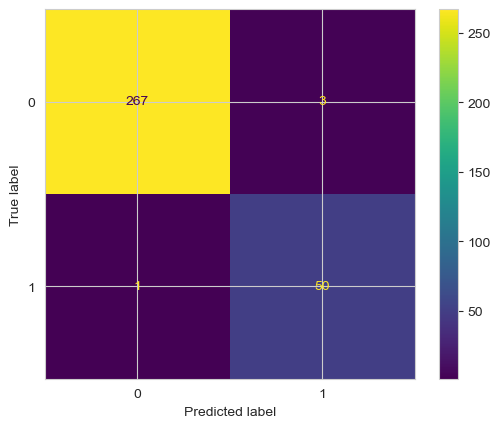

In [38]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

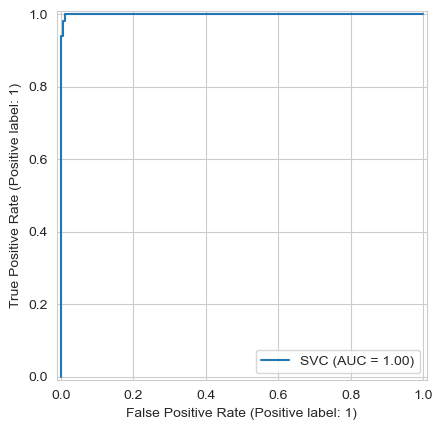

In [39]:
metrics.RocCurveDisplay.from_estimator(svm_best, X_test, y_test)